<a href="https://colab.research.google.com/github/EvgeniaKantor/MeNow/blob/main/Withania_somnifera.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Common information about extracted data

In [ ]:
import pandas as pd

df = pd.read_csv('pubmed_results_for_Withania somnifera.csv')
df.head()

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Gene Symbols
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania somnifera., dep...",United Arab Emirates,NaN
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021 Nov,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,NaN
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023 Mar 24,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania somnifera, anti-inflamma...",Switzerland,NaN
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015 Dec,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's disease, Anti-arthritic, Anti-bact...",Switzerland,NaN
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Disease/drug therapy/pathology, Huma...",Japan,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1410 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Name                 1410 non-null   object 
 1   PubMed ID            1410 non-null   int64  
 2   Link                 1410 non-null   object 
 3   Type Publication     1410 non-null   object 
 4   Journal Title        1409 non-null   object 
 5   Date of Publication  1410 non-null   object 
 6   Title                1410 non-null   object 
 7   Abstract             1380 non-null   object 
 8   Keywords             1357 non-null   object 
 9   Place Publication    1410 non-null   object 
 10  Gene Symbols         0 non-null      float64
dtypes: float64(1), int64(1), object(9)
memory usage: 121.3+ KB


I have three columns with empty values: "Journal Title" (1), "Abstract" (30), "Keywords" (53)

# Finding duplicates

In [ ]:
# Check for duplicates in the 'Title' column
duplicate_titles = df[df.duplicated(subset=['Title'], keep=False)]

# Display duplicate titles
if not duplicate_titles.empty:
    print("Duplicate Titles:")
    print(duplicate_titles)
else:
    print("No duplicate titles found.")

Duplicate Titles:
                   Name  PubMed ID                                      Link  \
348  Withania somnifera   27697094  https://pubmed.ncbi.nlm.nih.gov/27697094   
384  Withania somnifera   28825556  https://pubmed.ncbi.nlm.nih.gov/28825556   

                      Type Publication                  Journal Title  \
348  Journal Article, Validation Study  Journal of AOAC International   
384                    Journal Article  Journal of AOAC International   

    Date of Publication                                              Title  \
348          2016 Nov 1  Determination of Withanolides in Withania somn...   
384          2017 Jan 1  Determination of Withanolides in Withania somn...   

                                              Abstract  \
348  An LC method was developed and validated in 20...   
384                                                NaN   

                                              Keywords Place Publication  \
348  Chromatography, Liquid, Labora

I have duplicates, but I'll delete this duplicate after (it has both empty cells in "Keywords" and "Abstract")

# Extracting years

In [ ]:
# Function to extract the first four characters and convert to year
def extract_year(date_str):
    try:
        year_str = date_str[:4]  # Extract first four characters for the year
        year = int(year_str)  # Convert to integer
        return year  # Return integer year
    except (ValueError, TypeError):
        return None  # Return None if extraction fails

# Apply the function to the 'Date of Publication' column if it contains datetime objects
df['Date of Publication'] = df['Date of Publication'].apply(extract_year)

# Dropping empty column "Gene Symbols"

In [ ]:
df.drop(columns=['Gene Symbols'], inplace=True)

# Handling empty value in the column "Journal Title"

In [ ]:
# Filter rows where 'Journal Title' column is empty
empty_title_rows = df[df['Journal Title'].isnull()]

# Print the rows with empty 'Journal Title'
empty_title_rows

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication
580,Withania somnifera,30000965,https://pubmed.ncbi.nlm.nih.gov/30000965,"Review, Book Chapter",NaN,2006,Withania.,Withania (Withania somnifera) roots and berrie...,"Ashwagandha, Ajagandha, Withania, Indian ginse...",Bethesda (MD)


In [ ]:
# If there are empty strings in 'Title', replace them as well
df['Journal Title'] = df['Journal Title'].fillna("Drugs and Lactation Database (LactMed®) [Internet]")

In [ ]:
df.head()

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania somnifera., dep...",United Arab Emirates
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania somnifera, anti-inflamma...",Switzerland
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's disease, Anti-arthritic, Anti-bact...",Switzerland
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Disease/drug therapy/pathology, Huma...",Japan


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1410 entries, 0 to 1409
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Name                 1410 non-null   object
 1   PubMed ID            1410 non-null   int64 
 2   Link                 1410 non-null   object
 3   Type Publication     1410 non-null   object
 4   Journal Title        1410 non-null   object
 5   Date of Publication  1410 non-null   int64 
 6   Title                1410 non-null   object
 7   Abstract             1380 non-null   object
 8   Keywords             1357 non-null   object
 9   Place Publication    1410 non-null   object
dtypes: int64(2), object(8)
memory usage: 110.3+ KB


# Type Publications Analysis

In [ ]:
unique_values = df['Type Publication'].unique()
print("Unique values in 'Type Publication' column:")
for value in unique_values:
    print(value)

Unique values in 'Type Publication' column:
Journal Article, Review
Journal Article, Research Support, Non-U.S. Gov't, Review
Journal Article, Research Support, U.S. Gov't, P.H.S., Review, Systematic Review
Journal Article, Randomized Controlled Trial
Journal Article, Randomized Controlled Trial, Research Support, Non-U.S. Gov't
Journal Article
Journal Article, Research Support, Non-U.S. Gov't
Editorial
Journal Article, Research Support, Non-U.S. Gov't, Review, Systematic Review
Journal Article, Research Support, N.I.H., Extramural, Review
Journal Article, Systematic Review
Journal Article, Review, Systematic Review
Journal Article, Research Support, N.I.H., Extramural, Research Support, U.S. Gov't, Non-P.H.S.
Journal Article, Randomized Controlled Trial, Veterinary
News
Case Reports
Clinical Trial, Journal Article, Research Support, Non-U.S. Gov't
Journal Article, Research Support, N.I.H., Extramural, Research Support, Non-U.S. Gov't
Comparative Study, Journal Article
Letter
Published

In [ ]:
# Filter rows containing 'Retraction of Publication' or 'Retracted Publication'
retraction_rows = df[df['Type Publication'].str.contains('Retraction of Publication|Retracted Publication|Journal Article, Research Support, Non-U.S. Gov\'t, Retracted Publication', case=False, na=False)]

# Print the filtered rows
print("\nRows with 'Retraction of Publication' and 'Retracted Publication':")
retraction_rows


Rows with 'Retraction of Publication' and 'Retracted Publication':


,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication
323,Withania somnifera,11536383,https://pubmed.ncbi.nlm.nih.gov/11536383,"Journal Article, Retracted Publication",Phytotherapy research : PTR,2001,Nootropic-like effect of ashwagandha (Withania...,Ashwagandha (Withania somnifera L.) root extra...,"Animals, Anti-Inflammatory Agents, Non-Steroid...",England
337,Withania somnifera,18814186,https://pubmed.ncbi.nlm.nih.gov/18814186,Retraction of Publication,Phytotherapy research : PTR,2008,Retraction. Nootropic-like effect of ashwagand...,NaN,NaN,England
849,Withania somnifera,36440367,https://pubmed.ncbi.nlm.nih.gov/36440367,"Journal Article, Retracted Publication",BioMed research international,2022,Phyto-Extract-Mediated Synthesis of Silver Nan...,BACKGROUND: Nanotechnology finds broad applica...,"Silver/pharmacology, *Metal Nanoparticles, Mic...",United States
1052,Withania somnifera,25503327,https://pubmed.ncbi.nlm.nih.gov/25503327,"Journal Article, Research Support, Non-U.S. Go...",Environmental geochemistry and health,2015,Estimation of Anticipated Performance Index an...,Mitigating industrial air pollution is a big c...,"Air Pollutants/*toxicity, Air Pollution/*analy...",Netherlands
1176,Withania somnifera,22479585,https://pubmed.ncbi.nlm.nih.gov/22479585,"Journal Article, Research Support, Non-U.S. Go...",PloS one,2012,Bak compensated for Bax in p53-null cells to r...,The goal of cancer chemotherapy to induce mult...,"Animals, Antineoplastic Agents/pharmacology, *...",United States
1394,Withania somnifera,33439877,https://pubmed.ncbi.nlm.nih.gov/33439877,"Journal Article, Retracted Publication",PloS one,2021,Ethnomedicinal and folklore inventory of wild ...,The current study describes ethnobotanical (EB...,"Adult, Aged, Aged, 80 and over, Disease, Femal...",United States


In [ ]:
# Function to standardize 'Type Publication' values
def standardize_publication_type(type_str):
    if 'Retracted Publication' in type_str or 'Retraction of Publication' in type_str:
        return 'Retracted Publication'
    elif 'Journal Article' in type_str:
        return 'Journal Article'
    elif 'Editorial' in type_str:
        return 'Editorial'
    elif 'News' in type_str:
        return 'News'
    elif 'Case Reports' in type_str:
        return 'Case Reports'
    elif 'Letter' in type_str:
        return 'Letter'
    elif 'Published Erratum' in type_str:
        return 'Published Erratum'
    elif 'Review' in type_str:
        return 'Review'
    elif 'Preprint' in type_str:
        return 'Preprint'


# Apply the function to standardize the 'Type Publication' column
df['Type Publication Standardized'] = df['Type Publication'].apply(standardize_publication_type)

# Display the results
df[['Type Publication', 'Type Publication Standardized']]

,Type Publication,Type Publication Standardized
0,"Journal Article, Review",Journal Article
1,"Journal Article, Review",Journal Article
2,"Journal Article, Review",Journal Article
3,"Journal Article, Research Support, Non-U.S. Go...",Journal Article
4,"Journal Article, Research Support, Non-U.S. Go...",Journal Article
...,...,...
1405,Preprint,Preprint
1406,"Journal Article, Meta-Analysis, Research Suppo...",Journal Article
1407,"Journal Article, Research Support, Non-U.S. Go...",Journal Article
1408,"Journal Article, Review",Journal Article


In [ ]:
unique_values = df['Type Publication Standardized'].unique()
print("Unique values in 'Type Publication Standardized' column:")
for value in unique_values:
    print(value)

Unique values in 'Type Publication Standardized' column:
Journal Article
Editorial
News
Case Reports
Letter
Published Erratum
Retracted Publication
Review
Preprint


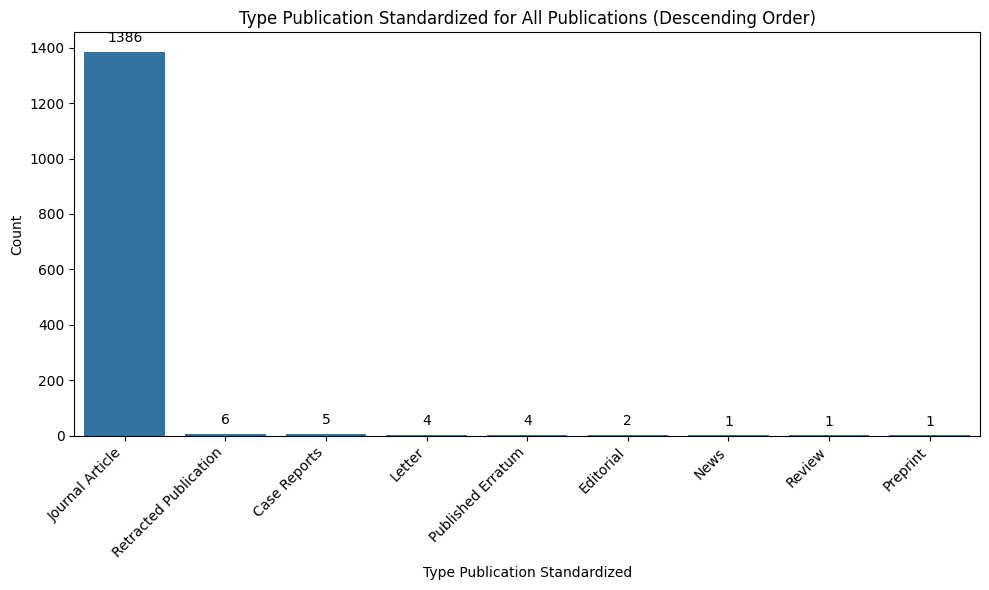

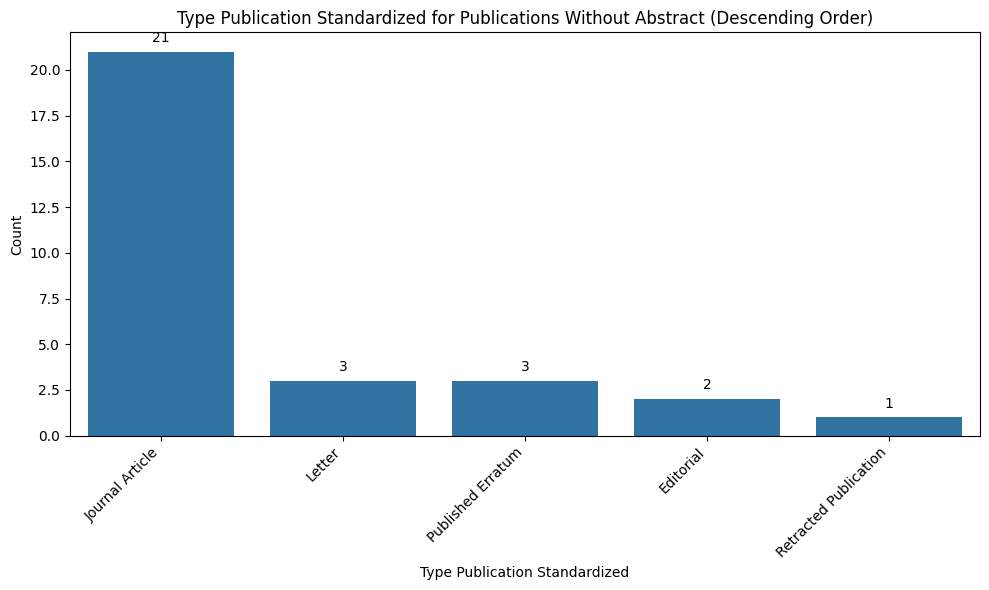

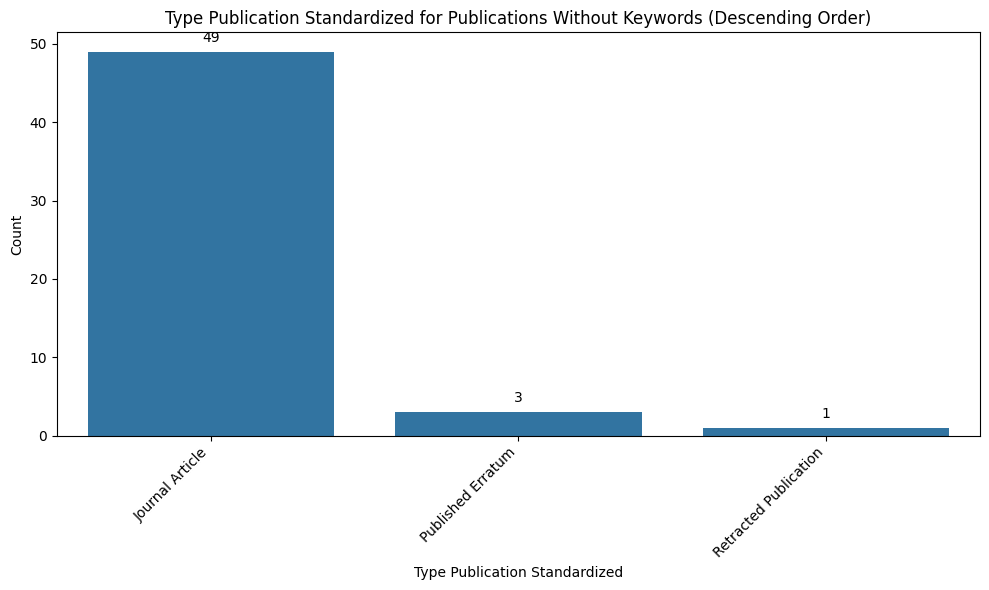

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to add count labels on bars
def add_counts(ax, counts):
    for p, count in zip(ax.patches, counts):
        ax.annotate(f'{count}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Calculate value counts for all articles
all_counts = df['Type Publication Standardized'].value_counts().sort_values(ascending=False)

# Plot for all articles
plt.figure(figsize=(10, 6))
ax_all = sns.countplot(data=df, x='Type Publication Standardized', order=all_counts.index)
add_counts(ax_all, all_counts)
plt.title('Type Publication Standardized for All Publications (Descending Order)')
plt.xlabel('Type Publication Standardized')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Calculate value counts for articles without Abstract
no_abstract_counts = df[df['Abstract'].isnull()]['Type Publication Standardized'].value_counts().sort_values(ascending=False)

# Plot for articles without Abstract
plt.figure(figsize=(10, 6))
ax_no_abstract = sns.countplot(data=df[df['Abstract'].isnull()], x='Type Publication Standardized', order=no_abstract_counts.index)
add_counts(ax_no_abstract, no_abstract_counts)
plt.title('Type Publication Standardized for Publications Without Abstract (Descending Order)')
plt.xlabel('Type Publication Standardized')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Calculate value counts for articles without Keywords
no_keywords_counts = df[df['Keywords'].isnull()]['Type Publication Standardized'].value_counts().sort_values(ascending=False)

# Plot for articles without Keywords
plt.figure(figsize=(10, 6))
ax_no_keywords = sns.countplot(data=df[df['Keywords'].isnull()], x='Type Publication Standardized', order=no_keywords_counts.index)
add_counts(ax_no_keywords, no_keywords_counts)
plt.title('Type Publication Standardized for Publications Without Keywords (Descending Order)')
plt.xlabel('Type Publication Standardized')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

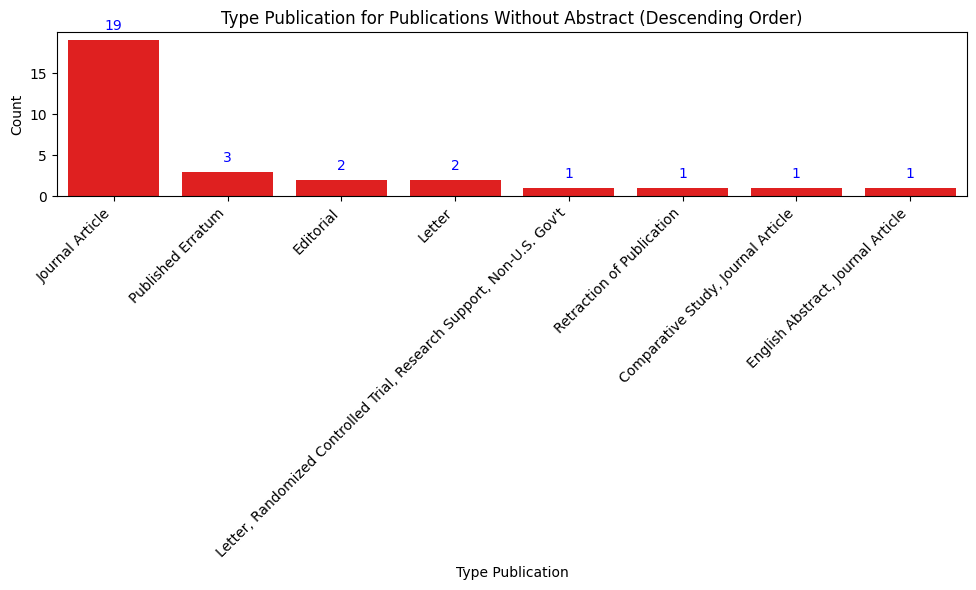

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to add count labels on bars with a specified color
def add_counts(ax, counts, color='red'):
    for p, count in zip(ax.patches, counts):
        ax.annotate(f'{count}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points', color=color)

# Calculate value counts for articles without Abstract
no_abstract_counts = df[df['Abstract'].isnull()]['Type Publication'].value_counts().sort_values(ascending=False)

# Plot for articles without Abstract
plt.figure(figsize=(10, 6))
ax_no_abstract = sns.countplot(data=df[df['Abstract'].isnull()], x='Type Publication', legend=False, order=no_abstract_counts.index, color = 'red') # Change palette here
add_counts(ax_no_abstract, no_abstract_counts, color='blue')  # Change color here if needed
plt.title('Type Publication for Publications Without Abstract (Descending Order)')
plt.xlabel('Type Publication')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


# Deleting Retracted Publication

In [ ]:
# Filter rows where 'Type Publication' contains 'Retracted Publication'
retracted_publications = df[df['Type Publication Standardized'].str.contains('Retracted Publication')]

# Display the filtered rows
retracted_publications

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized
323,Withania somnifera,11536383,https://pubmed.ncbi.nlm.nih.gov/11536383,"Journal Article, Retracted Publication",Phytotherapy research : PTR,2001,Nootropic-like effect of ashwagandha (Withania...,Ashwagandha (Withania somnifera L.) root extra...,"Animals, Anti-Inflammatory Agents, Non-Steroid...",England,Retracted Publication
337,Withania somnifera,18814186,https://pubmed.ncbi.nlm.nih.gov/18814186,Retraction of Publication,Phytotherapy research : PTR,2008,Retraction. Nootropic-like effect of ashwagand...,NaN,NaN,England,Retracted Publication
849,Withania somnifera,36440367,https://pubmed.ncbi.nlm.nih.gov/36440367,"Journal Article, Retracted Publication",BioMed research international,2022,Phyto-Extract-Mediated Synthesis of Silver Nan...,BACKGROUND: Nanotechnology finds broad applica...,"Silver/pharmacology, *Metal Nanoparticles, Mic...",United States,Retracted Publication
1052,Withania somnifera,25503327,https://pubmed.ncbi.nlm.nih.gov/25503327,"Journal Article, Research Support, Non-U.S. Go...",Environmental geochemistry and health,2015,Estimation of Anticipated Performance Index an...,Mitigating industrial air pollution is a big c...,"Air Pollutants/*toxicity, Air Pollution/*analy...",Netherlands,Retracted Publication
1176,Withania somnifera,22479585,https://pubmed.ncbi.nlm.nih.gov/22479585,"Journal Article, Research Support, Non-U.S. Go...",PloS one,2012,Bak compensated for Bax in p53-null cells to r...,The goal of cancer chemotherapy to induce mult...,"Animals, Antineoplastic Agents/pharmacology, *...",United States,Retracted Publication
1394,Withania somnifera,33439877,https://pubmed.ncbi.nlm.nih.gov/33439877,"Journal Article, Retracted Publication",PloS one,2021,Ethnomedicinal and folklore inventory of wild ...,The current study describes ethnobotanical (EB...,"Adult, Aged, Aged, 80 and over, Disease, Femal...",United States,Retracted Publication


In [ ]:
# Filter rows where 'Type Publication' contains 'Retracted Publication'
retracted_publications_index = df[df['Type Publication Standardized'].str.contains('Retracted Publication')].index

# Drop the filtered rows from the DataFrame
df.drop(index=retracted_publications_index, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1404 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1404 non-null   object
 1   PubMed ID                      1404 non-null   int64 
 2   Link                           1404 non-null   object
 3   Type Publication               1404 non-null   object
 4   Journal Title                  1404 non-null   object
 5   Date of Publication            1404 non-null   int64 
 6   Title                          1404 non-null   object
 7   Abstract                       1375 non-null   object
 8   Keywords                       1352 non-null   object
 9   Place Publication              1404 non-null   object
 10  Type Publication Standardized  1404 non-null   object
dtypes: int64(2), object(9)
memory usage: 131.6+ KB


# Filling empty values into the column "Abstract"

In [ ]:
# Filter rows where Abstract column is empty
empty_abstract_df = df[df['Abstract'].isnull()]

# Display the empty abstracts
empty_abstract_df[['Title', 'Link', 'Type Publication', 'Abstract', 'Keywords']]

,Title,Link,Type Publication,Abstract,Keywords
12,Withania somnifera as a potential future drug ...,https://pubmed.ncbi.nlm.nih.gov/33269342,Editorial,NaN,"SARS-CoV-2, Withania somnifera, acute respirat..."
16,Monograph. Withania somnifera.,https://pubmed.ncbi.nlm.nih.gov/15253680,Journal Article,NaN,"Anxiety/drug therapy, Depression/drug therapy,..."
45,Editorial: Investigating the molecular targets...,https://pubmed.ncbi.nlm.nih.gov/37201022,Editorial,NaN,"Withania somnifera (Ashwagandha), anti-cancer ..."
100,Withania somnifera: a pre-clinical study on ne...,https://pubmed.ncbi.nlm.nih.gov/25883607,Journal Article,NaN,NaN
129,Withania somnifera and its emerging anti-neopl...,https://pubmed.ncbi.nlm.nih.gov/23224341,Letter,NaN,"Antineoplastic Agents/*pharmacology, Cell Prol..."
142,Correction to: Indian ginseng (Withania somnif...,https://pubmed.ncbi.nlm.nih.gov/37261633,Published Erratum,NaN,NaN
198,The occurrence of isopelletierine in Withania ...,https://pubmed.ncbi.nlm.nih.gov/14032282,Journal Article,NaN,*ALKALOIDS
257,Pharmacological studies on leaves of Withania ...,https://pubmed.ncbi.nlm.nih.gov/3703993,Journal Article,NaN,"Animals, Anti-Inflammatory Agents, Carbon Tetr..."
270,Effects of Withania somnifera in patients of s...,https://pubmed.ncbi.nlm.nih.gov/24014929,"Letter, Randomized Controlled Trial, Research ...",NaN,"Blood Glucose/analysis, Cholesterol, HDL/blood..."
296,Chemical studies of the leaves of Withania som...,https://pubmed.ncbi.nlm.nih.gov/13885950,Journal Article,NaN,"*PLANTS, MEDICINAL"


In [ ]:
# Filter out rows where both "Abstract" and "Keywords" are empty
df = df.dropna(subset=['Abstract', 'Keywords'], how='all')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1399 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1375 non-null   object
 8   Keywords                       1352 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
dtypes: int64(2), object(9)
memory usage: 131.2+ KB


In [ ]:
# Fill empty cells in the "Abstract" column with values from the "Title" column using .loc
df.loc[df['Abstract'].isna(), 'Abstract'] = df['Title']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1399 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1352 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
dtypes: int64(2), object(9)
memory usage: 163.4+ KB


# Filling empty values into the column "Keywords"

In [ ]:
# Filter rows where Abstract column is empty
empty_abstract_df = df[df['Keywords'].isnull()]

# Display the empty abstracts
empty_abstract_df[['Title', 'Link', 'Type Publication', 'Abstract', 'Keywords', 'Date of Publication']]

,Title,Link,Type Publication,Abstract,Keywords,Date of Publication
59,Withania somnifera-derived carbon dots protect...,https://pubmed.ncbi.nlm.nih.gov/36866265,Journal Article,Solar radiation comprising UVA and UVB regions...,NaN,2023
88,Recent Advancements in Extraction Techniques o...,https://pubmed.ncbi.nlm.nih.gov/37970011,"Journal Article, Review","Ashwagandha, also known as Withania somnifera ...",NaN,2023
154,Chlorinated Withanolides from Withania somnifera.,https://pubmed.ncbi.nlm.nih.gov/22125584,Journal Article,"A chlorinated withanolide, 6alpha-chloro-5beta...",NaN,2011
191,"Corrigendum to ""Effects of Withania somnifera ...",https://pubmed.ncbi.nlm.nih.gov/31871942,"Journal Article, Published Erratum",[This corrects the article DOI: 10.1155/2018/4...,NaN,2019
244,Evaluation of Antidiarrheal Activity of 80% Me...,https://pubmed.ncbi.nlm.nih.gov/35586684,Journal Article,BACKGROUND: Withaniasomnifera is an important ...,NaN,2022
325,"Cloning, expression and characterization of l-...",https://pubmed.ncbi.nlm.nih.gov/22558532,Journal Article,l-Asparaginase (E.C. 3.5.1.1) is used as a the...,NaN,2011
372,Withanolide composition and in vitro culture o...,https://pubmed.ncbi.nlm.nih.gov/17252448,Journal Article,From Italian plants of Withania somnifera six ...,NaN,1996
405,Biological Activities of Four Adaptogenic Plan...,https://pubmed.ncbi.nlm.nih.gov/30405739,Journal Article,Rotifers have been widely used as well-charact...,NaN,2018
407,Clinical Evaluation of the Spermatogenic Activ...,https://pubmed.ncbi.nlm.nih.gov/24371462,Journal Article,Ashwagandha (Withania somnifera) has been desc...,NaN,2013
456,Withanolide production by root cultures of Wit...,https://pubmed.ncbi.nlm.nih.gov/17252504,Journal Article,Transformed root cultures of Withania somnifer...,NaN,1996


In [ ]:
# Filter rows where 'Type Publication' contains 'Erratum' or 'erratum'
erratum_rows = df[df['Type Publication'].str.contains('Erratum', case=False, na=False)]

# Print the filtered rows
erratum_rows

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized
191,Withania somnifera,31871942,https://pubmed.ncbi.nlm.nih.gov/31871942,"Journal Article, Published Erratum",BioMed research international,2019,"Corrigendum to ""Effects of Withania somnifera ...",[This corrects the article DOI: 10.1155/2018/4...,NaN,United States,Journal Article
361,Withania somnifera,35433723,https://pubmed.ncbi.nlm.nih.gov/35433723,Published Erratum,Frontiers in medicine,2022,"Corrigendum: Randomized, Double Blind, Placebo...",[This corrects the article DOI: 10.3389/fmed.2...,"Ashwagandha, Ayurveda, COVID-19, Withania somn...",Switzerland,Published Erratum


In [ ]:
# Filter rows where 'Title' matches the given title exactly
specific_title_rows = df[df['Title'].str.contains('Effects of Withania somnifera on Reproductive System: A Systematic Review of the Available Evidence', case=False, na=False)]

# Print the filtered rows
specific_title_rows

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized
53,Withania somnifera,29670898,https://pubmed.ncbi.nlm.nih.gov/29670898,"Journal Article, Review, Systematic Review",BioMed research international,2018,Effects of Withania somnifera on Reproductive ...,INTRODUCTION: Withania somnifera (WS) also kno...,"Animals, Genitalia/*drug effects, Humans, Oxid...",United States,Journal Article
191,Withania somnifera,31871942,https://pubmed.ncbi.nlm.nih.gov/31871942,"Journal Article, Published Erratum",BioMed research international,2019,"Corrigendum to ""Effects of Withania somnifera ...",[This corrects the article DOI: 10.1155/2018/4...,NaN,United States,Journal Article


In [ ]:
# Find the keywords from the PubMed ID 29670898
keywords_to_copy = df.loc[df['PubMed ID'] == 29670898, 'Keywords'].values[0]

# Copy the keywords to the row with PubMed ID 31871942
df.loc[df['PubMed ID'] == 31871942, 'Keywords'] = keywords_to_copy

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1399 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1353 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
dtypes: int64(2), object(9)
memory usage: 163.4+ KB


In [ ]:
import pandas as pd
import google.generativeai as genai
from google.colab import userdata
import os
import time

# Retrieve and set the API key
GOOGLE_API_KEY = userdata.get('gemini_key')
os.environ['GOOGLE_API_KEY'] = GOOGLE_API_KEY

# Configure the generative AI client
genai.configure(api_key=GOOGLE_API_KEY)

# Load the generative model
model = genai.GenerativeModel('gemini-pro')

# Function to generate keywords from an abstract, with retries on 429 errors
def get_keywords_from_gemini(abstract):
    query = f"Extract keywords (but no more than 10 keywords or keyword phrases, written in a line separated by commas) from the following abstract:\n{abstract}"
    retries = 10  # Number of retries
    delay = 5  # Initial delay in seconds

    while retries > 0:
        try:
            response = model.generate_content(query)
            if response and response.candidates:
                response_content = response.candidates[0].content.parts[0].text.strip()
                return response_content
            else:
                print(f"No content found for {abstract}")
                return None
        except IndexError:
            print(f"Failed to generate keywords for {abstract}: list index out of range")
            return None
        except genai.GenerativeServiceException as e:
            if "429" in str(e):  # Check if the error message contains 429
                print(f"Rate limit exceeded. Retrying in {delay} seconds...")
                time.sleep(delay)
                retries -= 1
                delay *= 2  # Exponential backoff
            else:
                print(f"Failed to generate keywords for {abstract}: {e}")
                return None
        except Exception as e:
            print(f"Failed to generate keywords for {abstract}: {e}")
            return None

    print(f"Maximum retries reached for {abstract}. Unable to generate keywords.")
    return None

# List of plant names to check for in Keywords column
plant_names = ['withania', 'somnifera', 'withania somnifera', 'withaniasomnifera', 'ashwagandha', 'winter cherry', 'w somnifera', 'withania somnifera l', 'withania somnifera (l)', 'ws', 'w', 'l']

# Function to check if Keywords column contains only plant names or is empty
def is_only_plant_name_or_empty(keywords):
    if pd.isna(keywords):
        return True
    # Check if all words in keywords are in plant_names
    keyword_list = [kw.strip().lower() for kw in keywords.split(',')]
    return all(kw in plant_names for kw in keyword_list)


# Fill empty Keywords or Keywords containing only plant names with information from Abstract using Gemini API
for index, row in df.iterrows():
    if is_only_plant_name_or_empty(row['Keywords']) and not pd.isna(row['Abstract']):
        try:
            keywords = get_keywords_from_gemini(row['Abstract'])
            if keywords:
                df.at[index, 'Keywords'] = keywords
                print(f"Generated keywords for index {index}: {keywords}")
        except Exception as e:
            print(f"Failed to generate keywords for index {index}: {e}")

Failed to generate keywords for A chlorinated withanolide, 6alpha-chloro-5beta,17alpha-dihydroxywithaferin A (1), and nine known withanolides, 6alpha-chloro-5beta-hydroxywithaferin A (2), (22R)-5beta-formyl-6beta,27-dihydroxy-1-oxo-4-norwith-24-enolide, withaferin A, 2,3-dihydrowithaferin A, 3-methoxy-2,3-dihydrowithaferin A, 2,3-didehydrosomnifericin, withanone, withanoside IV and withanoside X, were isolated from Withania somnifera (Solanaceae). All structures were elucidated on the basis of spectroscopic methods (IR, HRESIMS, 1D/2D NMR). X-ray crystallography confirmed the absolute configuration of 1.: list index out of range
Generated keywords for index 407: Ashwagandha, oligospermia, spermatogenic activity, sperm count, semen volume, sperm motility, male infertility, Ayurvedic medicine, Withania somnifera, placebo-controlled trial
Generated keywords for index 796: Inflammation, Anti-inflammatory drugs, Unani medicine, Cinnamomum zeylanicum, Alpinia galanga, Withania somnifera, RAW

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1399 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1397 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
dtypes: int64(2), object(9)
memory usage: 163.4+ KB


In [ ]:
# Filter rows where 'Keywords' column is empty
empty_keywords_rows = df[df['Keywords'].isnull()]

# Print the rows with empty 'Keywords'
empty_keywords_rows

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized
154,Withania somnifera,22125584,https://pubmed.ncbi.nlm.nih.gov/22125584,Journal Article,Phytochemistry letters,2011,Chlorinated Withanolides from Withania somnifera.,"A chlorinated withanolide, 6alpha-chloro-5beta...",NaN,Netherlands,Journal Article
1093,Withania somnifera,20953426,https://pubmed.ncbi.nlm.nih.gov/20953426,Journal Article,Evidence-based complementary and alternative m...,2011,Evaluation of the Anxiolytic Activity of NR-AN...,The present study investigates the anxiolytic ...,NaN,United States,Journal Article


In [ ]:
# Define the PubMed IDs and the corresponding keywords to fill
keywords_to_fill = {
    22125584: ("6alpha-chloro-5beta, 17alpha-dihydroxywithaferin A, known withanolides, Chlorinated Withanolides, withaferin A, 2,3-dihydrowithaferin A, 3-methoxy-2,3-dihydrowithaferin A, withanone, withanoside IV, X-ray crystallography"),
    # 24371462: ("Ashwagandha (Withania somnifera), Ayurvedic medicine, male sexual dysfunction, infertility, spermatogenic activity, oligospermic patients, sperm count, semen parameters, serum hormone levels, therapeutic value")
    # 22556586: ("herbal vendors, medicinal plants, herbal products, herbal treatment, urino-genital disorders, dysuria, hematuria, syphilis, gonorrhea, traditional medicine"),
    20953426: ("anxiolytic activity, NR-ANX-C, polyherbal formulation, Withania somnifera, Ocimum sanctum, Camellia sinensis, Triphala, Shilajit, ethanol withdrawal, anxiety behavior")

}

# Fill the empty Keywords values for the specified PubMed IDs
for pubmed_id, keywords in keywords_to_fill.items():
    df.loc[(df['PubMed ID'] == pubmed_id) & (df['Keywords'].isnull()), 'Keywords'] = keywords

# Check if the filling was successful
print(df[df['PubMed ID'].isin(keywords_to_fill.keys())][['PubMed ID', 'Keywords']])

      PubMed ID                                           Keywords
154    22125584  6alpha-chloro-5beta, 17alpha-dihydroxywithafer...
1093   20953426  anxiolytic activity, NR-ANX-C, polyherbal form...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1399 entries, 0 to 1409
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1399 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
dtypes: int64(2), object(9)
memory usage: 163.4+ KB


In [ ]:
#save df

df.to_excel('df_keywords.xlsx', index=False)

# Cleaning column "Keywords"

In [ ]:
import re

# Define the clean_keywords function
def clean_keywords(keywords):
    if pd.isnull(keywords):
        return None

    # Remove unnecessary signs and characters
    keywords = re.sub(r'\d+\.\s*', '', keywords)  # Remove numbers followed by a dot and optional spaces
    keywords = re.sub(r'[\/*]', '', keywords)  # Remove * and /
    keywords = re.sub(r'\s*[,;]\s*', ', ', keywords)  # Replace commas and semicolons with a consistent format
    keywords = re.sub(r'\s+', ' ', keywords)  # Replace multiple spaces with a single space
    keywords = re.sub(r' - ', ', ', keywords)  # Replace ' - ' with ', '
    keywords = re.sub(r'- ', ', ', keywords)   # Replace '- ' with ', '
    keywords = re.sub(r' & ', ', ', keywords)   # Replace ' & ' with ', '
    keywords = re.sub(r'\.', '', keywords)     # Remove '.'

    # Capitalize each word in the keywords list
    keywords_list = [keyword.strip().title() for keyword in re.split(r',\s*', keywords) if keyword.strip()]

    # Join the cleaned and capitalized keywords back into a single string
    cleaned_keywords_str = ', '.join(keywords_list)

    # Correct the possessive "'S" or "' S" to be lowercase "'s"
    cleaned_keywords_str = re.sub(r"' S\b", "'s", cleaned_keywords_str)
    cleaned_keywords_str = re.sub(r"'S\b", "'s", cleaned_keywords_str)

    return cleaned_keywords_str if cleaned_keywords_str else None

# Apply the cleaning function to the 'Keywords' column
df.loc[:, 'Keywords'] = df['Keywords'].apply(clean_keywords)

# Print the updated DataFrame to verify the changes
df[['PubMed ID', 'Keywords']]

,PubMed ID,Keywords
0,34254920,"Anxiety, Ashwagandha, Withania Somnifera, Depr..."
1,34649336,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc..."
2,37111543,"Ashwagandha, Withania Somnifera, Anti-Inflamma..."
3,26306935,"Alzheimer's Disease, Anti-Arthritic, Anti-Bact..."
4,24882401,"Alzheimer Diseasedrug Therapypathology, Humans..."
...,...,...
1405,38260297,"Nutraceuticals, Network Meta-Analysis, Nutriti..."
1406,35378276,"Acceptability, Anxiety, Efficacy, Medicinal He..."
1407,20528765,"Animals, Brain Chemistrydrug Effects, Humans, ..."
1408,33248183,"3, 7, Dimethylether Quercetin (Pubchem Cid: 52..."


# Saving and Reading the file

In [ ]:
# Save DataFrame to Excel
df.to_excel('Withania_somnifera.xlsx', index=False)

In [ ]:
import pandas as pd

df = pd.read_excel('Withania_somnifera.xlsx')
df.head()

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1399 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
dtypes: int64(2), object(9)
memory usage: 120.4+ KB


# Analysis and Vizualization Journal Information and Dates

In [ ]:
journal_counts = df['Journal Title'].value_counts()
for name, journal in journal_counts.items(): # Iterate over the items of the Series
  print(f'{name}: {journal}')

unique_journals = sorted(df['Journal Title'].unique())
print(unique_journals)

Journal of ethnopharmacology: 72
PloS one: 42
Phytotherapy research : PTR: 40
Phytomedicine : international journal of phytotherapy and phytopharmacology: 28
Journal of biomolecular structure & dynamics: 24
Journal of Ayurveda and integrative medicine: 22
Indian journal of experimental biology: 20
Frontiers in pharmacology: 17
Natural product research: 16
Scientific reports: 15
Molecules (Basel, Switzerland): 15
Evidence-based complementary and alternative medicine : eCAM: 14
Protoplasma: 13
Nutrients: 12
Molecular biology reports: 12
Planta medica: 11
Pharmaceuticals (Basel, Switzerland): 11
Biomedicine & pharmacotherapy = Biomedecine & pharmacotherapie: 9
BioMed research international: 9
BMC complementary and alternative medicine: 9
Applied biochemistry and biotechnology: 9
Ancient science of life: 9
Phytochemistry: 9
Ayu: 8
Plant physiology and biochemistry : PPB: 8
Pakistan journal of pharmaceutical sciences: 8
Journal of natural products: 8
Cureus: 8
3 Biotech: 7
International imm

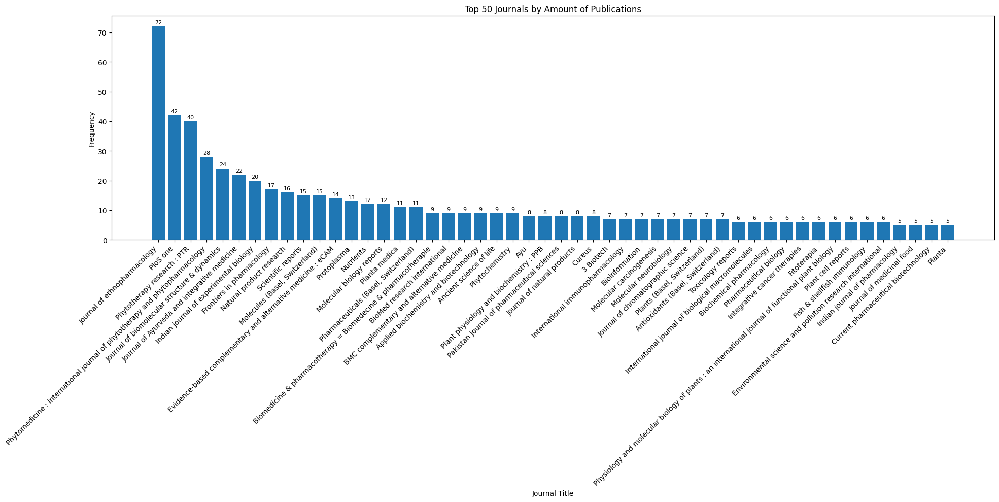

In [ ]:
import matplotlib.pyplot as plt

# Get the top 50 journals by frequency
top_journals = df['Journal Title'].value_counts().head(50)

# Plotting
plt.figure(figsize=(20, 10))
bars = plt.bar(top_journals.index, top_journals.values)

# Adding annotations
for bar, count in zip(bars, top_journals.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5, count,
             ha='center', va='bottom', fontsize=8)

plt.title('Top 50 Journals by Amount of Publications')
plt.xlabel('Journal Title')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objects as go

# Get the top 50 journals by frequency and sort them
top_journals = df['Journal Title'].value_counts().head(50).index

# Filter the DataFrame for top journals and group by Journal Title and Place Publication
journal_countries = df[df['Journal Title'].isin(top_journals)].groupby(['Journal Title', 'Place Publication']).size().unstack(fill_value=0)

# Sort journals by their total publication count
journal_countries['Total'] = journal_countries.sum(axis=1)
journal_countries = journal_countries.sort_values(by='Total', ascending=False)
journal_countries.drop(columns='Total', inplace=True)

# Initialize figure
fig = go.Figure()

# Add traces for each country
for country in journal_countries.columns:
    fig.add_trace(go.Bar(
        x=journal_countries.index,
        y=journal_countries[country],
        name=country,
        text=[f'{country}' for val in journal_countries[country]],  # Customize hover text
    ))

# Update layout
fig.update_layout(
    barmode='stack',
    title='Distribution of Top Journals by Country',
    xaxis=dict(title='Journal Title', tickangle=-45, automargin=True),
    yaxis=dict(title='Frequency'),
    legend=dict(title='Country', orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    hovermode='closest',
    template='plotly_white'
)

# Show the interactive plot
fig.show()

In [ ]:
# Group by Place Publication and count the number of publications
country_counts = df['Place Publication'].value_counts()

# Create a Pie chart using Plotly
fig = go.Figure(data=[go.Pie(labels=country_counts.index, values=country_counts.values)])

# Update layout
fig.update_layout(
    title='Distribution of Publications by Country',
    template='plotly_white'
)

# Show the interactive plot
fig.show()

In [ ]:
import plotly.graph_objects as go

# Calculate total publications per country
country_publications = df['Place Publication'].value_counts()

# Define data for the choropleth map
data = dict(
    type='choropleth',
    locations=country_publications.index,
    z=country_publications.values,
    locationmode='country names',
    text=country_publications.index,
    colorscale='Blues',
    colorbar=dict(title='Publications'),
)

# Define layout
layout = dict(
    title='Distribution of Publications by Country',
    geo=dict(
        showframe=False,
        projection=dict(type='natural earth')
    )
)

# Create the figure
fig = go.Figure(data=[data], layout=layout)

# Show the interactive map
fig.show()


In [ ]:
!pip install folium

In [ ]:
import pandas as pd
import folium
from geopy.geocoders import Nominatim
from folium.plugins import MarkerCluster

# Calculate total publications per country
country_publications = df['Place Publication'].value_counts()

# Initialize Folium map
m = folium.Map(location=[20, 0], zoom_start=2)

# Geocoder setup
geolocator = Nominatim(user_agent="publication_map")

# Add markers for each country with the number of publications as popup
marker_cluster = MarkerCluster().add_to(m)
for country, count in country_publications.items():
    try:
        location = geolocator.geocode(country)
        if location:
            folium.Marker(
                location=[location.latitude, location.longitude],
                popup=f"{country}: {count} publications",
                icon=None,
            ).add_to(marker_cluster)
    except Exception as e:
        print(f"Error geocoding {country}: {str(e)}")

# Display the map
m

In [ ]:
import plotly.express as px

# Assuming df is your DataFrame with columns 'Place Publication' and 'Date of Publication'
country_year_counts = df.groupby(['Place Publication', 'Date of Publication']).size().reset_index(name='Count')

# Plotting using Plotly
fig = px.scatter(country_year_counts, x='Date of Publication', y='Place Publication', size='Count', color='Place Publication',
                 title='Publications by Country and Year',
                 labels={'Date of Publication': 'Year', 'Place Publication': 'Country', 'Count': 'Number of Publications'},
                 hover_name='Place Publication', hover_data={'Count': True, 'Date of Publication': True})

# Update layout
fig.update_layout(
    yaxis=dict(categoryorder='total ascending'),  # Order countries by total publications
    hovermode='closest',
    template='plotly_white'
)

# Show plot
fig.show()

We can notice a growing interest in this plant in Switzerland in the last 5 years, as well as an increasing number of publications since 1996 (and especially in the last 10 years) in countries such as America, England, Netherlands, Germany, India, Ireland, UAE, France, Japan, Singapore. The Journal of ethnopharmacology (Ireland) is the most actively publishing journal. I am not familiar with these journals, but the publishing countries are credible in scientific fields (maybe except India, I think Ayurveda is not evidence-based medicine, but maybe the articles are of high quality, this requires a deeper analysis of the publications themselves).

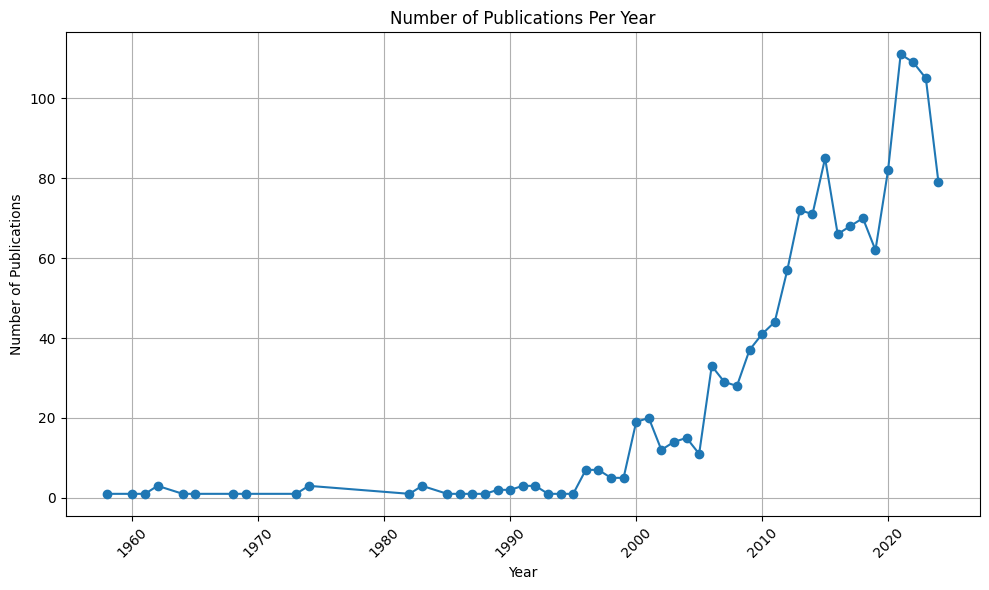

In [ ]:
import matplotlib.pyplot as plt

# Aggregate publication counts per year
publication_counts_per_year = df['Date of Publication'].value_counts().sort_index().reset_index()
publication_counts_per_year.columns = ['Year', 'Number of Publications']

# Plot using Matplotlib
plt.figure(figsize=(10, 6))
plt.plot(publication_counts_per_year['Year'], publication_counts_per_year['Number of Publications'], marker='o')

# Customize the plot
plt.title('Number of Publications Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Publications')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels if needed

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import plotly.express as px

# Aggregate publication counts per year
publication_counts_per_year = df['Date of Publication'].value_counts().sort_index().reset_index()
publication_counts_per_year.columns = ['Year', 'Number of Publications']

# Create a plot using Plotly
fig = px.line(publication_counts_per_year, x='Year', y='Number of Publications', title='Number of Publications Per Year', markers=True)

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Number of Publications',
    template='plotly_white'
)

# Show the plot
fig.show()

# Keywords Analysis

In [ ]:
from collections import Counter

# Count frequency of keywords
keyword_counts = Counter()
# Iterate through each cleaned keyword entry in the DataFrame
for keywords in df['Keywords']:
    if isinstance(keywords, str):
        # Split keywords by comma and space and update counter
        keyword_counts.update(keywords.split(', '))

# Display the most common keywords and their counts
print("Most common keywords:")
for keyword, count in keyword_counts.most_common(600):
    print(f"{keyword}: {count}")

Most common keywords:
Withania Somnifera: 352
Animals: 299
Mice: 206
Rats: 185
Humans: 180
Male: 163
Withaniachemistry: 162
Ashwagandha: 146
Plants: 130
Withanolides: 120
Withaferin A: 106
Phytotherapy: 105
Withania: 101
Female: 98
Plant Extractspharmacology: 92
Purificationpharmacology: 88
Control: 77
Medicine: 76
Plant Rootschemistry: 74
Cell Line: 71
Chromatography: 63
Ayurvedic: 56
Wistar: 56
Ergosterolanalogs: 56
Tumor: 54
Dose-Response Relationship: 52
Drug: 52
Stress: 48
Apoptosis: 48
Purification: 48
Animal: 47
Disease Models: 45
Oxidative Stress: 43
Medicinal: 42
Medicinalchemistry: 41
India: 40
Plant Roots: 39
Dosagepharmacologytherapeutic Use: 39
Antineoplastic Agents: 38
Apoptosisdrug Effects: 38
Ayurveda: 36
Plant Extractsadministration: 36
Cultured: 36
Gene Expression Regulation: 35
Withanolidespharmacology: 34
Development: 34
Lipid Peroxidationdrug Effects: 33
Inflammation: 32
Plant Extractstherapeutic Use: 32
Plant: 31
High Pressure Liquid: 30
Receptors: 29
Cell Prolife

In [ ]:
# Initialize a set to store unique keywords
unique_keywords = set()

# Iterate through each cleaned keyword entry in the DataFrame and add to set
for keywords in df['Keywords']:
    if isinstance(keywords, str):
        unique_keywords.update(keywords.split(', '))

# Count the total number of unique keywords
total_unique_keywords = len(unique_keywords)

print(f"Total unique keywords: {total_unique_keywords}")

Total unique keywords: 6150


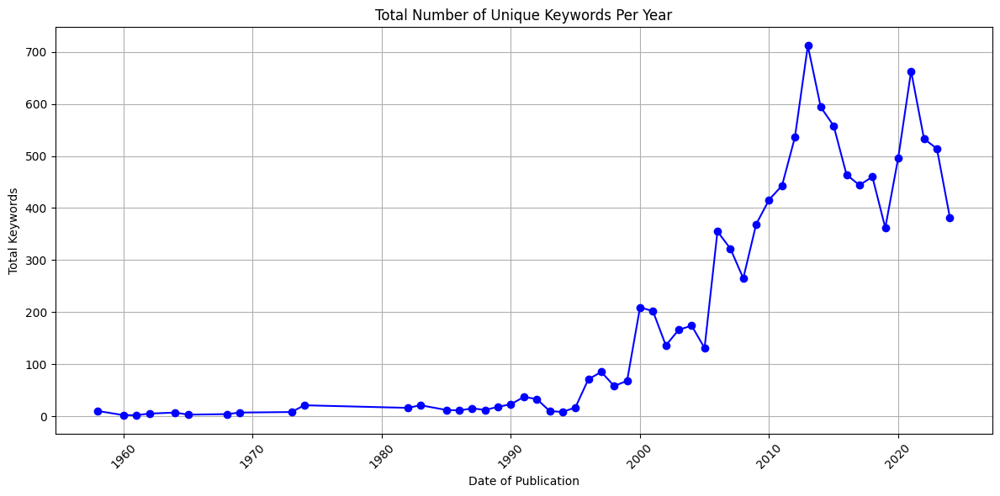

In [ ]:
import matplotlib.pyplot as plt

# Prepare data for plotting
total_keywords_df = df.groupby('Date of Publication')['Keywords'].apply(lambda x: len(set(', '.join(x.dropna()).split(', ')))).reset_index()
total_keywords_df.columns = ['Date of Publication', 'Total Keywords']

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(total_keywords_df['Date of Publication'], total_keywords_df['Total Keywords'], marker='o', linestyle='-', color='b')

# Add titles and labels
plt.title('Total Number of Unique Keywords Per Year')
plt.xlabel('Date of Publication')
plt.ylabel('Total Keywords')
plt.grid(True)

# Display the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

# Create the plot using plotly.express
fig = px.line(total_keywords_df, x='Date of Publication', y='Total Keywords', title='Total Number of Unique Keywords Per Year', markers=True)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Date of Publication',
    yaxis_title='Total Keywords',
    xaxis=dict(tickangle=45)
)

# Show the plot
fig.show()

In [ ]:
import plotly.express as px

# Aggregate publication counts per year and type
publication_counts_per_year_type = df.groupby(['Date of Publication', 'Type Publication']).size().reset_index(name='Number of Publications')

# Create a plot using Plotly
fig = px.line(
    publication_counts_per_year_type,
    x='Date of Publication',
    y='Number of Publications',
    color='Type Publication',
    title='Number of Publications Per Year by Type of Publication',
    markers=True
)

# Customize the layout
fig.update_layout(
    xaxis_title='Date of Publication',
    yaxis_title='Number of Publications',
    template='plotly_white'
)

# Show the plot
fig.show()

In [ ]:
# Function to split keywords and count unique ones
def count_unique_keywords(keywords_series):
    unique_keywords = set()
    for keywords in keywords_series.dropna():
        unique_keywords.update(keywords.split(', '))
    return len(unique_keywords)

# Group by Year and Type of Publication, then apply the unique keyword counting function
keywords_per_year_type = df.groupby(['Date of Publication', 'Type Publication'])['Keywords'].apply(count_unique_keywords).reset_index(name='Total Keywords')

# Create the plot using plotly.express
fig = px.line(keywords_per_year_type, x='Date of Publication', y='Total Keywords', color='Type Publication',
              title='Total Number of Unique Keywords Per Year For Each Type of Publications',
              labels={'Type Publication': 'Type of Publication', 'Total Keywords': 'Total Keywords'})

# Update layout for better readability
fig.update_layout(
    xaxis_title='Date of Publication',
    yaxis_title='Total Keywords',
    xaxis=dict(tickangle=45)
)

# Show the plot
fig.show()

In [ ]:
# Function to count total keywords
def count_total_keywords(keywords_series):
    total_keywords = 0
    for keywords in keywords_series.dropna():
        total_keywords += len(keywords.split(', '))
    return total_keywords

# Group by Year and Type of Publication, then apply the total keyword counting function
keywords_per_year_type = df.groupby(['Date of Publication', 'Type Publication'])['Keywords'].apply(count_total_keywords).reset_index(name='Total Keywords')

# Create the plot using plotly.express
fig = px.line(keywords_per_year_type, x='Date of Publication', y='Total Keywords', color='Type Publication',
              title='Total Number of All Keywords Per Year For Each Type of Publications',
              labels={'Type Publication': 'Type of Publication', 'Total Keywords': 'Total Keywords'})

# Update layout for better readability
fig.update_layout(
    xaxis_title='Date of Publication',
    yaxis_title='Total Keywords',
    xaxis=dict(tickangle=45)
)

# Show the plot
fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Filter DataFrame for all years
df_filtered = df[df['Date of Publication'] > 0]  # Ensure no non-positive years are included

# Group by 'Date of Publication' and 'Type Publication' and count the occurrences
grouped_df = df_filtered.groupby(['Date of Publication', 'Type Publication']).size().reset_index(name='Count')

# Pivot the table to have years as rows and types of publication as columns
pivot_df = grouped_df.pivot(index='Date of Publication', columns='Type Publication', values='Count').fillna(0)

# Reset index to convert the pivot table to a DataFrame suitable for Plotly
pivot_df = pivot_df.reset_index()

# Melt the DataFrame to long format for Plotly
melted_df = pivot_df.melt(id_vars='Date of Publication', var_name='Type Publication', value_name='Count')

# Plotting the data using Plotly
fig = px.bar(melted_df,
             x='Date of Publication',
             y='Count',
             color='Type Publication',
             title='Number of Publications Per Year by Type of Publication',
             labels={'Date of Publication': 'Year', 'Count': 'Number of Publications'},
             barmode='stack')

# Show the plot
fig.show()

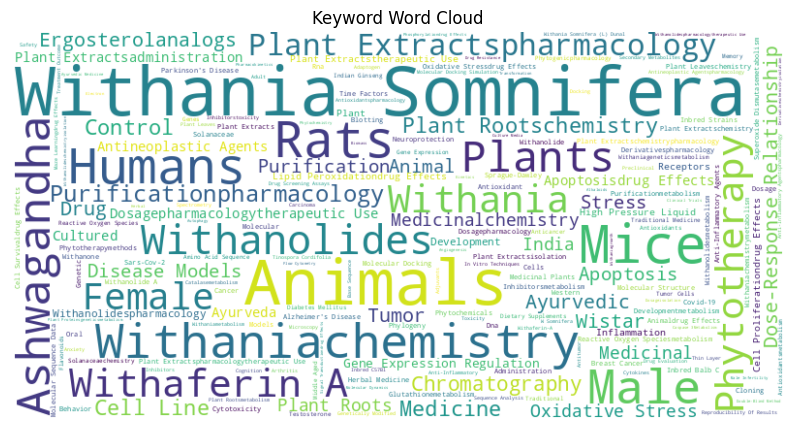

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(keyword_counts)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Keyword Word Cloud')
plt.show()

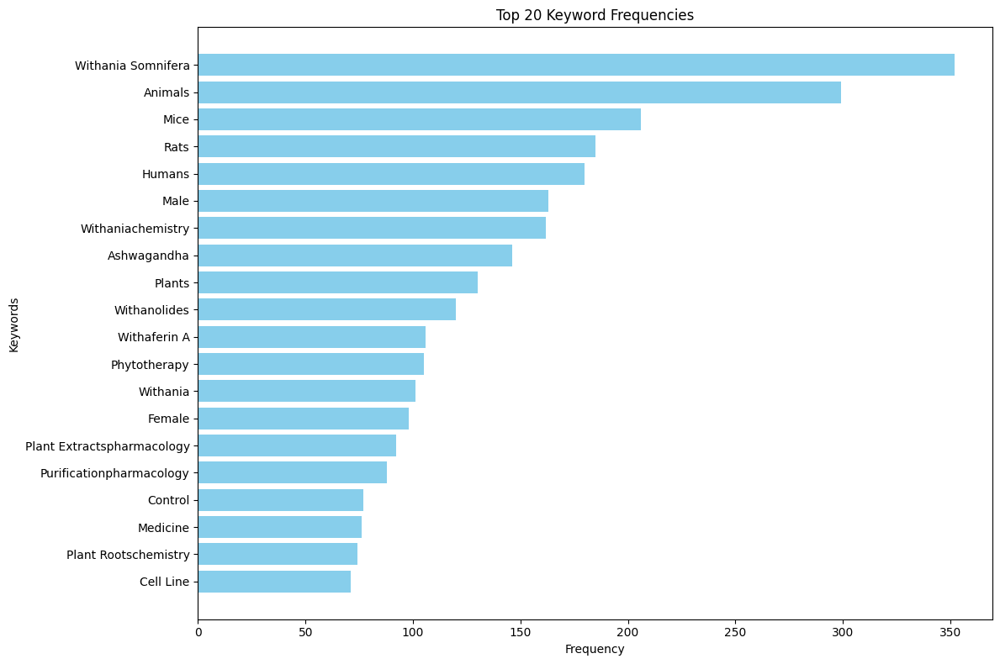

In [ ]:
# Extract keywords and their counts for plotting
keywords = list(keyword_counts.keys())
counts = list(keyword_counts.values())

# Sort keywords and counts for better visualization
sorted_indices = sorted(range(len(counts)), key=lambda k: counts[k], reverse=True)
keywords_sorted = [keywords[i] for i in sorted_indices]
counts_sorted = [counts[i] for i in sorted_indices]

# Limit to top 20 keywords
top_keywords = keywords_sorted[:20]
top_counts = counts_sorted[:20]

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(top_keywords, top_counts, color='skyblue')
plt.xlabel('Frequency')
plt.ylabel('Keywords')
plt.title('Top 20 Keyword Frequencies')
plt.gca().invert_yaxis()  # Invert y-axis to display most frequent at the top
plt.tight_layout()
plt.show()

# Manipulations with Keywords

## Creating 'Cleaned Keywords'

In [ ]:
import pandas as pd
from collections import Counter

# List of plant names to remove
plant_names = [
    'ashwagandha', 'withania somnifera', 'winter cherry',
    'indian ginseng', 'poison gooseberry', 'ajagandha', 'kanaje hindi',
    'amukkara', 'amukkirag', 'asgandh', 'asan', 'avarada', 'hirimaddhi',
    'sogade-beru', 'sundakkot', 'ushvagandha', 'vajigandha', 'vajigandhaka',
    'withania', 'angara', 'asana', 'asgandh nagori',
    'asuvargandha', 'nagori asgandh', 'somnifera', 'withaniasomnifera', 'withania somnifera l',
    'l', 'ws', 'w', 'indian ginseng/poison gooseberry', 'withania somnifera (l) dunal', 'w somnifera', 'ashwagandha (l) dunal', 'withaniachemistry', 'l dunal'
]

# Additional words to remove
words_to_remove = [
    'animals', 'animal', 'mice', 'mouse', 'rats', 'rat', 'humans', 'plants', 'plant', 'wistar', 'male', 'female', 'control'
]

# Combine both lists and remove duplicates
words_to_exclude = set(name.lower() for name in plant_names + words_to_remove) # + words_to_remove

# Function to check if a keyword is numeric
def is_numeric(s):
    try:
        float(s)
        return True
    except ValueError:
        return False

# Function to split and clean keywords
def split_and_clean_keywords(keywords):
    if isinstance(keywords, str):
        # Split by commas and strip whitespace
        keywords_list = keywords.lower().split(', ')
        # Further split by '&' and strip whitespace
        keywords_list = [sub_kw.strip() for kw in keywords_list for sub_kw in kw.split('&')]
        # Remove 'anti-' from keywords
        keywords_list = [kw.replace('anti-', '') for kw in keywords_list]
        # Replace hyphens with spaces
        keywords_list = [kw.replace('-', '') for kw in keywords_list]
        # Replace ( with spaces
        keywords_list = [kw.replace(' (', ', ') for kw in keywords_list]
        # Replace ) with spaces
        keywords_list = [kw.replace(')', '') for kw in keywords_list]
        # Replace ) with spaces
        keywords_list = [kw.replace(' and', ',') for kw in keywords_list]
        # Filter out words to exclude and numeric keywords
        filtered_keywords = [kw for kw in keywords_list if kw not in words_to_exclude and not is_numeric(kw) and kw]
        # Remove empty strings
        filtered_keywords = [kw for kw in filtered_keywords if kw]
        return ', '.join(filtered_keywords)
    return None

# Apply the cleaning function to the 'Keywords' column and create a new 'Cleaned Keywords' column
df['Cleaned Keywords'] = df['Keywords'].apply(split_and_clean_keywords)

# Remove empty values from 'Cleaned Keywords'
df['Cleaned Keywords'] = df['Cleaned Keywords'].replace('', None)

# Display the most common keywords and their counts
keyword_counts = Counter()
for keywords in df['Cleaned Keywords']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

print("Most common keywords:")
for keyword, count in keyword_counts.most_common(600):
    print(f"{keyword}: {count}")

# Find the amount of unique values
unique_keywords = set(keyword_counts.keys())
unique_keyword_count = len(unique_keywords)
print(f"Number of unique keywords: {unique_keyword_count}")


Most common keywords:
withanolides: 121
withaferin a: 110
phytotherapy: 105
plant extractspharmacology: 92
purificationpharmacology: 88
medicine: 76
plant rootschemistry: 74
cell line: 71
chromatography: 63
ayurvedic: 56
tumor: 56
ergosterolanalogs: 56
stress: 53
doseresponse relationship: 52
drug: 52
apoptosis: 48
purification: 48
disease models: 45
oxidative stress: 44
medicinal: 42
medicinalchemistry: 41
india: 40
plant roots: 39
dosagepharmacologytherapeutic use: 39
antineoplastic agents: 38
apoptosisdrug effects: 38
ayurveda: 36
plant extractsadministration: 36
cultured: 36
gene expression regulation: 35
inflammation: 34
withanolidespharmacology: 34
development: 34
lipid peroxidationdrug effects: 33
plant extractstherapeutic use: 32
high pressure liquid: 30
cancer: 29
receptors: 29
cell proliferationdrug effects: 28
alzheimer's disease: 26
plant extractspharmacologytherapeutic use: 26
oxidative stressdrug effects: 26
medicinal plants: 26
molecular: 25
cells: 25
sarscov2: 24
covid1

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1399 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
 11  Cleaned Keywords               1398 non-null   object
dtypes: int64(2), object(10)
memory usage: 131.3+ KB


In [ ]:
df.head(20)

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article,"anxiety, depression, insomnia, stress"
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article,"ethnobotany, pharmacology, phytochemistry, tox..."
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article,"inflammatory activity, anticancer activity, an..."
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article,"alzheimer's disease, arthritic, bacterial, can..."
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article,"alzheimer diseasedrug therapypathology, medici..."
5,Withania somnifera,25405876,https://pubmed.ncbi.nlm.nih.gov/25405876,"Journal Article, Research Support, U.S. Gov't,...",Journal of alternative and complementary medic...,2014,An alternative treatment for anxiety: a system...,OBJECTIVE: To assess existing reported human t...,"Anxietydrug Therapy, Anxiety Disordersdrug The...",United States,Journal Article,"anxietydrug therapy, anxiety disordersdrug the..."
6,Withania somnifera,28471731,https://pubmed.ncbi.nlm.nih.gov/28471731,"Journal Article, Randomized Controlled Trial",Journal of dietary supplements,2017,Efficacy and Safety of Ashwagandha (Withania s...,OBJECTIVES: Cognitive decline is often associa...,"Withania Somnifera (L) Dunal, Ashwagandha, Cog...",England,Journal Article,"withania somnifera, l dunal, cognition, effica..."
7,Withania somnifera,22754076,https://pubmed.ncbi.nlm.nih.gov/22754076,"Journal Article, Review","African journal of traditional, complementary,...",2011,An overview on ashwagandha: a Rasayana (rejuve...,Withania somnifera (Ashawagandha) is very reve...,"Withania Somnifera, Adaptogen Anti-Stress, Ant...",Nigeria,Journal Article,"adaptogen stress, arthritic, tumor, neuroregen..."
8,Withania somnifera,30854916,https://pubmed.ncbi.nlm.nih.gov/30854916,"Journal Article, Randomized Controlled Trial, ...",American journal of men's health,2019,"A Randomized, Double-Blind, Placebo-Controlled...",Ashwagandha ( Withania somnifera) is a herb co...,"Dhea, Withania Somnifera, Ashwagandha, Energy,...",United States,Journal Article,"dhea, energy, fatigue, herbal, hormones, testo..."
9,Withania somnifera,23125505,https://pubmed.ncbi.nlm.nih.gov/23125505,Journal Article,Journal of Ayurveda and integrative medicine,2012,"Exploratory study to evaluate tolerability, sa...","Ashwagandha (Withania somnifera) (WS), a ""rasa...","Ayurvedic Plant Drug, Rasayana Drug, Withania ...",United States,Journal Article,"ayurvedic plant drug, rasayana drug, exercise ..."


In [ ]:
# Filter rows where 'Cleaned Keywords' is empty or None
empty_keywords_df = df[df['Cleaned Keywords'].isna() | (df['Cleaned Keywords'].str.strip() == '')]

# Display the rows with empty 'Cleaned Keywords'
print("Rows with empty 'Cleaned Keywords':")
empty_keywords_df


Rows with empty 'Cleaned Keywords':


,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords
592,Withania somnifera,35102209,https://pubmed.ncbi.nlm.nih.gov/35102209,"Journal Article, Research Support, Non-U.S. Gov't",Scientific reports,2022,Molecular characterization of three CYP450 gen...,The medicinal properties of Ashwagandha (Witha...,Withania,England,Journal Article,None


In [ ]:
# Define the new keywords
new_keywords = ['Withania somnifera', 'CYP450 genes', 'withanolides formation', 'secondary metabolism',
                'methyl jasmonate treatment', 'virus induced gene silencing (VIGS)', 'transient overexpression',
                'withanolide a', 'withanolide b', 'biotic stress tolerance']

# Add the new keywords to the 'Cleaned Keywords' column for the specified row
df.at[592, 'Cleaned Keywords'] = ', '.join(new_keywords)

# Apply the cleaning function to the 'Cleaned Keywords' column
df['Cleaned Keywords'] = df['Cleaned Keywords'].apply(split_and_clean_keywords)

In [ ]:
df[df['PubMed ID'] == 35102209]

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords
592,Withania somnifera,35102209,https://pubmed.ncbi.nlm.nih.gov/35102209,"Journal Article, Research Support, Non-U.S. Gov't",Scientific reports,2022,Molecular characterization of three CYP450 gen...,The medicinal properties of Ashwagandha (Witha...,Withania,England,Journal Article,"cyp450 genes, withanolides formation, secondar..."


In [ ]:
# # Filter out keywords that appear only once
# filtered_keywords = {kw for kw, count in keyword_counts.items() if count > 1}

# # Function to filter out keywords that appear only once
# def filter_single_occurrence_keywords(keywords):
#     if isinstance(keywords, str):
#         return ', '.join([kw for kw in keywords.split(', ') if kw in filtered_keywords])
#     return None

# # Update the 'Cleaned Keywords' column with only keywords that appear more than once
# df['Cleaned Keywords'] = df['Cleaned Keywords'].apply(filter_single_occurrence_keywords)

# # Remove empty values from 'Cleaned Keywords'
# df['Cleaned Keywords'] = df['Cleaned Keywords'].replace('', None)

# # Display the most common keywords and their counts after filtering
# keyword_counts = Counter()
# for keywords in df['Cleaned Keywords']:
#     if isinstance(keywords, str):
#         keyword_counts.update(keywords.split(', '))

# print("Most common keywords after filtering:")
# for keyword, count in keyword_counts.most_common(600):
#     print(f"{keyword}: {count}")

# # Find the amount of unique values after filtering
# unique_keywords = set(keyword_counts.keys())
# unique_keyword_count = len(unique_keywords)
# print(f"Number of unique keywords after filtering: {unique_keyword_count}")

Most common keywords after filtering:
animals: 299
mice: 206
rats: 185
humans: 180
male: 163
plants: 130
withanolides: 120
withaferin a: 106
phytotherapy: 105
female: 98
plant extractspharmacology: 92
purificationpharmacology: 88
control: 77
medicine: 76
plant rootschemistry: 74
cell line: 71
chromatography: 63
ayurvedic: 56
tumor: 56
wistar: 56
ergosterolanalogs: 56
stress: 53
doseresponse relationship: 52
drug: 52
apoptosis: 48
purification: 48
animal: 47
disease models: 45
oxidative stress: 43
medicinal: 42
medicinalchemistry: 41
india: 40
plant roots: 39
dosagepharmacologytherapeutic use: 39
antineoplastic agents: 38
apoptosisdrug effects: 38
ayurveda: 36
plant extractsadministration: 36
cultured: 36
gene expression regulation: 35
inflammation: 34
withanolidespharmacology: 34
development: 34
lipid peroxidationdrug effects: 33
plant extractstherapeutic use: 32
plant: 31
high pressure liquid: 30
receptors: 29
cell proliferationdrug effects: 28
cancer: 27
plant extractspharmacologythe

We have a lot of empty cells after removing keywords that only appeared once. So I think this is not a good idea (we will have a lot of AI generated keywords).

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1399 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
 11  Cleaned Keywords               1399 non-null   object
dtypes: int64(2), object(10)
memory usage: 131.3+ KB


## Visualization 'Cleaned Keywords'


Year: 1958
Most common keywords with counts and percentages:
antibacterial principle: 1 (11.11%)
isoation: 1 (11.11%)
antibacterial activity: 1 (11.11%)
plant extracts: 1 (11.11%)
natural antibiotics: 1 (11.11%)
medicinal plants: 1 (11.11%)
traditional medicine: 1 (11.11%)
phytochemistry: 1 (11.11%)
bioactive compounds: 1 (11.11%)
Number of unique keywords: 9


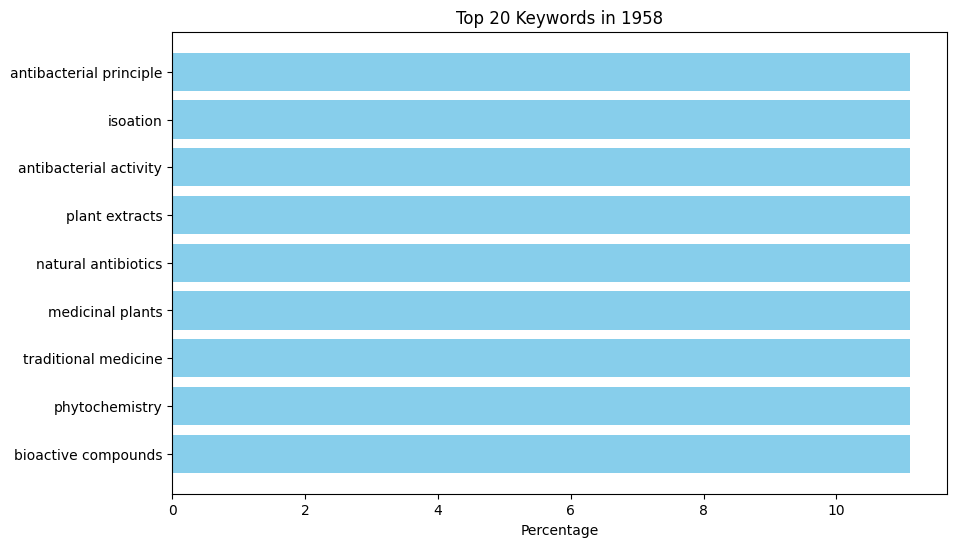


Year: 1960
Most common keywords with counts and percentages:
medicinalpharmacology: 1 (100.00%)
Number of unique keywords: 1


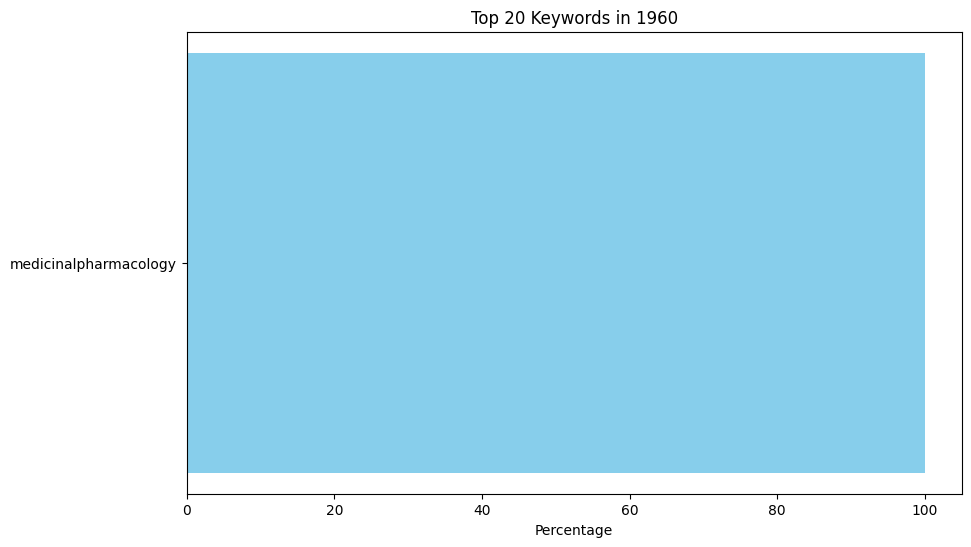


Year: 1961
Most common keywords with counts and percentages:
medicinal: 1 (100.00%)
Number of unique keywords: 1


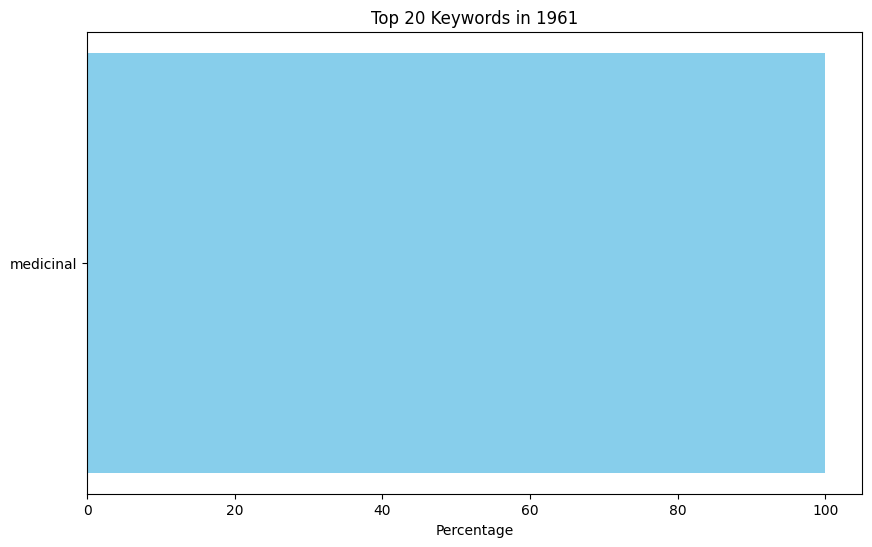


Year: 1962
Most common keywords with counts and percentages:
alkaloids: 1 (25.00%)
medicinalchemistry: 1 (25.00%)
bacteriapharmacology: 1 (25.00%)
medicinalpharmacology: 1 (25.00%)
Number of unique keywords: 4


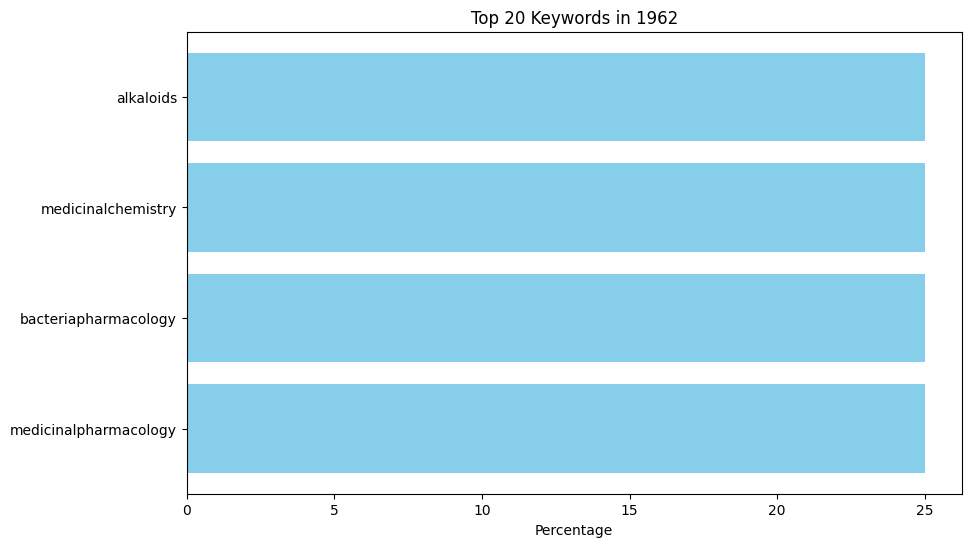


Year: 1964
Most common keywords with counts and percentages:
bacterial agents: 1 (16.67%)
chemical phenomena: 1 (16.67%)
chemistry: 1 (16.67%)
cobalt: 1 (16.67%)
edetic acid: 1 (16.67%)
glutathione: 1 (16.67%)
Number of unique keywords: 6


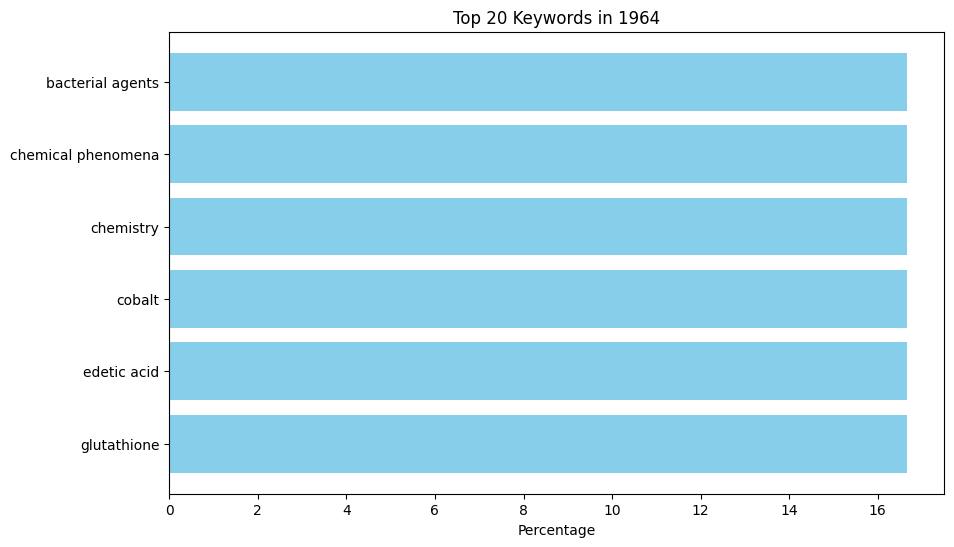


Year: 1965
Most common keywords with counts and percentages:
agriculture: 1 (50.00%)
medicinal: 1 (50.00%)
Number of unique keywords: 2


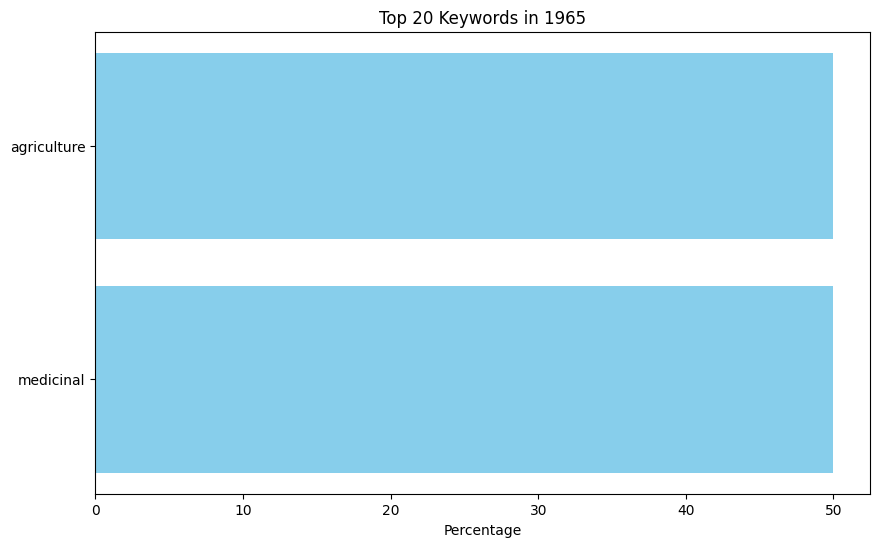


Year: 1968
Most common keywords with counts and percentages:
medicinalgrowth: 1 (33.33%)
development: 1 (33.33%)
seasons: 1 (33.33%)
Number of unique keywords: 3


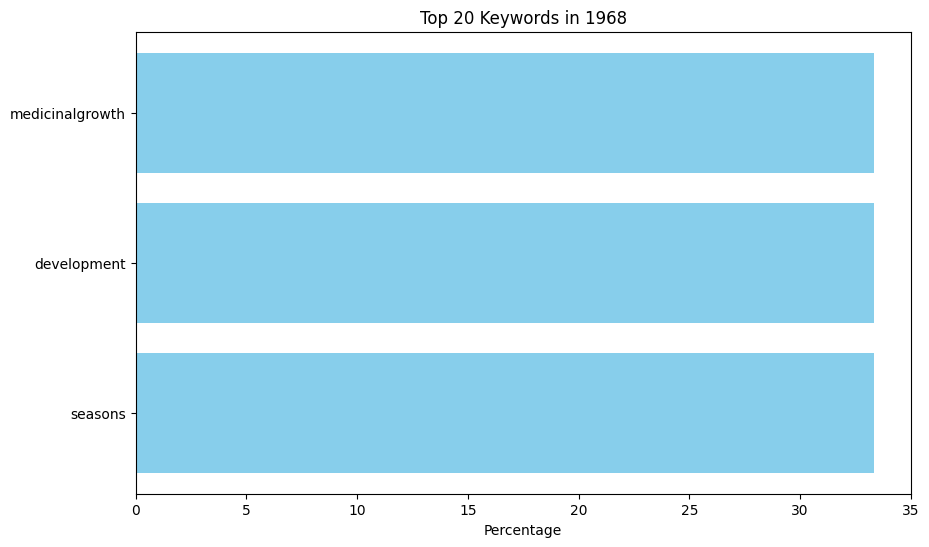


Year: 1969
Most common keywords with counts and percentages:
fertilizers: 1 (16.67%)
nitrogen: 1 (16.67%)
phosphoric acidspharmacology: 1 (16.67%)
medicinalgrowth: 1 (16.67%)
development: 1 (16.67%)
potassiumpharmacology: 1 (16.67%)
Number of unique keywords: 6


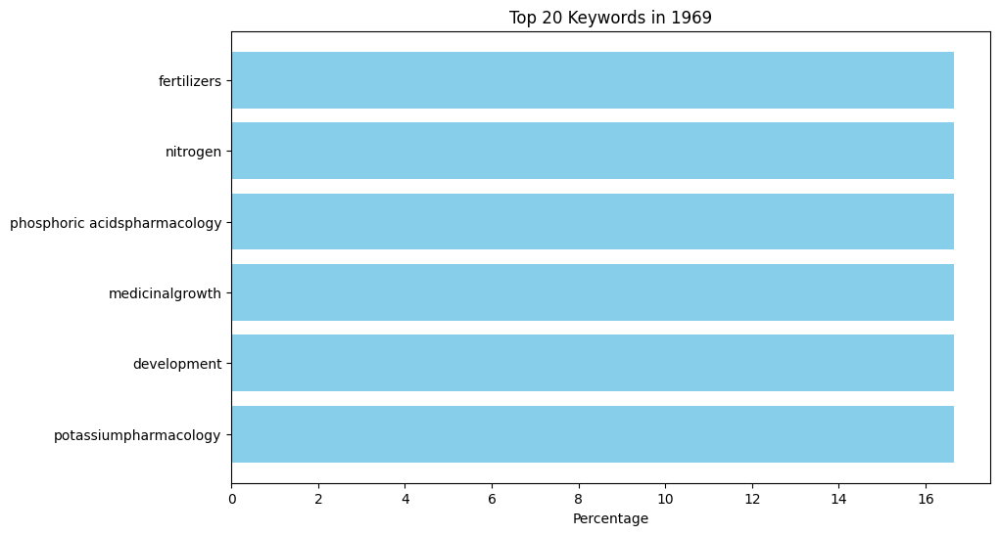


Year: 1973
Most common keywords with counts and percentages:
chemical phenomena: 1 (14.29%)
chemistry: 1 (14.29%)
lactonesisolation: 1 (14.29%)
purification: 1 (14.29%)
medicinalanalysis: 1 (14.29%)
spectrophotometry: 1 (14.29%)
infrared: 1 (14.29%)
Number of unique keywords: 7


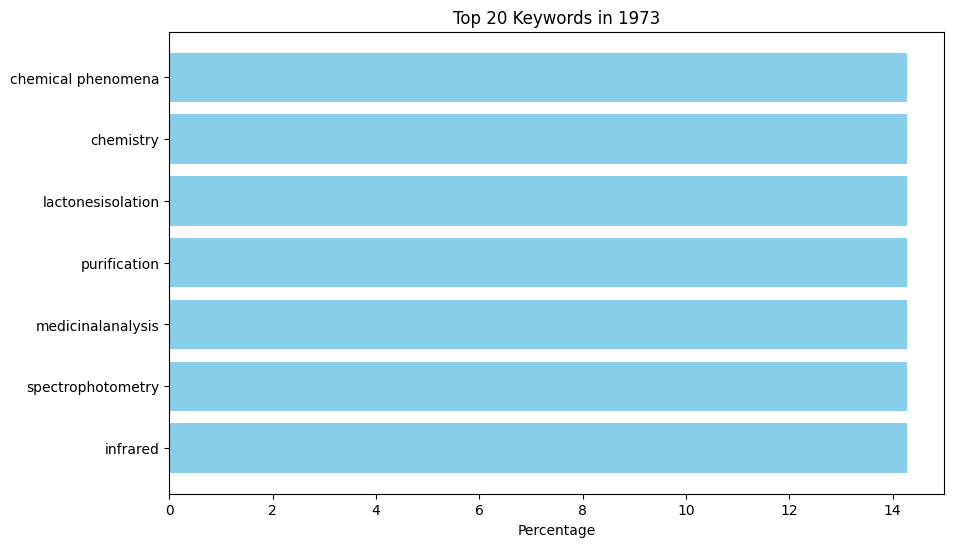


Year: 1974
Most common keywords with counts and percentages:
purification: 2 (8.70%)
india: 2 (8.70%)
medicinalanalysis: 2 (8.70%)
antineoplastic agentsisolation: 1 (4.35%)
chemical phenomena: 1 (4.35%)
chemistry: 1 (4.35%)
plant extracts: 1 (4.35%)
alkaloidsanalysis: 1 (4.35%)
antineoplastic agentsanalysis: 1 (4.35%)
cholestenesanalysis: 1 (4.35%)
cholesterolanalogs: 1 (4.35%)
derivativesanalysis: 1 (4.35%)
culture techniques: 1 (4.35%)
phytosterolsanalysisisolation: 1 (4.35%)
seedsgrowth: 1 (4.35%)
development: 1 (4.35%)
sitosterols: 1 (4.35%)
stigmasterolanalysis: 1 (4.35%)
pharmacognosy: 1 (4.35%)
medicinalcytology: 1 (4.35%)
Number of unique keywords: 20


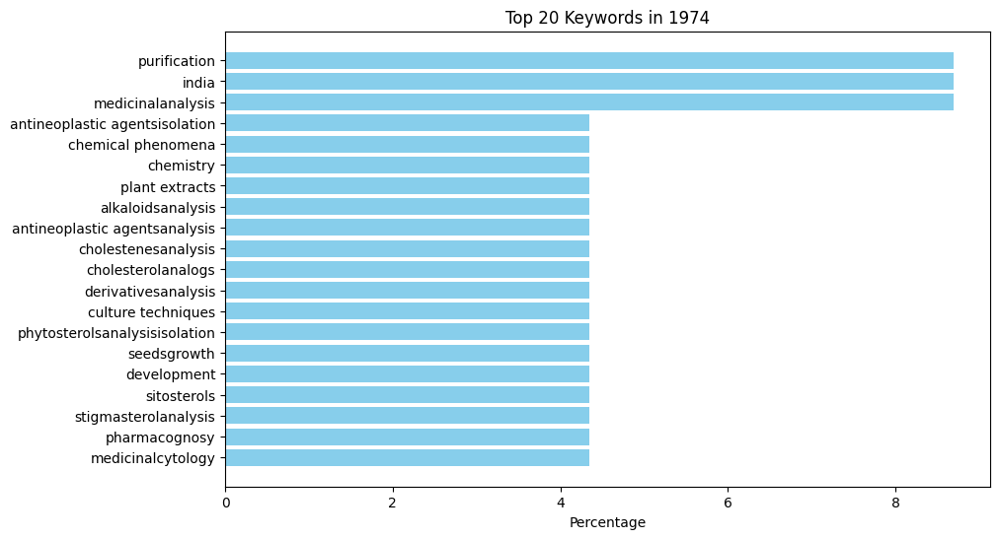


Year: 1982
Most common keywords with counts and percentages:
contraceptive agents: 2 (12.50%)
contraception: 1 (6.25%)
delivery of health care: 1 (6.25%)
economic factors: 1 (6.25%)
family planning: 1 (6.25%)
health: 1 (6.25%)
health services: 1 (6.25%)
medicine: 1 (6.25%)
medicinal: 1 (6.25%)
research: 1 (6.25%)
developmentmen: 1 (6.25%)
sperm immobilizing agents: 1 (6.25%)
sperm maturation blocking agents: 1 (6.25%)
spermicidal contraceptive agents: 1 (6.25%)
technology: 1 (6.25%)
Number of unique keywords: 15


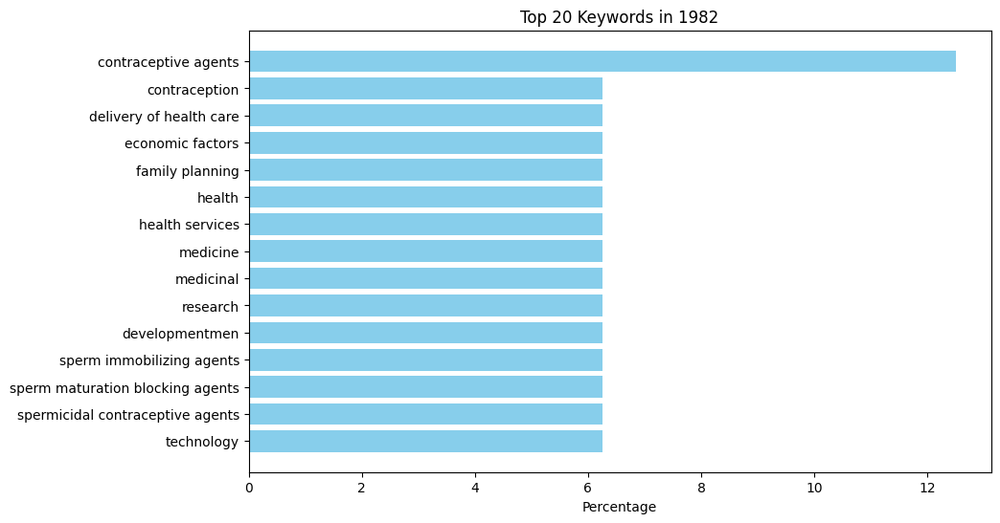


Year: 1983
Most common keywords with counts and percentages:
inflammatory agentspharmacology: 2 (8.70%)
inflammationmetabolism: 2 (8.70%)
intestinal absorptiondrug effects: 2 (8.70%)
jejunummetabolism: 2 (8.70%)
oxyphenbutazonepharmacology: 2 (8.70%)
ayurvedic preparation: 1 (4.35%)
swasakutara: 1 (4.35%)
curcuma longa: 1 (4.35%)
tropical eosinphilia: 1 (4.35%)
hetrazan: 1 (4.35%)
clinical signs: 1 (4.35%)
symptoms: 1 (4.35%)
esr: 1 (4.35%)
circulating eosinophils: 1 (4.35%)
leucinemetabolism: 1 (4.35%)
time factors: 1 (4.35%)
glucosemetabolism: 1 (4.35%)
plant extractspharmacology: 1 (4.35%)
Number of unique keywords: 18


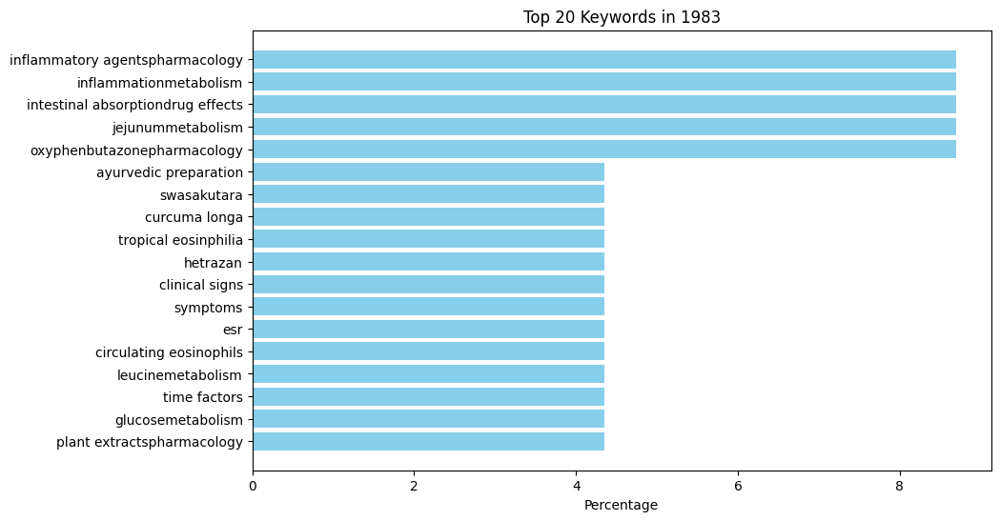


Year: 1985
Most common keywords with counts and percentages:
alkaloidsanalysis: 1 (11.11%)
kidneydrug effects: 1 (11.11%)
liverdrug effects: 1 (11.11%)
medicine: 1 (11.11%)
ayurvedic: 1 (11.11%)
medicinalanalysis: 1 (11.11%)
pyrrolizidine alkaloidstoxicity: 1 (11.11%)
inbred strains: 1 (11.11%)
sri lanka: 1 (11.11%)
Number of unique keywords: 9


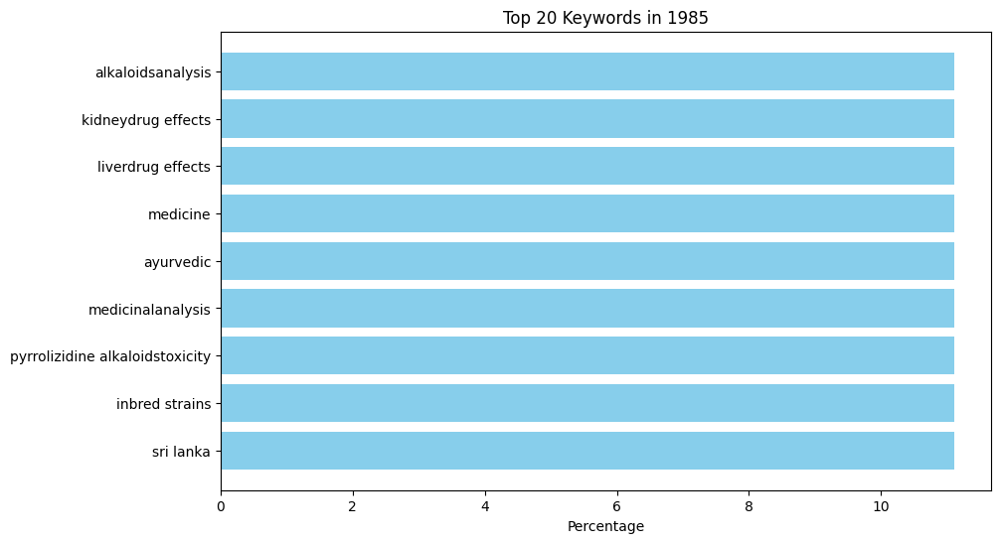


Year: 1986
Most common keywords with counts and percentages:
inflammatory agents: 1 (12.50%)
carbon tetrachloride poisoningprevention: 1 (12.50%)
chemical: 1 (12.50%)
drug induced liver injurypathologyprevention: 1 (12.50%)
india: 1 (12.50%)
plant extractspharmacology: 1 (12.50%)
medicinalanalysis: 1 (12.50%)
time factors: 1 (12.50%)
Number of unique keywords: 8


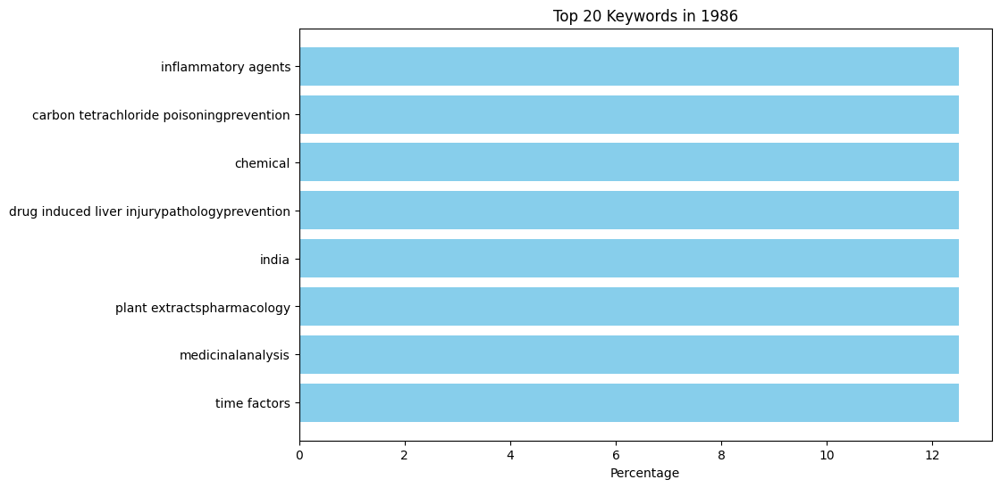


Year: 1987
Most common keywords with counts and percentages:
adenosine triphosphatasesmetabolism: 1 (8.33%)
blood cell count: 1 (8.33%)
carrageenan: 1 (8.33%)
glycosaminoglycansbiosynthesis: 1 (8.33%)
granulomachemically inducedmetabolism: 1 (8.33%)
hydrocortisonepharmacology: 1 (8.33%)
phenylbutazonepharmacology: 1 (8.33%)
plant extractspharmacology: 1 (8.33%)
inbred strains: 1 (8.33%)
sulfatesmetabolism: 1 (8.33%)
sulfur radioisotopes: 1 (8.33%)
uncoupling agents: 1 (8.33%)
Number of unique keywords: 12


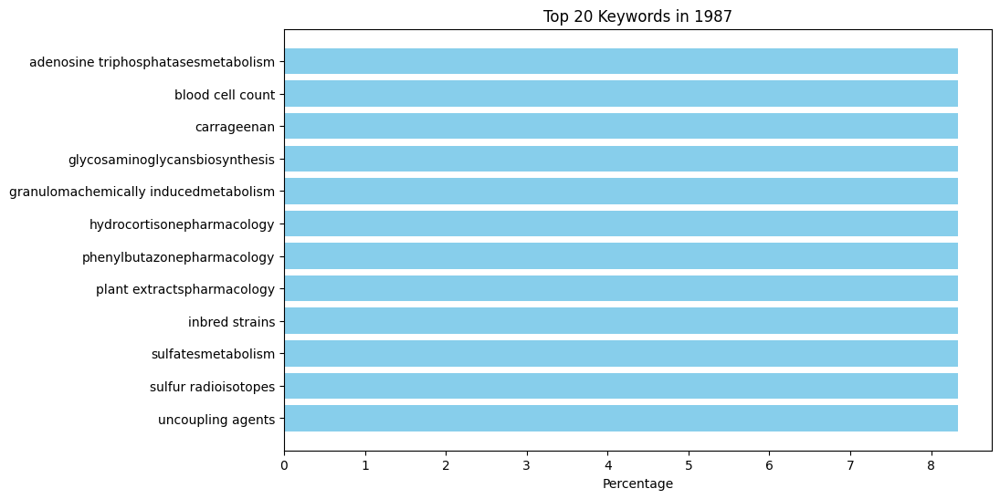


Year: 1988
Most common keywords with counts and percentages:
arthritisdrug therapy: 1 (11.11%)
arthritis: 1 (11.11%)
experimentaldrug therapy: 1 (11.11%)
ergosterolanalogs: 1 (11.11%)
derivativestherapeutic use: 1 (11.11%)
plant extractstherapeutic use: 1 (11.11%)
inbred strains: 1 (11.11%)
weight lossdrug effects: 1 (11.11%)
withanolides: 1 (11.11%)
Number of unique keywords: 9


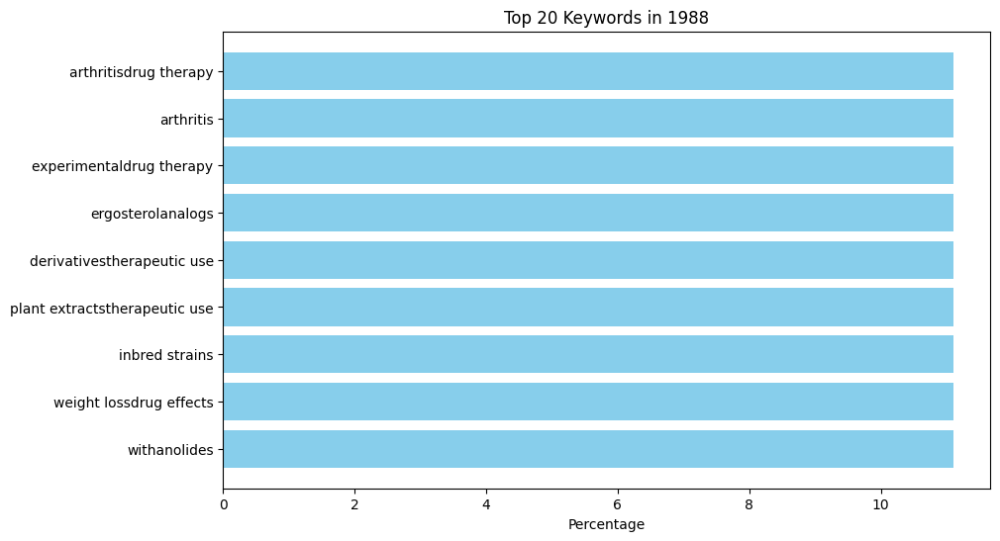


Year: 1989
Most common keywords with counts and percentages:
medicinal: 2 (15.38%)
africa: 1 (7.69%)
india: 1 (7.69%)
medicine: 1 (7.69%)
traditional: 1 (7.69%)
inflammatory agentspharmacology: 1 (7.69%)
carrageenan: 1 (7.69%)
edemachemically induceddrug therapy: 1 (7.69%)
iraq: 1 (7.69%)
lethal dose 50: 1 (7.69%)
plethysmography: 1 (7.69%)
inbred strains: 1 (7.69%)
Number of unique keywords: 12


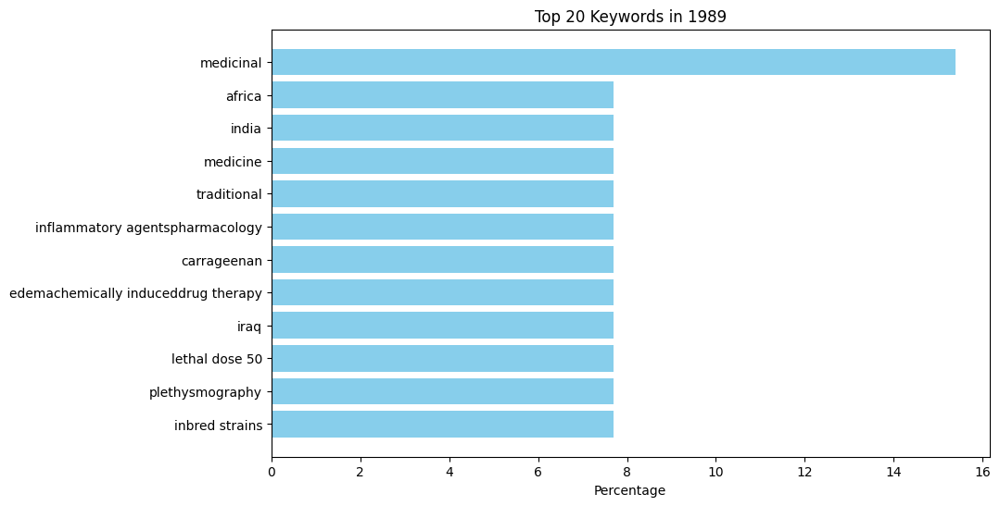


Year: 1990
Most common keywords with counts and percentages:
purification: 6 (25.00%)
analgesics: 1 (4.17%)
aspirin: 1 (4.17%)
drug evaluation: 1 (4.17%)
preclinical: 1 (4.17%)
methanol: 1 (4.17%)
methylene chloride: 1 (4.17%)
pakistan: 1 (4.17%)
plant extracts: 1 (4.17%)
medicinal: 1 (4.17%)
fatty acidschemistryisolation: 1 (4.17%)
flavonoids: 1 (4.17%)
phenolschemistryisolation: 1 (4.17%)
phytosterolschemistryisolation: 1 (4.17%)
medicinalanalysis: 1 (4.17%)
polymerschemistryisolation: 1 (4.17%)
polyphenols: 1 (4.17%)
sitosterolschemistryisolation: 1 (4.17%)
solanaceous alkaloidschemistryisolation: 1 (4.17%)
Number of unique keywords: 19


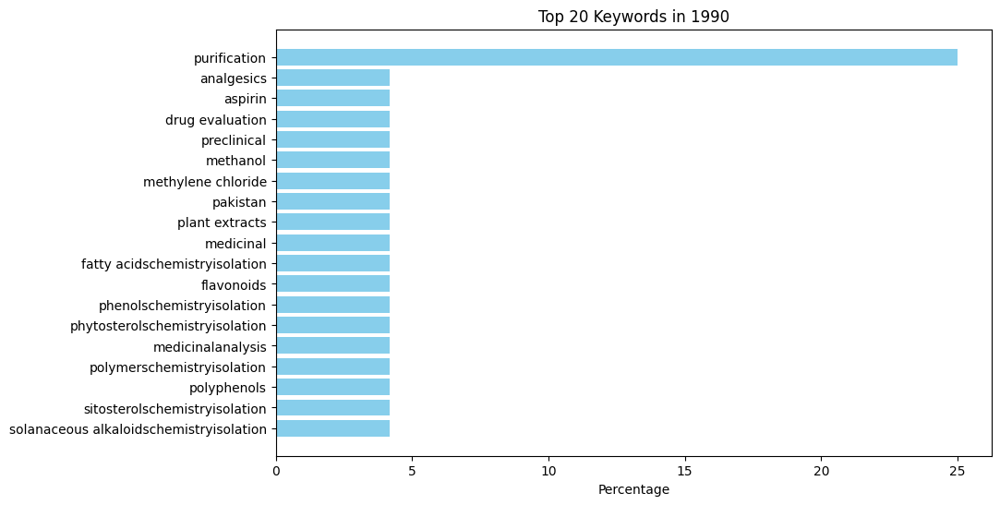


Year: 1991
Most common keywords with counts and percentages:
chloridesmetabolism: 1 (3.33%)
in vitro techniques: 1 (3.33%)
inbred c57bl: 1 (3.33%)
plant extractspharmacology: 1 (3.33%)
pregnancy: 1 (3.33%)
receptors: 1 (3.33%)
gabaadrug effects: 1 (3.33%)
gammaaminobutyric acidmetabolism: 1 (3.33%)
antibacterial activity: 1 (3.33%)
antifungal activity: 1 (3.33%)
polygonum equisetiforme: 1 (3.33%)
pure compounds: 1 (3.33%)
minimum inhibitory concentration: 1 (3.33%)
susceptibility: 1 (3.33%)
toxicity: 1 (3.33%)
brine shrimp lethality test: 1 (3.33%)
balbc mice lethality test: 1 (3.33%)
adult: 1 (3.33%)
doubleblind method: 1 (3.33%)
drug compounding: 1 (3.33%)
india: 1 (3.33%)
materia medicaadverse effectstherapeutic use: 1 (3.33%)
medicine: 1 (3.33%)
ayurvedic: 1 (3.33%)
middle aged: 1 (3.33%)
osteoarthritisdiagnostic imagingdrug therapy: 1 (3.33%)
plant extractsadverse effectstherapeutic use: 1 (3.33%)
medicinalchemistry: 1 (3.33%)
radiography: 1 (3.33%)
zincadverse effectstherapeutic

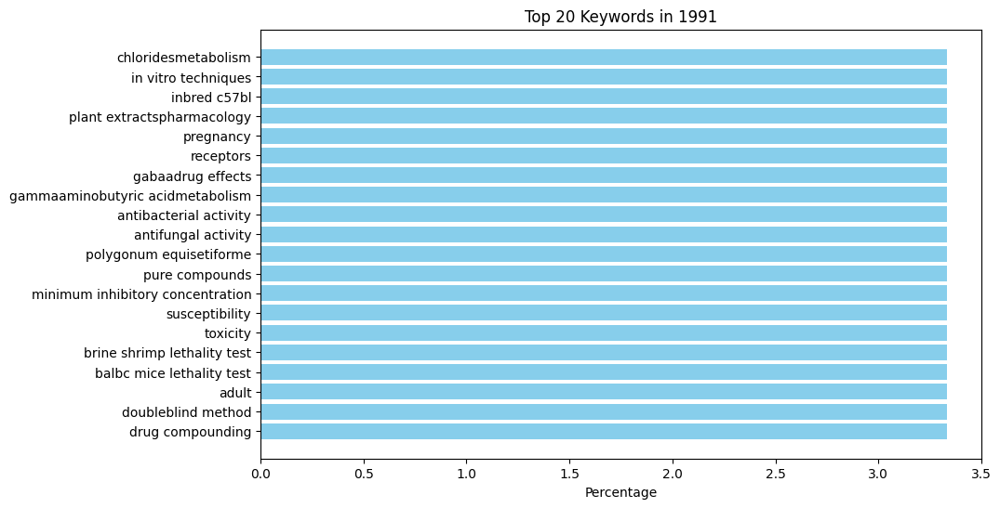


Year: 1992
Most common keywords with counts and percentages:
adrenal glandsdrug effects: 1 (3.70%)
gossypium: 1 (3.70%)
granulation tissuedrug effectspathology: 1 (3.70%)
granulomadrug therapypathology: 1 (3.70%)
iraq: 1 (3.70%)
organ sizedrug effects: 1 (3.70%)
plant extractspharmacology: 1 (3.70%)
doseresponse relationship: 1 (3.70%)
drug: 1 (3.70%)
medicine: 1 (3.70%)
ayurvedic: 1 (3.70%)
inbred balb c: 1 (3.70%)
neoplasm transplantation: 1 (3.70%)
plant extractstherapeutic use: 1 (3.70%)
medicinal: 1 (3.70%)
remission induction: 1 (3.70%)
sarcoma 180drug therapy: 1 (3.70%)
herbal vendors: 1 (3.70%)
mobile tribal medicinemen: 1 (3.70%)
medicinal plants: 1 (3.70%)
herbal treatment: 1 (3.70%)
urinogenital disorders: 1 (3.70%)
dysuria: 1 (3.70%)
hematuria: 1 (3.70%)
syphilis: 1 (3.70%)
gonorrhea: 1 (3.70%)
herbal drugs: 1 (3.70%)
Number of unique keywords: 27


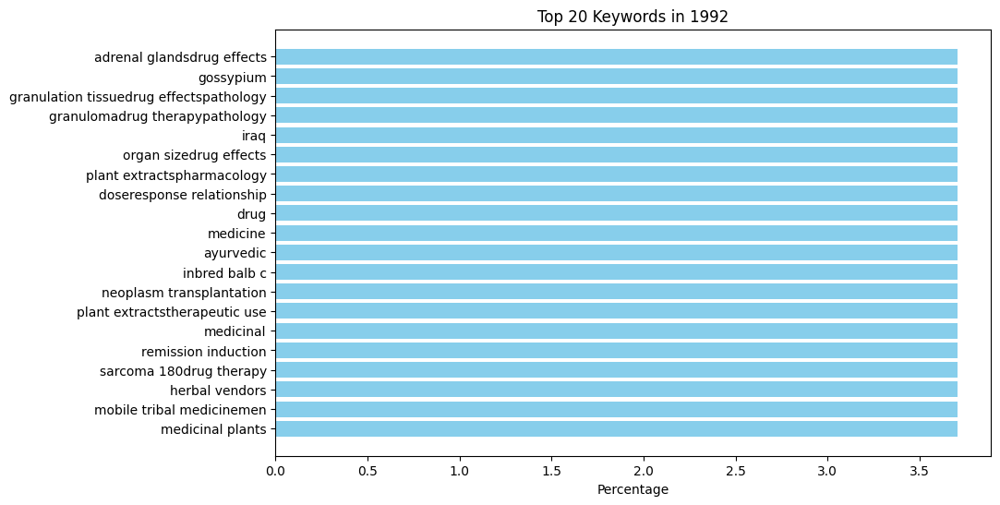


Year: 1993
Most common keywords with counts and percentages:
antineoplastic agentspharmacology: 1 (12.50%)
medicine: 1 (12.50%)
ayurvedic: 1 (12.50%)
inbred balb c: 1 (12.50%)
neoplasm transplantation: 1 (12.50%)
plant extractspharmacology: 1 (12.50%)
radiationsensitizing agentspharmacology: 1 (12.50%)
sarcoma 180drug therapy: 1 (12.50%)
Number of unique keywords: 8


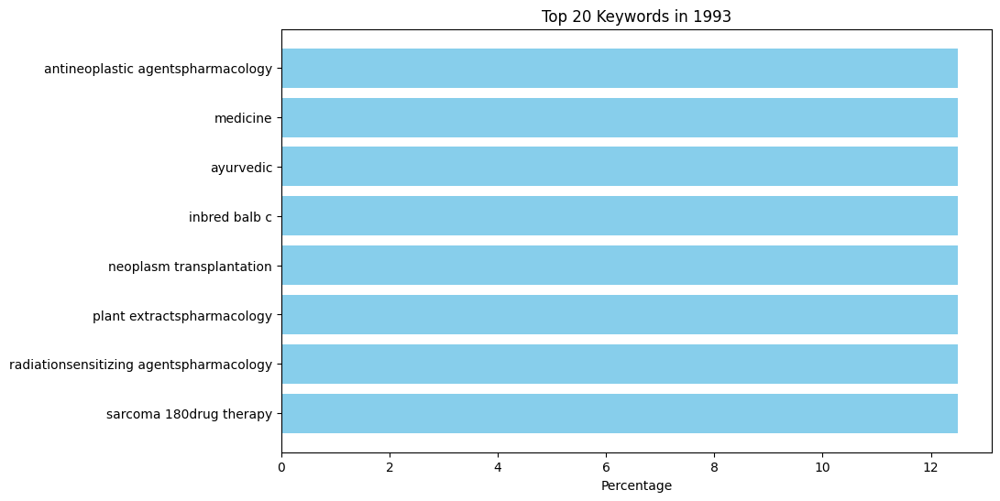


Year: 1994
Most common keywords with counts and percentages:
ethnicity: 1 (16.67%)
israel: 1 (16.67%)
medicine: 1 (16.67%)
traditional: 1 (16.67%)
medicinalclassification: 1 (16.67%)
solanaceous alkaloidstherapeutic use: 1 (16.67%)
Number of unique keywords: 6


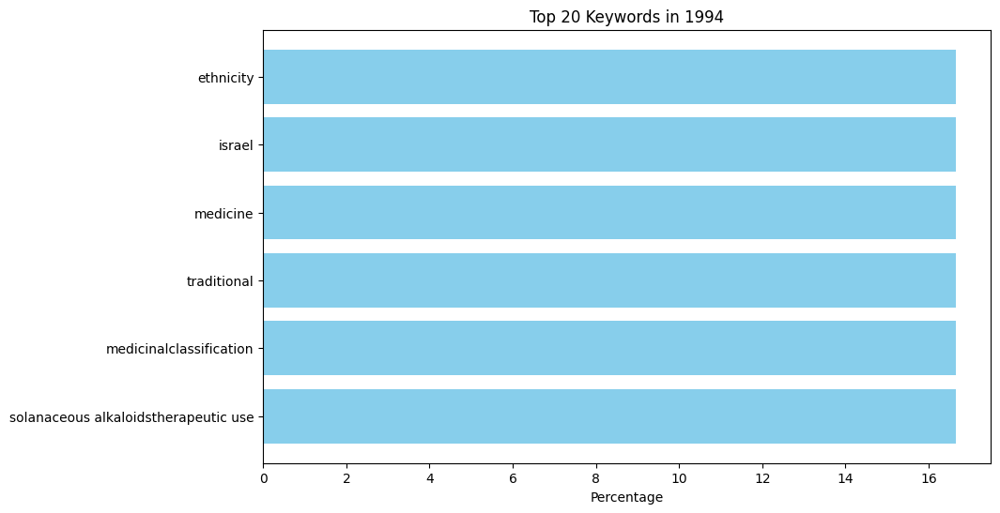


Year: 1995
Most common keywords with counts and percentages:
antineoplastic agents: 1 (7.69%)
phytogenic: 1 (7.69%)
carcinoma: 1 (7.69%)
ehrlich tumordrug therapyradiotherapy: 1 (7.69%)
doseresponse relationship: 1 (7.69%)
drug: 1 (7.69%)
ergosteroladministration: 1 (7.69%)
dosageanalogs: 1 (7.69%)
derivatives: 1 (7.69%)
gamma rays: 1 (7.69%)
inbred strains: 1 (7.69%)
radiationsensitizing agents: 1 (7.69%)
withanolides: 1 (7.69%)
Number of unique keywords: 13


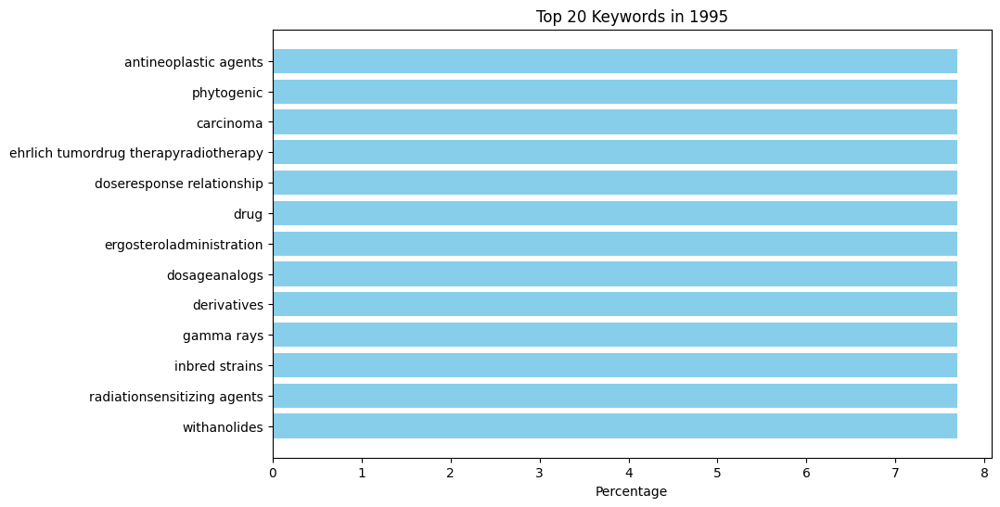


Year: 1996
Most common keywords with counts and percentages:
withanolides: 5 (6.41%)
ergosterolanalogs: 3 (3.85%)
purificationpharmacology: 3 (3.85%)
agrobacterium rhizogenes: 2 (2.56%)
cricetinae: 2 (2.56%)
medicinalchemistry: 2 (2.56%)
antineoplastic agents: 2 (2.56%)
medicine: 2 (2.56%)
ayurvedic: 2 (2.56%)
chemotype iii: 1 (1.28%)
in vitro cultures: 1 (1.28%)
hplc: 1 (1.28%)
low withanolide content: 1 (1.28%)
transformed root cultures: 1 (1.28%)
withanolide d: 1 (1.28%)
murashige: 1 (1.28%)
skoog's medium: 1 (1.28%)
sucrose: 1 (1.28%)
growth index: 1 (1.28%)
productivity: 1 (1.28%)
untransformed root cultures: 1 (1.28%)
cell cycleradiation effects: 1 (1.28%)
cell survivaldrug effectsradiation effects: 1 (1.28%)
cells: 1 (1.28%)
cultured: 1 (1.28%)
cricetulus: 1 (1.28%)
derivativespharmacology: 1 (1.28%)
gamma rays: 1 (1.28%)
radiationsensitizing agentspharmacology: 1 (1.28%)
phytotherapy: 1 (1.28%)
radiation injuries: 1 (1.28%)
experimentalprevention: 1 (1.28%)
radiationprotective

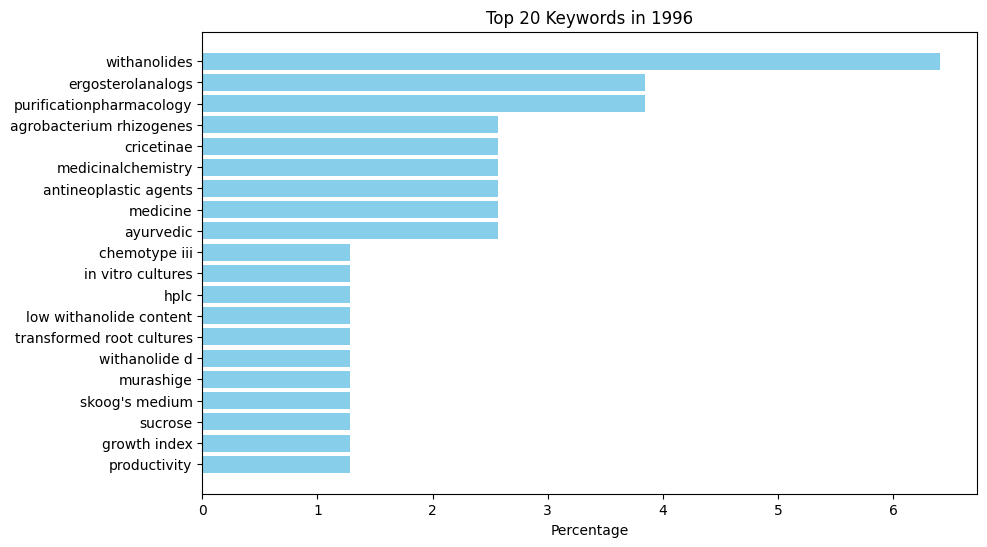


Year: 1997
Most common keywords with counts and percentages:
plant extractspharmacology: 4 (4.35%)
medicine: 3 (3.26%)
dosagetherapeutic use: 3 (3.26%)
dosage: 3 (3.26%)
ayurvedic: 2 (2.17%)
phytotherapy: 2 (2.17%)
medicinal: 2 (2.17%)
dosagetoxicity: 2 (2.17%)
ergosterolanalogs: 2 (2.17%)
derivativespharmacology: 2 (2.17%)
withanolides: 2 (2.17%)
acetylcholinesterasemetabolism: 1 (1.09%)
braindrug effectsmetabolism: 1 (1.09%)
cerebral cortexdrug effectsmetabolism: 1 (1.09%)
drug evaluation: 1 (1.09%)
preclinical: 1 (1.09%)
glutamic acidmetabolism: 1 (1.09%)
hippocampusdrug effectsmetabolism: 1 (1.09%)
in vitro techniques: 1 (1.09%)
panaxchemistry: 1 (1.09%)
prosencephalondrug effectsmetabolism: 1 (1.09%)
receptors: 1 (1.09%)
cholinergicmetabolism: 1 (1.09%)
gammaaminobutyric acidmetabolism: 1 (1.09%)
administration: 1 (1.09%)
oral: 1 (1.09%)
disease models: 1 (1.09%)
doseresponse relationship: 1 (1.09%)
drug: 1 (1.09%)
drug tolerance: 1 (1.09%)
injections: 1 (1.09%)
subcutaneous: 1 (

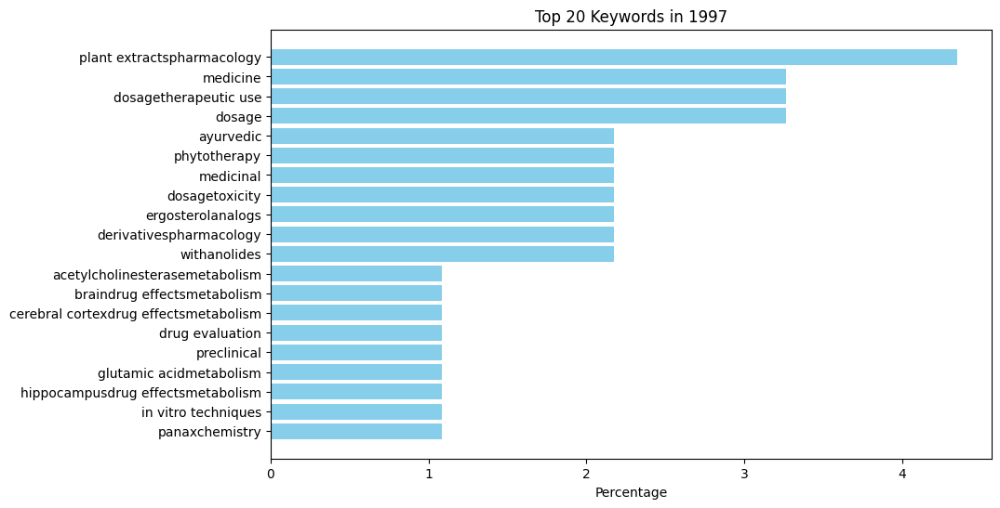


Year: 1998
Most common keywords with counts and percentages:
inflammatory agents: 3 (5.66%)
plant extractspharmacology: 2 (3.77%)
anthraquinonesblood: 1 (1.89%)
antineoplastic agents: 1 (1.89%)
alkylatingtoxicity: 1 (1.89%)
body weight: 1 (1.89%)
bone marrow cellsdrug effects: 1 (1.89%)
cell divisiondrug effects: 1 (1.89%)
cyclophosphamidetoxicity: 1 (1.89%)
disaccharidesblood: 1 (1.89%)
esterasesdrug effectsmetabolism: 1 (1.89%)
immune systemdrug effects: 1 (1.89%)
immunosuppressive agentstoxicity: 1 (1.89%)
solanaceaechemistry: 1 (1.89%)
stem cellsdrug effectsmetabolism: 1 (1.89%)
transaminasesblooddrug effects: 1 (1.89%)
administration: 1 (1.89%)
oral: 1 (1.89%)
nonsteroidaltoxicity: 1 (1.89%)
drug combinations: 1 (1.89%)
eatingdrug effects: 1 (1.89%)
hemoglobinsmetabolism: 1 (1.89%)
liverdrug effects: 1 (1.89%)
organ sizedrug effects: 1 (1.89%)
panax: 1 (1.89%)
plant extractstoxicity: 1 (1.89%)
medicinal: 1 (1.89%)
weight gaindrug effects: 1 (1.89%)
nonsteroidalpharmacology: 1 (1.

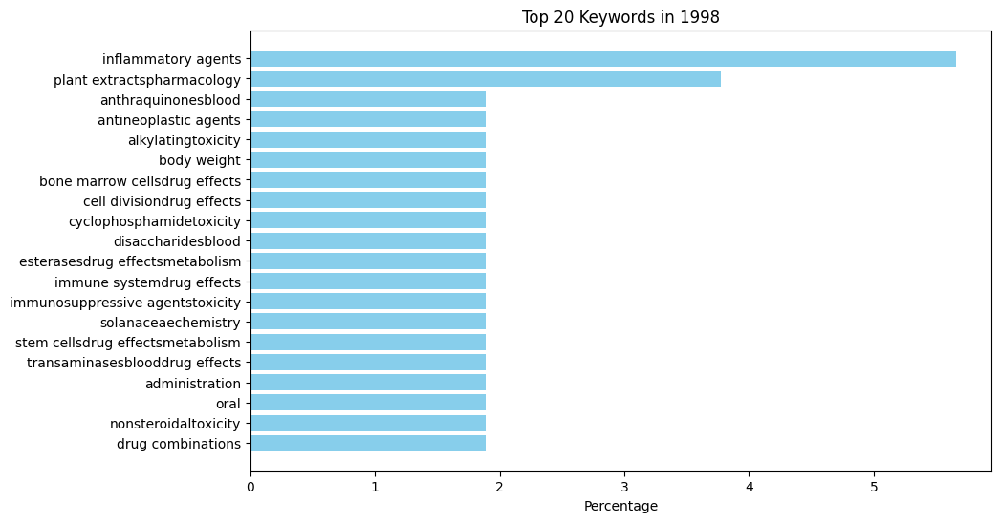


Year: 1999
Most common keywords with counts and percentages:
india: 3 (4.62%)
medicine: 3 (4.62%)
phytotherapy: 2 (3.08%)
plant extractspharmacologytherapeutic use: 2 (3.08%)
dosagepharmacology: 2 (3.08%)
ayurvedic: 2 (3.08%)
analysis of variance: 1 (1.54%)
inflammatory agentsisolation: 1 (1.54%)
purificationpharmacologytherapeutic use: 1 (1.54%)
antibody affinity: 1 (1.54%)
corticosteroneblood: 1 (1.54%)
exercise test: 1 (1.54%)
traditional: 1 (1.54%)
phagocytosis: 1 (1.54%)
plant rootstherapeutic use: 1 (1.54%)
medicinaltherapeutic use: 1 (1.54%)
stress: 1 (1.54%)
physiologicalimmunologyphysiopathologyprevention: 1 (1.54%)
colonyforming units assay: 1 (1.54%)
cyclophosphamidepharmacology: 1 (1.54%)
cytokinesbiosynthesis: 1 (1.54%)
granulocytemacrophage colonystimulating factorbiosynthesis: 1 (1.54%)
immunosuppressive agentspharmacology: 1 (1.54%)
interferongammabiosynthesis: 1 (1.54%)
interleukin2biosynthesis: 1 (1.54%)
inbred balb c: 1 (1.54%)
plant extractspharmacology: 1 (1.54%)


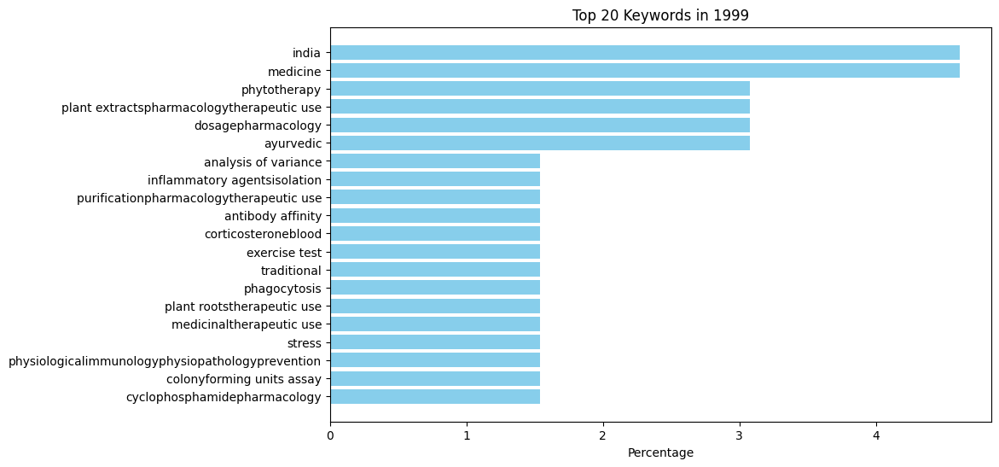


Year: 2000
Most common keywords with counts and percentages:
plant extractspharmacology: 8 (3.17%)
medicine: 7 (2.78%)
ayurvedic: 6 (2.38%)
medicinalchemistry: 5 (1.98%)
plant rootschemistry: 4 (1.59%)
stress: 4 (1.59%)
dosagepharmacology: 4 (1.59%)
india: 3 (1.19%)
solanaceaechemistry: 3 (1.19%)
chemical: 3 (1.19%)
phytotherapy: 3 (1.19%)
dosagepharmacologytherapeutic use: 3 (1.19%)
organ sizedrug effects: 2 (0.79%)
inflammatory agents: 2 (0.79%)
plant extractspharmacologytherapeutic use: 2 (0.79%)
solanaceaetherapeutic use: 2 (0.79%)
lipid peroxidationdrug effects: 2 (0.79%)
administration: 2 (0.79%)
oral: 2 (0.79%)
ergosteroladministration: 2 (0.79%)
dosageanalogs: 2 (0.79%)
plant extractsadministration: 2 (0.79%)
chromatography: 2 (0.79%)
medicinal: 2 (0.79%)
middle aged: 2 (0.79%)
adjuvants: 1 (0.40%)
immunologicisolation: 1 (0.40%)
purificationpharmacology: 1 (0.40%)
antibodiesanalysis: 1 (0.40%)
antibodyproducing cellsdrug effects: 1 (0.40%)
blood cell countdrug effects: 1 (0.4

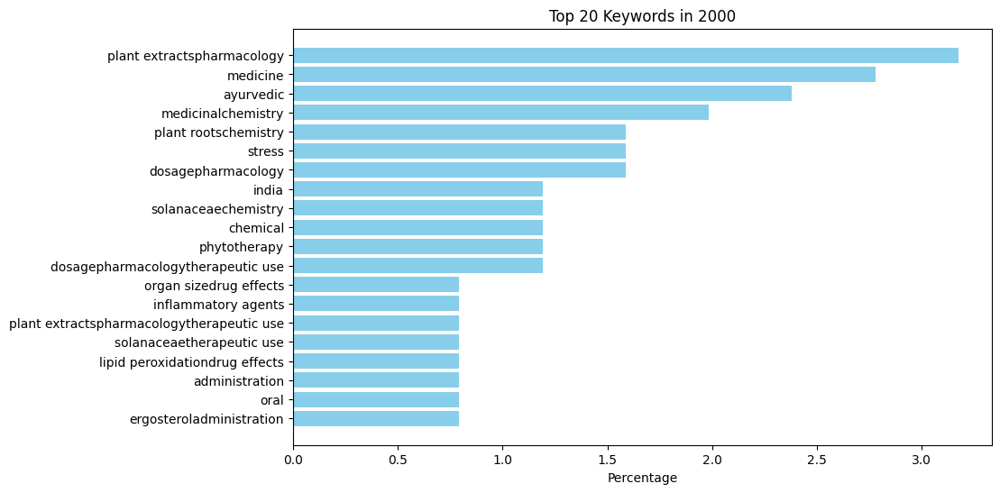


Year: 2001
Most common keywords with counts and percentages:
purificationpharmacology: 10 (3.82%)
stress: 5 (1.91%)
medicinal: 5 (1.91%)
doseresponse relationship: 5 (1.91%)
drug: 5 (1.91%)
plant extractspharmacology: 4 (1.53%)
solanaceaechemistry: 4 (1.53%)
phytotherapy: 4 (1.53%)
solanaceae: 4 (1.53%)
india: 4 (1.53%)
developmentpathogenicity: 3 (1.15%)
administration: 3 (1.15%)
oral: 3 (1.15%)
dosagepharmacologytherapeutic use: 3 (1.15%)
plant extractspharmacologytherapeutic use: 3 (1.15%)
antineoplastic agents: 3 (1.15%)
ergosterolanalogs: 3 (1.15%)
withanolides: 3 (1.15%)
development: 3 (1.15%)
plant rootschemistry: 3 (1.15%)
glutathione peroxidasemetabolism: 2 (0.76%)
developmentmicrobiology: 2 (0.76%)
lipid peroxidationdrug effects: 2 (0.76%)
medicine: 2 (0.76%)
stomach ulcerprevention: 2 (0.76%)
physiologicalprevention: 2 (0.76%)
culture techniques: 2 (0.76%)
magnoliopsidachemistry: 2 (0.76%)
molecular structure: 2 (0.76%)
plant extractsisolation: 2 (0.76%)
purificationtoxicit

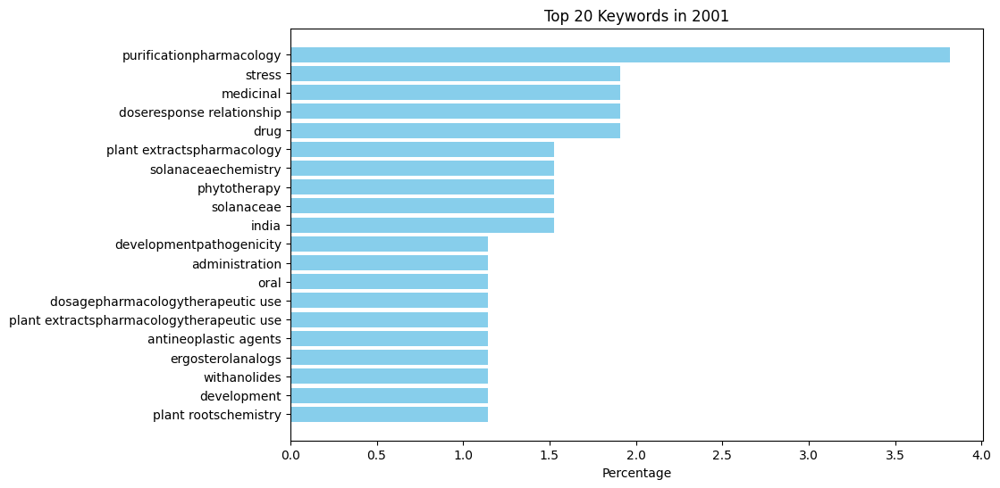


Year: 2002
Most common keywords with counts and percentages:
dosagepharmacologytherapeutic use: 5 (3.23%)
purificationpharmacology: 4 (2.58%)
phytotherapy: 4 (2.58%)
plant rootschemistry: 4 (2.58%)
plant extractspharmacology: 3 (1.94%)
disease models: 2 (1.29%)
ergosterolanalogs: 2 (1.29%)
withanolides: 2 (1.29%)
plant extractsadministration: 2 (1.29%)
dosagepharmacology: 2 (1.29%)
plant roots: 2 (1.29%)
inbred balb c: 2 (1.29%)
medicinalchemistry: 2 (1.29%)
lymphocyte activationdrug effects: 2 (1.29%)
tlymphocytesdrug effectsimmunology: 2 (1.29%)
lactoneschemistrypharmacology: 2 (1.29%)
solanaceaechemistry: 2 (1.29%)
carcinoma: 2 (1.29%)
chromatography: 2 (1.29%)
purificationpharmacologytoxicity: 2 (1.29%)
herbal medicine: 2 (1.29%)
stress: 2 (1.29%)
dyskinesia agentspharmacology: 1 (0.65%)
anticonvulsantspharmacology: 1 (0.65%)
antioxidantspharmacology: 1 (0.65%)
dyskinesia: 1 (0.65%)
druginducedprevention: 1 (0.65%)
derivativeschemistryisolation: 1 (0.65%)
glycosideschemistryisolat

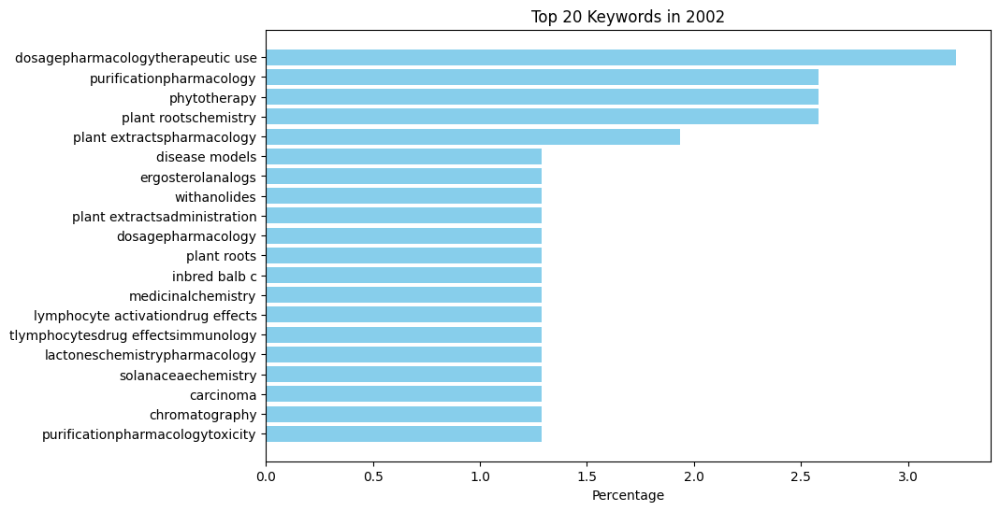


Year: 2003
Most common keywords with counts and percentages:
dosagepharmacologytherapeutic use: 8 (3.83%)
phytotherapy: 7 (3.35%)
doseresponse relationship: 5 (2.39%)
drug: 5 (2.39%)
lipid peroxidationdrug effects: 4 (1.91%)
plant extractspharmacology: 4 (1.91%)
disease models: 4 (1.91%)
plant rootschemistry: 4 (1.91%)
ergosterolanalogs: 3 (1.44%)
plant roots: 3 (1.44%)
enzyme inhibitorspharmacology: 2 (0.96%)
inhibitorsmetabolism: 2 (0.96%)
plant extractschemistry: 2 (0.96%)
plant stems: 2 (0.96%)
withanolides: 2 (0.96%)
medicine: 2 (0.96%)
ayurvedic: 2 (0.96%)
phytotherapymethods: 2 (0.96%)
stress: 2 (0.96%)
inflammatory agents: 2 (0.96%)
behavior: 2 (0.96%)
animaldrug effects: 2 (0.96%)
cell line: 2 (0.96%)
plant extractstherapeutic use: 2 (0.96%)
ocimum: 2 (0.96%)
plant extractsadministration: 2 (0.96%)
inhibitorstoxicity: 2 (0.96%)
purificationpharmacology: 2 (0.96%)
agingmetabolism: 1 (0.48%)
antioxidantsmetabolism: 1 (0.48%)
copperpharmacology: 1 (0.48%)
glutathione peroxidasea

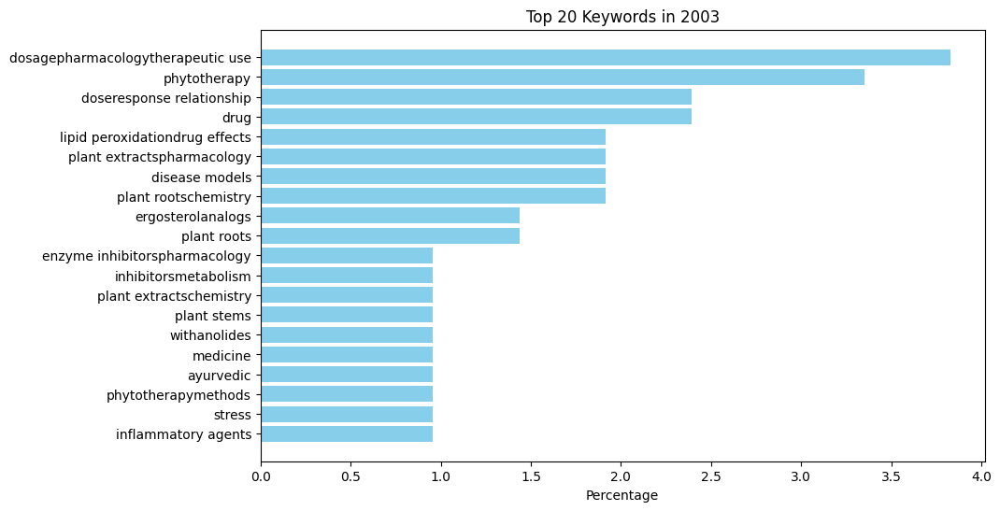


Year: 2004
Most common keywords with counts and percentages:
dosagepharmacologytherapeutic use: 8 (3.92%)
phytotherapy: 7 (3.43%)
plant roots: 5 (2.45%)
plant extractsadministration: 4 (1.96%)
antineoplastic agents: 4 (1.96%)
plant rootschemistry: 3 (1.47%)
purificationpharmacology: 3 (1.47%)
plant extractspharmacology: 3 (1.47%)
cell line: 3 (1.47%)
tumor: 3 (1.47%)
plant extractstherapeutic use: 2 (0.98%)
ventricular pressuredrug effects: 2 (0.98%)
vitamin epharmacology: 2 (0.98%)
dosagepharmacology: 2 (0.98%)
adjuvants: 2 (0.98%)
chromatography: 2 (0.98%)
ergosterolanalogs: 2 (0.98%)
phytogenicadministration: 2 (0.98%)
experimentaldrug therapypathology: 2 (0.98%)
inbred c57bl: 2 (0.98%)
anxietydrug therapy: 1 (0.49%)
depressiondrug therapy: 1 (0.49%)
hematopoiesisdrug effects: 1 (0.49%)
immunologic factorsadverse effectstherapeutic use: 1 (0.49%)
plant extracts: 1 (0.49%)
plant preparationsadverse effectstherapeutic use: 1 (0.49%)
administration: 1 (0.49%)
oral: 1 (0.49%)
antioxida

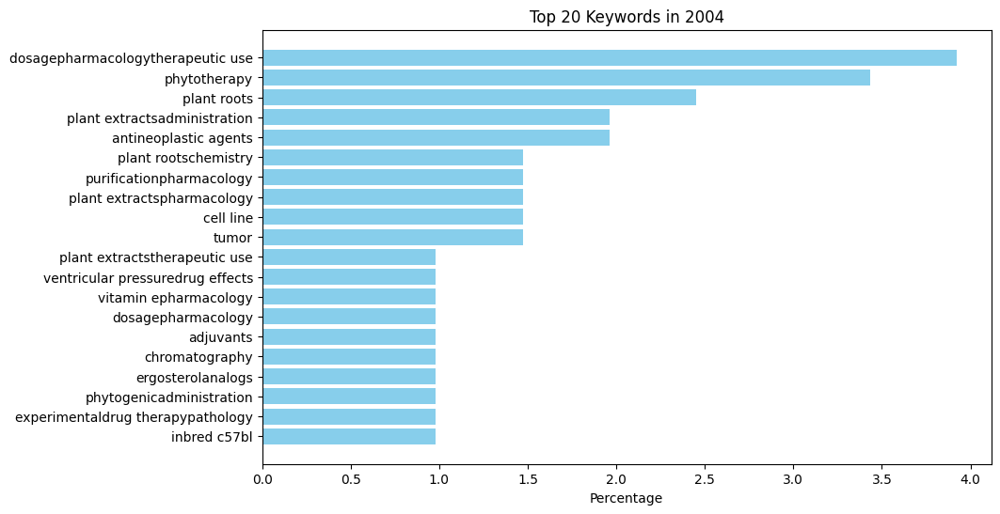


Year: 2005
Most common keywords with counts and percentages:
dosagepharmacologytherapeutic use: 6 (4.23%)
phytotherapy: 3 (2.11%)
plant roots: 3 (2.11%)
doseresponse relationship: 3 (2.11%)
drug: 3 (2.11%)
models: 3 (2.11%)
administration: 2 (1.41%)
oral: 2 (1.41%)
plant extractsadministration: 2 (1.41%)
liverdrug effectsenzymology: 2 (1.41%)
purificationtherapeutic use: 2 (1.41%)
plant extractsisolation: 2 (1.41%)
cells: 2 (1.41%)
cultured: 2 (1.41%)
bacterial agentsadministration: 1 (0.70%)
inbred balb c: 1 (0.70%)
microbial sensitivity tests: 1 (0.70%)
plant leaves: 1 (0.70%)
salmonella infectionsprevention: 1 (0.70%)
salmonella typhimuriumdrug effects: 1 (0.70%)
antioxidantspharmacology: 1 (0.70%)
asparagus plant: 1 (0.70%)
catalasemetabolism: 1 (0.70%)
gastrointestinal contentsdrug effects: 1 (0.70%)
indomethacinpharmacology: 1 (0.70%)
oxidantspharmacology: 1 (0.70%)
peptic ulcerprevention: 1 (0.70%)
plant extractspharmacology: 1 (0.70%)
superoxide dismutasedrug effectsmetabolism

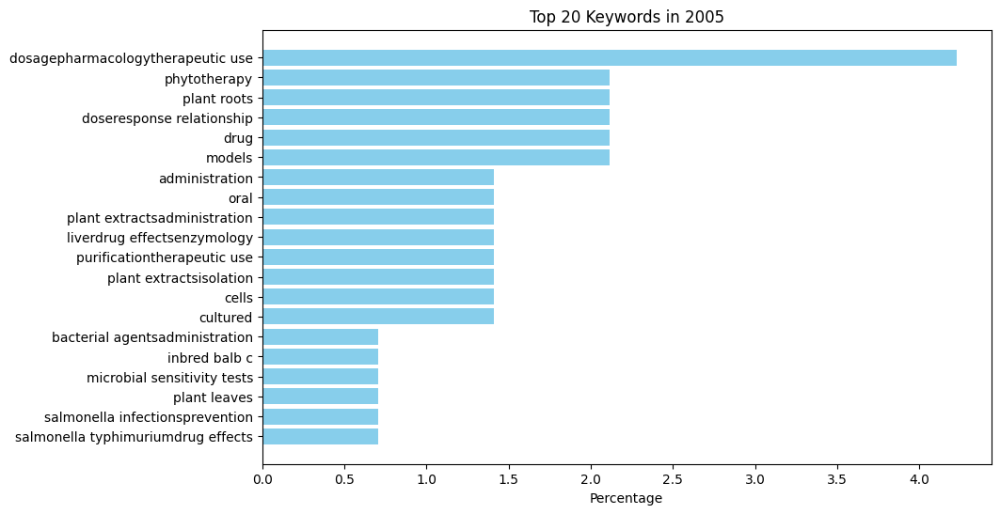


Year: 2006
Most common keywords with counts and percentages:
phytotherapy: 10 (2.25%)
purificationpharmacology: 10 (2.25%)
plant extractspharmacology: 8 (1.80%)
plant rootschemistry: 6 (1.35%)
antineoplastic agents: 5 (1.12%)
medicine: 5 (1.12%)
medicinal: 5 (1.12%)
disease models: 4 (0.90%)
ergosterolanalogs: 4 (0.90%)
ayurvedic: 3 (0.67%)
plant extractstherapeutic use: 3 (0.67%)
phytogenicpharmacology: 3 (0.67%)
cell line: 3 (0.67%)
arthritis: 3 (0.67%)
cells: 3 (0.67%)
cultured: 3 (0.67%)
plant roots: 3 (0.67%)
chromatography: 3 (0.67%)
high pressure liquid: 3 (0.67%)
glycoproteinsisolation: 3 (0.67%)
lipid peroxidationdrug effects: 3 (0.67%)
paclitaxelpharmacology: 3 (0.67%)
spraguedawley: 3 (0.67%)
derivativespharmacology: 3 (0.67%)
antidepressive agents: 3 (0.67%)
angiogenesis inhibitorspharmacology: 2 (0.45%)
tumor: 2 (0.45%)
plant extractspharmacologytherapeutic use: 2 (0.45%)
cell proliferationdrug effects: 2 (0.45%)
development: 2 (0.45%)
inbred balb c: 2 (0.45%)
plant extra

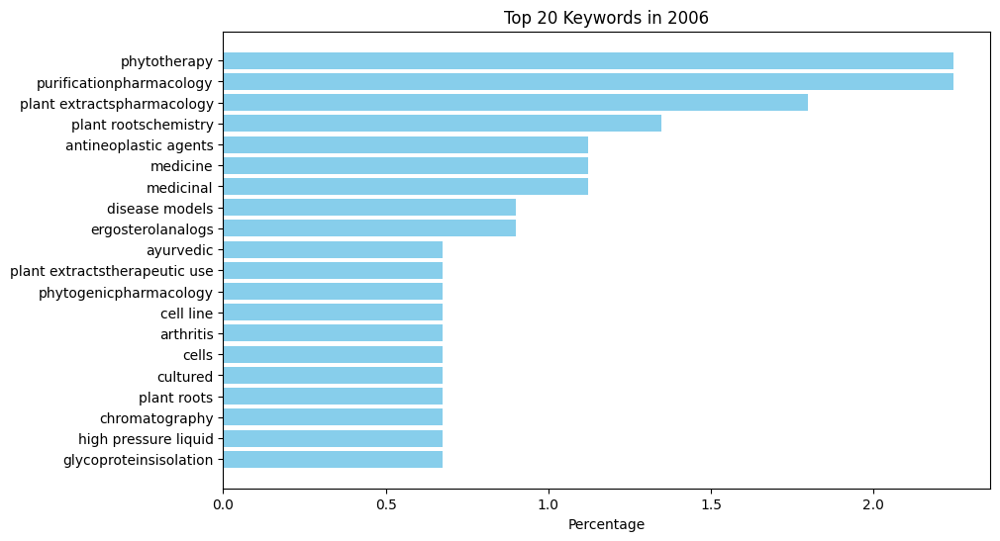


Year: 2007
Most common keywords with counts and percentages:
ergosterolanalogs: 8 (1.95%)
plant rootschemistry: 7 (1.71%)
phytotherapy: 7 (1.71%)
plant extractspharmacology: 7 (1.71%)
india: 5 (1.22%)
developmentmicrobiology: 5 (1.22%)
medicine: 5 (1.22%)
withanolides: 5 (1.22%)
purificationpharmacology: 5 (1.22%)
time factors: 4 (0.98%)
chromatography: 4 (0.98%)
cell line: 4 (0.98%)
medicinal: 4 (0.98%)
dosagepharmacologytherapeutic use: 3 (0.73%)
plant extractschemistry: 3 (0.73%)
dna: 3 (0.73%)
tumor: 3 (0.73%)
derivativespharmacology: 3 (0.73%)
plant extractschemistrypharmacology: 2 (0.49%)
arthritis: 2 (0.49%)
lipid peroxidationdrug effects: 2 (0.49%)
cholesterol: 2 (0.49%)
plant extractspharmacologytherapeutic use: 2 (0.49%)
genes: 2 (0.49%)
polymerase chain reaction: 2 (0.49%)
bacteria: 2 (0.49%)
high pressure liquid: 2 (0.49%)
derivativesmetabolism: 2 (0.49%)
mass spectrometry: 2 (0.49%)
ayurvedic: 2 (0.49%)
receptors: 2 (0.49%)
inbred strains: 2 (0.49%)
amino acid sequence: 2

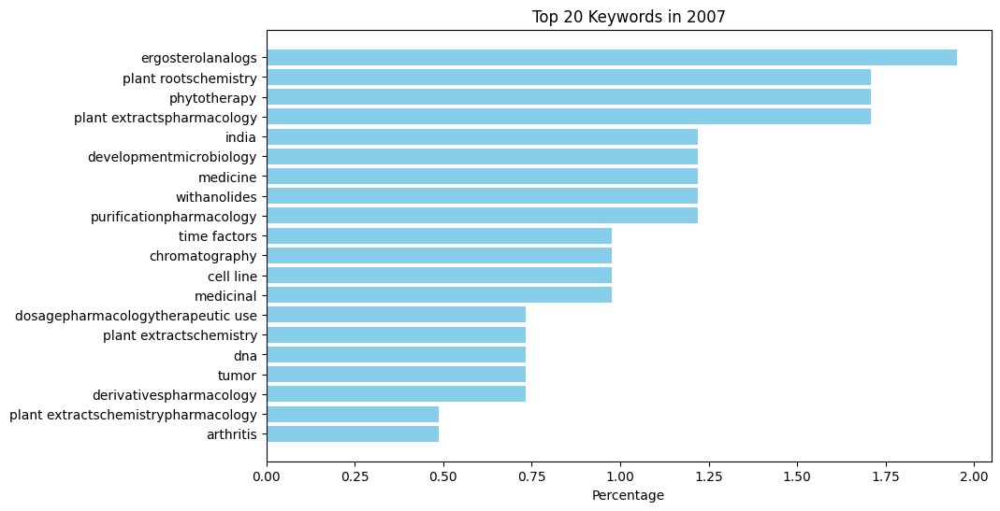


Year: 2008
Most common keywords with counts and percentages:
ergosterolanalogs: 12 (3.45%)
withanolides: 12 (3.45%)
chromatography: 6 (1.72%)
medicine: 6 (1.72%)
purification: 5 (1.44%)
phytotherapy: 5 (1.44%)
ayurvedic: 5 (1.44%)
molecular structure: 4 (1.15%)
plant rootschemistry: 4 (1.15%)
apoptosisdrug effects: 4 (1.15%)
derivativespharmacology: 4 (1.15%)
purificationpharmacology: 3 (0.86%)
protooncogene proteins cbcl2metabolism: 3 (0.86%)
withaniametabolism: 3 (0.86%)
disease models: 3 (0.86%)
doseresponse relationship: 3 (0.86%)
drug: 3 (0.86%)
cell line: 3 (0.86%)
phosphorylation: 3 (0.86%)
antioxidantsmetabolism: 2 (0.57%)
inhibitorstoxicity: 2 (0.57%)
in situ nickend labeling: 2 (0.57%)
cells: 2 (0.57%)
cultured: 2 (0.57%)
derivativesbiosynthesis: 2 (0.57%)
plant rootsmetabolism: 2 (0.57%)
plant shootsmetabolism: 2 (0.57%)
medicinalchemistry: 2 (0.57%)
plant extractstherapeutic use: 2 (0.57%)
plant roots: 2 (0.57%)
thin layer: 2 (0.57%)
reference standards: 2 (0.57%)
high pre

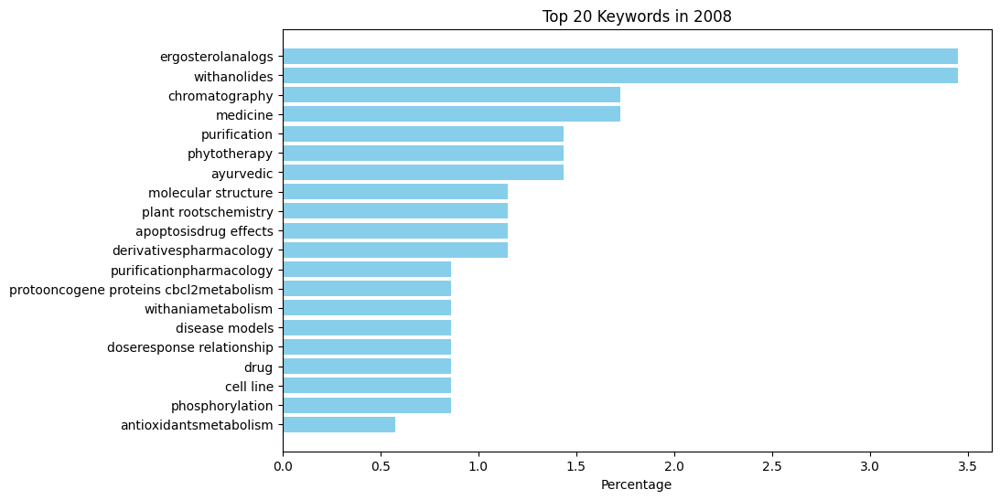


Year: 2009
Most common keywords with counts and percentages:
purificationpharmacology: 10 (2.15%)
phytotherapy: 8 (1.72%)
plant extractstherapeutic use: 8 (1.72%)
ergosterolanalogs: 7 (1.50%)
development: 7 (1.50%)
chromatography: 6 (1.29%)
plant extractspharmacology: 6 (1.29%)
withanolides: 6 (1.29%)
high pressure liquid: 4 (0.86%)
disease models: 4 (0.86%)
plant rootschemistry: 4 (0.86%)
cell line: 4 (0.86%)
molecular structure: 3 (0.64%)
purification: 3 (0.64%)
stress: 3 (0.64%)
plant leaveschemistry: 3 (0.64%)
inbred balb c: 3 (0.64%)
tumor: 3 (0.64%)
cell proliferationdrug effects: 3 (0.64%)
inbred strains: 3 (0.64%)
medicine: 3 (0.64%)
cultured: 3 (0.64%)
analysis of variance: 2 (0.43%)
behavior: 2 (0.43%)
animaldrug effects: 2 (0.43%)
microscopy: 2 (0.43%)
spraguedawley: 2 (0.43%)
time factors: 2 (0.43%)
plant roots: 2 (0.43%)
hippocampusmetabolism: 2 (0.43%)
restraint: 2 (0.43%)
physical: 2 (0.43%)
adult: 2 (0.43%)
thin layer: 2 (0.43%)
genetic: 2 (0.43%)
random amplified poly

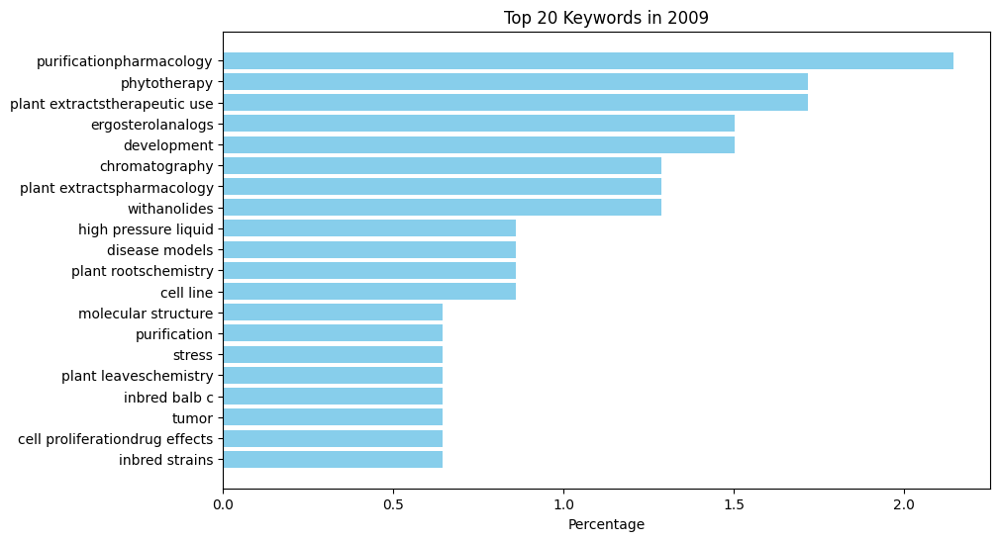


Year: 2010
Most common keywords with counts and percentages:
purificationpharmacology: 7 (1.34%)
medicine: 6 (1.15%)
plant rootschemistry: 5 (0.95%)
ergosterolanalogs: 5 (0.95%)
withanolides: 5 (0.95%)
cultured: 5 (0.95%)
phytotherapy: 5 (0.95%)
chromatography: 4 (0.76%)
ayurvedic: 4 (0.76%)
apoptosisdrug effects: 4 (0.76%)
cell line: 4 (0.76%)
inhibitorsmetabolism: 4 (0.76%)
plant extractsadministration: 3 (0.57%)
dosagepharmacology: 3 (0.57%)
dosage: 3 (0.57%)
plant roots: 3 (0.57%)
dna: 3 (0.57%)
plant extractstherapeutic use: 3 (0.57%)
plant extractspharmacology: 3 (0.57%)
models: 3 (0.57%)
molecular: 3 (0.57%)
antineoplastic agents: 3 (0.57%)
drug screening assays: 3 (0.57%)
antitumor: 3 (0.57%)
tumor cells: 3 (0.57%)
oxidative stressdrug effects: 3 (0.57%)
phosphorylationdrug effects: 3 (0.57%)
india: 3 (0.57%)
tumor: 3 (0.57%)
phytotherapymethods: 2 (0.38%)
treatment outcome: 2 (0.38%)
immunoglobulinsblood: 2 (0.38%)
withaniaimmunology: 2 (0.38%)
high pressure liquid: 2 (0.38%)

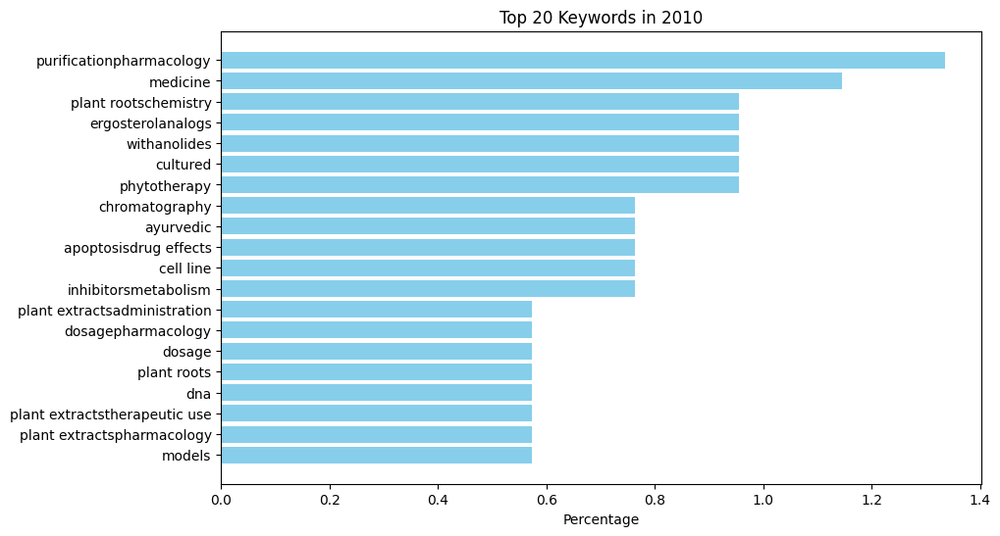


Year: 2011
Most common keywords with counts and percentages:
tumor: 6 (1.12%)
developmentmetabolism: 6 (1.12%)
purification: 6 (1.12%)
withanolidespharmacology: 6 (1.12%)
apoptosisdrug effects: 6 (1.12%)
reactive oxygen speciesmetabolism: 6 (1.12%)
phytotherapy: 5 (0.94%)
cell line: 5 (0.94%)
rna: 5 (0.94%)
inhibitorsmetabolism: 4 (0.75%)
withaniachemistrymetabolism: 3 (0.56%)
doseresponse relationship: 3 (0.56%)
drug: 3 (0.56%)
medicinalchemistry: 3 (0.56%)
cell proliferationdrug effects: 3 (0.56%)
antineoplastic agents: 3 (0.56%)
phytogenicpharmacology: 3 (0.56%)
protooncogene proteins cbcl2metabolism: 3 (0.56%)
messengergenetics: 3 (0.56%)
3dihydrowithaferin a: 2 (0.37%)
principal component analysis: 2 (0.37%)
withaniachemistrygrowth: 2 (0.37%)
india: 2 (0.37%)
plant leaveschemistrymetabolism: 2 (0.37%)
plant rootschemistrymetabolism: 2 (0.37%)
withanolideschemistryisolation: 2 (0.37%)
plant extractschemistrypharmacology: 2 (0.37%)
lipid peroxidationdrug effects: 2 (0.37%)
plant ex

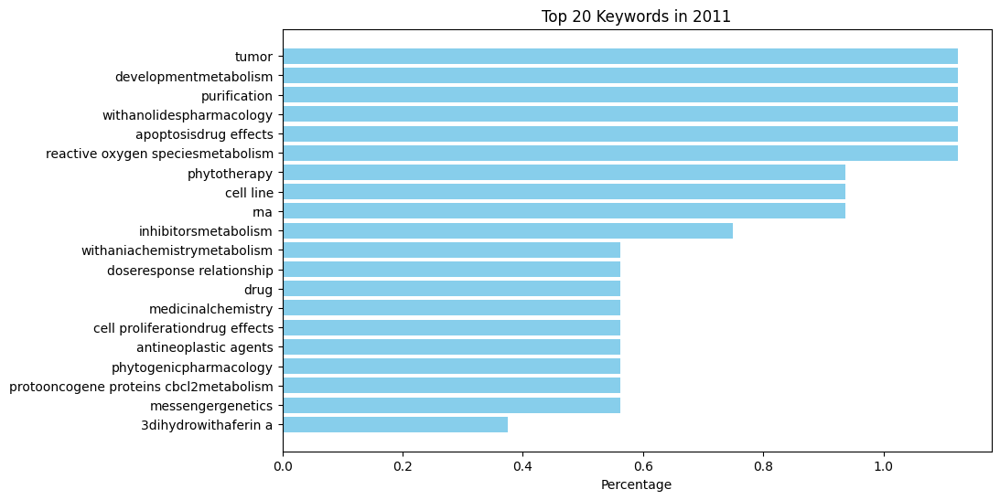


Year: 2012
Most common keywords with counts and percentages:
gene expression regulation: 8 (1.16%)
plant rootschemistry: 7 (1.01%)
purificationpharmacology: 7 (1.01%)
cell line: 7 (1.01%)
developmentmetabolism: 6 (0.87%)
purificationmetabolism: 6 (0.87%)
plant extractspharmacology: 5 (0.72%)
phytotherapy: 5 (0.72%)
withanolidespharmacology: 5 (0.72%)
medicine: 5 (0.72%)
tumor: 5 (0.72%)
purification: 4 (0.58%)
chromatography: 4 (0.58%)
inhibitorsmetabolism: 4 (0.58%)
ayurvedic: 4 (0.58%)
apoptosisdrug effects: 4 (0.58%)
medicinalchemistry: 4 (0.58%)
plant roots: 3 (0.43%)
disease models: 3 (0.43%)
inbred balb c: 3 (0.43%)
india: 3 (0.43%)
superoxide dismutasemetabolism: 3 (0.43%)
receptors: 3 (0.43%)
high pressure liquid: 3 (0.43%)
amino acid sequence: 3 (0.43%)
molecular sequence data: 3 (0.43%)
phylogeny: 3 (0.43%)
dna: 3 (0.43%)
genetic: 3 (0.43%)
withanolidesmetabolism: 3 (0.43%)
inhibitorstoxicity: 3 (0.43%)
withaniagrowth: 3 (0.43%)
molecular: 3 (0.43%)
cell proliferationdrug ef

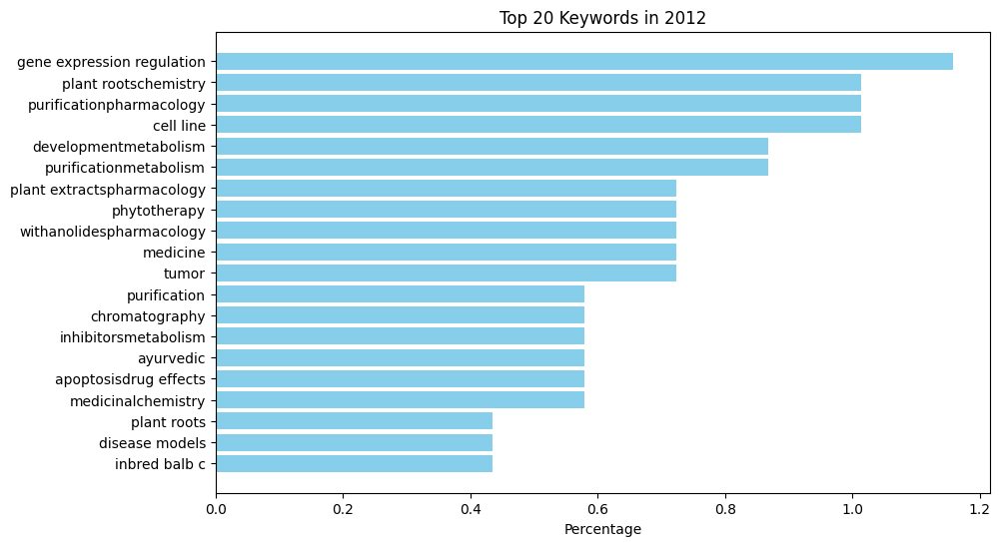


Year: 2013
Most common keywords with counts and percentages:
doseresponse relationship: 10 (1.07%)
drug: 10 (1.07%)
cell line: 10 (1.07%)
plant rootschemistry: 8 (0.85%)
molecular: 8 (0.85%)
gene expression regulation: 8 (0.85%)
phytotherapy: 7 (0.75%)
purificationmetabolism: 7 (0.75%)
chromatography: 7 (0.75%)
purificationpharmacology: 7 (0.75%)
tumor: 7 (0.75%)
receptors: 6 (0.64%)
medicine: 6 (0.64%)
withanolidesmetabolism: 5 (0.53%)
cloning: 5 (0.53%)
phylogeny: 5 (0.53%)
plant extractspharmacology: 5 (0.53%)
ayurvedic: 5 (0.53%)
molecular sequence data: 5 (0.53%)
disease models: 5 (0.53%)
cell proliferationdrug effects: 5 (0.53%)
purification: 5 (0.53%)
withanolidespharmacology: 5 (0.53%)
apoptosisdrug effects: 5 (0.53%)
cells: 4 (0.43%)
cultured: 4 (0.43%)
models: 4 (0.43%)
withaniaenzymologygenetics: 4 (0.43%)
high pressure liquid: 4 (0.43%)
amino acid sequence: 4 (0.43%)
plant extractsadministration: 4 (0.43%)
spraguedawley: 3 (0.32%)
gas chromatographymass spectrometry: 3 (0.

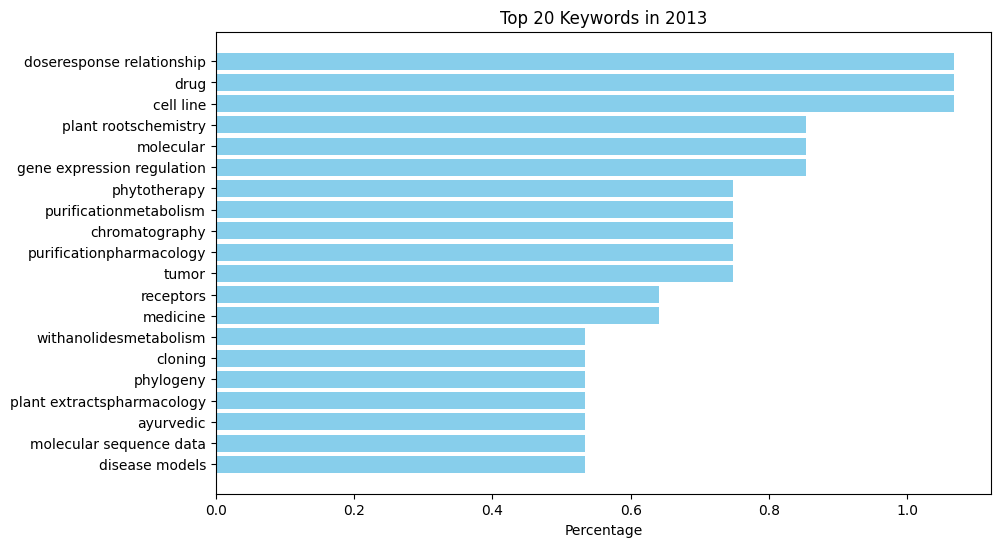


Year: 2014
Most common keywords with counts and percentages:
withaferin a: 7 (0.96%)
purificationpharmacology: 6 (0.82%)
phytotherapy: 5 (0.68%)
glutathione: 5 (0.68%)
doseresponse relationship: 5 (0.68%)
drug: 5 (0.68%)
gene expression regulation: 5 (0.68%)
plant extractspharmacology: 4 (0.55%)
oxidative stress: 4 (0.55%)
apoptosisdrug effects: 4 (0.55%)
base sequence: 4 (0.55%)
oxidative stressdrug effects: 4 (0.55%)
plant extractsadministration: 4 (0.55%)
dosageisolation: 4 (0.55%)
apoptosis: 4 (0.55%)
medicine: 3 (0.41%)
ayurvedic: 3 (0.41%)
antioxidant: 3 (0.41%)
bromobenzene: 3 (0.41%)
lipid peroxidation: 3 (0.41%)
reactive oxygen species: 3 (0.41%)
larvadrug effects: 3 (0.41%)
chromatography: 3 (0.41%)
dosagepharmacology: 3 (0.41%)
receptors: 3 (0.41%)
flavonoids: 3 (0.41%)
plant extractschemistrypharmacology: 3 (0.41%)
plant leaveschemistry: 3 (0.41%)
disease models: 3 (0.41%)
molecular sequence data: 3 (0.41%)
phylogeny: 3 (0.41%)
cell line: 3 (0.41%)
molecular structure: 2 (

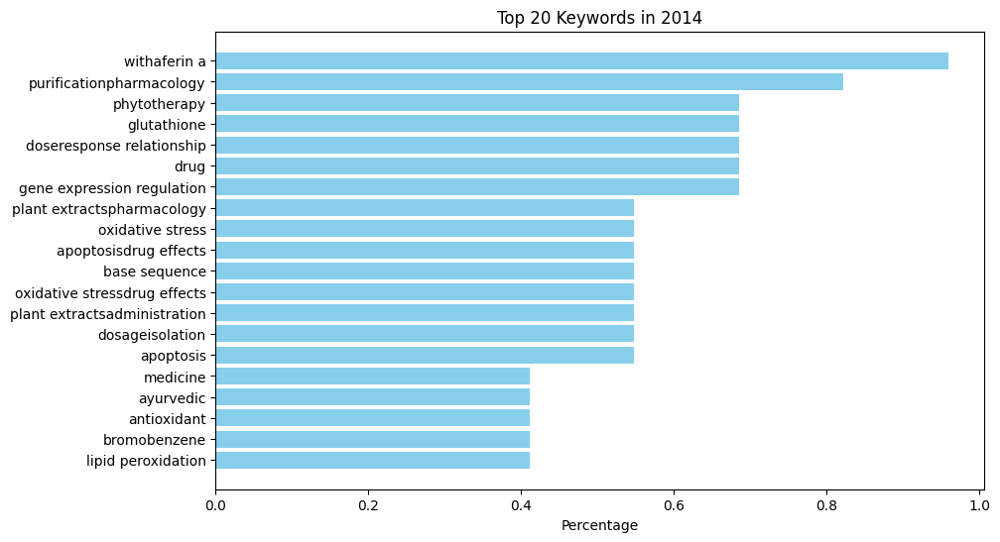


Year: 2015
Most common keywords with counts and percentages:
withaferin a: 11 (1.69%)
withanolides: 10 (1.54%)
cell line: 6 (0.92%)
tumor: 5 (0.77%)
apoptosis: 5 (0.77%)
chromatography: 5 (0.77%)
development: 5 (0.77%)
receptors: 4 (0.62%)
rna: 4 (0.62%)
withaniageneticsmetabolism: 4 (0.62%)
cancer: 3 (0.46%)
cell survivaldrug effects: 3 (0.46%)
phytotherapy: 3 (0.46%)
plant extractspharmacologytherapeutic use: 3 (0.46%)
purificationpharmacology: 3 (0.46%)
molecular docking simulation: 3 (0.46%)
withanolidespharmacology: 3 (0.46%)
withanolidesmetabolism: 3 (0.46%)
oxidative stressdrug effects: 3 (0.46%)
inflammatory: 2 (0.31%)
parkinson's disease: 2 (0.31%)
secondary metabolites: 2 (0.31%)
plant roots: 2 (0.31%)
testosterone: 2 (0.31%)
breast cancer: 2 (0.31%)
medicinal plant: 2 (0.31%)
inhibitorsmetabolism: 2 (0.31%)
herbal: 2 (0.31%)
creactive proteinmetabolism: 2 (0.31%)
ligands: 2 (0.31%)
oxidative stress: 2 (0.31%)
gene expression: 2 (0.31%)
sonication: 2 (0.31%)
withaniagrowth: 

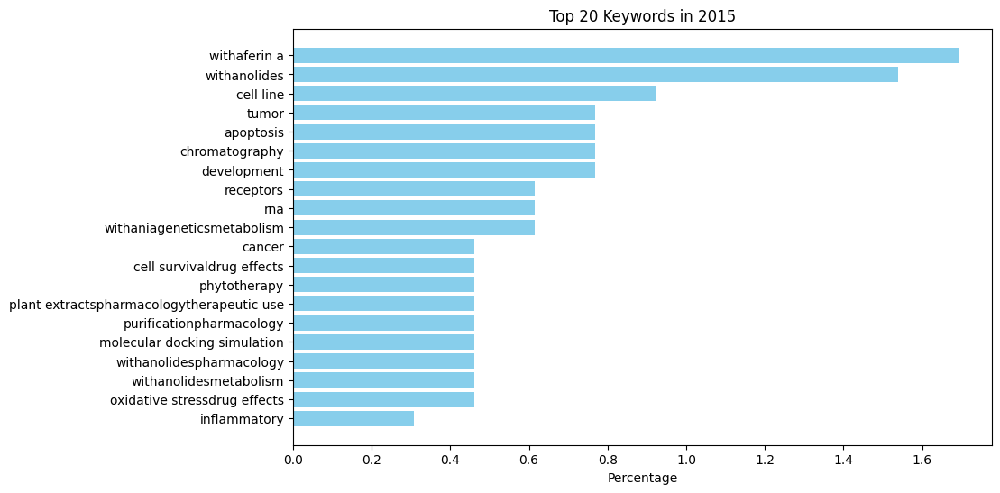


Year: 2016
Most common keywords with counts and percentages:
withaferin a: 11 (2.06%)
plant extractspharmacology: 4 (0.75%)
preclinical: 4 (0.75%)
ayurveda: 3 (0.56%)
cancer: 3 (0.56%)
phytotherapy: 3 (0.56%)
withanolides: 3 (0.56%)
apoptosis: 3 (0.56%)
glutathionemetabolism: 3 (0.56%)
lipid peroxidationdrug effects: 3 (0.56%)
plant extractschemistrypharmacology: 3 (0.56%)
withanolide a: 3 (0.56%)
chromatography: 3 (0.56%)
plant rootschemistry: 3 (0.56%)
drug evaluation: 3 (0.56%)
cell line: 3 (0.56%)
tumor: 3 (0.56%)
dosage: 3 (0.56%)
purificationpharmacologytherapeutic use: 2 (0.37%)
anticancer: 2 (0.37%)
oxidative stress: 2 (0.37%)
secondary metabolites: 2 (0.37%)
plant leaveschemistry: 2 (0.37%)
antioxidant: 2 (0.37%)
biosynthetic pathwaysgenetics: 2 (0.37%)
gene expression regulation: 2 (0.37%)
genetically modified: 2 (0.37%)
withanolidesmetabolism: 2 (0.37%)
testosterone: 2 (0.37%)
mucuna pruriens: 2 (0.37%)
ischemia: 2 (0.37%)
stroke: 2 (0.37%)
fertility: 2 (0.37%)
nrf2: 2 (0.3

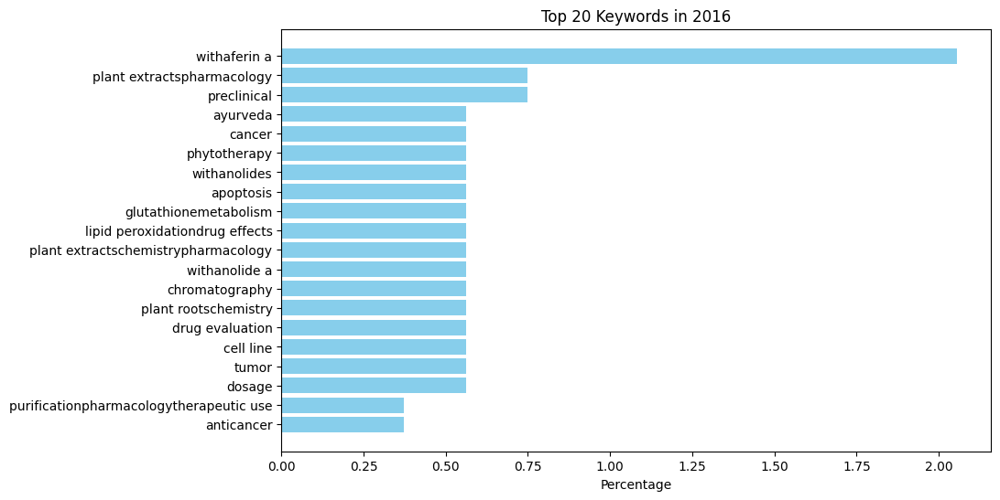


Year: 2017
Most common keywords with counts and percentages:
withanolides: 8 (1.59%)
apoptosis: 6 (1.20%)
withaferin a: 4 (0.80%)
oxidative stress: 4 (0.80%)
neuroprotection: 3 (0.60%)
gene expression regulation: 3 (0.60%)
development: 3 (0.60%)
reactive oxygen speciesmetabolism: 3 (0.60%)
molecular: 3 (0.60%)
cell line: 3 (0.60%)
tumor: 3 (0.60%)
cognition: 2 (0.40%)
ayurveda: 2 (0.40%)
anticancer: 2 (0.40%)
immunomodulation: 2 (0.40%)
oxidative stressdrug effects: 2 (0.40%)
plant rootschemistry: 2 (0.40%)
inflammatory cytokines: 2 (0.40%)
neuroinflammation: 2 (0.40%)
sleep deprivation: 2 (0.40%)
ros: 2 (0.40%)
nfkappab: 2 (0.40%)
acetylcholinesterase: 2 (0.40%)
inbred c57bl: 2 (0.40%)
proliferation: 2 (0.40%)
tinospora cordifolia: 2 (0.40%)
behavior: 2 (0.40%)
animaldrug effects: 2 (0.40%)
disease models: 2 (0.40%)
plant extractspharmacology: 2 (0.40%)
antioxidants: 2 (0.40%)
secondary metabolites: 2 (0.40%)
chromatography: 2 (0.40%)
gene expression profiling: 2 (0.40%)
genes: 2 (0.

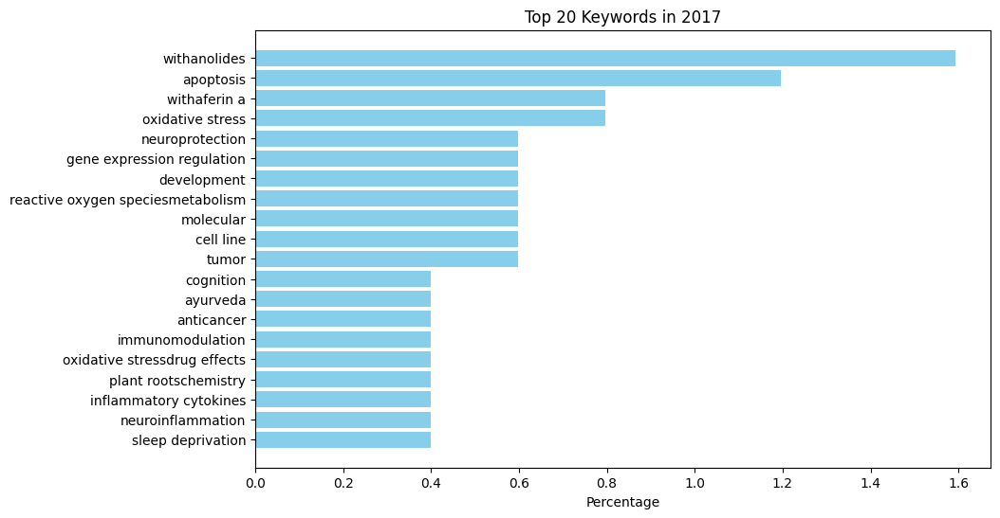


Year: 2018
Most common keywords with counts and percentages:
withaferin a: 7 (1.24%)
oxidative stress: 7 (1.24%)
apoptosis: 5 (0.88%)
withanolides: 4 (0.71%)
male infertility: 3 (0.53%)
traditional medicine: 3 (0.53%)
antioxidant: 3 (0.53%)
withanolide a: 3 (0.53%)
development: 3 (0.53%)
inflammation: 3 (0.53%)
withanolide: 2 (0.35%)
withanone: 2 (0.35%)
bacillus amyloliquefaciens: 2 (0.35%)
pseudomonas fluorescens: 2 (0.35%)
endophytes: 2 (0.35%)
medicinal plants: 2 (0.35%)
purification: 2 (0.35%)
adolescent: 2 (0.35%)
adult: 2 (0.35%)
aged: 2 (0.35%)
doubleblind method: 2 (0.35%)
middle aged: 2 (0.35%)
young adult: 2 (0.35%)
alzheimer's disease: 2 (0.35%)
centella asiatica: 2 (0.35%)
biomass: 2 (0.35%)
photosynthesis: 2 (0.35%)
withanolidesmetabolism: 2 (0.35%)
gene expression regulation: 2 (0.35%)
histologygeneticsgrowth: 2 (0.35%)
cytotoxicity: 2 (0.35%)
phytomedicine: 2 (0.35%)
cancer: 2 (0.35%)
developmentmetabolism: 2 (0.35%)
stress: 2 (0.35%)
pathway analysis: 2 (0.35%)
pubche

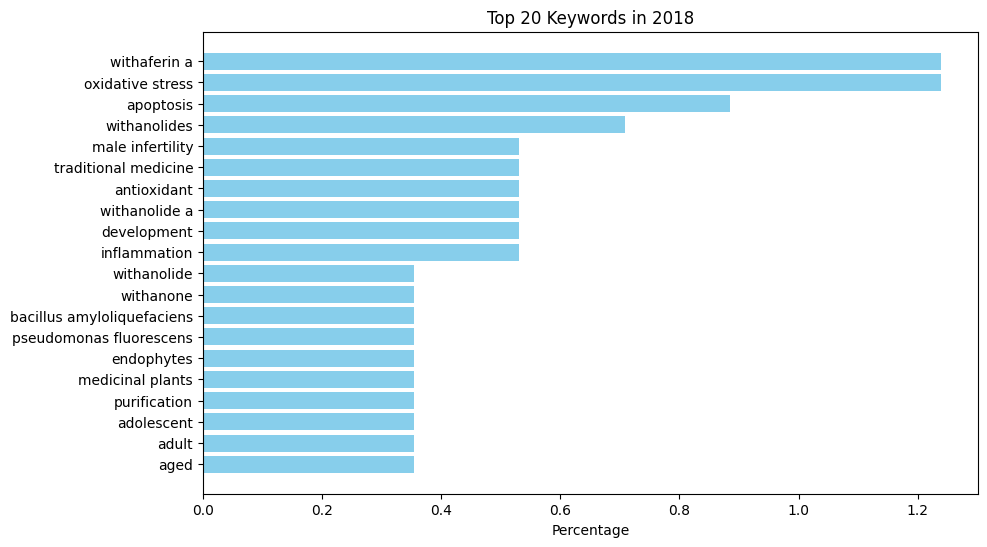


Year: 2019
Most common keywords with counts and percentages:
withaferin a: 14 (3.45%)
oxidative stress: 6 (1.48%)
withanolides: 5 (1.23%)
medicinal plants: 4 (0.99%)
endophyte: 3 (0.74%)
cell line: 3 (0.74%)
inflammation: 3 (0.74%)
withanolide a: 3 (0.74%)
apoptosis: 3 (0.74%)
alzheimer's disease: 3 (0.74%)
testosterone: 2 (0.49%)
tumor: 2 (0.49%)
molecular structure: 2 (0.49%)
plant rootschemistry: 2 (0.49%)
plant extractspharmacology: 2 (0.49%)
neuroprotection: 2 (0.49%)
reactive oxygen species: 2 (0.49%)
adult: 2 (0.49%)
doubleblind method: 2 (0.49%)
treatment outcome: 2 (0.49%)
stress: 2 (0.49%)
inbred c57bl: 2 (0.49%)
chemoprevention: 2 (0.49%)
breast cancer: 2 (0.49%)
adaptogen: 2 (0.49%)
ethnobotany: 2 (0.49%)
anxiety: 2 (0.49%)
dhea: 1 (0.25%)
energy: 1 (0.25%)
fatigue: 1 (0.25%)
herbal: 1 (0.25%)
hormones: 1 (0.25%)
cancer: 1 (0.25%)
mechanism of action: 1 (0.25%)
learning: 1 (0.25%)
memory: 1 (0.25%)
ptsd: 1 (0.25%)
withania somnifera root: 1 (0.25%)
ascospores: 1 (0.25%)
co

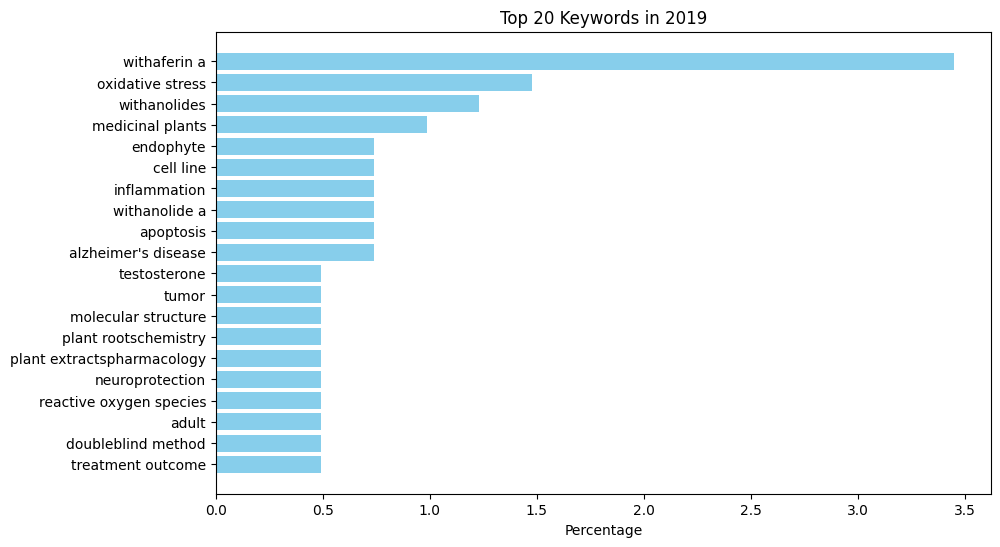


Year: 2020
Most common keywords with counts and percentages:
withaferin a: 13 (2.28%)
withanolides: 5 (0.88%)
stress: 4 (0.70%)
chromatography: 4 (0.70%)
alzheimer's disease: 3 (0.53%)
neuroprotection: 3 (0.53%)
parkinson's disease: 3 (0.53%)
withanolidea: 3 (0.53%)
inflammation: 3 (0.53%)
limit of detection: 3 (0.53%)
apoptosis: 3 (0.53%)
cancer: 3 (0.53%)
sarscov2: 2 (0.35%)
clinical trials: 2 (0.35%)
acetylcoa carboxylase 1: 2 (0.35%)
atp citrate lyase: 2 (0.35%)
fatty acid synthase: 2 (0.35%)
cell line: 2 (0.35%)
tumor: 2 (0.35%)
disease models: 2 (0.35%)
withanolidespharmacologytherapeutic use: 2 (0.35%)
modified multiple platform method: 2 (0.35%)
sleep deprivation: 2 (0.35%)
sd: 2 (0.35%)
secondary metabolism: 2 (0.35%)
gene expression regulation: 2 (0.35%)
rna: 2 (0.35%)
withaniageneticsmetabolism: 2 (0.35%)
cell proliferation: 2 (0.35%)
microscopy: 2 (0.35%)
electron: 2 (0.35%)
scanning: 2 (0.35%)
nanoparticles: 2 (0.35%)
anticancer: 2 (0.35%)
green synthesis: 2 (0.35%)
molec

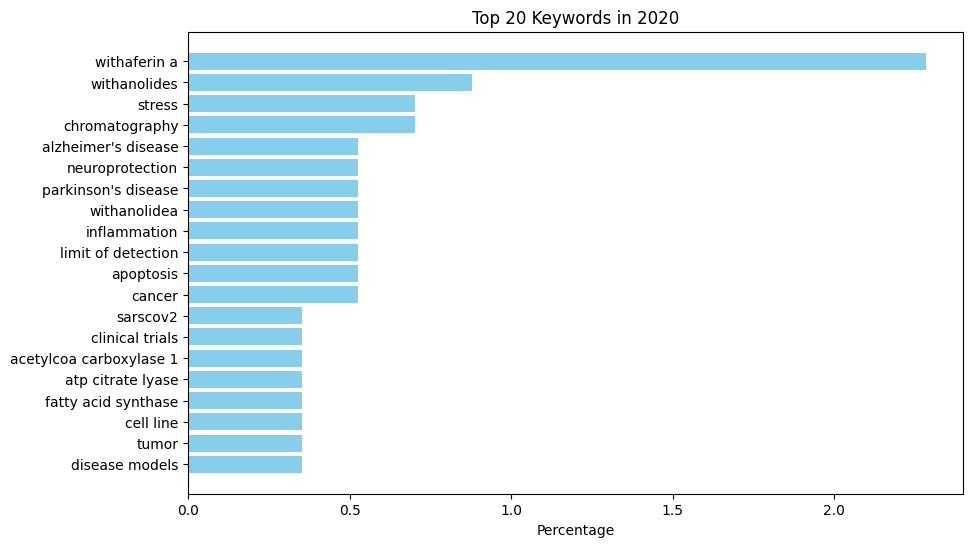


Year: 2021
Most common keywords with counts and percentages:
sarscov2: 11 (1.31%)
ayurveda: 8 (0.95%)
withaferin a: 8 (0.95%)
covid19: 8 (0.95%)
phytochemicals: 7 (0.84%)
withanone: 6 (0.72%)
anxiety: 5 (0.60%)
molecular docking: 5 (0.60%)
molecular dynamics: 5 (0.60%)
withaferina: 5 (0.60%)
insomnia: 4 (0.48%)
stress: 4 (0.48%)
solanaceae: 4 (0.48%)
apoptosis: 4 (0.48%)
md simulation: 4 (0.48%)
antioxidants: 4 (0.48%)
oxidative stress: 4 (0.48%)
herbal medicine: 4 (0.48%)
withanolidespharmacology: 4 (0.48%)
withanolides: 3 (0.36%)
inflammation: 3 (0.36%)
traditional medicine: 3 (0.36%)
anticancer: 3 (0.36%)
parkinson's disease: 3 (0.36%)
india: 3 (0.36%)
antiviral: 3 (0.36%)
safety: 3 (0.36%)
alzheimer's disease: 3 (0.36%)
medicinal plants: 3 (0.36%)
cognitive function: 3 (0.36%)
depression: 2 (0.24%)
ethnobotany: 2 (0.24%)
phytochemistry: 2 (0.24%)
immunomodulation: 2 (0.24%)
neuroprotective: 2 (0.24%)
withanolide: 2 (0.24%)
aphrodisiac: 2 (0.24%)
ethnomedicine: 2 (0.24%)
triplenega

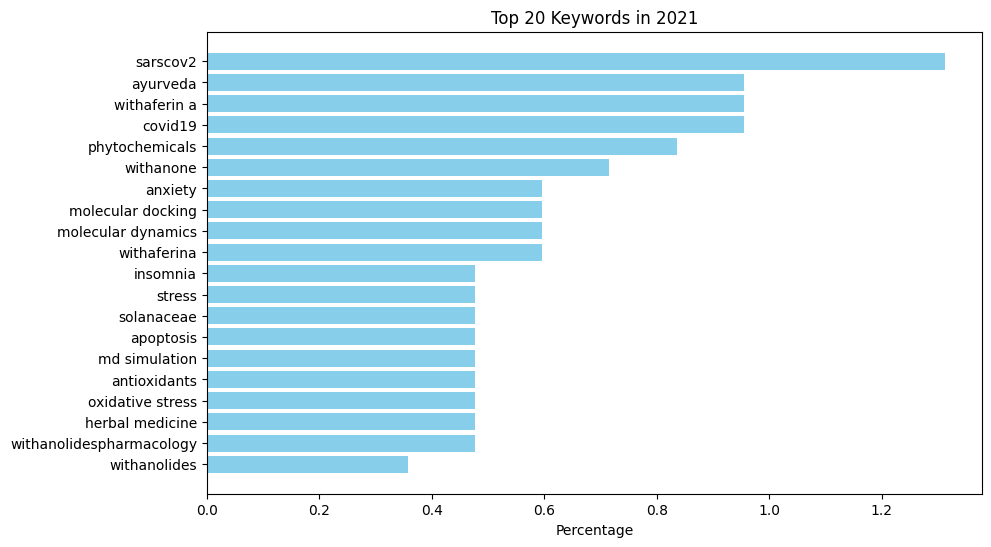


Year: 2022
Most common keywords with counts and percentages:
withanolides: 12 (1.80%)
withaferin a: 9 (1.35%)
covid19: 9 (1.35%)
ayurveda: 6 (0.90%)
alzheimer's disease: 5 (0.75%)
sarscov2: 5 (0.75%)
apoptosis: 5 (0.75%)
cognition: 5 (0.75%)
oxidative stress: 5 (0.75%)
medicinal plants: 5 (0.75%)
molecular docking: 4 (0.60%)
plant extracts: 4 (0.60%)
withanolide: 4 (0.60%)
sleep: 4 (0.60%)
phytotherapy: 4 (0.60%)
cancer: 3 (0.45%)
stress: 3 (0.45%)
hplc: 3 (0.45%)
withanolide glycosides: 3 (0.45%)
medicinal: 3 (0.45%)
phytochemicals: 3 (0.45%)
breast cancer: 3 (0.45%)
inflammation: 3 (0.45%)
phytochemical: 3 (0.45%)
testosterone: 3 (0.45%)
molecular targets: 2 (0.30%)
antioxidant: 2 (0.30%)
viral: 2 (0.30%)
cancer treatment: 2 (0.30%)
medicine: 2 (0.30%)
ayurvedic: 2 (0.30%)
neurodegeneration: 2 (0.30%)
docking: 2 (0.30%)
hypericum perforatum: 2 (0.30%)
panax ginseng: 2 (0.30%)
molecular dynamics simulation: 2 (0.30%)
lcmsms: 2 (0.30%)
lung neoplasms: 2 (0.30%)
admet: 2 (0.30%)
pharma

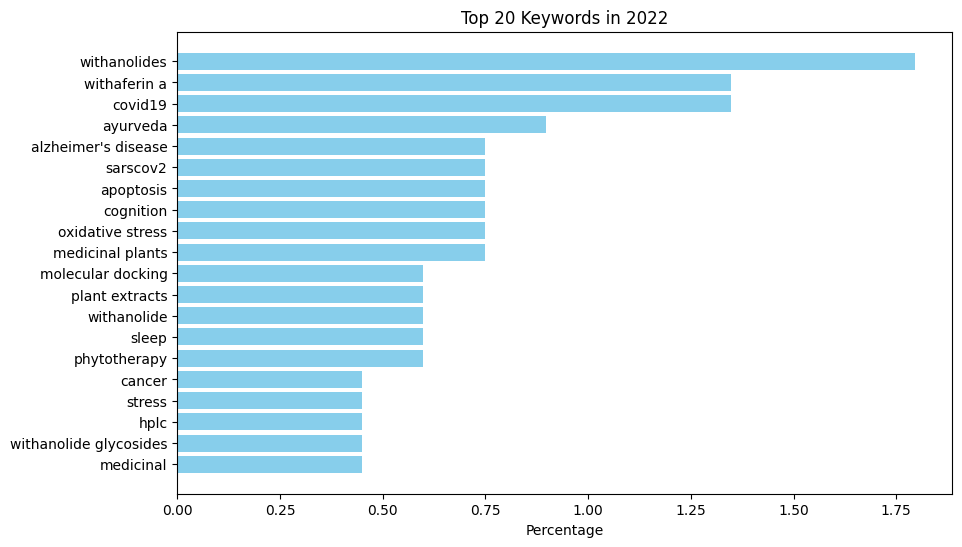


Year: 2023
Most common keywords with counts and percentages:
withaferin a: 10 (1.62%)
withanolides: 9 (1.46%)
molecular docking: 8 (1.29%)
cancer: 5 (0.81%)
covid19: 5 (0.81%)
sarscov2: 5 (0.81%)
inflammation: 5 (0.81%)
withanolide: 4 (0.65%)
apoptosis: 4 (0.65%)
ayurveda: 4 (0.65%)
alzheimer's disease: 4 (0.65%)
molecular dynamics: 4 (0.65%)
phytochemistry: 3 (0.49%)
neuroprotection: 3 (0.49%)
ftir: 3 (0.49%)
alkaloids: 3 (0.49%)
tuberculosis: 3 (0.49%)
phytochemicals: 3 (0.49%)
flavonoids: 3 (0.49%)
parkinson's disease: 3 (0.49%)
network pharmacology: 3 (0.49%)
stress: 3 (0.49%)
memory: 3 (0.49%)
antimicrobial activity: 2 (0.32%)
herbal medicine: 2 (0.32%)
colorectal cancer: 2 (0.32%)
toxicity: 2 (0.32%)
natural products: 2 (0.32%)
rasayana: 2 (0.32%)
inflammatory: 2 (0.32%)
herbal extracts: 2 (0.32%)
scanning electron microscopy: 2 (0.32%)
medicinal plants: 2 (0.32%)
cytokines: 2 (0.32%)
tinospora cordifolia: 2 (0.32%)
pharmacokinetics: 2 (0.32%)
withanolide a: 2 (0.32%)
microglia:

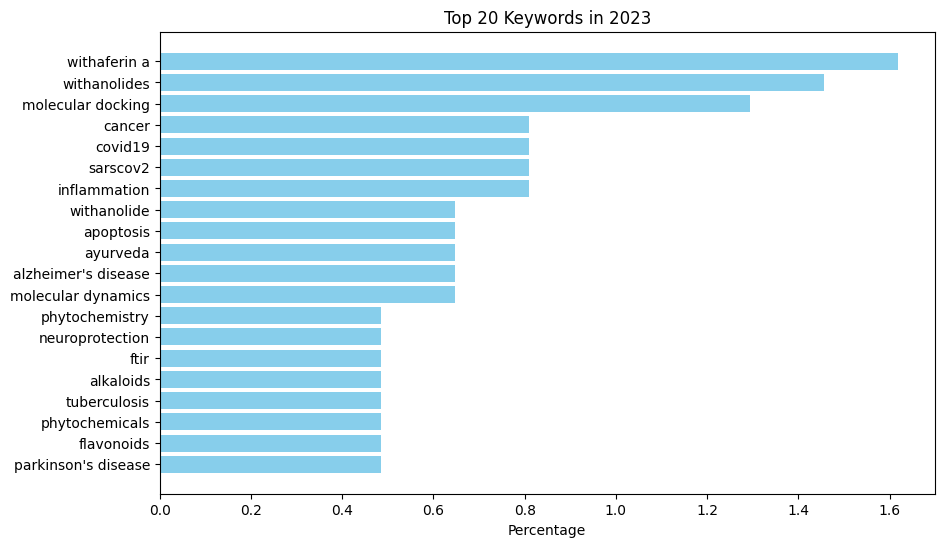


Year: 2024
Most common keywords with counts and percentages:
withaferin a: 11 (2.46%)
withanolides: 9 (2.01%)
inflammation: 6 (1.34%)
medicinal plants: 5 (1.12%)
oxidative stress: 4 (0.89%)
cancer: 4 (0.89%)
ayurveda: 4 (0.89%)
clinical trials: 3 (0.67%)
breast cancer: 3 (0.67%)
gene expression: 3 (0.67%)
phytochemicals: 3 (0.67%)
rheumatoid arthritis: 3 (0.67%)
ethiopia: 3 (0.67%)
alzheimer's disease: 2 (0.45%)
dietary supplements: 2 (0.45%)
testosterone: 2 (0.45%)
apoptosis: 2 (0.45%)
withanone: 2 (0.45%)
aging: 2 (0.45%)
nutraceuticals: 2 (0.45%)
withania somnifera extract: 2 (0.45%)
stress: 2 (0.45%)
cancer treatment: 2 (0.45%)
adaptogen: 2 (0.45%)
randomized clinical trial: 2 (0.45%)
unani medicine: 2 (0.45%)
neurodegeneration: 2 (0.45%)
genotoxicity: 2 (0.45%)
quality of life: 2 (0.45%)
network pharmacology: 2 (0.45%)
als disease: 1 (0.22%)
huntington's disease: 1 (0.22%)
parkinson's disease: 1 (0.22%)
athletes: 1 (0.22%)
creatineblood: 1 (0.22%)
hypogonadismdrug therapyblood: 1

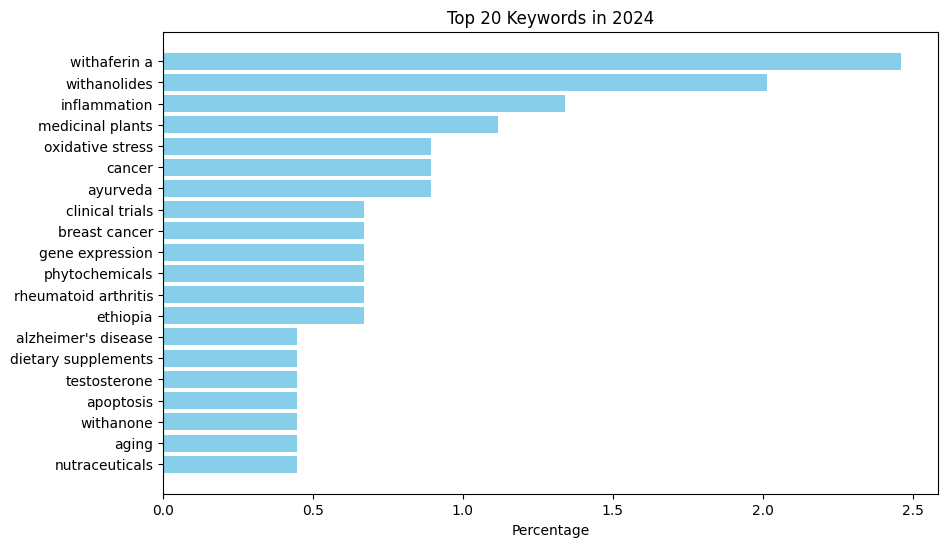

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Define a function to split and clean keywords
def split_and_clean_keywords(keywords):
    return [kw.strip() for kw in keywords.split(', ') if kw.strip()]

# Filter DataFrame for years since 1950
df_filtered = df[df['Date of Publication'] >= 1950]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Process each group
for year, group in grouped_by_year:
    keyword_counts = Counter()
    unique_keywords = set()
    total_keyword_count = 0

    for keywords in group['Cleaned Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)
            # Add filtered keywords to the set of unique keywords
            unique_keywords.update(filtered_keywords)
            # Update total keyword count
            total_keyword_count += len(filtered_keywords)

    print(f"\nYear: {year}")
    print("Most common keywords with counts and percentages:")
    for keyword, count in keyword_counts.most_common():
        percentage = (count / total_keyword_count) * 100
        print(f"{keyword}: {count} ({percentage:.2f}%)")

    unique_keyword_count = len(unique_keywords)
    print(f"Number of unique keywords: {unique_keyword_count}")

    # Visualization
    top_keywords = keyword_counts.most_common(20)
    keywords, counts = zip(*top_keywords)
    percentages = [count / total_keyword_count * 100 for count in counts]

    plt.figure(figsize=(10, 6))
    plt.barh(keywords, percentages, color='skyblue')
    plt.xlabel('Percentage')
    plt.title(f'Top 20 Keywords in {year}')
    plt.gca().invert_yaxis()
    plt.show()

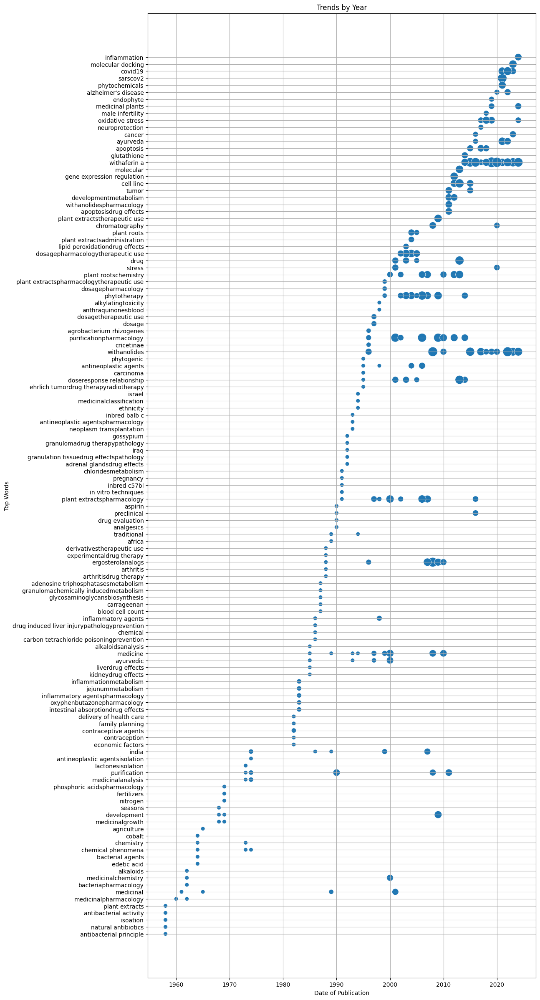

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Initialize lists to store data for plotting
plot_data = []

# Iterate over each year and process the keywords
for year in df['Date of Publication'].unique():
    # Filter rows for the current year
    year_data = df[df['Date of Publication'] == year]

    # Concatenate all keywords into a single string
    all_keywords = ', '.join(year_data['Cleaned Keywords'])

    # Split into words using ', ' and count frequency
    words = all_keywords.split(', ')
    word_counts = Counter(words)

    # Get the top 5 words
    top_words = word_counts.most_common(5)

    # Prepare data for each top word
    for word, count in top_words:
        plot_data.append({'Date of Publication': year, 'Word': word, 'Frequency': count})

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Find the first appearance year of each word
word_first_appearance = plot_df.groupby('Word')['Date of Publication'].min().reset_index()
word_first_appearance = word_first_appearance.sort_values(by='Date of Publication', ascending=False)
word_order = word_first_appearance['Word'].tolist()

# Convert the 'Word' column to a categorical type with the custom order
plot_df['Word'] = pd.Categorical(plot_df['Word'], categories=word_order, ordered=True)

# Plot using Seaborn
plt.figure(figsize=(12, 30))
sns.scatterplot(data=plot_df, x='Date of Publication', y='Word', size='Frequency', sizes=(50, 300), legend=None)

plt.title('Trends by Year')
plt.xlabel('Date of Publication')
plt.ylabel('Top Words')
plt.grid(True)
plt.show()


We can see that after the 80s, trends have completely changed and continue to change over time. So in 2022 and 2023, one of the main research trends was coronavirus.

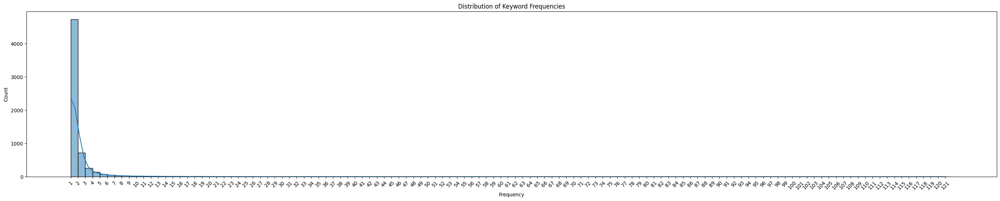

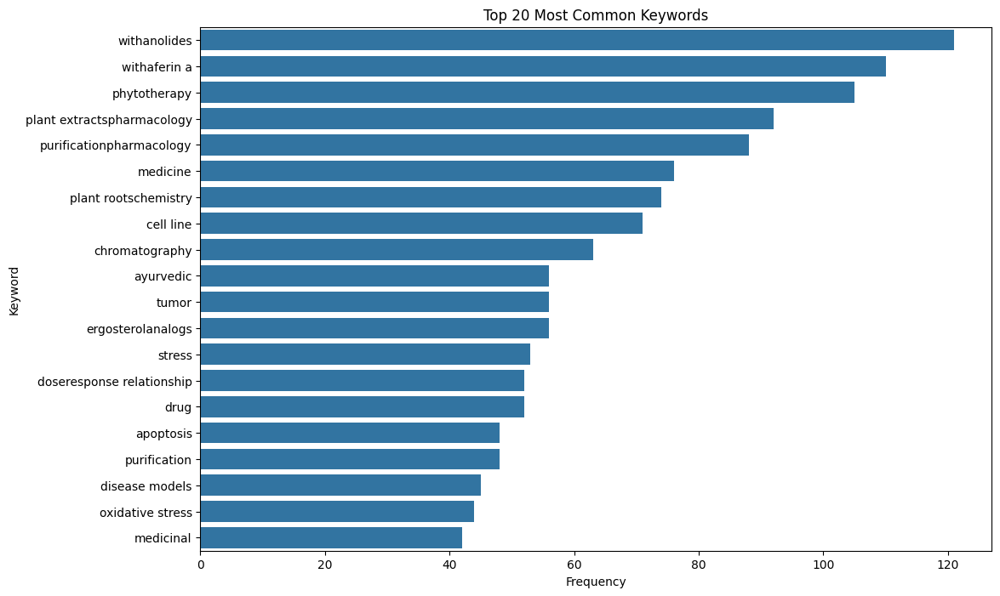

In [ ]:
import seaborn as sns

# Display the most common keywords and their counts
keyword_counts = Counter()
for keywords in df['Cleaned Keywords']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

# Convert keyword counts to a DataFrame
keyword_counts_df = pd.DataFrame(keyword_counts.items(), columns=['Cleaned Keywords', 'Frequency'])

# Plot the distribution of keyword frequencies
plt.figure(figsize=(35, 6))
sns.histplot(keyword_counts_df['Frequency'], bins=range(1, max(keyword_counts_df['Frequency']) + 2), kde=True)

# Customize x-axis
plt.xticks(range(1, max(keyword_counts_df['Frequency']) + 1), rotation=45)

# Add titles and labels
plt.title('Distribution of Keyword Frequencies')
plt.xlabel('Frequency')
plt.ylabel('Count')

# Show plot
plt.show()

# Visualize the top 20 most common keywords
plt.figure(figsize=(12, 8))
sns.barplot(y=keyword_counts_df.nlargest(20, 'Frequency')['Cleaned Keywords'], x=keyword_counts_df.nlargest(20, 'Frequency')['Frequency'])
plt.title('Top 20 Most Common Keywords')
plt.xlabel('Frequency')
plt.ylabel('Keyword')
plt.show()

an exponential distribution - ?

Number of unique keywords with count > 1: 1448


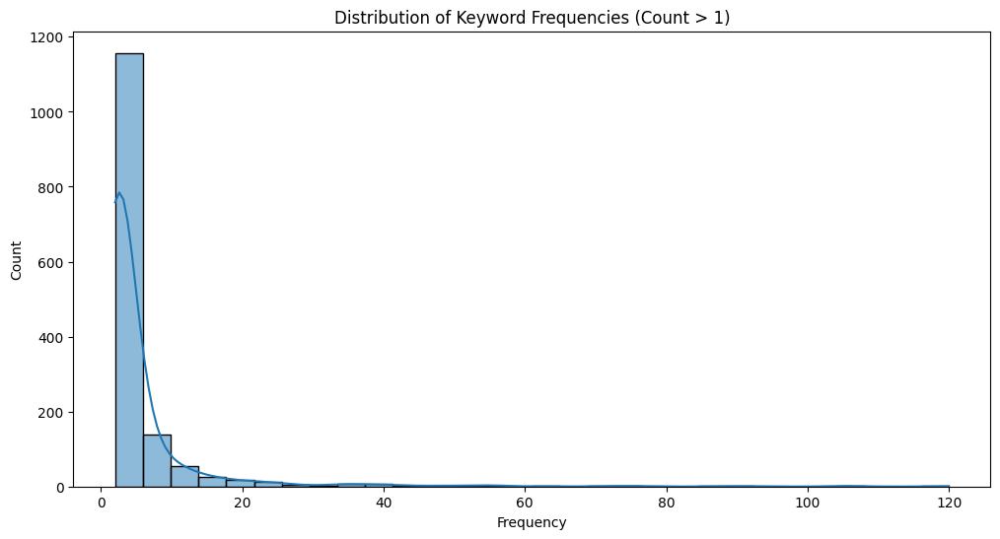

In [ ]:
# # Filter out keywords with count less than 1
# filtered_keyword_counts = {k: v for k, v in keyword_counts.items() if v > 1}

# # Find the amount of unique values
# unique_keyword_count = len(filtered_keyword_counts)
# print(f"Number of unique keywords with count > 1: {unique_keyword_count}")

# # Visualization
# # Convert filtered keyword counts to a DataFrame
# filtered_keyword_counts_df = pd.DataFrame(filtered_keyword_counts.items(), columns=['Keyword', 'Frequency'])

# # Plot the distribution of keyword frequencies
# plt.figure(figsize=(12, 6))
# sns.histplot(filtered_keyword_counts_df['Frequency'], bins=30, kde=True)
# plt.title('Distribution of Keyword Frequencies (Count > 1)')
# plt.xlabel('Frequency')
# plt.ylabel('Count')
# plt.show()



Year: 1996
Keywords with counts more than 1:
withanolides: 5 (6.41%)
agrobacterium rhizogenes: 2 (2.56%)
cricetinae: 2 (2.56%)
ergosterolanalogs: 3 (3.85%)
medicinalchemistry: 2 (2.56%)
antineoplastic agents: 2 (2.56%)
purificationpharmacology: 3 (3.85%)
medicine: 2 (2.56%)
ayurvedic: 2 (2.56%)
List of keywords appearing more than once in 1996:
['withanolides', 'agrobacterium rhizogenes', 'cricetinae', 'ergosterolanalogs', 'medicinalchemistry', 'antineoplastic agents', 'purificationpharmacology', 'medicine', 'ayurvedic']


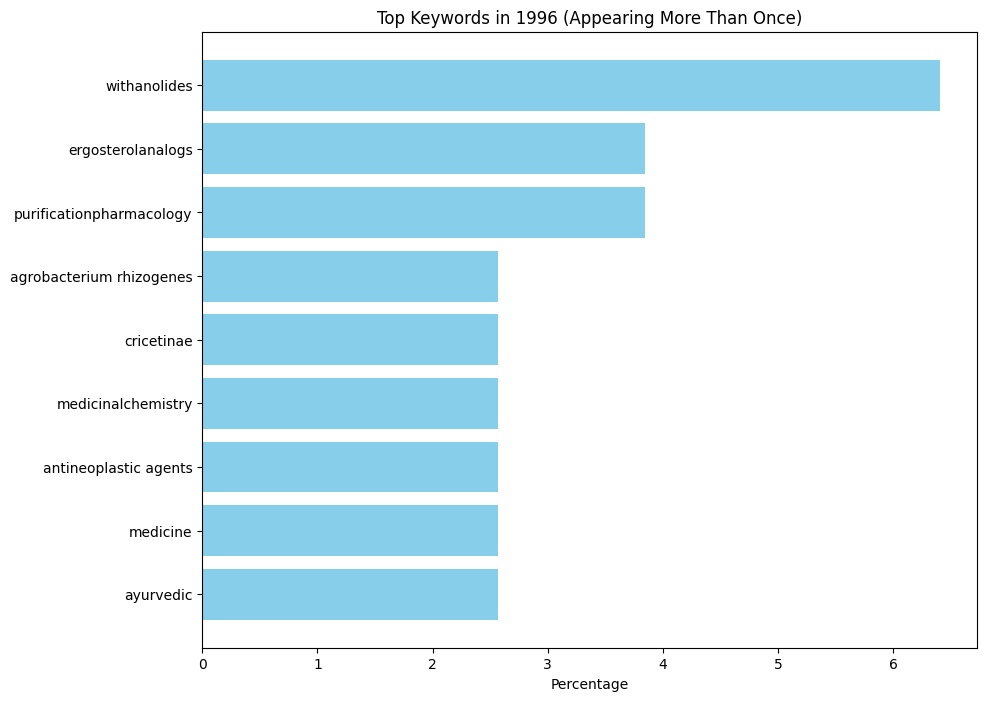


Year: 1997
Keywords with counts more than 1:
medicine: 3 (3.26%)
ayurvedic: 2 (2.17%)
phytotherapy: 2 (2.17%)
plant extractspharmacology: 4 (4.35%)
medicinal: 2 (2.17%)
dosagetoxicity: 2 (2.17%)
dosagetherapeutic use: 3 (3.26%)
dosage: 3 (3.26%)
ergosterolanalogs: 2 (2.17%)
derivativespharmacology: 2 (2.17%)
withanolides: 2 (2.17%)
List of keywords appearing more than once in 1997:
['medicine', 'ayurvedic', 'phytotherapy', 'plant extractspharmacology', 'medicinal', 'dosagetoxicity', 'dosagetherapeutic use', 'dosage', 'ergosterolanalogs', 'derivativespharmacology', 'withanolides']


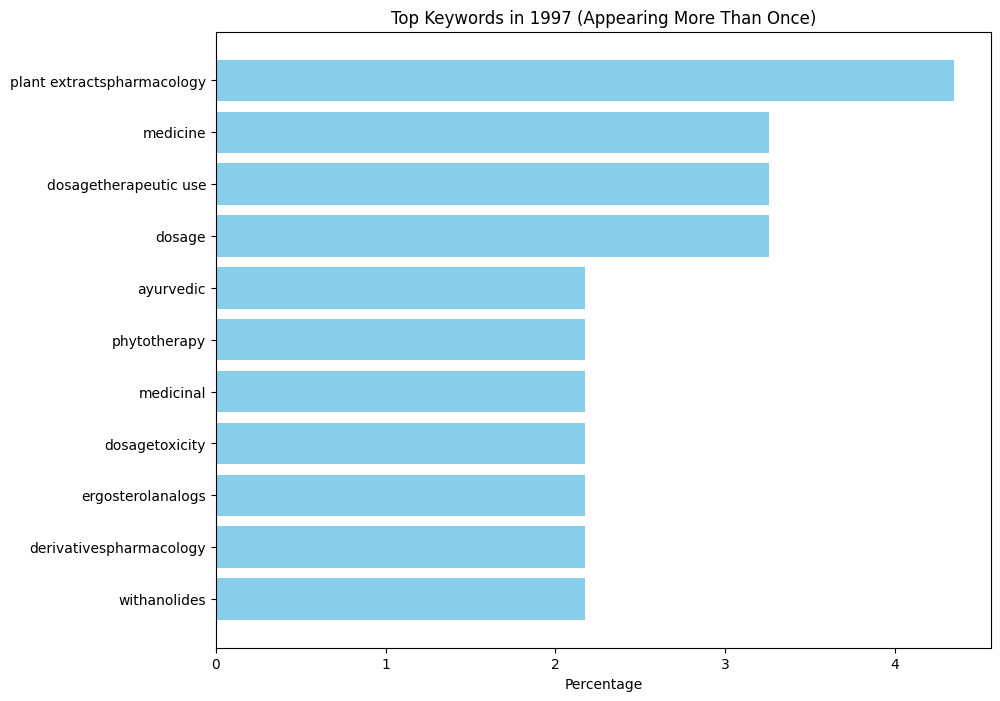


Year: 1998
Keywords with counts more than 1:
plant extractspharmacology: 2 (3.77%)
inflammatory agents: 3 (5.66%)
List of keywords appearing more than once in 1998:
['plant extractspharmacology', 'inflammatory agents']


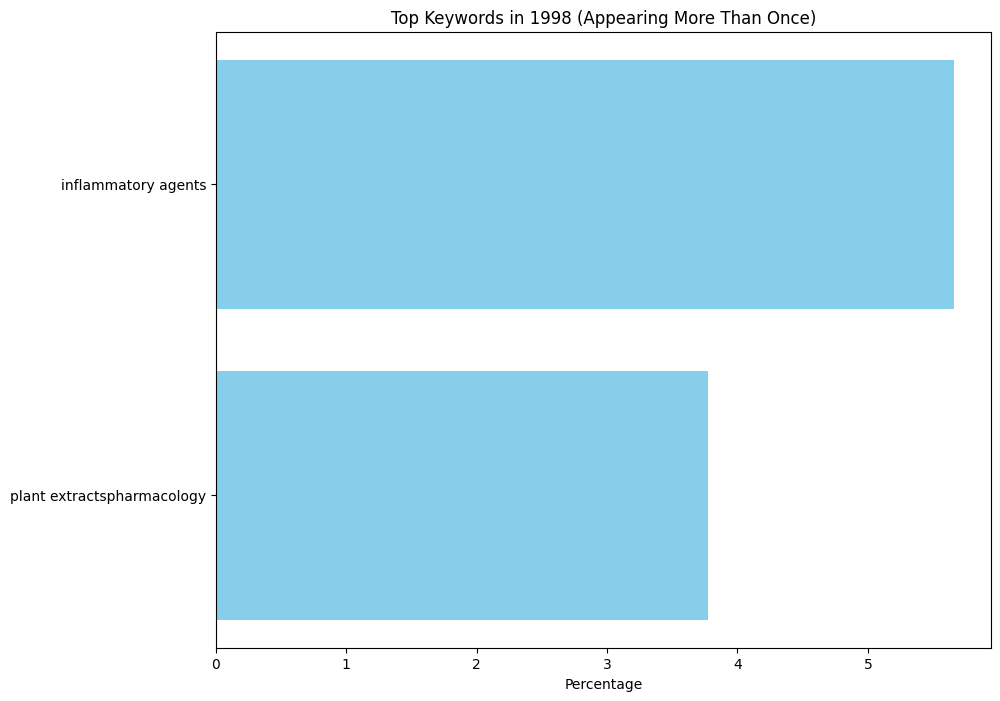


Year: 1999
Keywords with counts more than 1:
india: 3 (4.62%)
medicine: 3 (4.62%)
phytotherapy: 2 (3.08%)
plant extractspharmacologytherapeutic use: 2 (3.08%)
dosagepharmacology: 2 (3.08%)
ayurvedic: 2 (3.08%)
List of keywords appearing more than once in 1999:
['india', 'medicine', 'phytotherapy', 'plant extractspharmacologytherapeutic use', 'dosagepharmacology', 'ayurvedic']


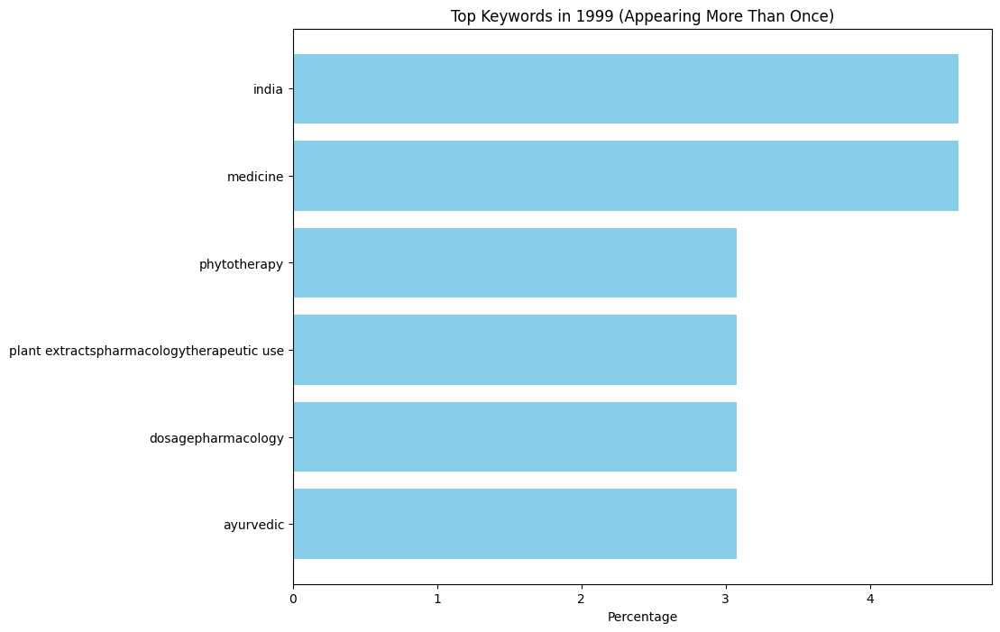


Year: 2000
Keywords with counts more than 1:
india: 3 (1.19%)
organ sizedrug effects: 2 (0.79%)
plant rootschemistry: 4 (1.59%)
medicinalchemistry: 5 (1.98%)
solanaceaechemistry: 3 (1.19%)
chemical: 3 (1.19%)
inflammatory agents: 2 (0.79%)
phytotherapy: 3 (1.19%)
stress: 4 (1.59%)
plant extractspharmacologytherapeutic use: 2 (0.79%)
solanaceaetherapeutic use: 2 (0.79%)
lipid peroxidationdrug effects: 2 (0.79%)
plant extractspharmacology: 8 (3.17%)
administration: 2 (0.79%)
oral: 2 (0.79%)
ergosteroladministration: 2 (0.79%)
dosageanalogs: 2 (0.79%)
plant extractsadministration: 2 (0.79%)
dosagepharmacologytherapeutic use: 3 (1.19%)
medicine: 7 (2.78%)
ayurvedic: 6 (2.38%)
chromatography: 2 (0.79%)
medicinal: 2 (0.79%)
dosagepharmacology: 4 (1.59%)
middle aged: 2 (0.79%)
List of keywords appearing more than once in 2000:
['india', 'organ sizedrug effects', 'plant rootschemistry', 'medicinalchemistry', 'solanaceaechemistry', 'chemical', 'inflammatory agents', 'phytotherapy', 'stress', '

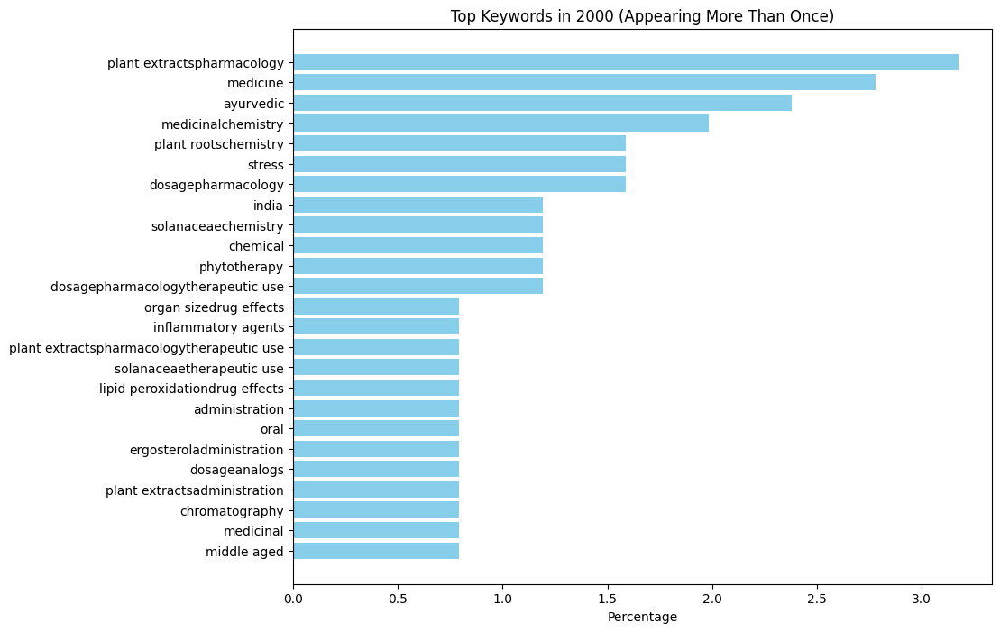


Year: 2001
Keywords with counts more than 1:
glutathione peroxidasemetabolism: 2 (0.76%)
plant extractspharmacology: 4 (1.53%)
solanaceaechemistry: 4 (1.53%)
developmentpathogenicity: 3 (1.15%)
developmentmicrobiology: 2 (0.76%)
stress: 5 (1.91%)
administration: 3 (1.15%)
oral: 3 (1.15%)
dosagepharmacologytherapeutic use: 3 (1.15%)
lipid peroxidationdrug effects: 2 (0.76%)
medicine: 2 (0.76%)
phytotherapy: 4 (1.53%)
plant extractspharmacologytherapeutic use: 3 (1.15%)
medicinal: 5 (1.91%)
solanaceae: 4 (1.53%)
doseresponse relationship: 5 (1.91%)
drug: 5 (1.91%)
stomach ulcerprevention: 2 (0.76%)
physiologicalprevention: 2 (0.76%)
antineoplastic agents: 3 (1.15%)
culture techniques: 2 (0.76%)
ergosterolanalogs: 3 (1.15%)
withanolides: 3 (1.15%)
magnoliopsidachemistry: 2 (0.76%)
development: 3 (1.15%)
purificationpharmacology: 10 (3.82%)
molecular structure: 2 (0.76%)
plant extractsisolation: 2 (0.76%)
india: 4 (1.53%)
plant rootschemistry: 3 (1.15%)
purificationtoxicity: 2 (0.76%)
Lis

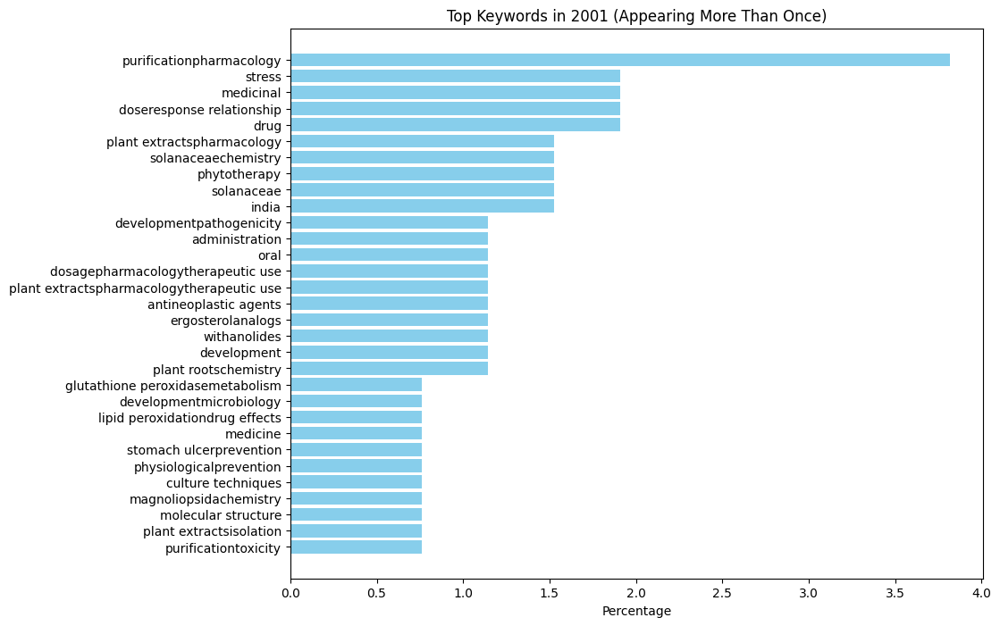


Year: 2002
Keywords with counts more than 1:
disease models: 2 (1.29%)
ergosterolanalogs: 2 (1.29%)
purificationpharmacology: 4 (2.58%)
phytotherapy: 4 (2.58%)
plant rootschemistry: 4 (2.58%)
withanolides: 2 (1.29%)
plant extractsadministration: 2 (1.29%)
dosagepharmacology: 2 (1.29%)
plant roots: 2 (1.29%)
inbred balb c: 2 (1.29%)
plant extractspharmacology: 3 (1.94%)
medicinalchemistry: 2 (1.29%)
lymphocyte activationdrug effects: 2 (1.29%)
tlymphocytesdrug effectsimmunology: 2 (1.29%)
lactoneschemistrypharmacology: 2 (1.29%)
solanaceaechemistry: 2 (1.29%)
carcinoma: 2 (1.29%)
chromatography: 2 (1.29%)
purificationpharmacologytoxicity: 2 (1.29%)
herbal medicine: 2 (1.29%)
stress: 2 (1.29%)
dosagepharmacologytherapeutic use: 5 (3.23%)
List of keywords appearing more than once in 2002:
['disease models', 'ergosterolanalogs', 'purificationpharmacology', 'phytotherapy', 'plant rootschemistry', 'withanolides', 'plant extractsadministration', 'dosagepharmacology', 'plant roots', 'inbred b

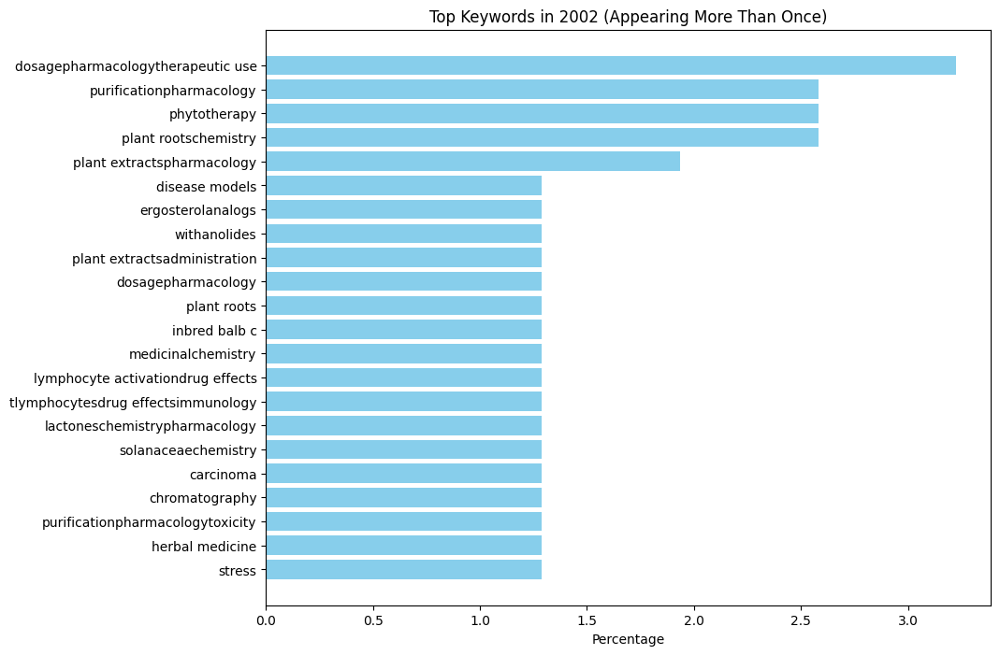


Year: 2003
Keywords with counts more than 1:
doseresponse relationship: 5 (2.39%)
drug: 5 (2.39%)
enzyme inhibitorspharmacology: 2 (0.96%)
inhibitorsmetabolism: 2 (0.96%)
lipid peroxidationdrug effects: 4 (1.91%)
phytotherapy: 7 (3.35%)
plant extractspharmacology: 4 (1.91%)
ergosterolanalogs: 3 (1.44%)
plant extractschemistry: 2 (0.96%)
plant roots: 3 (1.44%)
plant stems: 2 (0.96%)
withanolides: 2 (0.96%)
disease models: 4 (1.91%)
medicine: 2 (0.96%)
ayurvedic: 2 (0.96%)
phytotherapymethods: 2 (0.96%)
stress: 2 (0.96%)
inflammatory agents: 2 (0.96%)
behavior: 2 (0.96%)
animaldrug effects: 2 (0.96%)
plant rootschemistry: 4 (1.91%)
cell line: 2 (0.96%)
plant extractstherapeutic use: 2 (0.96%)
dosagepharmacologytherapeutic use: 8 (3.83%)
ocimum: 2 (0.96%)
plant extractsadministration: 2 (0.96%)
inhibitorstoxicity: 2 (0.96%)
purificationpharmacology: 2 (0.96%)
List of keywords appearing more than once in 2003:
['doseresponse relationship', 'drug', 'enzyme inhibitorspharmacology', 'inhibit

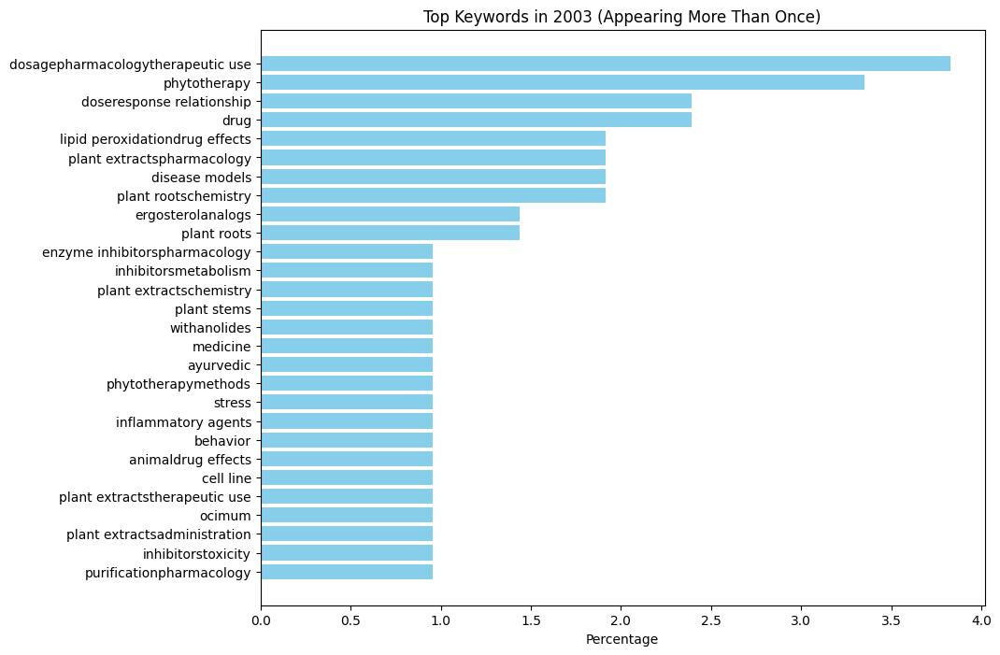


Year: 2004
Keywords with counts more than 1:
phytotherapy: 7 (3.43%)
plant roots: 5 (2.45%)
plant extractstherapeutic use: 2 (0.98%)
plant rootschemistry: 3 (1.47%)
ventricular pressuredrug effects: 2 (0.98%)
vitamin epharmacology: 2 (0.98%)
purificationpharmacology: 3 (1.47%)
dosagepharmacologytherapeutic use: 8 (3.92%)
dosagepharmacology: 2 (0.98%)
plant extractsadministration: 4 (1.96%)
adjuvants: 2 (0.98%)
antineoplastic agents: 4 (1.96%)
plant extractspharmacology: 3 (1.47%)
chromatography: 2 (0.98%)
ergosterolanalogs: 2 (0.98%)
phytogenicadministration: 2 (0.98%)
experimentaldrug therapypathology: 2 (0.98%)
cell line: 3 (1.47%)
tumor: 3 (1.47%)
inbred c57bl: 2 (0.98%)
List of keywords appearing more than once in 2004:
['phytotherapy', 'plant roots', 'plant extractstherapeutic use', 'plant rootschemistry', 'ventricular pressuredrug effects', 'vitamin epharmacology', 'purificationpharmacology', 'dosagepharmacologytherapeutic use', 'dosagepharmacology', 'plant extractsadministratio

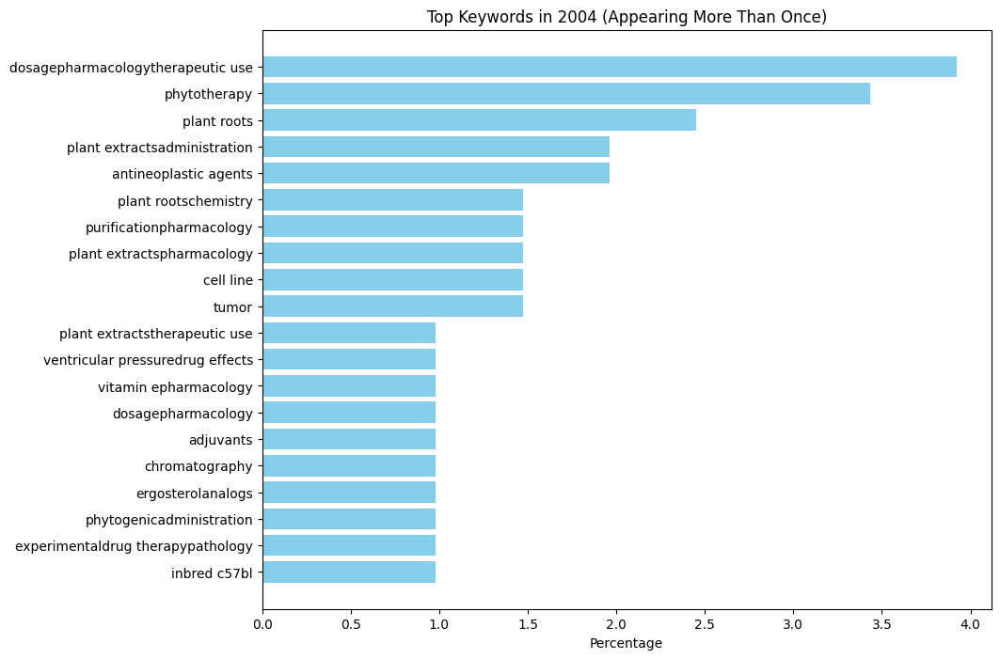


Year: 2005
Keywords with counts more than 1:
administration: 2 (1.41%)
oral: 2 (1.41%)
dosagepharmacologytherapeutic use: 6 (4.23%)
phytotherapy: 3 (2.11%)
plant extractsadministration: 2 (1.41%)
plant roots: 3 (2.11%)
liverdrug effectsenzymology: 2 (1.41%)
purificationtherapeutic use: 2 (1.41%)
plant extractsisolation: 2 (1.41%)
cells: 2 (1.41%)
cultured: 2 (1.41%)
doseresponse relationship: 3 (2.11%)
drug: 3 (2.11%)
models: 3 (2.11%)
List of keywords appearing more than once in 2005:
['administration', 'oral', 'dosagepharmacologytherapeutic use', 'phytotherapy', 'plant extractsadministration', 'plant roots', 'liverdrug effectsenzymology', 'purificationtherapeutic use', 'plant extractsisolation', 'cells', 'cultured', 'doseresponse relationship', 'drug', 'models']


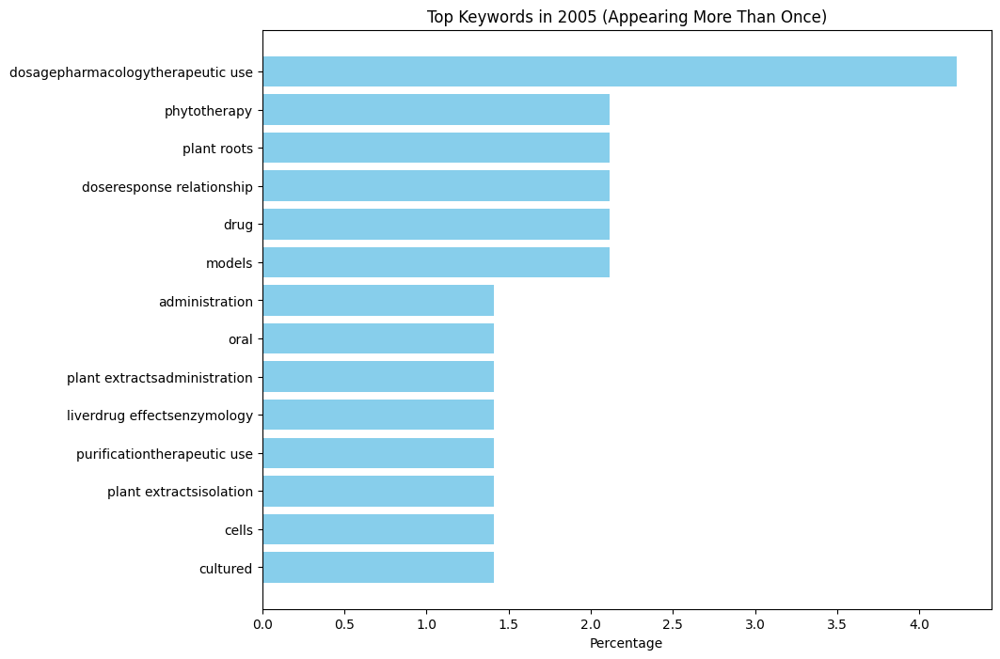


Year: 2006
Keywords with counts more than 1:
antineoplastic agents: 5 (1.12%)
medicine: 5 (1.12%)
ayurvedic: 3 (0.67%)
phytotherapy: 10 (2.25%)
plant extractstherapeutic use: 3 (0.67%)
angiogenesis inhibitorspharmacology: 2 (0.45%)
phytogenicpharmacology: 3 (0.67%)
cell line: 3 (0.67%)
tumor: 2 (0.45%)
plant extractspharmacology: 8 (1.80%)
plant rootschemistry: 6 (1.35%)
arthritis: 3 (0.67%)
cells: 3 (0.67%)
cultured: 3 (0.67%)
disease models: 4 (0.90%)
plant extractspharmacologytherapeutic use: 2 (0.45%)
plant roots: 3 (0.67%)
cell proliferationdrug effects: 2 (0.45%)
development: 2 (0.45%)
inbred balb c: 2 (0.45%)
plant extractsisolation: 2 (0.45%)
chromatography: 3 (0.67%)
high pressure liquid: 3 (0.67%)
purificationpharmacology: 10 (2.25%)
elapidae: 2 (0.45%)
glycoproteinsisolation: 3 (0.67%)
in vitro techniques: 2 (0.45%)
medicinal: 5 (1.12%)
benzo(apyrenepharmacology: 2 (0.45%)
lipid peroxidationdrug effects: 3 (0.67%)
lungenzymology: 2 (0.45%)
paclitaxelpharmacology: 3 (0.67%)


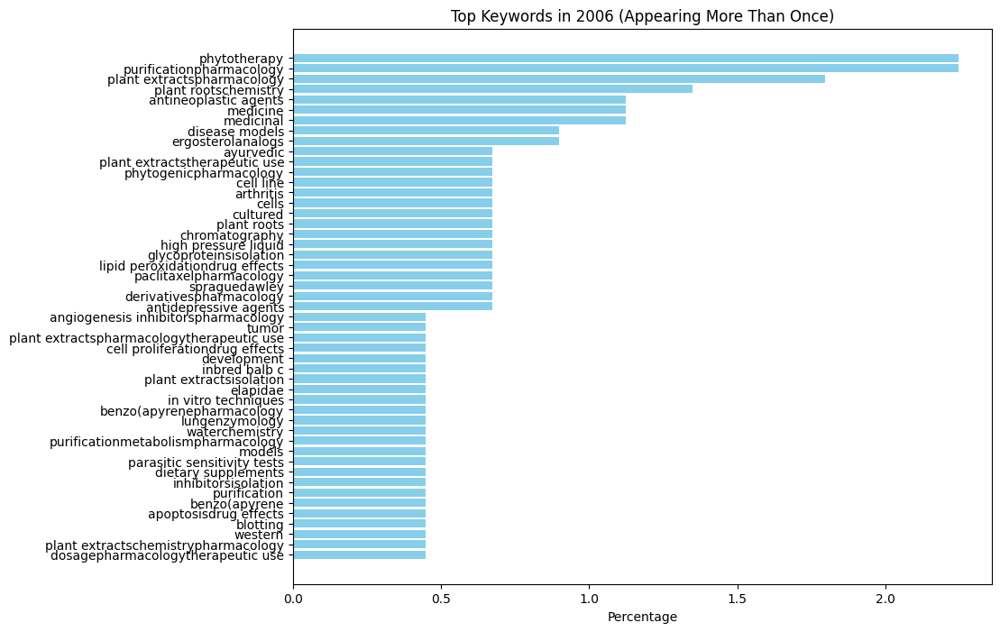


Year: 2007
Keywords with counts more than 1:
plant extractschemistrypharmacology: 2 (0.49%)
plant rootschemistry: 7 (1.71%)
arthritis: 2 (0.49%)
lipid peroxidationdrug effects: 2 (0.49%)
phytotherapy: 7 (1.71%)
plant extractspharmacology: 7 (1.71%)
dosagepharmacologytherapeutic use: 3 (0.73%)
cholesterol: 2 (0.49%)
plant extractspharmacologytherapeutic use: 2 (0.49%)
time factors: 4 (0.98%)
genes: 2 (0.49%)
india: 5 (1.22%)
plant extractschemistry: 3 (0.73%)
polymerase chain reaction: 2 (0.49%)
bacteria: 2 (0.49%)
developmentmicrobiology: 5 (1.22%)
chromatography: 4 (0.98%)
high pressure liquid: 2 (0.49%)
ergosterolanalogs: 8 (1.95%)
derivativesmetabolism: 2 (0.49%)
mass spectrometry: 2 (0.49%)
medicine: 5 (1.22%)
ayurvedic: 2 (0.49%)
withanolides: 5 (1.22%)
receptors: 2 (0.49%)
inbred strains: 2 (0.49%)
amino acid sequence: 2 (0.49%)
purificationmetabolism: 2 (0.49%)
hot temperature: 2 (0.49%)
kinetics: 2 (0.49%)
molecular sequence data: 2 (0.49%)
plant leavesenzymology: 2 (0.49%)
se

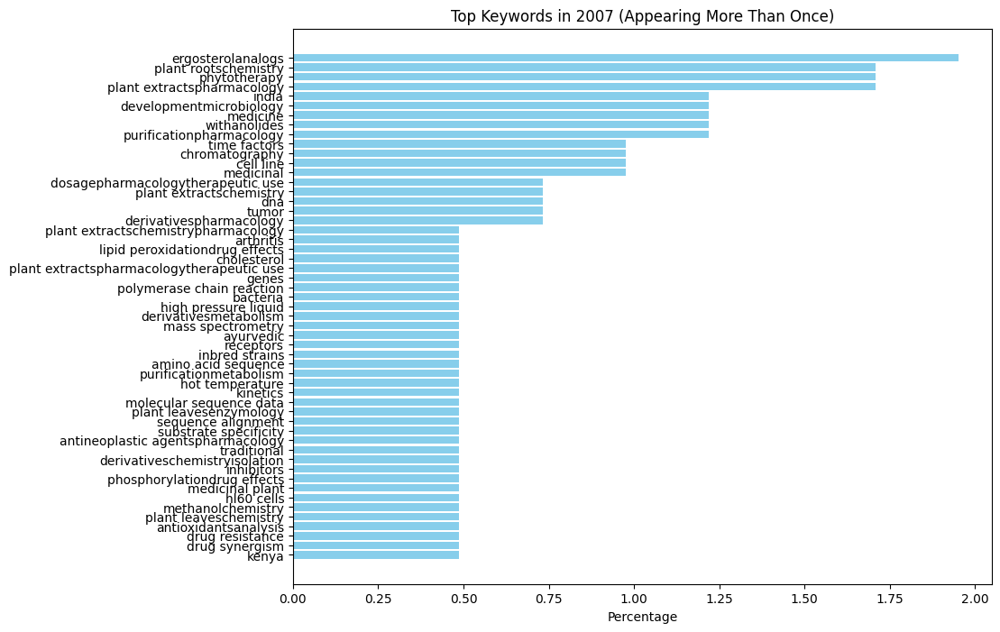


Year: 2008
Keywords with counts more than 1:
purification: 5 (1.44%)
molecular structure: 4 (1.15%)
plant rootschemistry: 4 (1.15%)
phytotherapy: 5 (1.44%)
antioxidantsmetabolism: 2 (0.57%)
inhibitorstoxicity: 2 (0.57%)
in situ nickend labeling: 2 (0.57%)
purificationpharmacology: 3 (0.86%)
protooncogene proteins cbcl2metabolism: 3 (0.86%)
cells: 2 (0.57%)
cultured: 2 (0.57%)
ergosterolanalogs: 12 (3.45%)
derivativesbiosynthesis: 2 (0.57%)
plant rootsmetabolism: 2 (0.57%)
plant shootsmetabolism: 2 (0.57%)
withaniametabolism: 3 (0.86%)
withanolides: 12 (3.45%)
chromatography: 6 (1.72%)
medicine: 6 (1.72%)
ayurvedic: 5 (1.44%)
medicinalchemistry: 2 (0.57%)
disease models: 3 (0.86%)
plant extractstherapeutic use: 2 (0.57%)
plant roots: 2 (0.57%)
thin layer: 2 (0.57%)
reference standards: 2 (0.57%)
high pressure liquid: 2 (0.57%)
plant extracts: 2 (0.57%)
plant extractspharmacology: 2 (0.57%)
aged: 2 (0.57%)
apoptosisdrug effects: 4 (1.15%)
bcl2associated x proteinmetabolism: 2 (0.57%)
di

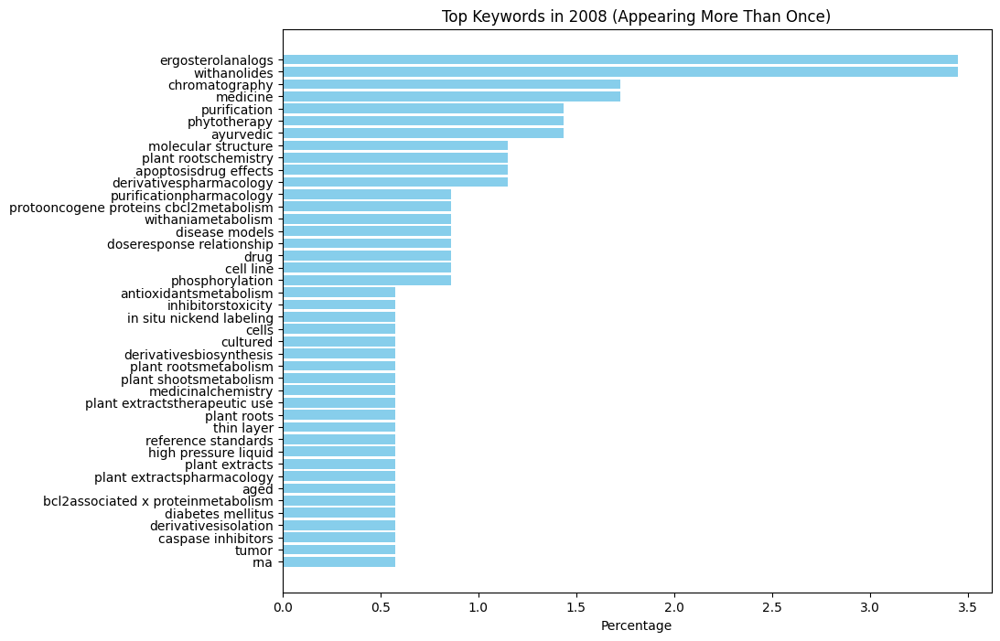


Year: 2009
Keywords with counts more than 1:
purificationpharmacology: 10 (2.15%)
molecular structure: 3 (0.64%)
analysis of variance: 2 (0.43%)
behavior: 2 (0.43%)
animaldrug effects: 2 (0.43%)
chromatography: 6 (1.29%)
high pressure liquid: 4 (0.86%)
disease models: 4 (0.86%)
microscopy: 2 (0.43%)
phytotherapy: 8 (1.72%)
plant extractstherapeutic use: 8 (1.72%)
spraguedawley: 2 (0.43%)
time factors: 2 (0.43%)
plant roots: 2 (0.43%)
purification: 3 (0.64%)
hippocampusmetabolism: 2 (0.43%)
plant extractspharmacology: 6 (1.29%)
plant rootschemistry: 4 (0.86%)
restraint: 2 (0.43%)
physical: 2 (0.43%)
stress: 3 (0.64%)
adult: 2 (0.43%)
thin layer: 2 (0.43%)
ergosterolanalogs: 7 (1.50%)
plant leaveschemistry: 3 (0.64%)
withanolides: 6 (1.29%)
genetic: 2 (0.43%)
random amplified polymorphic dna technique: 2 (0.43%)
withanolidesmetabolism: 2 (0.43%)
india: 2 (0.43%)
antioxidantspharmacologytherapeutic use: 2 (0.43%)
drug therapy: 2 (0.43%)
combination: 2 (0.43%)
inbred balb c: 3 (0.64%)
pla

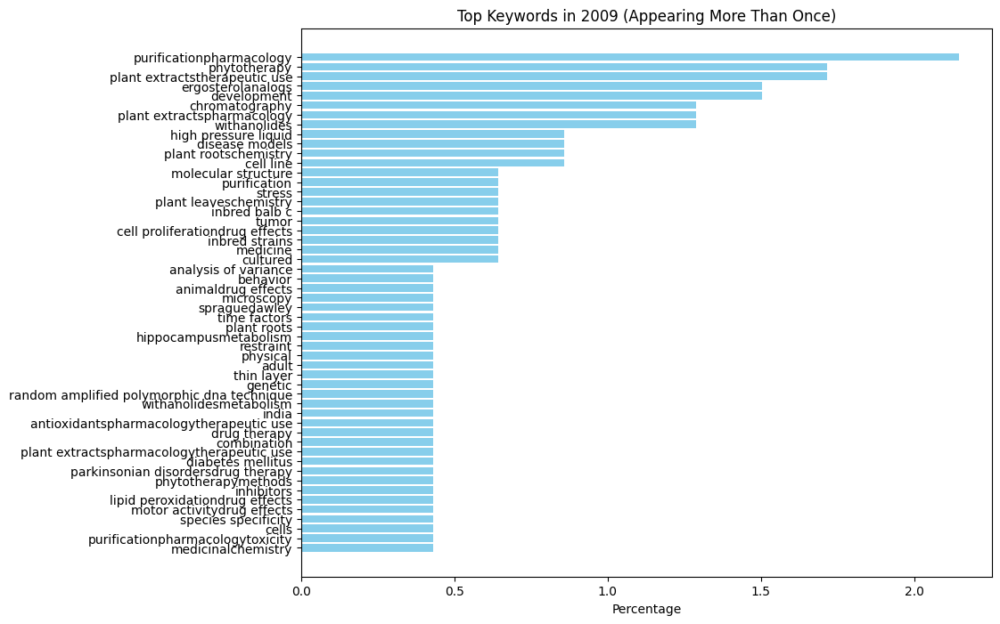


Year: 2010
Keywords with counts more than 1:
phytotherapymethods: 2 (0.38%)
plant extractsadministration: 3 (0.57%)
dosagepharmacology: 3 (0.57%)
plant rootschemistry: 5 (0.95%)
dosage: 3 (0.57%)
treatment outcome: 2 (0.38%)
immunoglobulinsblood: 2 (0.38%)
plant roots: 3 (0.57%)
withaniaimmunology: 2 (0.38%)
chromatography: 4 (0.76%)
high pressure liquid: 2 (0.38%)
withaniametabolism: 2 (0.38%)
dna: 3 (0.57%)
plantgenetics: 2 (0.38%)
lipid peroxidationdrug effects: 2 (0.38%)
plant extractstherapeutic use: 3 (0.57%)
ureablood: 2 (0.38%)
plant extractspharmacology: 3 (0.57%)
drug stability: 2 (0.38%)
ergosterolanalogs: 5 (0.95%)
withanolides: 5 (0.95%)
cells: 2 (0.38%)
cultured: 5 (0.95%)
thin layer: 2 (0.38%)
medicine: 6 (1.15%)
models: 3 (0.57%)
molecular: 3 (0.57%)
withaniacytologymetabolism: 2 (0.38%)
antineoplastic agents: 3 (0.57%)
purificationpharmacology: 7 (1.34%)
drug screening assays: 3 (0.57%)
antitumor: 3 (0.57%)
molecular structure: 2 (0.38%)
medicinalchemistry: 2 (0.38%)


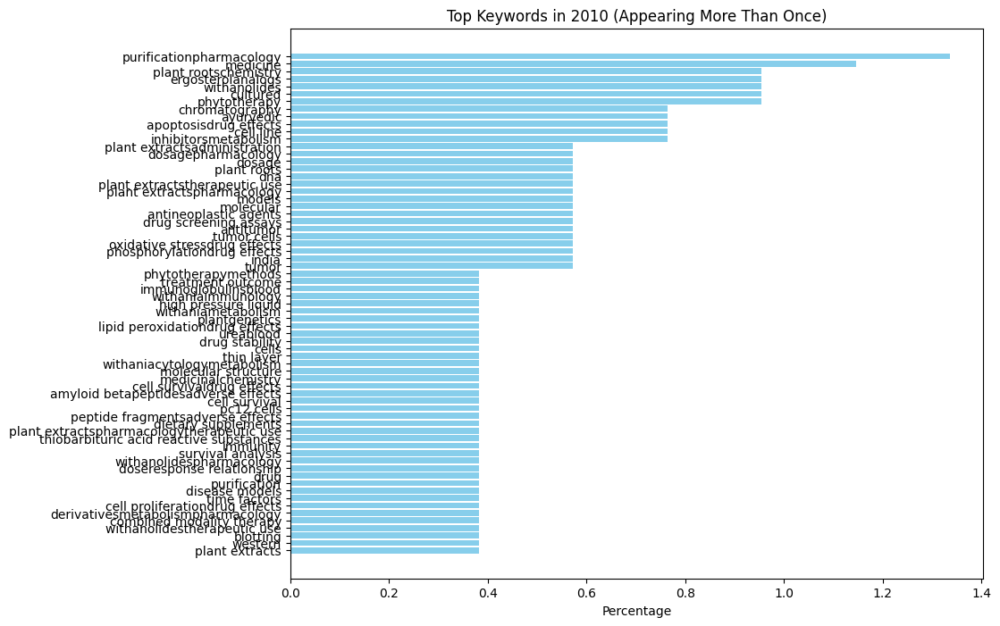


Year: 2011
Keywords with counts more than 1:
tumor: 6 (1.12%)
3dihydrowithaferin a: 2 (0.37%)
developmentmetabolism: 6 (1.12%)
principal component analysis: 2 (0.37%)
withaniachemistrygrowth: 2 (0.37%)
india: 2 (0.37%)
purification: 6 (1.12%)
plant leaveschemistrymetabolism: 2 (0.37%)
plant rootschemistrymetabolism: 2 (0.37%)
withaniachemistrymetabolism: 3 (0.56%)
withanolideschemistryisolation: 2 (0.37%)
doseresponse relationship: 3 (0.56%)
drug: 3 (0.56%)
inhibitorsmetabolism: 4 (0.75%)
plant extractschemistrypharmacology: 2 (0.37%)
lipid peroxidationdrug effects: 2 (0.37%)
phytotherapy: 5 (0.94%)
plant extractspharmacologytherapeutic use: 2 (0.37%)
molecular: 2 (0.37%)
medicinalchemistry: 3 (0.56%)
development: 2 (0.37%)
cloning: 2 (0.37%)
drug resistance: 2 (0.37%)
plant extractspharmacology: 2 (0.37%)
plant rootschemistry: 2 (0.37%)
stress: 2 (0.37%)
withanolidespharmacology: 6 (1.12%)
behavior: 2 (0.37%)
animaldrug effects: 2 (0.37%)
withanolides: 2 (0.37%)
apoptosisdrug effects

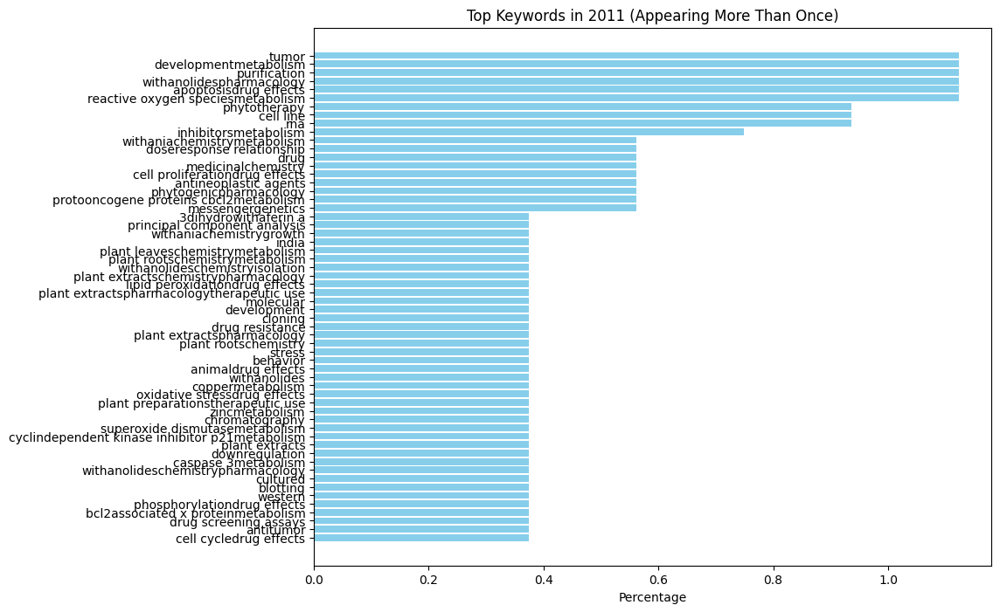


Year: 2012
Keywords with counts more than 1:
phytotherapymethods: 2 (0.29%)
plant extractspharmacology: 5 (0.72%)
plant roots: 3 (0.43%)
cytokinesbiosynthesis: 2 (0.29%)
disease models: 3 (0.43%)
inbred balb c: 3 (0.43%)
phytotherapy: 5 (0.72%)
adjuvants: 2 (0.29%)
dosageisolation: 2 (0.29%)
purification: 4 (0.58%)
immunity: 2 (0.29%)
india: 3 (0.43%)
plant extractsadministration: 2 (0.29%)
plant rootschemistry: 7 (1.01%)
dietary supplements: 2 (0.29%)
superoxide dismutasemetabolism: 3 (0.43%)
plant extractschemistrypharmacology: 2 (0.29%)
receptors: 3 (0.43%)
molecular structure: 2 (0.29%)
developmentphysiology: 2 (0.29%)
antineoplastic agents: 2 (0.29%)
carbohydratespharmacology: 2 (0.29%)
carbonmetabolism: 2 (0.29%)
chromatography: 4 (0.58%)
high pressure liquid: 3 (0.43%)
culture media: 2 (0.29%)
plant rootsgrowth: 2 (0.29%)
developmentmetabolism: 6 (0.87%)
physiological: 2 (0.29%)
amino acid sequence: 3 (0.43%)
gene expression regulation: 8 (1.16%)
enzymologic: 2 (0.29%)
molecula

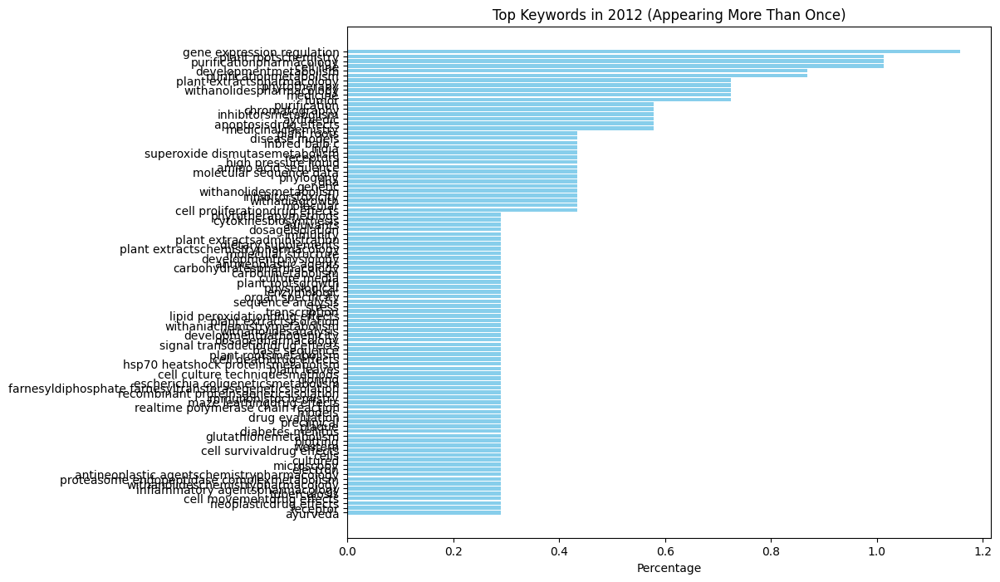


Year: 2013
Keywords with counts more than 1:
nmr: 2 (0.21%)
doseresponse relationship: 10 (1.07%)
drug: 10 (1.07%)
mammary neoplasms: 2 (0.21%)
phytotherapy: 7 (0.75%)
plant extractstherapeutic use: 2 (0.21%)
plant rootschemistry: 8 (0.85%)
spraguedawley: 3 (0.32%)
receptors: 6 (0.64%)
cells: 4 (0.43%)
cultured: 4 (0.43%)
strychninepharmacology: 2 (0.21%)
doubleblind method: 2 (0.21%)
plant extracts: 2 (0.21%)
genetic: 2 (0.21%)
withaniageneticsmetabolism: 2 (0.21%)
withanolidesmetabolism: 5 (0.53%)
toxicity: 2 (0.21%)
gas chromatographymass spectrometry: 3 (0.32%)
models: 4 (0.43%)
plant rootsmetabolism: 2 (0.21%)
antioxidant: 2 (0.21%)
cloning: 5 (0.53%)
molecular: 8 (0.85%)
glucosyltransferasesgeneticsisolation: 2 (0.21%)
purificationmetabolism: 7 (0.75%)
phylogeny: 5 (0.53%)
substrate specificity: 3 (0.32%)
withaniaenzymologygenetics: 4 (0.43%)
apoptosis: 2 (0.21%)
survivin: 2 (0.21%)
biomass: 2 (0.21%)
chromatography: 7 (0.75%)
high pressure liquid: 4 (0.43%)
hydrogenion concentr

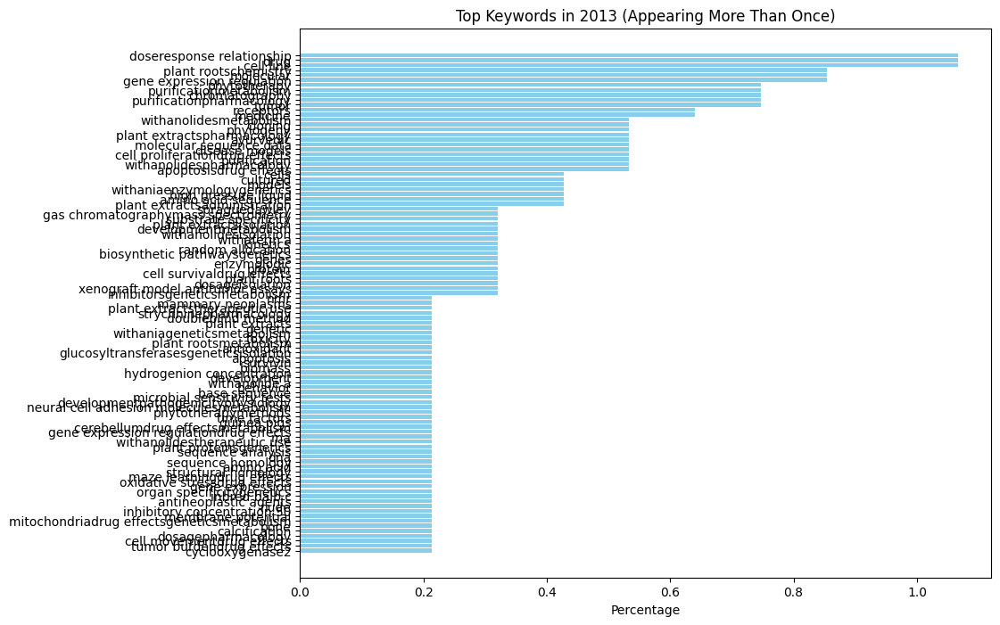


Year: 2014
Keywords with counts more than 1:
medicine: 3 (0.41%)
ayurvedic: 3 (0.41%)
molecular structure: 2 (0.27%)
purificationtherapeutic use: 2 (0.27%)
plant rootschemistry: 2 (0.27%)
phytotherapy: 5 (0.68%)
cell culture techniques: 2 (0.27%)
neoplasmsdrug therapy: 2 (0.27%)
cell proliferationdrug effects: 2 (0.27%)
plant extractspharmacology: 4 (0.55%)
antioxidant: 3 (0.41%)
bromobenzene: 3 (0.41%)
cat: 2 (0.27%)
catalase: 2 (0.27%)
gpx: 2 (0.27%)
glutathione peroxidase: 2 (0.27%)
gsh: 2 (0.27%)
reduced glutathione: 2 (0.27%)
glutathione: 5 (0.68%)
lipid peroxidation: 3 (0.41%)
oxidative stress: 4 (0.55%)
reactive oxygen species: 3 (0.41%)
sod: 2 (0.27%)
superoxide dismutase: 2 (0.27%)
withaferin a: 7 (0.96%)
cytotoxicity: 2 (0.27%)
withanolides: 2 (0.27%)
plant proteinsgeneticsmetabolism: 2 (0.27%)
withanolideschemistrymetabolism: 2 (0.27%)
cymbopogonchemistry: 2 (0.27%)
drug resistance: 2 (0.27%)
larvadrug effects: 3 (0.41%)
plant extractsisolation: 2 (0.27%)
vitexchemistry: 2 

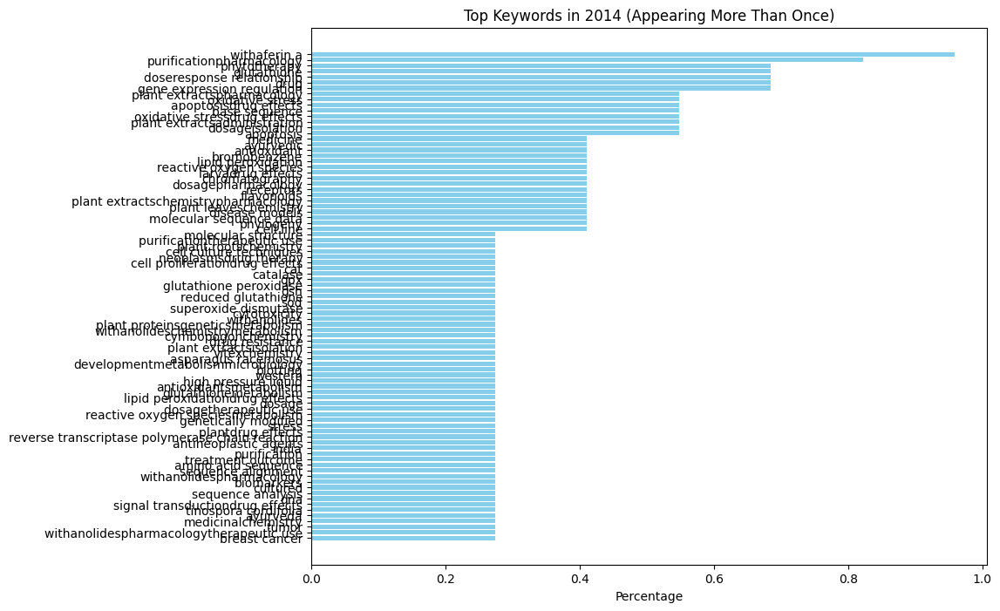


Year: 2015
Keywords with counts more than 1:
cancer: 3 (0.46%)
inflammatory: 2 (0.31%)
parkinson's disease: 2 (0.31%)
secondary metabolites: 2 (0.31%)
cell line: 6 (0.92%)
tumor: 5 (0.77%)
cell survivaldrug effects: 3 (0.46%)
phytotherapy: 3 (0.46%)
plant extractspharmacologytherapeutic use: 3 (0.46%)
plant roots: 2 (0.31%)
withaferin a: 11 (1.69%)
testosterone: 2 (0.31%)
breast cancer: 2 (0.31%)
medicinal plant: 2 (0.31%)
withanolides: 10 (1.54%)
purificationpharmacology: 3 (0.46%)
receptors: 4 (0.62%)
inhibitorsmetabolism: 2 (0.31%)
herbal: 2 (0.31%)
creactive proteinmetabolism: 2 (0.31%)
ligands: 2 (0.31%)
molecular docking simulation: 3 (0.46%)
withanolidespharmacology: 3 (0.46%)
oxidative stress: 2 (0.31%)
gene expression: 2 (0.31%)
sonication: 2 (0.31%)
rna: 4 (0.62%)
withaniagrowth: 2 (0.31%)
expressed sequence tags: 2 (0.31%)
developmentmetabolism: 2 (0.31%)
withanolidesmetabolism: 3 (0.46%)
docking: 2 (0.31%)
molecular dynamic simulations: 2 (0.31%)
apoptosis: 5 (0.77%)
gene 

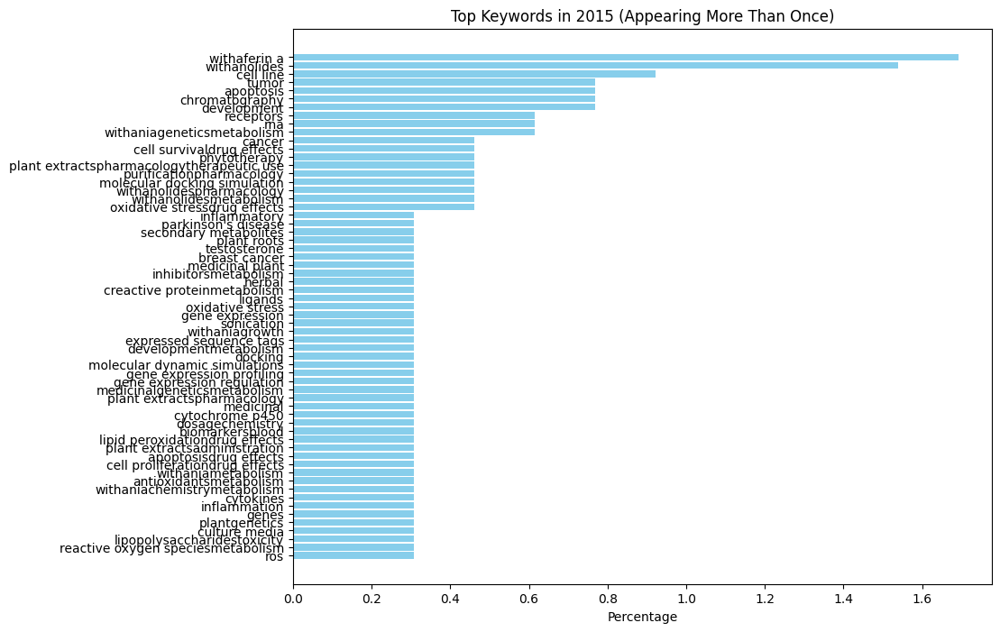


Year: 2016
Keywords with counts more than 1:
ayurveda: 3 (0.56%)
cancer: 3 (0.56%)
withaferin a: 11 (2.06%)
purificationpharmacologytherapeutic use: 2 (0.37%)
phytotherapy: 3 (0.56%)
anticancer: 2 (0.37%)
withanolides: 3 (0.56%)
apoptosis: 3 (0.56%)
oxidative stress: 2 (0.37%)
secondary metabolites: 2 (0.37%)
glutathionemetabolism: 3 (0.56%)
lipid peroxidationdrug effects: 3 (0.56%)
plant extractschemistrypharmacology: 3 (0.56%)
plant leaveschemistry: 2 (0.37%)
antioxidant: 2 (0.37%)
biosynthetic pathwaysgenetics: 2 (0.37%)
gene expression regulation: 2 (0.37%)
genetically modified: 2 (0.37%)
withanolidesmetabolism: 2 (0.37%)
testosterone: 2 (0.37%)
mucuna pruriens: 2 (0.37%)
withanolide a: 3 (0.56%)
ischemia: 2 (0.37%)
stroke: 2 (0.37%)
chromatography: 3 (0.56%)
plant extractspharmacology: 4 (0.75%)
plant rootschemistry: 3 (0.56%)
drug evaluation: 3 (0.56%)
preclinical: 4 (0.75%)
cell line: 3 (0.56%)
tumor: 3 (0.56%)
dosage: 3 (0.56%)
fertility: 2 (0.37%)
nrf2: 2 (0.37%)
microglia: 2

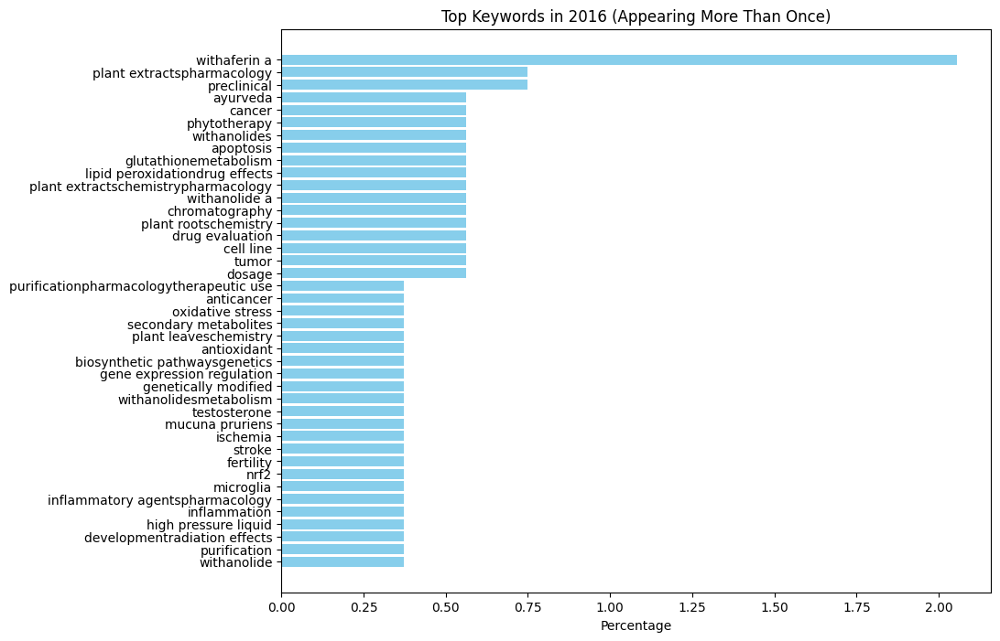


Year: 2017
Keywords with counts more than 1:
cognition: 2 (0.40%)
withanolides: 8 (1.59%)
ayurveda: 2 (0.40%)
neuroprotection: 3 (0.60%)
anticancer: 2 (0.40%)
immunomodulation: 2 (0.40%)
withaferin a: 4 (0.80%)
oxidative stressdrug effects: 2 (0.40%)
plant rootschemistry: 2 (0.40%)
apoptosis: 6 (1.20%)
inflammatory cytokines: 2 (0.40%)
neuroinflammation: 2 (0.40%)
sleep deprivation: 2 (0.40%)
ros: 2 (0.40%)
nfkappab: 2 (0.40%)
acetylcholinesterase: 2 (0.40%)
oxidative stress: 4 (0.80%)
inbred c57bl: 2 (0.40%)
proliferation: 2 (0.40%)
tinospora cordifolia: 2 (0.40%)
behavior: 2 (0.40%)
animaldrug effects: 2 (0.40%)
disease models: 2 (0.40%)
plant extractspharmacology: 2 (0.40%)
antioxidants: 2 (0.40%)
secondary metabolites: 2 (0.40%)
chromatography: 2 (0.40%)
gene expression profiling: 2 (0.40%)
gene expression regulation: 3 (0.60%)
genes: 2 (0.40%)
phylogeny: 2 (0.40%)
transcription factorsgeneticsmetabolism: 2 (0.40%)
development: 3 (0.60%)
parkinson's disease: 2 (0.40%)
obesity: 2 (

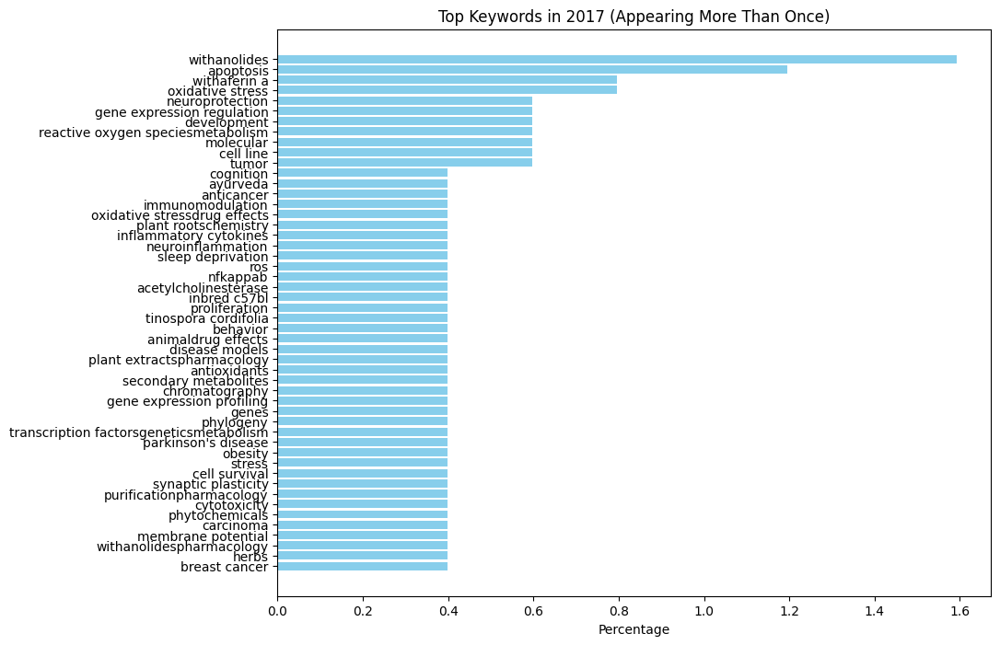


Year: 2018
Keywords with counts more than 1:
male infertility: 3 (0.53%)
withanolide: 2 (0.35%)
withaferin a: 7 (1.24%)
apoptosis: 5 (0.88%)
oxidative stress: 7 (1.24%)
traditional medicine: 3 (0.53%)
withanolides: 4 (0.71%)
withanone: 2 (0.35%)
bacillus amyloliquefaciens: 2 (0.35%)
pseudomonas fluorescens: 2 (0.35%)
endophytes: 2 (0.35%)
medicinal plants: 2 (0.35%)
purification: 2 (0.35%)
adolescent: 2 (0.35%)
adult: 2 (0.35%)
aged: 2 (0.35%)
doubleblind method: 2 (0.35%)
middle aged: 2 (0.35%)
young adult: 2 (0.35%)
antioxidant: 3 (0.53%)
alzheimer's disease: 2 (0.35%)
centella asiatica: 2 (0.35%)
biomass: 2 (0.35%)
photosynthesis: 2 (0.35%)
withanolidesmetabolism: 2 (0.35%)
withanolide a: 3 (0.53%)
gene expression regulation: 2 (0.35%)
histologygeneticsgrowth: 2 (0.35%)
development: 3 (0.53%)
cytotoxicity: 2 (0.35%)
phytomedicine: 2 (0.35%)
cancer: 2 (0.35%)
inflammation: 3 (0.53%)
developmentmetabolism: 2 (0.35%)
stress: 2 (0.35%)
pathway analysis: 2 (0.35%)
pubchem cid: 3152: 2 (

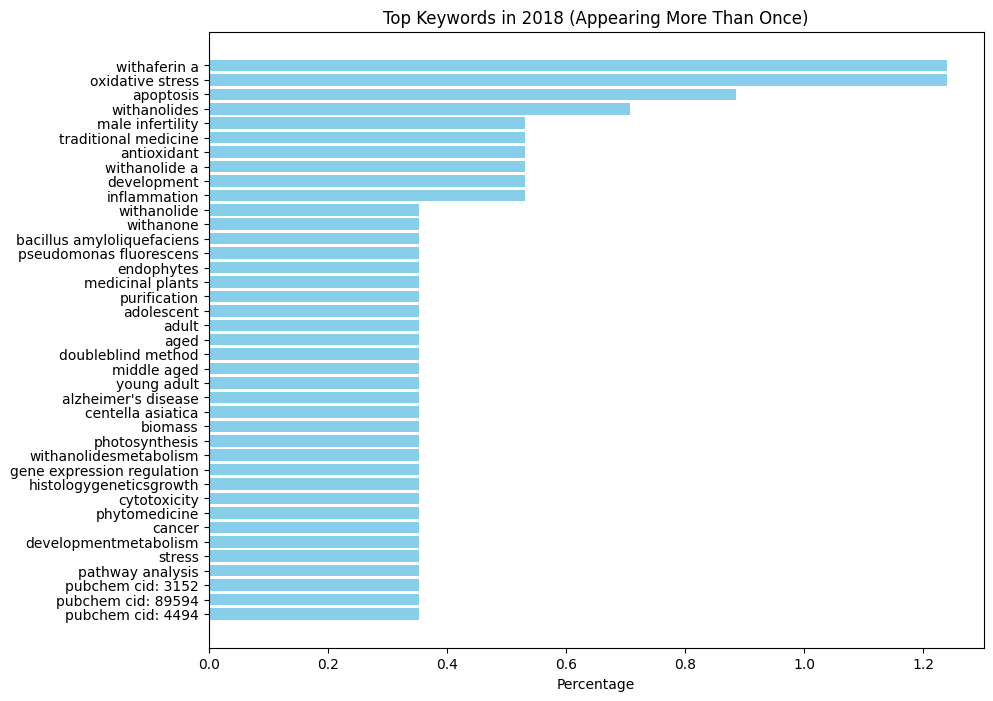


Year: 2019
Keywords with counts more than 1:
testosterone: 2 (0.49%)
withaferin a: 14 (3.45%)
oxidative stress: 6 (1.48%)
endophyte: 3 (0.74%)
cell line: 3 (0.74%)
tumor: 2 (0.49%)
molecular structure: 2 (0.49%)
plant rootschemistry: 2 (0.49%)
plant extractspharmacology: 2 (0.49%)
inflammation: 3 (0.74%)
withanolide a: 3 (0.74%)
withanolides: 5 (1.23%)
apoptosis: 3 (0.74%)
alzheimer's disease: 3 (0.74%)
neuroprotection: 2 (0.49%)
reactive oxygen species: 2 (0.49%)
adult: 2 (0.49%)
doubleblind method: 2 (0.49%)
treatment outcome: 2 (0.49%)
stress: 2 (0.49%)
inbred c57bl: 2 (0.49%)
medicinal plants: 4 (0.99%)
chemoprevention: 2 (0.49%)
breast cancer: 2 (0.49%)
adaptogen: 2 (0.49%)
ethnobotany: 2 (0.49%)
anxiety: 2 (0.49%)
List of keywords appearing more than once in 2019:
['testosterone', 'withaferin a', 'oxidative stress', 'endophyte', 'cell line', 'tumor', 'molecular structure', 'plant rootschemistry', 'plant extractspharmacology', 'inflammation', 'withanolide a', 'withanolides', 'apo

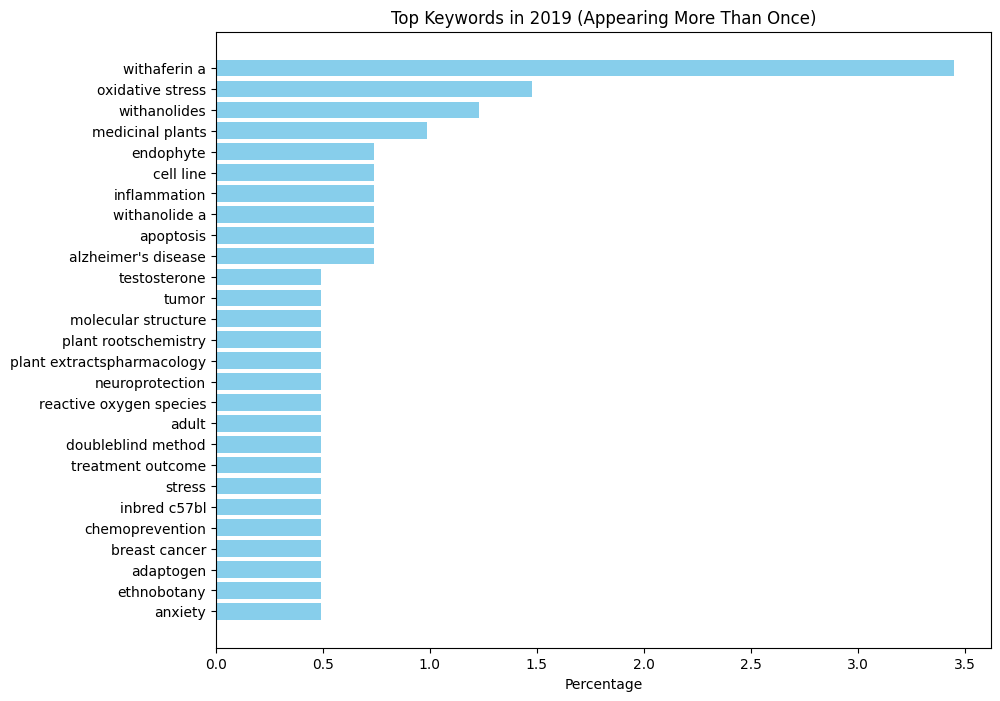


Year: 2020
Keywords with counts more than 1:
sarscov2: 2 (0.35%)
alzheimer's disease: 3 (0.53%)
stress: 4 (0.70%)
neuroprotection: 3 (0.53%)
parkinson's disease: 3 (0.53%)
withanolidea: 3 (0.53%)
clinical trials: 2 (0.35%)
withanolides: 5 (0.88%)
acetylcoa carboxylase 1: 2 (0.35%)
atp citrate lyase: 2 (0.35%)
fatty acid synthase: 2 (0.35%)
cell line: 2 (0.35%)
tumor: 2 (0.35%)
disease models: 2 (0.35%)
withanolidespharmacologytherapeutic use: 2 (0.35%)
modified multiple platform method: 2 (0.35%)
sleep deprivation: 2 (0.35%)
sd: 2 (0.35%)
withaferin a: 13 (2.28%)
secondary metabolism: 2 (0.35%)
gene expression regulation: 2 (0.35%)
rna: 2 (0.35%)
withaniageneticsmetabolism: 2 (0.35%)
cell proliferation: 2 (0.35%)
microscopy: 2 (0.35%)
electron: 2 (0.35%)
scanning: 2 (0.35%)
nanoparticles: 2 (0.35%)
anticancer: 2 (0.35%)
green synthesis: 2 (0.35%)
molecular docking: 2 (0.35%)
cytokines: 2 (0.35%)
inflammation: 3 (0.53%)
chromatography: 4 (0.70%)
india: 2 (0.35%)
limit of detection: 3 (

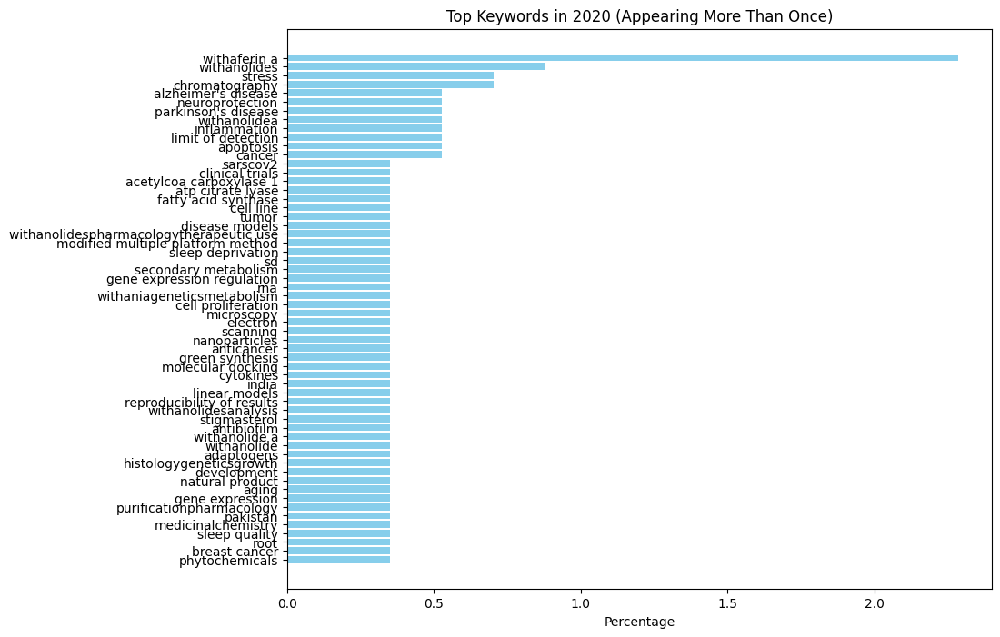


Year: 2021
Keywords with counts more than 1:
anxiety: 5 (0.60%)
depression: 2 (0.24%)
insomnia: 4 (0.48%)
stress: 4 (0.48%)
ethnobotany: 2 (0.24%)
phytochemistry: 2 (0.24%)
withanolides: 3 (0.36%)
ayurveda: 8 (0.95%)
solanaceae: 4 (0.48%)
immunomodulation: 2 (0.24%)
inflammation: 3 (0.36%)
neuroprotective: 2 (0.24%)
traditional medicine: 3 (0.36%)
withanolide: 2 (0.24%)
anticancer: 3 (0.36%)
aphrodisiac: 2 (0.24%)
apoptosis: 4 (0.48%)
ethnomedicine: 2 (0.24%)
triplenegative breast cancer: 2 (0.24%)
antineoplastic agents: 2 (0.24%)
disease models: 2 (0.24%)
withaferin a: 8 (0.95%)
ayurvedic medicine: 2 (0.24%)
immunomodulatory: 2 (0.24%)
parkinson's disease: 3 (0.36%)
protein: 2 (0.24%)
angiogenesis: 2 (0.24%)
cytotoxicity: 2 (0.24%)
phytochemicals: 7 (0.84%)
india: 3 (0.36%)
covid19: 8 (0.95%)
sarscov2: 11 (1.31%)
withanone: 6 (0.72%)
antiviral: 3 (0.36%)
docking: 2 (0.24%)
dynamics: 2 (0.24%)
spike glycoprotein: 2 (0.24%)
tinospora cordifolia: 2 (0.24%)
metabolomics: 2 (0.24%)
molecu

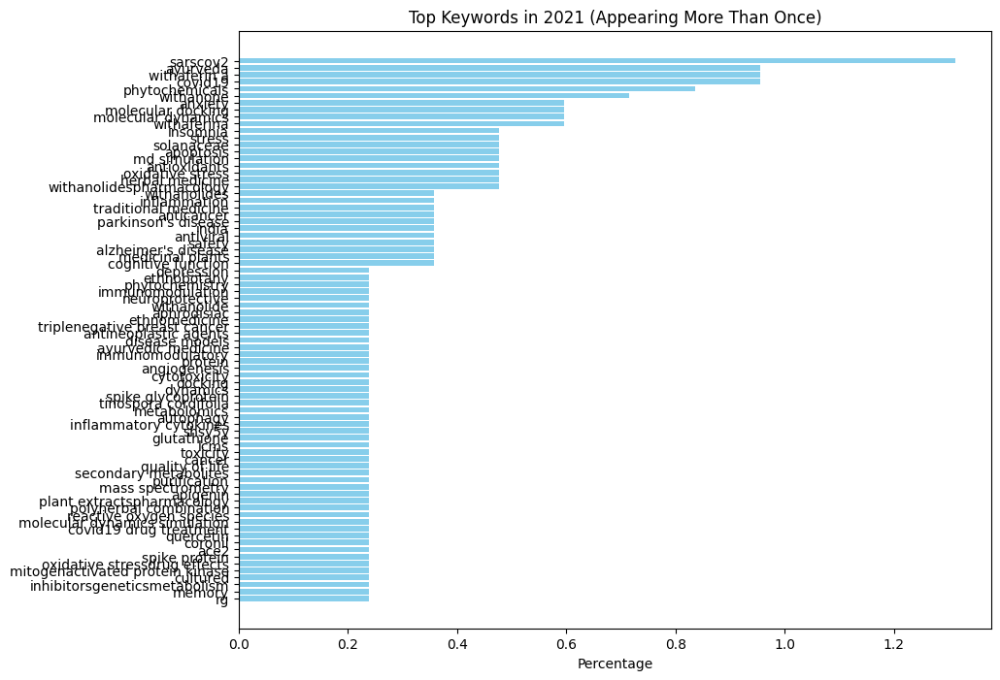


Year: 2022
Keywords with counts more than 1:
cancer: 3 (0.45%)
molecular targets: 2 (0.30%)
withaferin a: 9 (1.35%)
withanolides: 12 (1.80%)
alzheimer's disease: 5 (0.75%)
covid19: 9 (1.35%)
sarscov2: 5 (0.75%)
antioxidant: 2 (0.30%)
viral: 2 (0.30%)
apoptosis: 5 (0.75%)
cancer treatment: 2 (0.30%)
cognition: 5 (0.75%)
stress: 3 (0.45%)
hplc: 3 (0.45%)
medicine: 2 (0.30%)
ayurvedic: 2 (0.30%)
molecular docking: 4 (0.60%)
neurodegeneration: 2 (0.30%)
docking: 2 (0.30%)
hypericum perforatum: 2 (0.30%)
panax ginseng: 2 (0.30%)
molecular dynamics simulation: 2 (0.30%)
ayurveda: 6 (0.90%)
lcmsms: 2 (0.30%)
plant extracts: 4 (0.60%)
lung neoplasms: 2 (0.30%)
admet: 2 (0.30%)
pharmacokinetics: 2 (0.30%)
antioxidant activity: 2 (0.30%)
silver nanoparticles: 2 (0.30%)
withanolide: 4 (0.60%)
immunoadjuvant: 2 (0.30%)
immunogenicity: 2 (0.30%)
vaccine: 2 (0.30%)
sleep: 4 (0.60%)
memory: 2 (0.30%)
oxidative stress: 5 (0.75%)
withanolide glycosides: 3 (0.45%)
antioxidants: 2 (0.30%)
withanolide a:

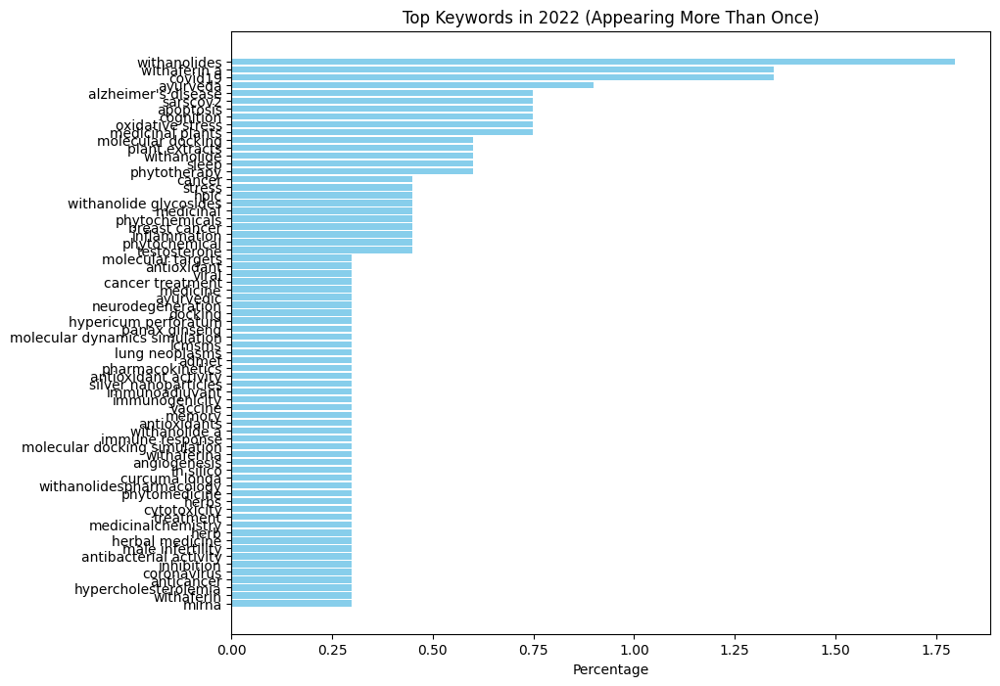


Year: 2023
Keywords with counts more than 1:
antimicrobial activity: 2 (0.32%)
herbal medicine: 2 (0.32%)
molecular docking: 8 (1.29%)
withanolide: 4 (0.65%)
apoptosis: 4 (0.65%)
colorectal cancer: 2 (0.32%)
phytochemistry: 3 (0.49%)
toxicity: 2 (0.32%)
withanolides: 9 (1.46%)
cancer: 5 (0.81%)
natural products: 2 (0.32%)
neuroprotection: 3 (0.49%)
ayurveda: 4 (0.65%)
covid19: 5 (0.81%)
rasayana: 2 (0.32%)
sarscov2: 5 (0.81%)
ftir: 3 (0.49%)
inflammation: 5 (0.81%)
withaferin a: 10 (1.62%)
inflammatory: 2 (0.32%)
herbal extracts: 2 (0.32%)
scanning electron microscopy: 2 (0.32%)
alkaloids: 3 (0.49%)
medicinal plants: 2 (0.32%)
tuberculosis: 3 (0.49%)
phytochemicals: 3 (0.49%)
flavonoids: 3 (0.49%)
cytokines: 2 (0.32%)
tinospora cordifolia: 2 (0.32%)
pharmacokinetics: 2 (0.32%)
withanolide a: 2 (0.32%)
parkinson's disease: 3 (0.49%)
microglia: 2 (0.32%)
growth: 2 (0.32%)
alzheimer's disease: 4 (0.65%)
network pharmacology: 3 (0.49%)
molecular dynamics: 4 (0.65%)
oxidative stress: 2 (0.

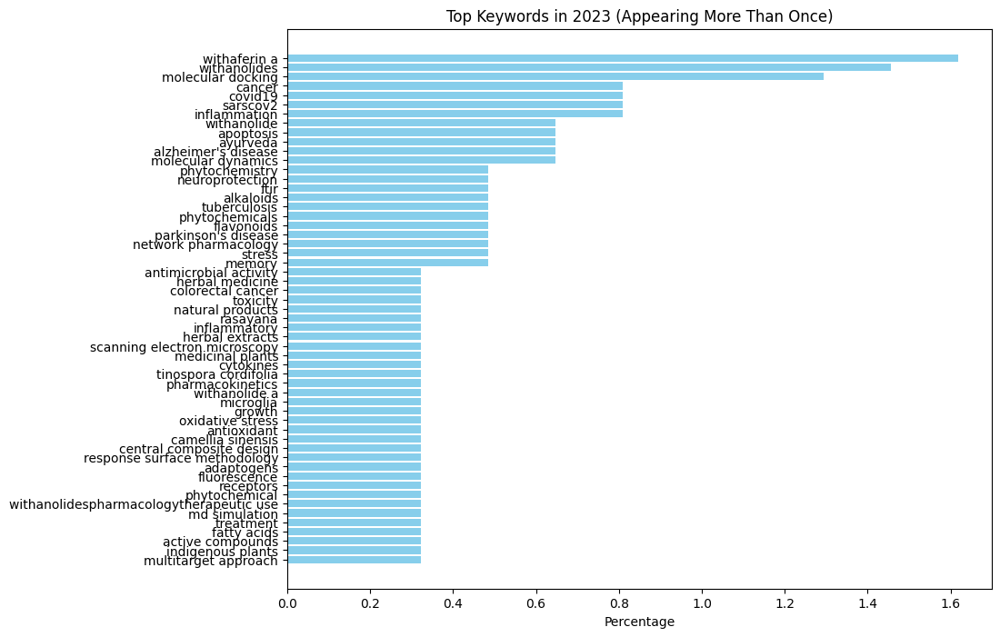


Year: 2024
Keywords with counts more than 1:
alzheimer's disease: 2 (0.45%)
withanolides: 9 (2.01%)
dietary supplements: 2 (0.45%)
testosterone: 2 (0.45%)
inflammation: 6 (1.34%)
oxidative stress: 4 (0.89%)
apoptosis: 2 (0.45%)
clinical trials: 3 (0.67%)
withaferin a: 11 (2.46%)
withanone: 2 (0.45%)
cancer: 4 (0.89%)
aging: 2 (0.45%)
nutraceuticals: 2 (0.45%)
withania somnifera extract: 2 (0.45%)
breast cancer: 3 (0.67%)
gene expression: 3 (0.67%)
stress: 2 (0.45%)
cancer treatment: 2 (0.45%)
adaptogen: 2 (0.45%)
randomized clinical trial: 2 (0.45%)
phytochemicals: 3 (0.67%)
unani medicine: 2 (0.45%)
ayurveda: 4 (0.89%)
neurodegeneration: 2 (0.45%)
genotoxicity: 2 (0.45%)
medicinal plants: 5 (1.12%)
quality of life: 2 (0.45%)
rheumatoid arthritis: 3 (0.67%)
network pharmacology: 2 (0.45%)
ethiopia: 3 (0.67%)
List of keywords appearing more than once in 2024:
["alzheimer's disease", 'withanolides', 'dietary supplements', 'testosterone', 'inflammation', 'oxidative stress', 'apoptosis', 

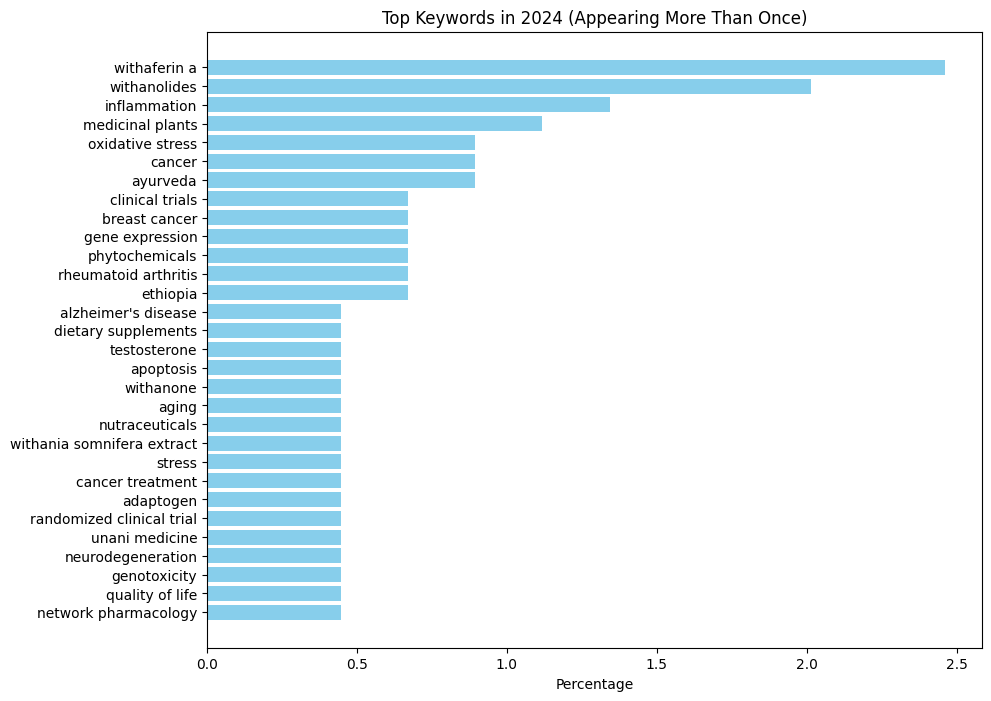

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

# Filter DataFrame for years since 1996
df_filtered = df[df['Date of Publication'] >= 1996]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Process each group
for year, group in grouped_by_year:
    keyword_counts = Counter()
    total_keyword_count = 0

    for keywords in group['Cleaned Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)
            # Update total keyword count
            total_keyword_count += len(filtered_keywords)

    # Filter keywords that appear more than once
    frequent_keywords = {kw: count for kw, count in keyword_counts.items() if count > 1}

    print(f"\nYear: {year}")
    print("Keywords with counts more than 1:")
    for keyword, count in frequent_keywords.items():
        percentage = (count / total_keyword_count) * 100
        print(f"{keyword}: {count} ({percentage:.2f}%)")

    # List of keywords appearing more than once
    keywords_more_than_once = list(frequent_keywords.keys())
    print(f"List of keywords appearing more than once in {year}:")
    print(keywords_more_than_once)

    # Visualization
    top_keywords = list(frequent_keywords.items())
    top_keywords.sort(key=lambda x: x[1], reverse=True)  # Sort by count

    if top_keywords:
        keywords, counts = zip(*top_keywords)
        percentages = [count / total_keyword_count * 100 for count in counts]

        plt.figure(figsize=(10, 8))
        plt.barh(keywords, percentages, color='skyblue')
        plt.xlabel('Percentage')
        plt.title(f'Top Keywords in {year} (Appearing More Than Once)')
        plt.gca().invert_yaxis()
        plt.show()

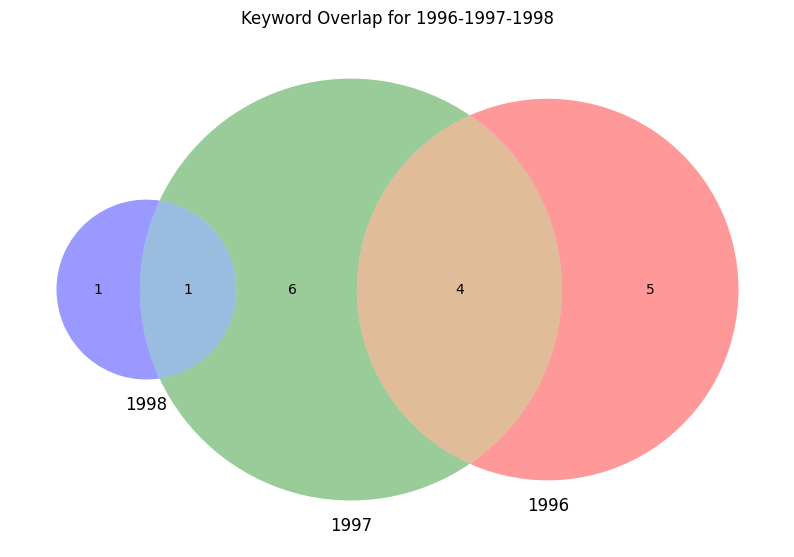

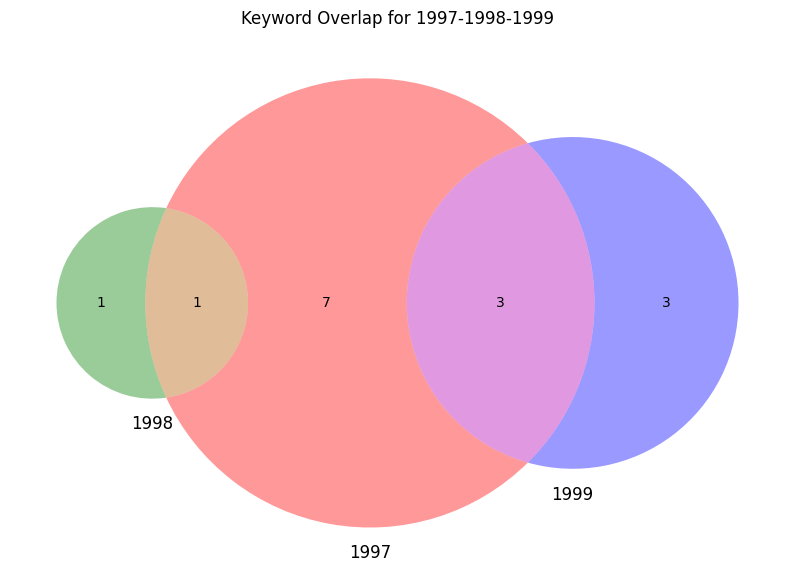

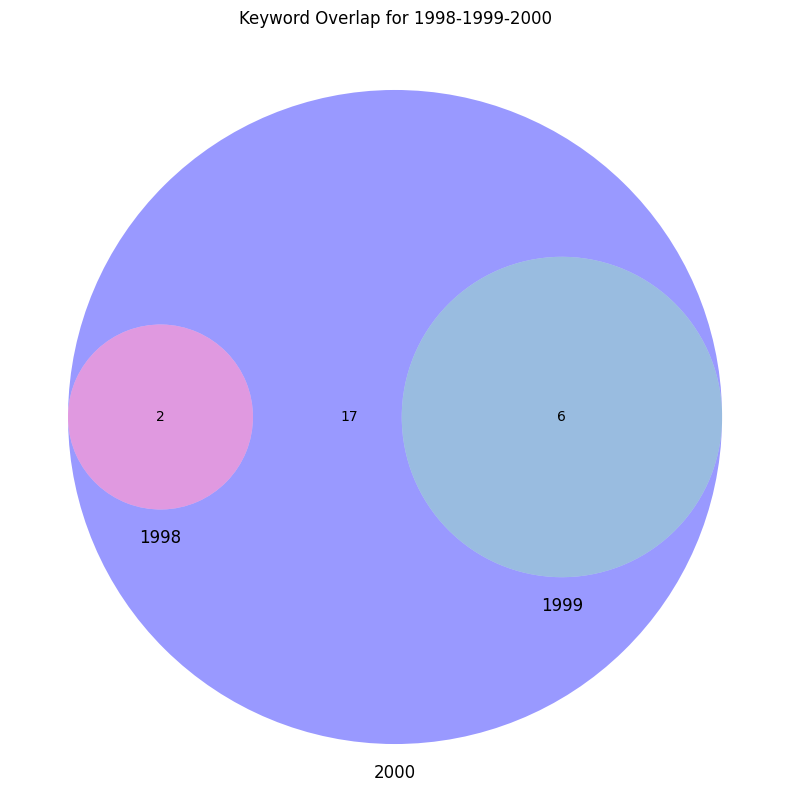

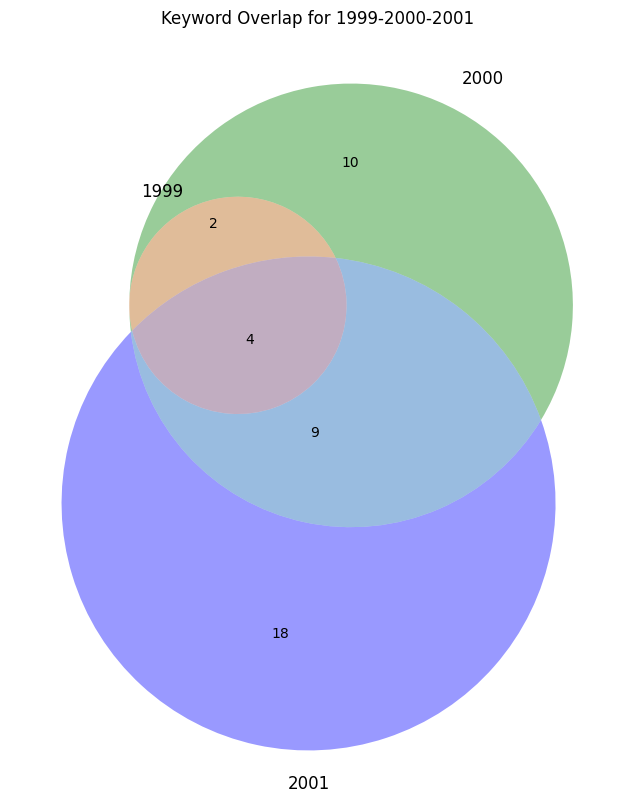

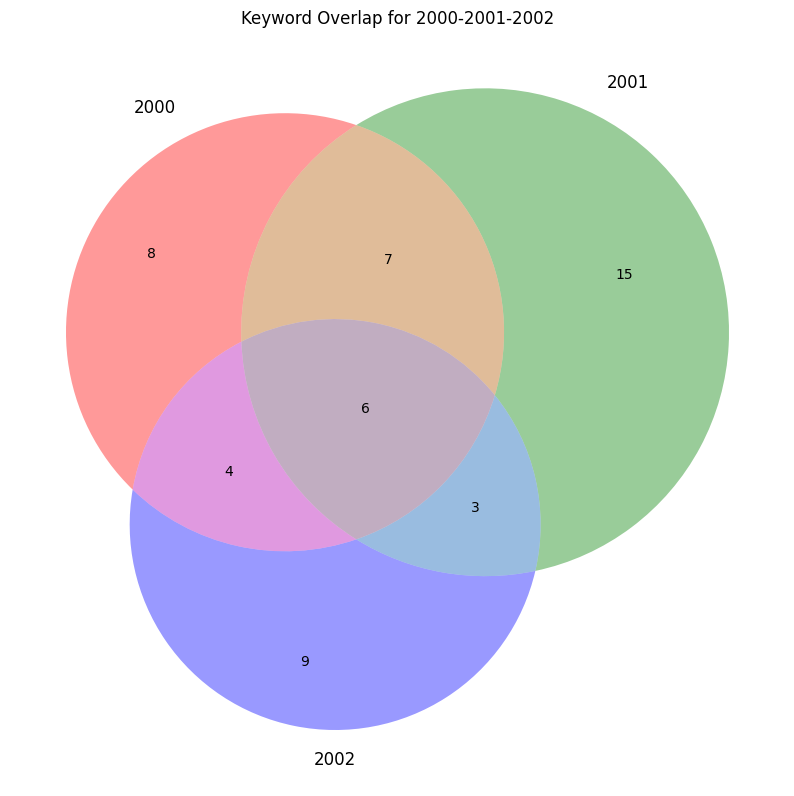

...

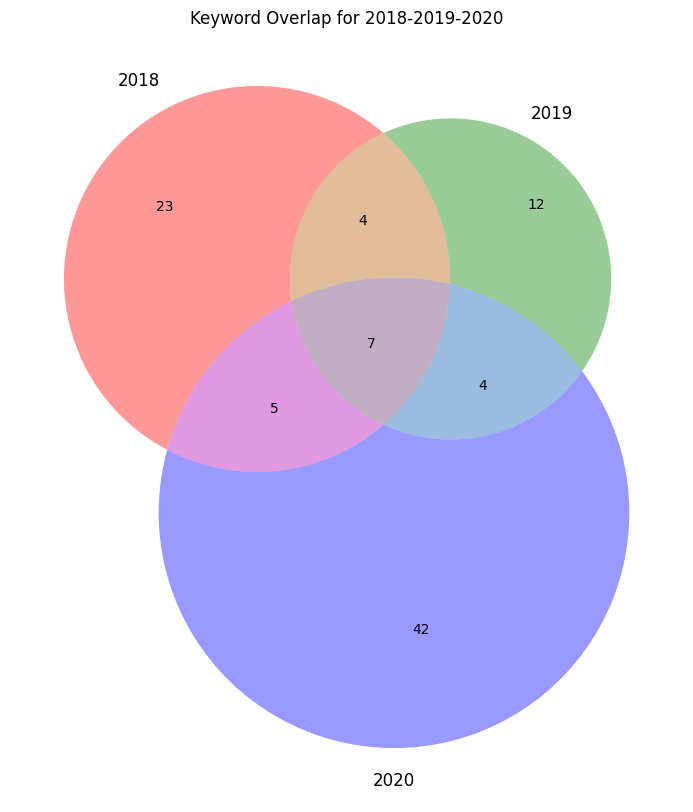

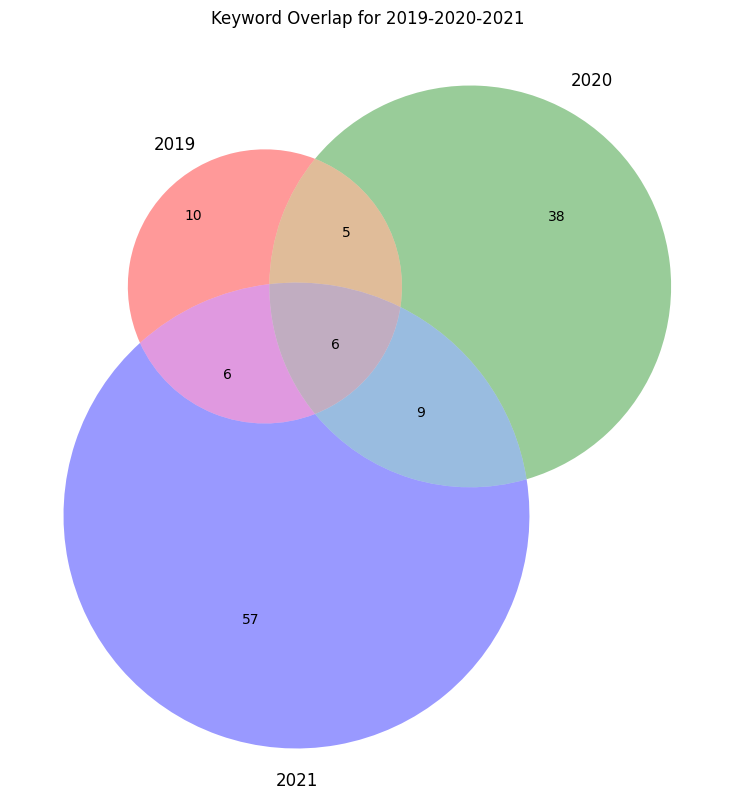

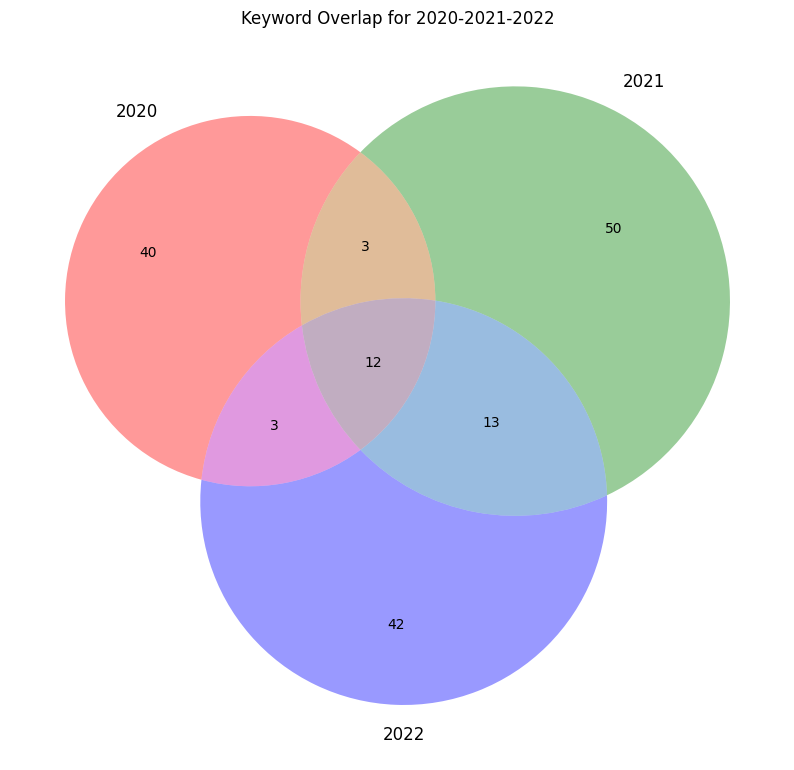

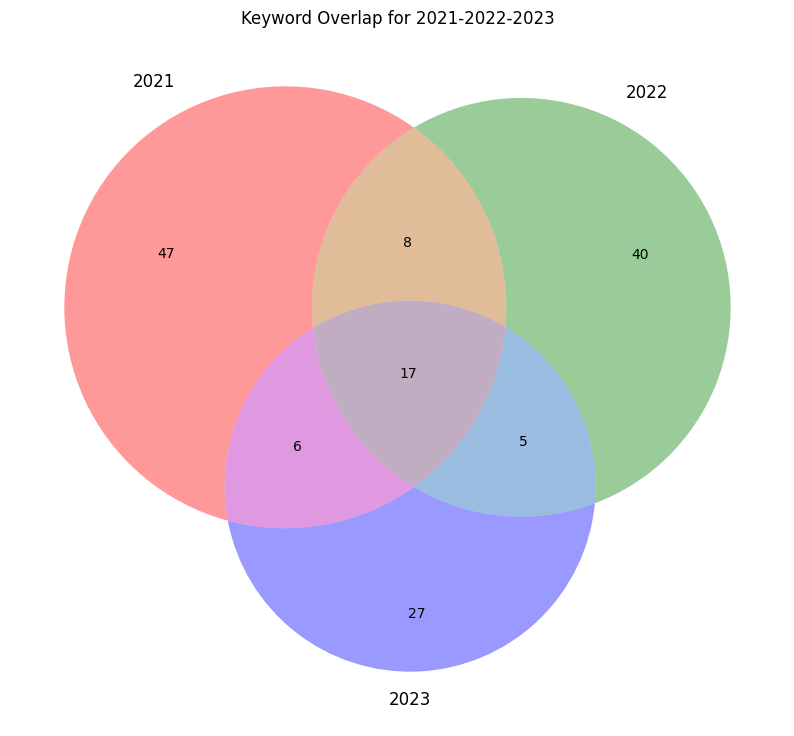

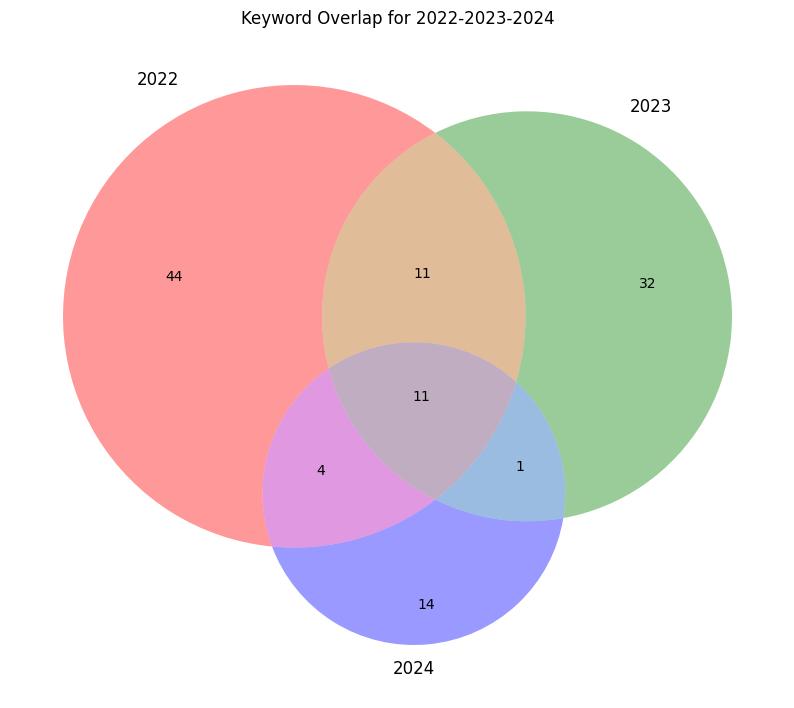

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from matplotlib_venn import venn3

# Define a function to split and clean keywords
def split_and_clean_keywords(keywords):
    return [kw.strip() for kw in keywords.split(', ') if kw.strip()]

# Filter DataFrame for years since 1996
df_filtered = df[df['Date of Publication'] >= 1996]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Collect keyword sets for each year
year_keyword_sets = {}

for year, group in grouped_by_year:
    keyword_counts = Counter()
    for keywords in group['Cleaned Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)

    # Filter keywords that appear more than once
    frequent_keywords = {kw for kw, count in keyword_counts.items() if count > 1}
    year_keyword_sets[year] = frequent_keywords

# Get the sorted list of years
years = sorted(year_keyword_sets.keys())

# Generate Venn diagrams for consecutive three-year periods
for i in range(len(years) - 2):
    period_years = years[i:i + 3]

    if len(period_years) == 3:
        # Extract keyword sets for the chosen years
        set1 = year_keyword_sets[period_years[0]]
        set2 = year_keyword_sets[period_years[1]]
        set3 = year_keyword_sets[period_years[2]]

        plt.figure(figsize=(10, 10))
        venn3([set1, set2, set3], set_labels=(period_years[0], period_years[1], period_years[2]))
        plt.title(f'Keyword Overlap for {period_years[0]}-{period_years[1]}-{period_years[2]}')
        plt.show()



In [ ]:
import pandas as pd
import plotly.express as px
from collections import Counter

# Initialize a list to store data for the plot
plot_data = []

# Group the DataFrame by 'Year'
grouped = df.groupby('Date of Publication')

# Iterate over each year
for year, group in grouped:
    # Combine all keywords for the year into one list
    all_keywords = []
    for keywords in group['Cleaned Keywords']:
        if isinstance(keywords, str):
            all_keywords.extend(keywords.split(', '))

    # Count the frequency of each keyword
    keyword_counts = Counter(all_keywords)

    # Get the top 5 most common keywords
    top_keywords = keyword_counts.most_common(5)

    # Add the data to plot_data
    for keyword, count in top_keywords:
        plot_data.append({'Date of Publication': year, 'Keyword': keyword, 'Count': count})

# Create a DataFrame from the plot data
plot_df = pd.DataFrame(plot_data)

# Create the scatter plot using plotly.express
fig = px.scatter(plot_df, x='Date of Publication', y='Count', color='Keyword',
                 title='Top 5 Keywords Frequency Per Year',
                 labels={'Date of Publication': 'Date of Publication', 'Count': 'Frequency', 'Keyword': 'Top Keywords'},
                 hover_data={'Keyword': True, 'Count': True, 'Date of Publication': True})

# Show the plot
fig.show()

Number of unique keywords in the plot: 429


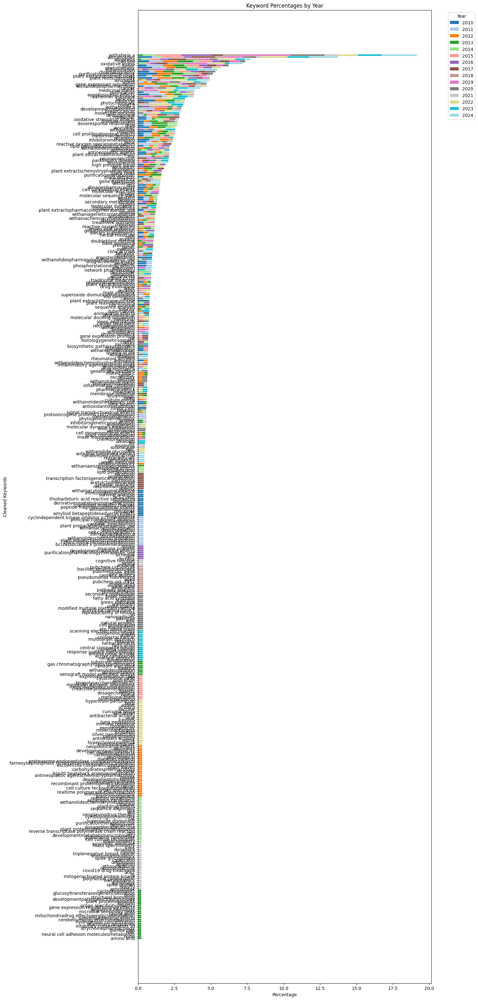

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

# Define a function to split and clean keywords
def split_and_clean_keywords(keywords):
    return [kw.strip() for kw in keywords.split(', ') if kw.strip()]

# Filter DataFrame for years since 2010
df_filtered = df[df['Date of Publication'] >= 2010]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Dictionary to hold keyword counts per year
keyword_counts_per_year = {}

# Process each group
for year, group in grouped_by_year:
    keyword_counts = Counter()
    total_keyword_count = 0

    for keywords in group['Cleaned Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)
            # Update total keyword count
            total_keyword_count += len(filtered_keywords)

    # Calculate percentages
    keyword_percentages = {kw: (count / total_keyword_count) * 100 for kw, count in keyword_counts.items() if count > 1}
    keyword_counts_per_year[year] = keyword_percentages

# Collect all keywords
all_keywords = set(kw for year_data in keyword_counts_per_year.values() for kw in year_data)
keyword_sums = {kw: sum(keyword_counts_per_year.get(year, {}).get(kw, 0) for year in keyword_counts_per_year) for kw in all_keywords}

# Create a DataFrame for plotting
plot_data = pd.DataFrame(keyword_counts_per_year).fillna(0)
plot_data = plot_data.loc[sorted(keyword_sums, key=keyword_sums.get, reverse=True)]

# Print the number of unique keywords
print(f"Number of unique keywords in the plot: {len(plot_data)}")

# Plotting
fig, ax = plt.subplots(figsize=(12, 40))

# Stack bars by years
bottom = pd.Series([0] * len(plot_data), index=plot_data.index)
cmap = plt.get_cmap('tab20', len(plot_data.columns))  # Use colormap with enough colors

for i, year in enumerate(plot_data.columns):
    ax.barh(plot_data.index, plot_data[year], left=bottom, color=cmap(i / len(plot_data.columns)), label=year)
    bottom += plot_data[year]

ax.set_xlabel('Percentage')
ax.set_ylabel('Cleaned Keywords')
ax.set_title('Keyword Percentages by Year')
ax.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gca().invert_yaxis()
plt.show()


Number of unique keywords in the plot: 53


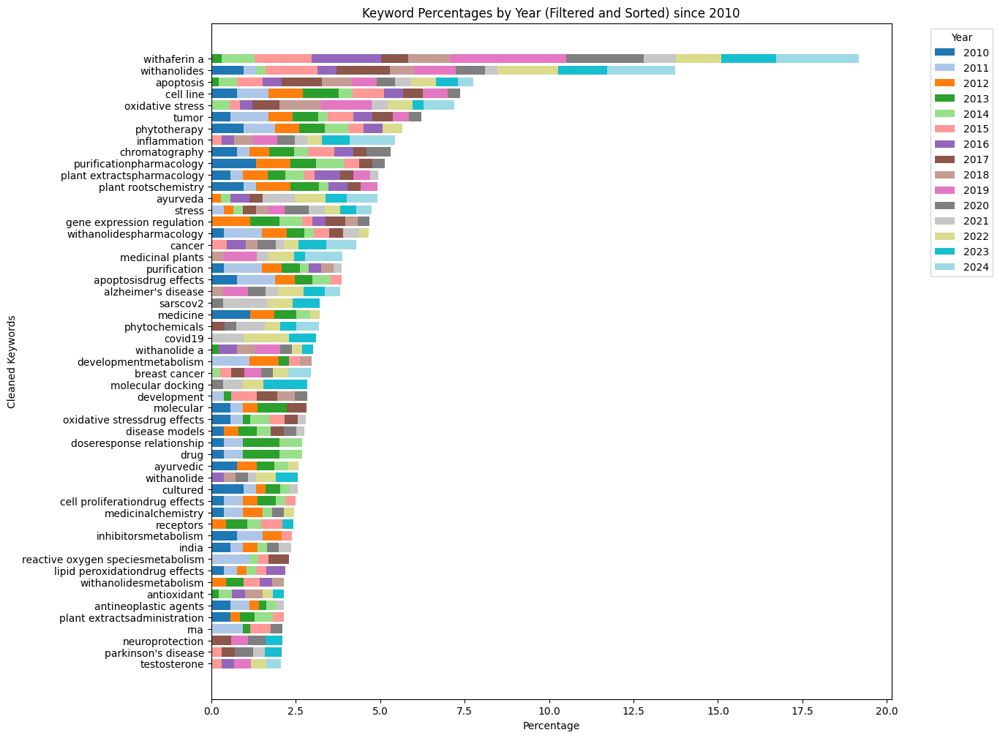

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

# Define a function to split and clean keywords
def split_and_clean_keywords(keywords):
    return [kw.strip() for kw in keywords.split(', ') if kw.strip()]

# Filter DataFrame for years since 2010
df_filtered = df[df['Date of Publication'] >= 2010]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Dictionary to hold keyword counts per year
keyword_counts_per_year = {}

# Process each group
for year, group in grouped_by_year:
    keyword_counts = Counter()
    total_keyword_count = 0

    for keywords in group['Cleaned Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)
            # Update total keyword count
            total_keyword_count += len(filtered_keywords)

    # Calculate percentages
    keyword_percentages = {kw: (count / total_keyword_count) * 100 for kw, count in keyword_counts.items() if count > 1}
    keyword_counts_per_year[year] = keyword_percentages

# Collect all keywords and filter those with a total percentage over 2%
all_keywords = set(kw for year_data in keyword_counts_per_year.values() for kw in year_data)
keyword_sums = {kw: sum(keyword_counts_per_year.get(year, {}).get(kw, 0) for year in keyword_counts_per_year) for kw in all_keywords}
filtered_keywords = {kw: pct for kw, pct in keyword_sums.items() if pct > 2}

# Create a DataFrame for plotting
filtered_plot_data = pd.DataFrame(
    {year: {kw: pct for kw, pct in keyword_counts_per_year.get(year, {}).items() if kw in filtered_keywords}
     for year in keyword_counts_per_year}
)
filtered_plot_data = filtered_plot_data.fillna(0)

# Sort by the total percentage of each keyword
sorted_keywords = sorted(filtered_keywords, key=lambda kw: keyword_sums[kw], reverse=True)
filtered_plot_data = filtered_plot_data.loc[sorted_keywords]

# Print the number of unique keywords
print(f"Number of unique keywords in the plot: {len(filtered_plot_data)}")

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))

# Stack bars by years
bottom = pd.Series([0] * len(filtered_plot_data), index=filtered_plot_data.index)
cmap = plt.get_cmap('tab20', len(filtered_plot_data.columns))  # Use colormap with enough colors

for i, year in enumerate(filtered_plot_data.columns):
    ax.barh(filtered_plot_data.index, filtered_plot_data[year], left=bottom, color=cmap(i / len(filtered_plot_data.columns)), label=year)
    bottom += filtered_plot_data[year]

ax.set_xlabel('Percentage')
ax.set_ylabel('Cleaned Keywords')
ax.set_title('Keyword Percentages by Year (Filtered and Sorted) since 2010')
ax.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
plot_data

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
withaferin a,0.000000,0.000000,0.000000,0.320856,0.973574,1.697531,2.127660,0.804829,1.197605,3.00,2.313167,1.021711,1.238390,1.669449,2.546296
withanolides,0.963391,0.377358,0.000000,0.000000,0.278164,1.543210,0.580271,1.609658,0.798403,1.25,0.889680,0.383142,1.857585,1.502504,1.851852
apoptosis,0.000000,0.000000,0.000000,0.213904,0.556328,0.771605,0.580271,1.207243,0.998004,0.75,0.533808,0.510856,0.773994,0.667780,0.462963
cell line,0.770713,0.943396,1.013025,1.069519,0.417246,0.925926,0.580271,0.603622,0.000000,0.75,0.355872,0.000000,0.000000,0.000000,0.000000
oxidative stress,0.000000,0.000000,0.000000,0.000000,0.556328,0.308642,0.386847,0.804829,1.397206,1.50,0.000000,0.510856,0.619195,0.333890,0.925926
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
glucosyltransferasesgeneticsisolation,0.000000,0.000000,0.000000,0.213904,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000
hydrogenion concentration,0.000000,0.000000,0.000000,0.213904,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000
strychninepharmacology,0.000000,0.000000,0.000000,0.213904,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000
inhibitory concentration 50,0.000000,0.000000,0.000000,0.213904,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000


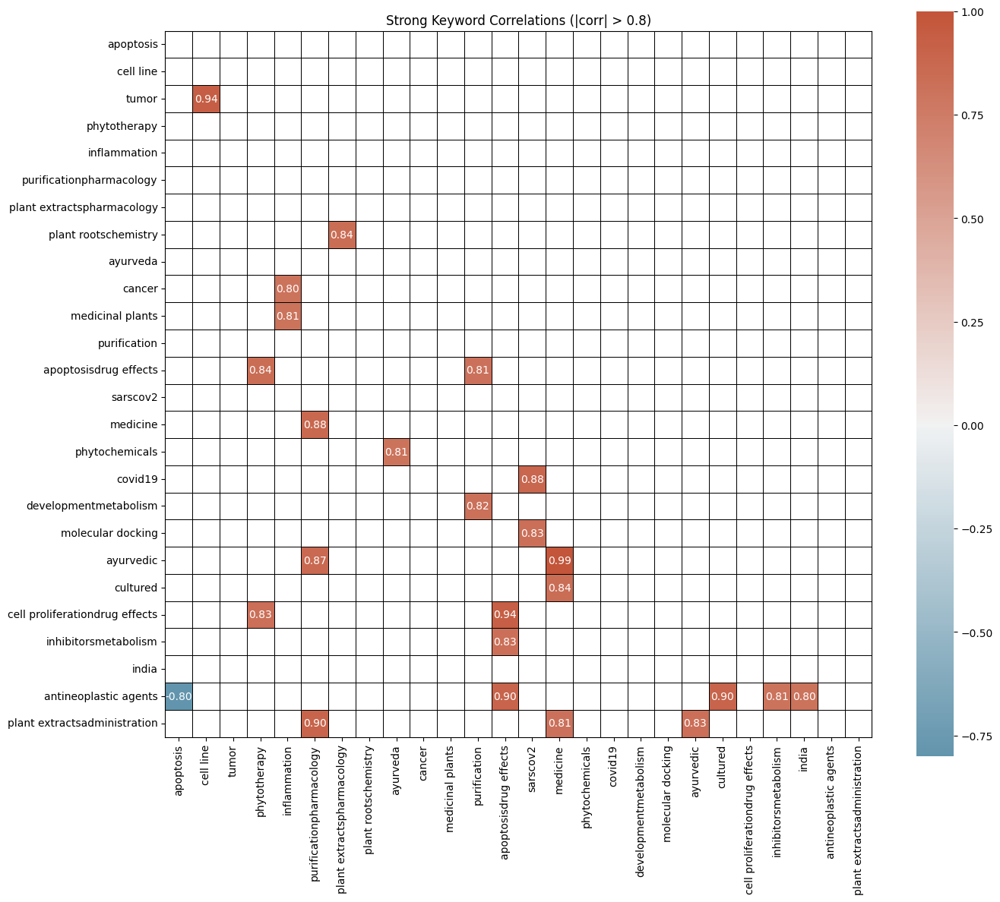

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = filtered_plot_data.T.corr()

# Filter correlations with absolute value greater than 0.8
strong_correlations = correlation_matrix[(correlation_matrix.abs() > 0.8) & (correlation_matrix.abs() != 1)]

# Drop rows and columns with all NaN values (no strong correlations)
strong_correlations = strong_correlations.dropna(how='all').dropna(axis=1, how='all')

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(strong_correlations, dtype=bool))

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 17))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio, adding grid lines
sns.heatmap(strong_correlations, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .75}, annot=True, fmt=".2f", linecolor='black', linestyle='-', ax=ax)

# Add grid lines
for _, spine in ax.spines.items():
    spine.set_visible(True)

plt.title("Strong Keyword Correlations (|corr| > 0.8)")
plt.show()

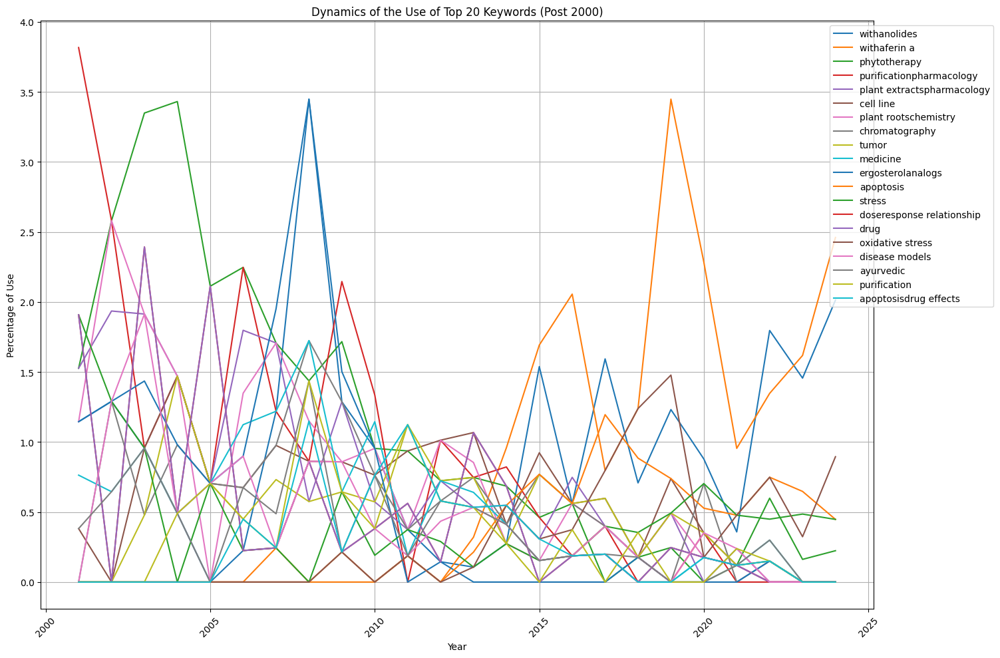

In [ ]:
import matplotlib.pyplot as plt

# Combine both lists and remove duplicates
words_to_exclude = set(name.lower() for name in plant_names + words_to_remove)

# Filter the DataFrame for years after 2000
df_filtered = df[df['Date of Publication'] > 2000]

# Create a dictionary to hold keyword counts per year
yearly_keyword_counts = {}

# Iterate through each row in the filtered DataFrame
for index, row in df_filtered.iterrows():
    year = row['Date of Publication']
    keywords = row['Cleaned Keywords']

    if isinstance(keywords, str):
        # Split keywords by comma and space
        keywords_list = keywords.lower().split(', ')
        # Filter out words to exclude
        filtered_keywords = [kw for kw in keywords_list if kw not in words_to_exclude]

        # Update yearly keyword counts
        if year not in yearly_keyword_counts:
            yearly_keyword_counts[year] = Counter()
        yearly_keyword_counts[year].update(filtered_keywords)

# Create a DataFrame from yearly_keyword_counts
keyword_year_df = pd.DataFrame(yearly_keyword_counts).fillna(0).astype(int)

# Ensure columns (years) are sorted
keyword_year_df = keyword_year_df.sort_index(axis=1)

# Calculate the percentage of use of each keyword for each year
keyword_year_percent_df = keyword_year_df.div(keyword_year_df.sum(axis=0), axis=1) * 100

# Get the top 100 keywords based on total counts across all years in the filtered data
top_keywords = keyword_year_df.sum(axis=1).nlargest(20).index

# Filter the DataFrame to include only the top 20 keywords
top_keyword_year_percent_df = keyword_year_percent_df.loc[top_keywords]

# Plot the dynamics of the use of the top 20 keywords after 2000
plt.figure(figsize=(15, 10))
for keyword in top_keywords:
    plt.plot(top_keyword_year_percent_df.columns, top_keyword_year_percent_df.loc[keyword], label=keyword)

plt.xlabel('Year')
plt.ylabel('Percentage of Use')
plt.title('Dynamics of the Use of Top 20 Keywords (Post 2000)')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to make room for legend
plt.show()

In [ ]:
# Transpose the DataFrame to have years as rows and keywords as columns
keyword_year_percent_df = keyword_year_percent_df.T

# Display the table
print("Keyword Usage Percentages by Year:")
keyword_year_percent_df

Keyword Usage Percentages by Year:


,anxiety,depression,insomnia,stress,ethnobotany,pharmacology,phytochemistry,toxicology,withanolides,ayurveda,...,cholinesterase inhibitorsanalysischemistrytoxicity,derivativeschemistrytoxicity,jejunumdrug effectsmetabolism,neutrophilsdrug effectspathology,alanine transaminaseblooddrug effects,aspartate aminotransferasesblooddrug effects,experimentalchemically inducedprevention,hypoglycemic agentsadministration,lipoproteinsblooddrug effects,pancreasdrug effectsenzymology
2001,0.000000,0.000000,0.000000,1.915709,0.000000,0.000000,0.000000,0.000000,1.149425,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2002,0.000000,0.000000,0.000000,1.290323,0.000000,0.000000,0.000000,0.000000,1.290323,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2003,0.000000,0.000000,0.000000,0.956938,0.000000,0.000000,0.000000,0.000000,0.956938,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.490196,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2005,0.000000,0.000000,0.000000,0.714286,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.714286,0.714286,0.714286,0.714286,0.714286,0.714286,0.714286,0.714286,0.714286,0.714286
2006,0.000000,0.000000,0.000000,0.228833,0.228833,0.000000,0.000000,0.000000,0.228833,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2007,0.000000,0.000000,0.000000,0.245098,0.245098,0.000000,0.000000,0.000000,1.225490,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.458213,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2009,0.000000,0.000000,0.000000,0.643777,0.000000,0.000000,0.000000,0.000000,1.287554,0.214592,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2010,0.000000,0.000000,0.000000,0.192678,0.000000,0.000000,0.000000,0.000000,0.963391,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
# Iterate through each row in the filtered DataFrame
for index, row in df_filtered.iterrows():
    year = row['Date of Publication']
    keywords = row['Cleaned Keywords']

    if isinstance(keywords, str):
        # Split keywords by comma and space
        keywords_list = keywords.lower().split(', ')
        # Filter out words to exclude
        filtered_keywords = [kw for kw in keywords_list if kw not in words_to_exclude]

        # Update yearly keyword counts
        if year not in yearly_keyword_counts:
            yearly_keyword_counts[year] = Counter()
        yearly_keyword_counts[year].update(filtered_keywords)

# Create a DataFrame from yearly_keyword_counts
keyword_year_df = pd.DataFrame(yearly_keyword_counts).fillna(0).astype(int)

# Ensure columns (years) are sorted
keyword_year_df = keyword_year_df.sort_index(axis=1)

# Display the DataFrame
print("Keyword Frequencies Per Year:")
keyword_year_df

Keyword Frequencies Per Year:


,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
anxiety,0,0,0,0,0,0,0,0,0,0,...,0,0,2,2,4,0,9,2,2,2
depression,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,4,0,2,2
insomnia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,8,0,0,0
stress,9,4,4,0,2,2,2,0,6,2,...,1,2,4,3,4,7,7,6,6,4
ethnobotany,0,0,0,0,0,2,2,0,0,0,...,0,0,0,0,4,0,4,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
experimentalchemically inducedprevention,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
hypoglycemic agentsadministration,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
lipoproteinsblooddrug effects,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
pancreasdrug effectsenzymology,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Filter DataFrame for all years
df_filtered = df[df['Date of Publication'] > 0]  # Ensure no non-positive years are included

# Create a dictionary to hold total keyword counts per year
yearly_total_keywords = {}

# Iterate through each row in the filtered DataFrame
for index, row in df_filtered.iterrows():
    year = row['Date of Publication']
    keywords = row['Cleaned Keywords']

    if isinstance(keywords, str):
        # Split keywords by comma and space
        keywords_list = keywords.lower().split(', ')
        # Filter out words to exclude
        filtered_keywords = [kw for kw in keywords_list if kw not in words_to_exclude]

        # Update yearly total keyword counts
        if year not in yearly_total_keywords:
            yearly_total_keywords[year] = 0
        yearly_total_keywords[year] += len(filtered_keywords)

# Create a DataFrame from yearly_total_keywords
total_keywords_df = pd.DataFrame(list(yearly_total_keywords.items()), columns=['Year', 'Total Keywords'])

# Ensure the DataFrame is sorted by year
total_keywords_df = total_keywords_df.sort_values(by='Year').reset_index(drop=True)

# Display the DataFrame
print("Total Number of Keywords Per Year:")
total_keywords_df

Total Number of Keywords Per Year:


,Year,Total Keywords
0,1958,2
1,1960,1
2,1961,1
3,1962,4
4,1964,6
5,1965,2
6,1968,3
7,1969,6
8,1973,7
9,1974,23


## Lem Keywords

In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

# Words to remove and stopwords
words_to_remove = {'use', 'used', 'using', 'also', 'plant', 'effect', 'effects', 'plants'}
additional_stopwords = {'abbreviation', 'abdominal', 'aberrant', 'aberration', 'abeta'}
stop_words = set(stopwords.words('english')).union(words_to_remove, additional_stopwords)

# Function to clean, tokenize, and lemmatize text, preserving specific terms
def clean_tokenize_lemmatize_text(text):
    if pd.isna(text):
        return None
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Convert to lowercase
    text = text.lower()
    # Tokenize
    tokens = word_tokenize(text)
    # Remove tokens that are not alphabetic or shorter than 2 letters
    tokens = [token for token in tokens if len(token) > 1]
    # Remove stopwords and specific words
    tokens = [word for word in tokens if word not in stop_words and word not in words_to_remove]
    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmas = [lemmatizer.lemmatize(token) for token in tokens if token]  # Filter out empty tokens
    # Remove duplicates
    lemmas_unique = list(set(lemmas))
    # Join lemmatized tokens back into a string
    return ', '.join(lemmas_unique) if lemmas_unique else None

# Clean, tokenize, and lemmatize 'Keywords' to create 'Lem Keywords'
df['Lem Keywords'] = df['Cleaned Keywords'].apply(clean_tokenize_lemmatize_text)

# Display the DataFrame
df[['Keywords', 'Cleaned Keywords', 'Lem Keywords']].head(100)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Keywords,Cleaned Keywords,Lem Keywords
0,"Anxiety, Ashwagandha, Withania Somnifera, Depr...","anxiety, depression, insomnia, stress","stress, anxiety, depression, insomnia"
1,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...","ethnobotany, pharmacology, phytochemistry, tox...","toxicology, pharmacology, phytochemistry, ethn..."
2,"Ashwagandha, Withania Somnifera, Anti-Inflamma...","inflammatory activity, anticancer activity, an...","herbal, inflammatory, medicine, anticancer, ex..."
3,"Alzheimer's Disease, Anti-Arthritic, Anti-Bact...","alzheimer's disease, arthritic, bacterial, can...","stress, inflammatory, alzheimers, diabetic, ar..."
4,"Alzheimer Diseasedrug Therapypathology, Humans...","alzheimer diseasedrug therapypathology, medici...","diseasesdrug, neurodegenerative, neuroprotecti..."
...,...,...,...
95,"Anticancer Activity, Traditional Medicine, Tum...","anticancer activity, traditional medicine, tum...","traditional, medicine, anticancer, inhibition,..."
96,"Ashwagandha, Withania Somnifera, Niosomes, Ski...","niosomes, skin diffusion, solid lipid nanopart...","stability, niosomes, tapestripping, skin, lipi..."
97,"Covid-19, Lps, Pbmcs, Tlr-4, Withania Somnifer...","covid19, lps, pbmcs, tlr4, cytokines, lung inf...","pbmcs, lung, covid19, cytokine, inflammation, ..."
98,"Withania Somnifera, Anticancer, Antiherpes Vir...","anticancer, antiherpes virus, antiinflammatory...","antileishminial, virus, antiinflammatory, anti..."


In [ ]:
# Display the most common keywords and their counts after filtering
keyword_counts = Counter()
for keywords in df['Lem Keywords']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

print("Most common keywords after filtering:")
for keyword, count in keyword_counts.most_common(600):
    print(f"{keyword}: {count}")

# Find the amount of unique values after filtering
unique_keywords = set(keyword_counts.keys())
unique_keyword_count = len(unique_keywords)
print(f"Number of unique keywords after filtering: {unique_keyword_count}")

Most common keywords after filtering:
cell: 207
medicine: 130
drug: 130
withanolides: 125
stress: 117
disease: 117
withaferin: 115
molecular: 107
phytotherapy: 105
therapy: 101
extractspharmacology: 92
protein: 91
model: 88
medicinal: 83
tumor: 82
cancer: 80
oxidative: 79
rootschemistry: 74
ayurvedic: 72
gene: 72
line: 72
root: 69
antineoplastic: 67
agent: 66
acid: 64
chromatography: 60
herbal: 59
relationship: 58
withanolide: 57
inflammatory: 56
ergosterolanalogs: 56
extract: 54
apoptosis: 53
inbred: 53
expression: 53
receptor: 52
doseresponse: 52
antioxidant: 51
analysis: 51
agentspharmacology: 51
lipid: 49
docking: 48
activity: 47
effectsmetabolism: 44
high: 43
reactive: 43
purificationpharmacology: 42
liquid: 42
dna: 41
medicinalchemistry: 41
apoptosisdrug: 41
simulation: 40
india: 40
pressure: 40
traditional: 39
factor: 39
ayurveda: 37
inflammation: 37
breast: 37
oxygen: 37
extractsadministration: 36
cultured: 36
culture: 35
assay: 35
regulation: 35
phytochemical: 34
test: 34
pero

In [ ]:
# Filter out keywords that appear only once
filtered_keywords = {kw for kw, count in keyword_counts.items() if count > 1}

# Function to filter out keywords that appear only once
def filter_single_occurrence_keywords(keywords):
    if isinstance(keywords, str):
        return ', '.join([kw for kw in keywords.split(', ') if kw in filtered_keywords])
    return None

# Update the 'Lem Keywords' column with only keywords that appear more than once
df['Lem Keywords'] = df['Lem Keywords'].apply(filter_single_occurrence_keywords)

# Remove empty values from 'Lem Keywords'
df['Lem Keywords'] = df['Lem Keywords'].replace('', None)

# Display the most common keywords and their counts after filtering
keyword_counts = Counter()
for keywords in df['Lem Keywords']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

print("Most common keywords after filtering:")
for keyword, count in keyword_counts.most_common(600):
    print(f"{keyword}: {count}")

# Find the amount of unique values after filtering
unique_keywords = set(keyword_counts.keys())
unique_keyword_count = len(unique_keywords)
print(f"Number of unique keywords after filtering: {unique_keyword_count}")

Most common keywords after filtering:
cell: 207
medicine: 130
drug: 130
withanolides: 125
stress: 117
disease: 117
withaferin: 115
molecular: 107
phytotherapy: 105
therapy: 101
extractspharmacology: 92
protein: 91
model: 88
medicinal: 83
tumor: 82
cancer: 80
oxidative: 79
rootschemistry: 74
ayurvedic: 72
gene: 72
line: 72
root: 69
antineoplastic: 67
agent: 66
acid: 64
chromatography: 60
herbal: 59
relationship: 58
withanolide: 57
inflammatory: 56
ergosterolanalogs: 56
extract: 54
apoptosis: 53
inbred: 53
expression: 53
receptor: 52
doseresponse: 52
antioxidant: 51
analysis: 51
agentspharmacology: 51
lipid: 49
docking: 48
activity: 47
effectsmetabolism: 44
high: 43
reactive: 43
purificationpharmacology: 42
liquid: 42
dna: 41
medicinalchemistry: 41
apoptosisdrug: 41
simulation: 40
india: 40
pressure: 40
traditional: 39
factor: 39
ayurveda: 37
inflammation: 37
breast: 37
oxygen: 37
extractsadministration: 36
cultured: 36
culture: 35
assay: 35
regulation: 35
phytochemical: 34
test: 34
pero

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Name                           1399 non-null   object
 1   PubMed ID                      1399 non-null   int64 
 2   Link                           1399 non-null   object
 3   Type Publication               1399 non-null   object
 4   Journal Title                  1399 non-null   object
 5   Date of Publication            1399 non-null   int64 
 6   Title                          1399 non-null   object
 7   Abstract                       1399 non-null   object
 8   Keywords                       1399 non-null   object
 9   Place Publication              1399 non-null   object
 10  Type Publication Standardized  1399 non-null   object
 11  Cleaned Keywords               1399 non-null   object
 12  Lem Keywords                   1399 non-null   object
 13  Clu

In [ ]:
# # Print rows with empty 'Lem Keywords'
# empty_keywords_df = df[df['Lem Keywords'].isnull()]
# print("Rows with empty 'Lem Keywords':")
# empty_keywords_df

Rows with empty 'Lem Keywords':


,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords,Lem Keywords
474,Withania somnifera,24544974,https://pubmed.ncbi.nlm.nih.gov/24544974,Journal Article,"Antibiotics & chemotherapy (Northfield, Ill.)",1958,The antibacterial principle of Withania somnif...,The antibacterial principle of Withania somnif...,"Antiseptics, Plantseffects",United States,Journal Article,"antiseptics, plantseffects",None
572,Withania somnifera,35087161,https://pubmed.ncbi.nlm.nih.gov/35087161,"Journal Article, Research Support, Non-U.S. Gov't",Scientific reports,2022,Sodium-calcium exchanger isoform-3 targeted Wi...,The third isoform of the Na(+)-Ca(2+) exchange...,Sodium-Calcium Exchanger,England,Journal Article,sodiumcalcium exchanger,None
573,Withania somnifera,30000965,https://pubmed.ncbi.nlm.nih.gov/30000965,"Review, Book Chapter",Drugs and Lactation Database (LactMed®) [Inter...,2006,Withania.,Withania (Withania somnifera) roots and berrie...,"Ashwagandha, Ajagandha, Withania, Indian Ginse...",Bethesda (MD),Review,"ext, einecs 2904349",None
1230,Withania somnifera,37469645,https://pubmed.ncbi.nlm.nih.gov/37469645,Journal Article,Journal of pharmacy & bioallied sciences,2023,Nicotine Free Herbal Composition for Smoking D...,BACKGROUND: Smoking is a major predisposing fa...,"Co, Cohb, Smotect Tablets, De-Addiction",India,Journal Article,"co, cohb, smotect tablets, deaddiction",None


In [ ]:
# # Keywords to be added for each PubMed ID
# keywords_24544974 = [
#     "Antibacterial principle",
#     "Withania somnifera",
#     "Isoation",
#     "Antibacterial activity",
#     "Plant extracts",
#     "Natural antibiotics",
#     "Medicinal plants",
#     "Traditional medicine",
#     "Phytochemistry",
#     "Bioactive compounds"
# ]

# keywords_35087161 = [
#     "Na(+)-Ca(2+) exchanger (NCX3)",
#     "Neuronal excitotoxicity",
#     "Alzheimer's disease (AD)",
#     "Withania somnifera (Ashwagandha)",
#     "Abeta(1-42) aggregation",
#     "Cognitive impairment",
#     "5xFAD mice model",
#     "Antioxidants",
#     "Oxidative stress",
#     "Phytochemical analysis"
# ]

# keywords_30000965 = [
#     "Withania somnifera",
#     "Ashwagandha",
#     "Galactogogue",
#     "Breastfeeding",
#     "Steroidal lactones",
#     "Alkaloids",
#     "Saponins",
#     "Dietary supplements",
#     "Lactation",
#     "Herbal medicine"
# ]

# keywords_37469645 = [
#     "Smoking cessation",
#     "Nicotine-free",
#     "Herbal composition",
#     "Clinical study",
#     "Mucuna pruriens",
#     "Withania somnifera",
#     "Bacopa monnieri",
#     "Alveolar carbon monoxide",
#     "Carboxyhemoglobin levels",
#     "Quality of life"
# ]

# # Mapping keywords to PubMed IDs
# keywords_mapping = {
#     24544974: keywords_24544974,
#     35087161: keywords_35087161,
#     30000965: keywords_30000965,
#     37469645: keywords_37469645
# }

# # Adding new keywords to the DataFrame
# for pmid, keywords in keywords_mapping.items():
#     df.loc[df['PubMed ID'] == pmid, 'Keywords'] = ', '.join(keywords)

In [ ]:
# import string
# import nltk
# from nltk.tokenize import word_tokenize
# from nltk.stem import WordNetLemmatizer

# import google.generativeai as genai
# from google.colab import userdata
# import os
# import time
# # Set up NLTK resources
# nltk.download('punkt')
# nltk.download('wordnet')

# # Retrieve and set the API key
# GOOGLE_API_KEY = userdata.get('gemini_key')
# os.environ['GOOGLE_API_KEY'] = GOOGLE_API_KEY

# # Configure the generative AI client
# genai.configure(api_key=GOOGLE_API_KEY)

# # Load the generative model
# model = genai.GenerativeModel('gemini-pro')

# # Function to generate keywords from an abstract, with retries on 429 errors
# def get_keywords_from_gemini(abstract):
#     query = f"Extract keywords (but no more than 10 keywords or keyword phrases) from the following abstract:\n{abstract}"
#     retries = 10  # Number of retries
#     delay = 5  # Initial delay in seconds

#     while retries > 0:
#         try:
#             response = model.generate_content(query)
#             if response and response.candidates:
#                 response_content = response.candidates[0].content.parts[0].text.strip()
#                 return response_content
#             else:
#                 print(f"No content found for {abstract}")
#                 return None
#         except IndexError:
#             print(f"Failed to generate keywords for {abstract}: list index out of range")
#             return None
#         except genai.GenerativeServiceException as e:
#             if "429" in str(e):  # Check if the error message contains 429
#                 print(f"Rate limit exceeded. Retrying in {delay} seconds...")
#                 time.sleep(delay)
#                 retries -= 1
#                 delay *= 2  # Exponential backoff
#             else:
#                 print(f"Failed to generate keywords for {abstract}: {e}")
#                 return None
#         except Exception as e:
#             print(f"Failed to generate keywords for {abstract}: {e}")
#             return None

#     print(f"Maximum retries reached for {abstract}. Unable to generate keywords.")
#     return None


# # Fill empty Lem Keywords with information from Abstract using Gemini API
# for index, row in df.iterrows():
#     if pd.isna(row['Lem Keywords']) and not pd.isna(row['Abstract']):
#         try:
#             keywords = get_keywords_from_gemini(row['Abstract'])
#             if keywords:
#                 df.at[index, 'Lem Keywords'] = keywords
#                 print(f"Generated lem keywords for index {index}: {keywords}")
#         except Exception as e:
#             print(f"Failed to generate lem keywords for index {index}: {e}")

# # Clean, tokenize, and lemmatize Lem Keywords in place
# df['Lem Keywords'] = df['Lem Keywords'].apply(clean_tokenize_lemmatize_text)


# # Print the updated DataFrame with generated lem keywords
# print("\nUpdated DataFrame with generated lem keywords:")
# df.head()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Generated lem keywords for index 30: * Amyotrophic lateral sclerosis (ALS)
* Withania somnifera (WS)
* Ashwagandha
* Winter cherry
* Inflammation
* Oxidative stress
* Autophagy
* Mitochondrial function
* Apoptosis
* Clinical trial
Generated lem keywords for index 592: 1. Ashwagandha (Withania somnifera)
2. Triterpenoid steroidal lactones
3. Withanolides
4. Cytochrome P450 (CYP450) enzymes
5. Methyl jasmonate
6. Secondary metabolism
7. Virus induced gene silencing (VIGS)
8. Transient overexpression
9. Withaferin A
10. Biotic stress

Updated DataFrame with generated lem keywords:


,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Lem Keywords
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article,"depression, stress, anxiety, insomnia"
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article,"ethnobotany, toxicology, withanolides, pharmac..."
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article,"medicine, herbal, activity, antiinflammatory, ..."
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article,"antibacterial, stroke, antiarthritic, antiinfl..."
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article,"effectschemistryisolation, injuriesdrug, human..."


In [ ]:
df.head()

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords,Lem Keywords
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article,"anxiety, depression, insomnia, stress","stress, anxiety, depression, insomnia"
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article,"ethnobotany, pharmacology, phytochemistry, tox...","toxicology, pharmacology, phytochemistry, ethn..."
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article,"inflammatory activity, anticancer activity, an...","herbal, inflammatory, medicine, anticancer, ex..."
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article,"alzheimer's disease, arthritic, bacterial, can...","stress, inflammatory, alzheimers, diabetic, ar..."
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article,"alzheimer diseasedrug therapypathology, medici...","diseasesdrug, neurodegenerative, neuroprotecti..."


In [ ]:
from collections import Counter

# Count frequency of keywords
keyword_counts = Counter()

# Iterate through each cleaned keyword entry in the DataFrame
for keywords in df['Lem Keywords']:
    if isinstance(keywords, str):
        # Split keywords by comma and space and update counter
        keyword_counts.update(keywords.split(', '))

# Count keywords that appear exactly once
unique_keywords_count = sum(1 for count in keyword_counts.values() if count == 1)

print(f"Number of unique keywords appearing exactly once: {unique_keywords_count}")

Number of unique keywords appearing exactly once: 0


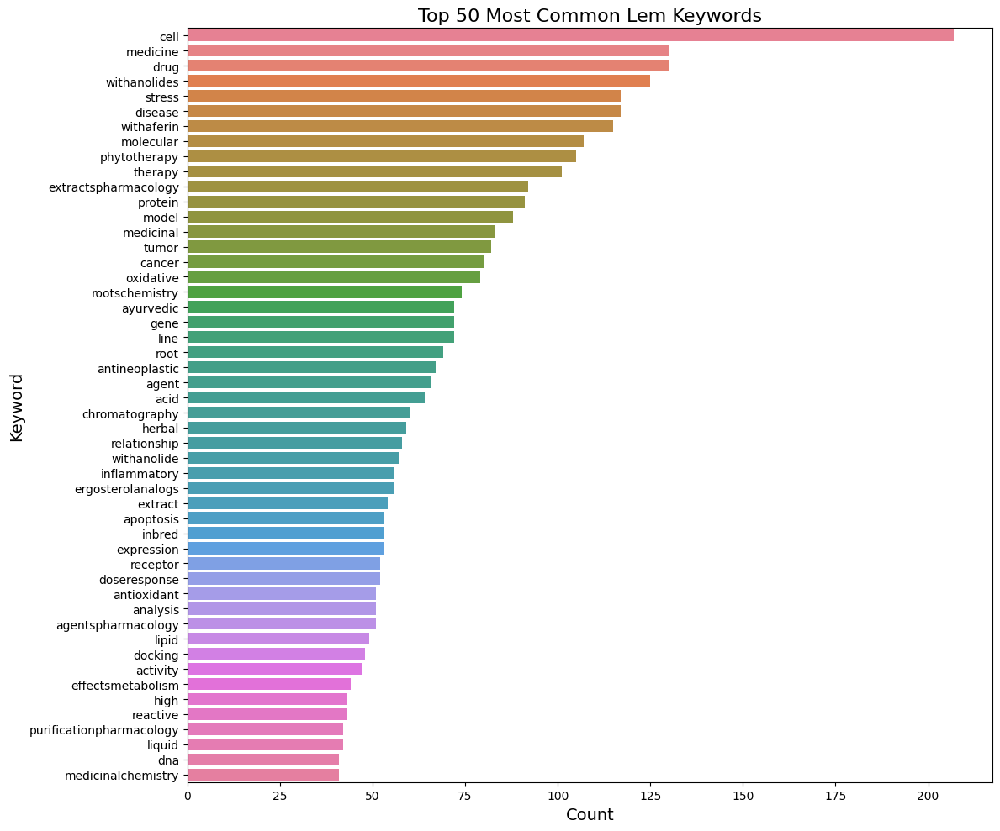

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extract the 100 most common keywords and their counts
common_keywords = keyword_counts.most_common(50)

# Create a DataFrame for visualization
keyword_df = pd.DataFrame(common_keywords, columns=['Keyword', 'Count'])

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))
sns.barplot(x='Count', y='Keyword', hue='Keyword', data=keyword_df, dodge=False, legend=False)

# Add titles and labels
plt.title('Top 50 Most Common Lem Keywords', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Keyword', fontsize=14)

# Show the plot
plt.tight_layout()
plt.show()


Year: 1958
Most common keywords with counts and percentages:
bioactive: 1 (8.33%)
traditional: 1 (8.33%)
medicinal: 1 (8.33%)
medicine: 1 (8.33%)
extract: 1 (8.33%)
principle: 1 (8.33%)
antibacterial: 1 (8.33%)
natural: 1 (8.33%)
antibiotic: 1 (8.33%)
phytochemistry: 1 (8.33%)
compound: 1 (8.33%)
activity: 1 (8.33%)
Number of unique keywords: 12


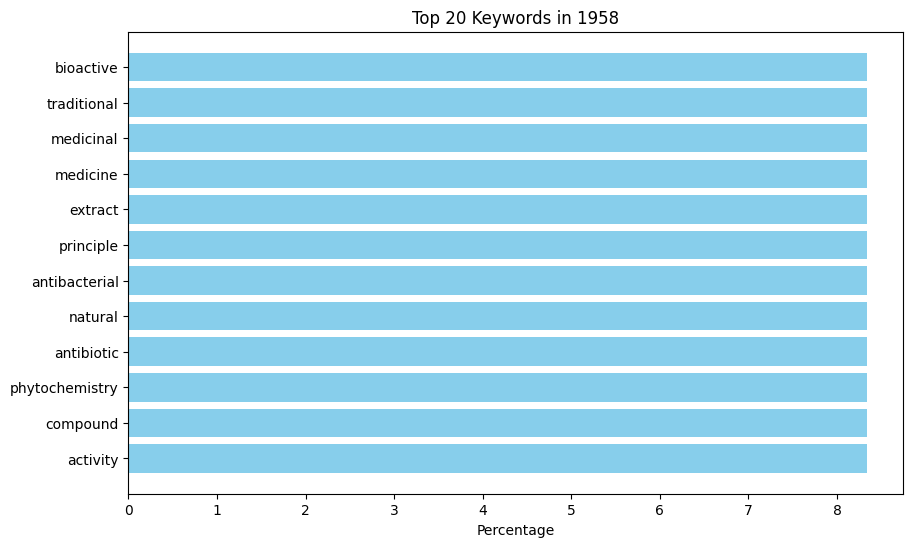


Year: 1960
Most common keywords with counts and percentages:
medicinalpharmacology: 1 (100.00%)
Number of unique keywords: 1


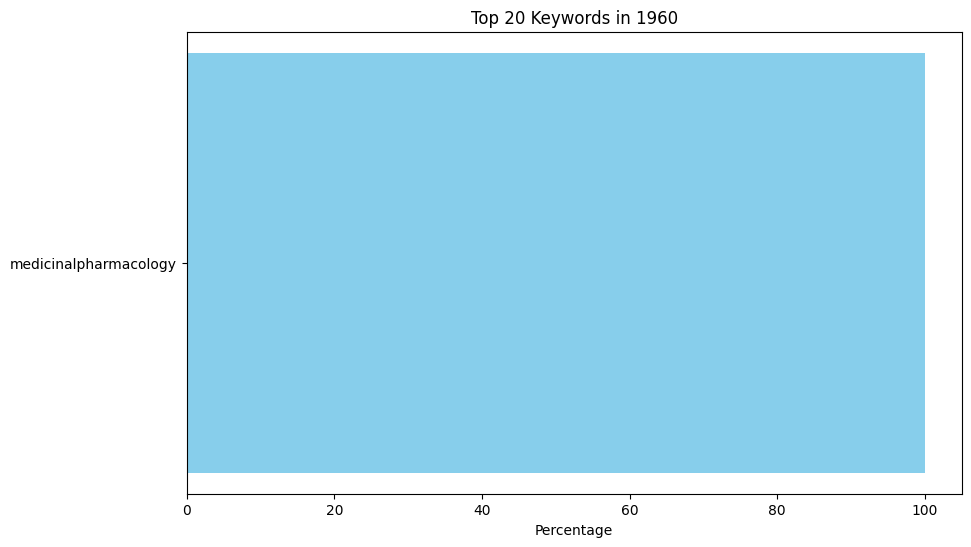


Year: 1961
Most common keywords with counts and percentages:
medicinal: 1 (100.00%)
Number of unique keywords: 1


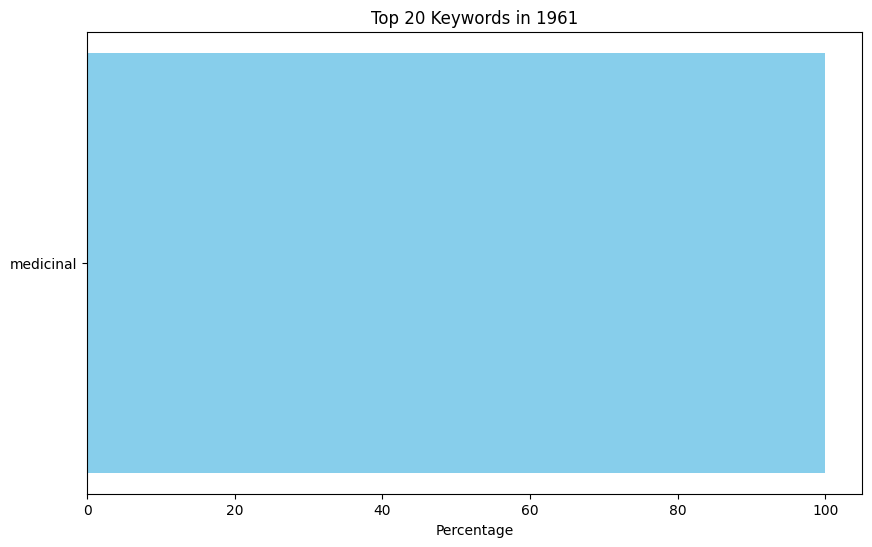


Year: 1962
Most common keywords with counts and percentages:
alkaloid: 1 (33.33%)
medicinalchemistry: 1 (33.33%)
medicinalpharmacology: 1 (33.33%)
Number of unique keywords: 3


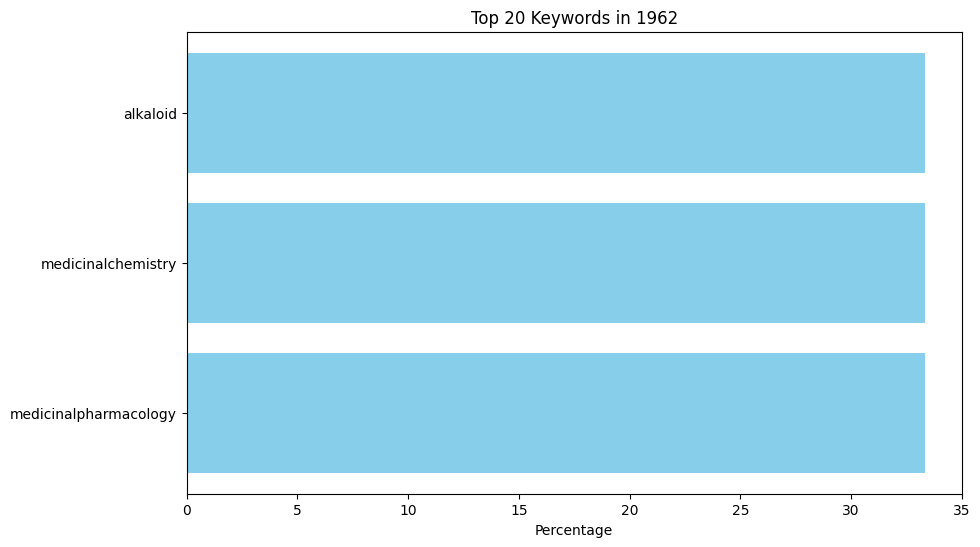


Year: 1964
Most common keywords with counts and percentages:
chemical: 1 (12.50%)
chemistry: 1 (12.50%)
phenomenon: 1 (12.50%)
cobalt: 1 (12.50%)
acid: 1 (12.50%)
glutathione: 1 (12.50%)
bacterial: 1 (12.50%)
agent: 1 (12.50%)
Number of unique keywords: 8


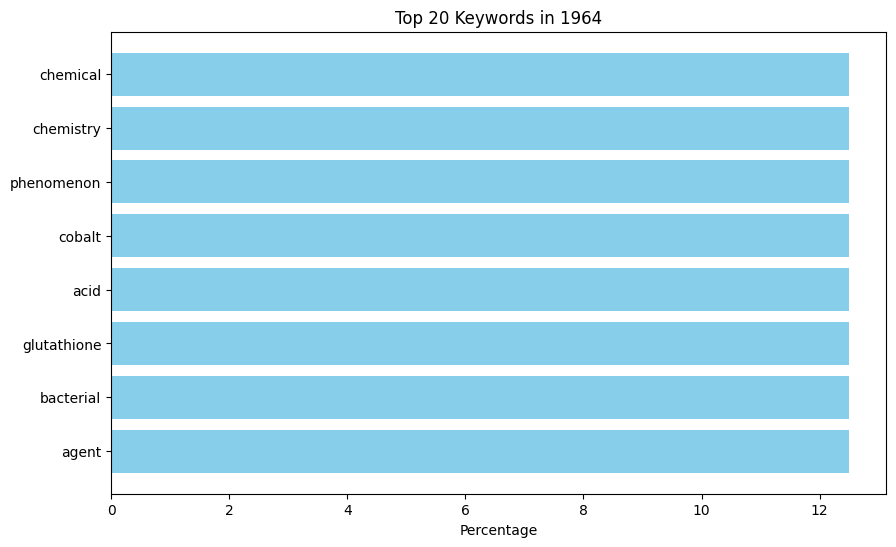


Year: 1965
Most common keywords with counts and percentages:
medicinal: 1 (50.00%)
agriculture: 1 (50.00%)
Number of unique keywords: 2


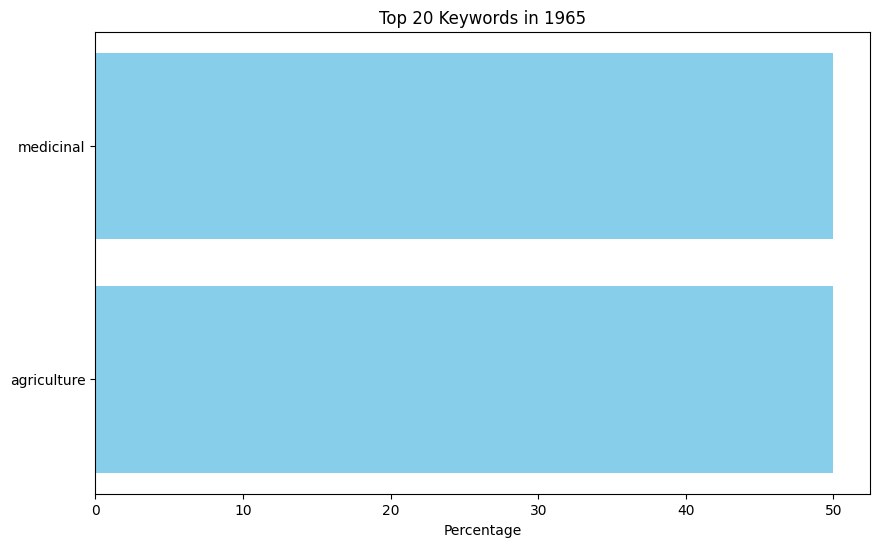


Year: 1968
Most common keywords with counts and percentages:
medicinalgrowth: 1 (33.33%)
development: 1 (33.33%)
season: 1 (33.33%)
Number of unique keywords: 3


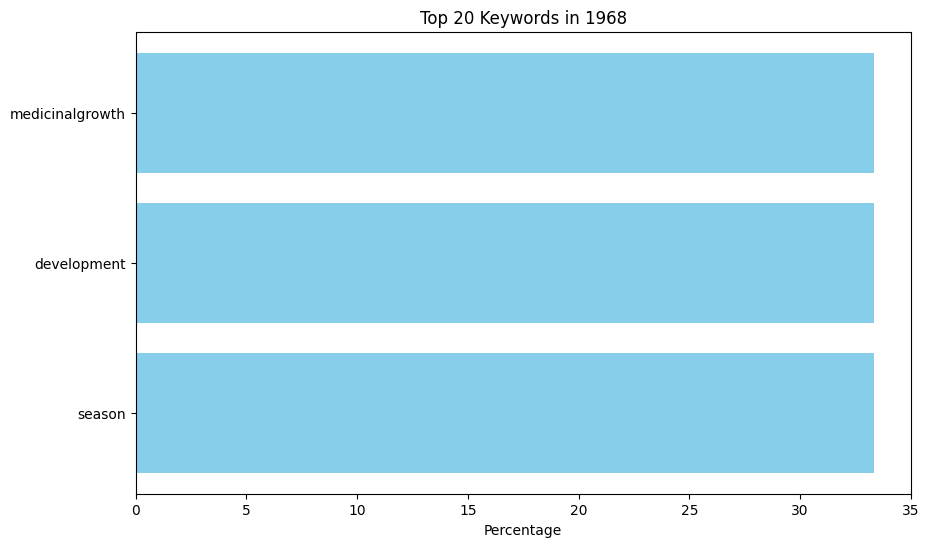


Year: 1969
Most common keywords with counts and percentages:
medicinalgrowth: 1 (20.00%)
development: 1 (20.00%)
nitrogen: 1 (20.00%)
acidspharmacology: 1 (20.00%)
fertilizer: 1 (20.00%)
Number of unique keywords: 5


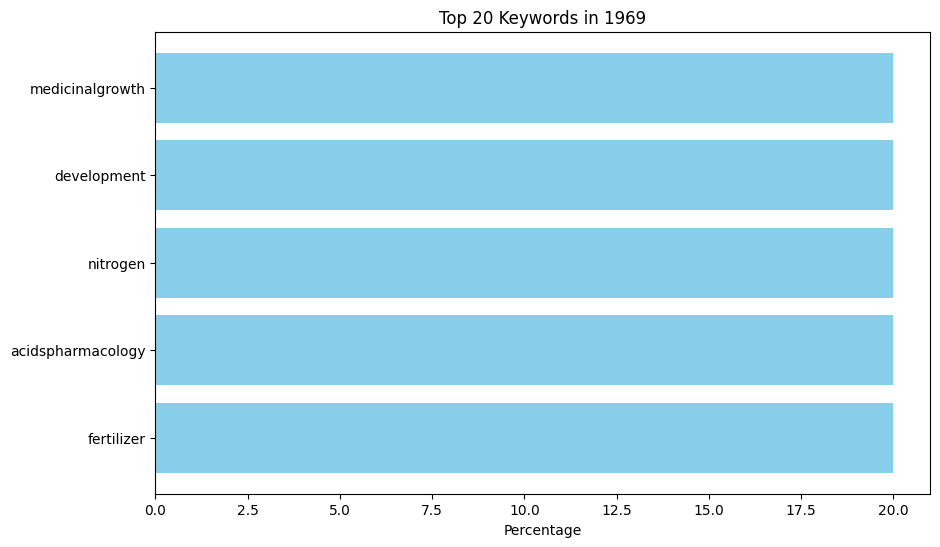


Year: 1973
Most common keywords with counts and percentages:
chemical: 1 (14.29%)
chemistry: 1 (14.29%)
phenomenon: 1 (14.29%)
infrared: 1 (14.29%)
purification: 1 (14.29%)
spectrophotometry: 1 (14.29%)
medicinalanalysis: 1 (14.29%)
Number of unique keywords: 7


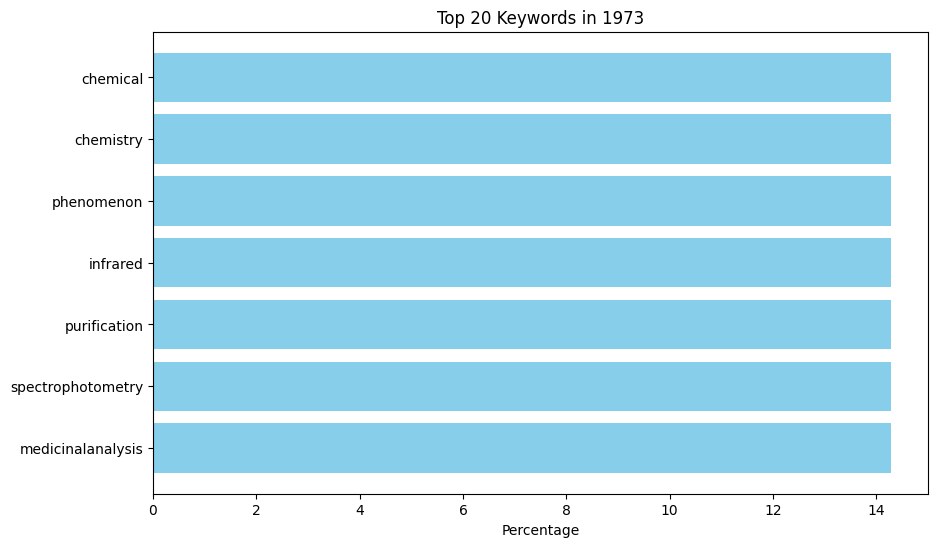


Year: 1974
Most common keywords with counts and percentages:
antineoplastic: 2 (9.52%)
india: 2 (9.52%)
purification: 2 (9.52%)
medicinalanalysis: 2 (9.52%)
chemical: 1 (4.76%)
chemistry: 1 (4.76%)
phenomenon: 1 (4.76%)
extract: 1 (4.76%)
agentsisolation: 1 (4.76%)
seedsgrowth: 1 (4.76%)
development: 1 (4.76%)
cholesterolanalogs: 1 (4.76%)
derivativesanalysis: 1 (4.76%)
alkaloidsanalysis: 1 (4.76%)
culture: 1 (4.76%)
technique: 1 (4.76%)
pharmacognosy: 1 (4.76%)
Number of unique keywords: 17


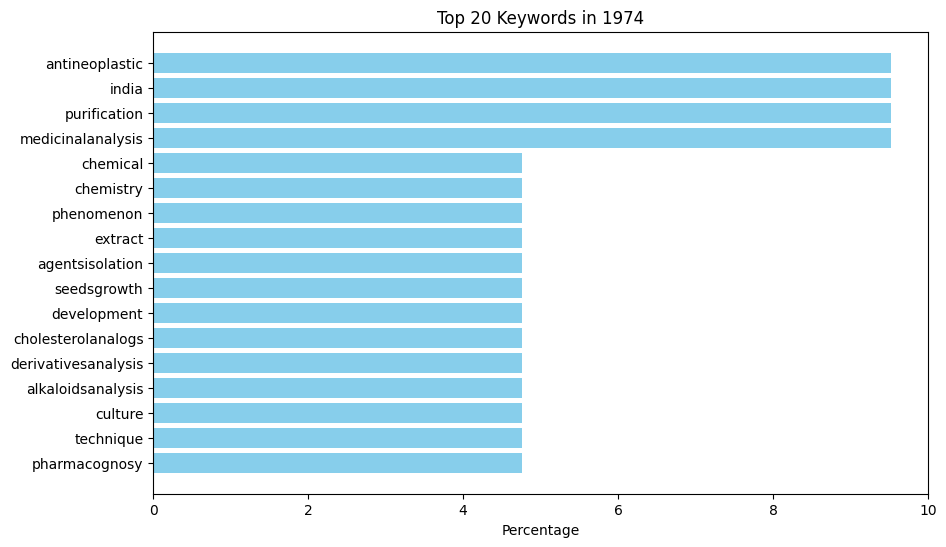


Year: 1982
Most common keywords with counts and percentages:
delivery: 1 (10.00%)
medicinal: 1 (10.00%)
medicine: 1 (10.00%)
sperm: 1 (10.00%)
research: 1 (10.00%)
factor: 1 (10.00%)
health: 1 (10.00%)
technology: 1 (10.00%)
family: 1 (10.00%)
agent: 1 (10.00%)
Number of unique keywords: 10


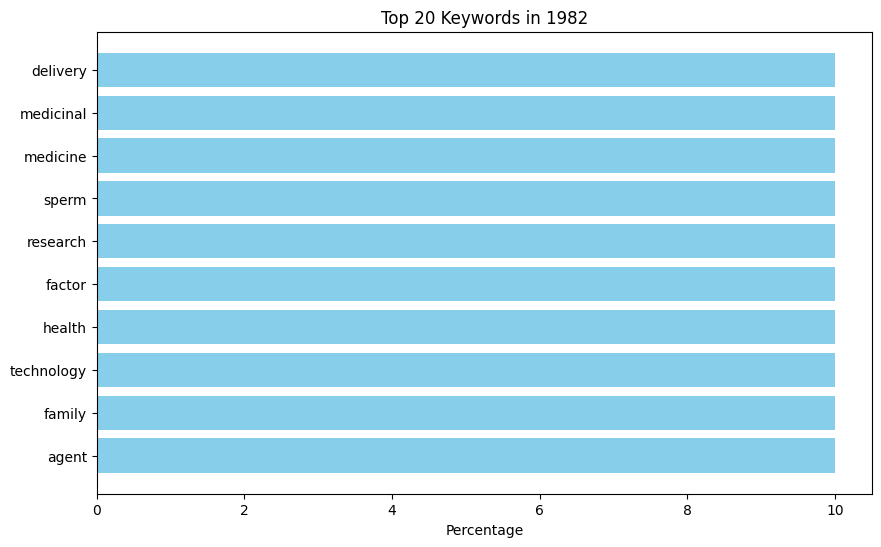


Year: 1983
Most common keywords with counts and percentages:
inflammatory: 2 (8.33%)
jejunummetabolism: 2 (8.33%)
agentspharmacology: 2 (8.33%)
inflammationmetabolism: 2 (8.33%)
oxyphenbutazonepharmacology: 2 (8.33%)
intestinal: 2 (8.33%)
absorptiondrug: 2 (8.33%)
clinical: 1 (4.17%)
longa: 1 (4.17%)
curcuma: 1 (4.17%)
preparation: 1 (4.17%)
ayurvedic: 1 (4.17%)
sign: 1 (4.17%)
time: 1 (4.17%)
factor: 1 (4.17%)
glucosemetabolism: 1 (4.17%)
extractspharmacology: 1 (4.17%)
Number of unique keywords: 17


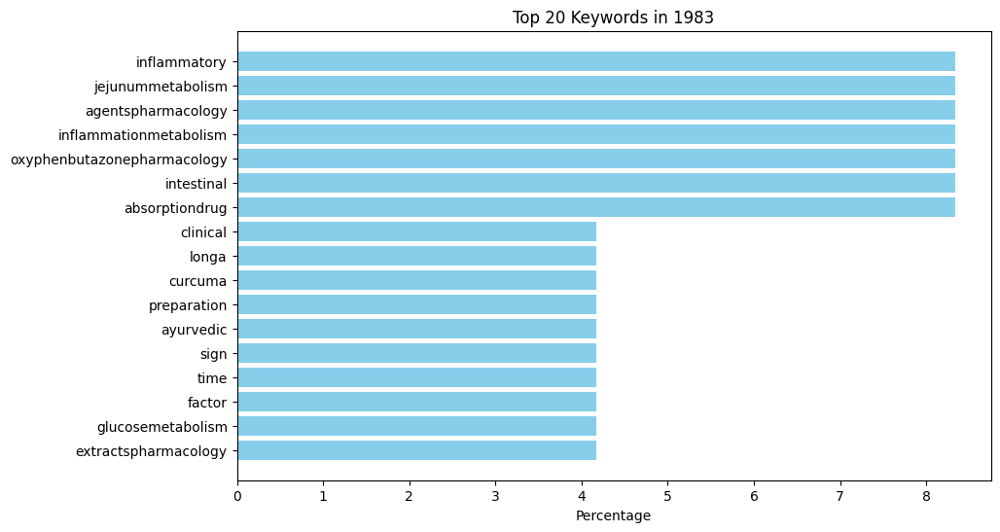


Year: 1985
Most common keywords with counts and percentages:
sri: 1 (10.00%)
medicine: 1 (10.00%)
strain: 1 (10.00%)
liverdrug: 1 (10.00%)
lanka: 1 (10.00%)
kidneydrug: 1 (10.00%)
ayurvedic: 1 (10.00%)
alkaloidsanalysis: 1 (10.00%)
medicinalanalysis: 1 (10.00%)
inbred: 1 (10.00%)
Number of unique keywords: 10


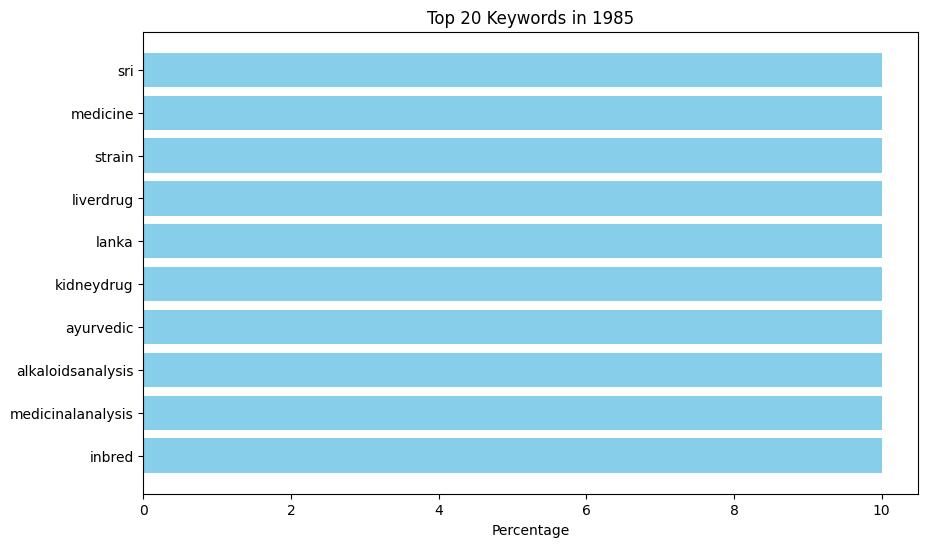


Year: 1986
Most common keywords with counts and percentages:
chemical: 1 (7.14%)
inflammatory: 1 (7.14%)
liver: 1 (7.14%)
india: 1 (7.14%)
drug: 1 (7.14%)
poisoningprevention: 1 (7.14%)
induced: 1 (7.14%)
time: 1 (7.14%)
extractspharmacology: 1 (7.14%)
tetrachloride: 1 (7.14%)
agent: 1 (7.14%)
medicinalanalysis: 1 (7.14%)
carbon: 1 (7.14%)
factor: 1 (7.14%)
Number of unique keywords: 14


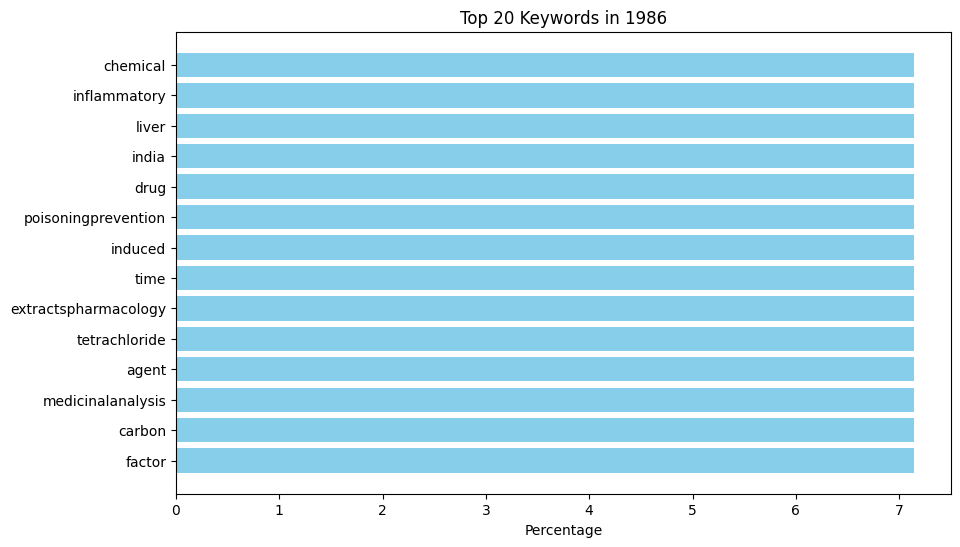


Year: 1987
Most common keywords with counts and percentages:
radioisotope: 1 (9.09%)
extractspharmacology: 1 (9.09%)
adenosine: 1 (9.09%)
strain: 1 (9.09%)
carrageenan: 1 (9.09%)
inbred: 1 (9.09%)
cell: 1 (9.09%)
blood: 1 (9.09%)
count: 1 (9.09%)
agent: 1 (9.09%)
triphosphatasesmetabolism: 1 (9.09%)
Number of unique keywords: 11


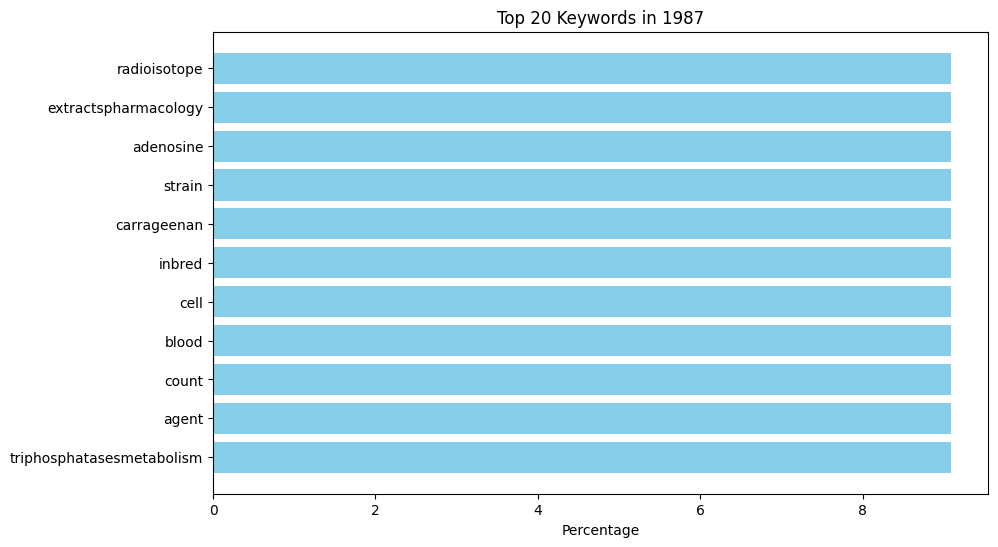


Year: 1988
Most common keywords with counts and percentages:
weight: 1 (10.00%)
derivativestherapeutic: 1 (10.00%)
strain: 1 (10.00%)
inbred: 1 (10.00%)
experimentaldrug: 1 (10.00%)
therapy: 1 (10.00%)
arthritis: 1 (10.00%)
extractstherapeutic: 1 (10.00%)
ergosterolanalogs: 1 (10.00%)
withanolides: 1 (10.00%)
Number of unique keywords: 10


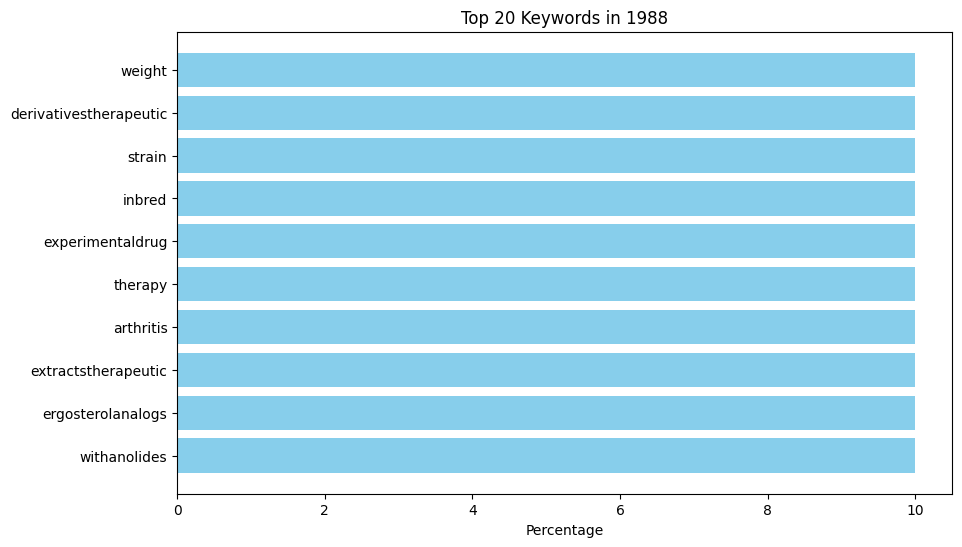


Year: 1989
Most common keywords with counts and percentages:
medicinal: 2 (11.11%)
traditional: 1 (5.56%)
medicine: 1 (5.56%)
india: 1 (5.56%)
africa: 1 (5.56%)
inflammatory: 1 (5.56%)
induceddrug: 1 (5.56%)
50: 1 (5.56%)
strain: 1 (5.56%)
agentspharmacology: 1 (5.56%)
dose: 1 (5.56%)
carrageenan: 1 (5.56%)
edemachemically: 1 (5.56%)
inbred: 1 (5.56%)
therapy: 1 (5.56%)
lethal: 1 (5.56%)
iraq: 1 (5.56%)
Number of unique keywords: 17


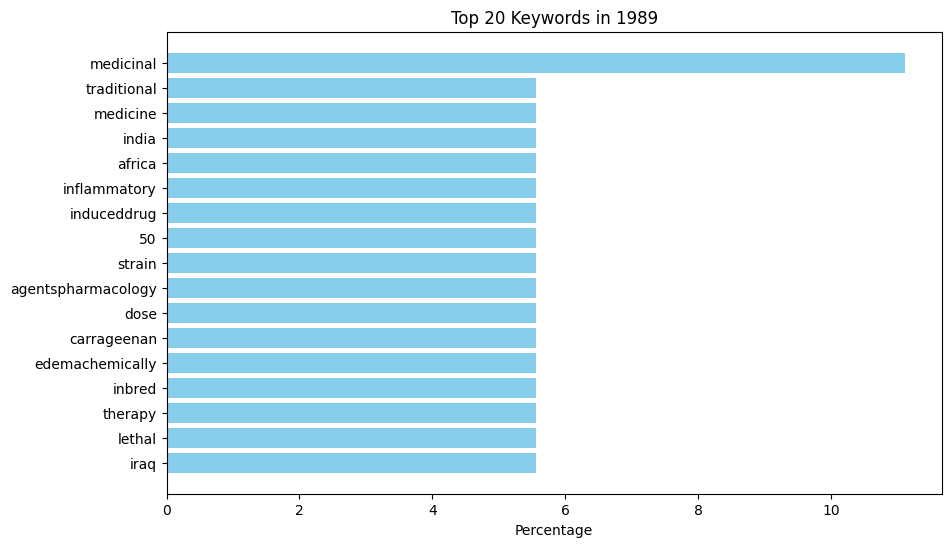


Year: 1990
Most common keywords with counts and percentages:
preclinical: 1 (6.25%)
chloride: 1 (6.25%)
methanol: 1 (6.25%)
medicinal: 1 (6.25%)
drug: 1 (6.25%)
extract: 1 (6.25%)
pakistan: 1 (6.25%)
evaluation: 1 (6.25%)
analgesic: 1 (6.25%)
solanaceous: 1 (6.25%)
flavonoid: 1 (6.25%)
polyphenols: 1 (6.25%)
sitosterolschemistryisolation: 1 (6.25%)
purification: 1 (6.25%)
fatty: 1 (6.25%)
medicinalanalysis: 1 (6.25%)
Number of unique keywords: 16


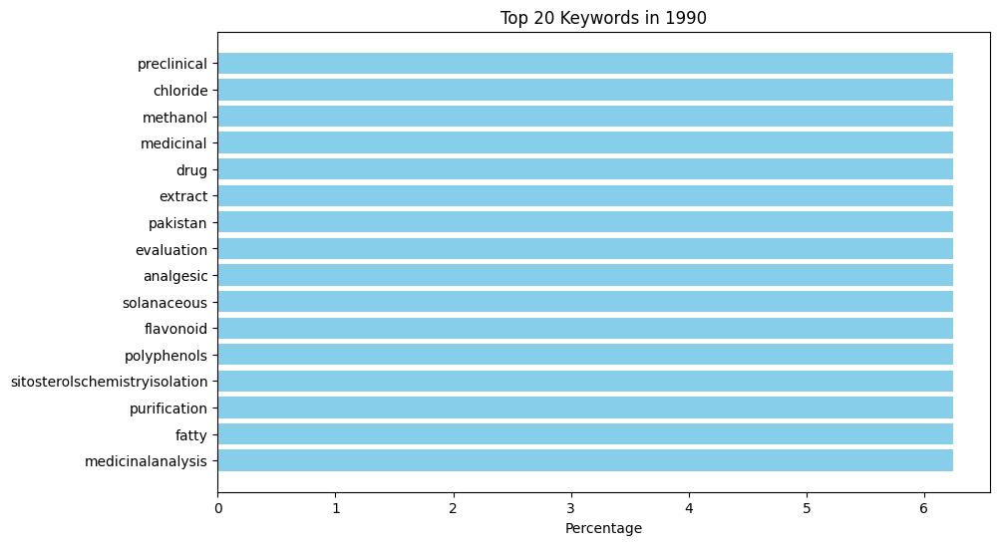


Year: 1991
Most common keywords with counts and percentages:
receptor: 1 (2.78%)
gabaadrug: 1 (2.78%)
gammaaminobutyric: 1 (2.78%)
acidmetabolism: 1 (2.78%)
pregnancy: 1 (2.78%)
vitro: 1 (2.78%)
technique: 1 (2.78%)
extractspharmacology: 1 (2.78%)
inbred: 1 (2.78%)
c57bl: 1 (2.78%)
toxicity: 1 (2.78%)
test: 1 (2.78%)
balbc: 1 (2.78%)
antifungal: 1 (2.78%)
mouse: 1 (2.78%)
antibacterial: 1 (2.78%)
pure: 1 (2.78%)
compound: 1 (2.78%)
activity: 1 (2.78%)
shrimp: 1 (2.78%)
minimum: 1 (2.78%)
concentration: 1 (2.78%)
inhibitory: 1 (2.78%)
medicine: 1 (2.78%)
ayurvedic: 1 (2.78%)
therapy: 1 (2.78%)
aged: 1 (2.78%)
india: 1 (2.78%)
drug: 1 (2.78%)
extractsadverse: 1 (2.78%)
doubleblind: 1 (2.78%)
method: 1 (2.78%)
effectstherapeutic: 1 (2.78%)
medicinalchemistry: 1 (2.78%)
adult: 1 (2.78%)
middle: 1 (2.78%)
Number of unique keywords: 36


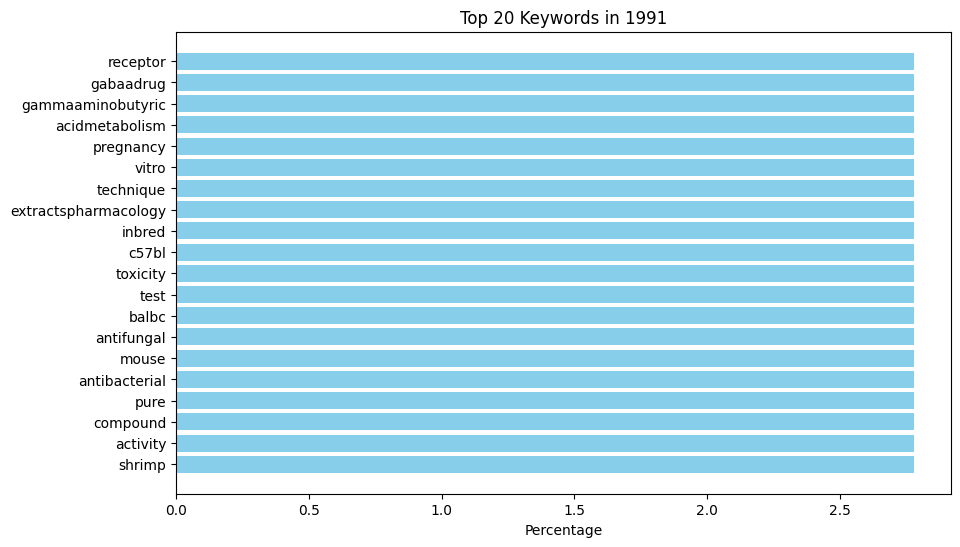


Year: 1992
Most common keywords with counts and percentages:
medicinal: 2 (6.90%)
drug: 2 (6.90%)
iraq: 1 (3.45%)
sizedrug: 1 (3.45%)
organ: 1 (3.45%)
effectspathology: 1 (3.45%)
glandsdrug: 1 (3.45%)
adrenal: 1 (3.45%)
therapypathology: 1 (3.45%)
extractspharmacology: 1 (3.45%)
transplantation: 1 (3.45%)
induction: 1 (3.45%)
sarcoma: 1 (3.45%)
medicine: 1 (3.45%)
remission: 1 (3.45%)
balb: 1 (3.45%)
therapy: 1 (3.45%)
ayurvedic: 1 (3.45%)
doseresponse: 1 (3.45%)
180drug: 1 (3.45%)
extractstherapeutic: 1 (3.45%)
inbred: 1 (3.45%)
relationship: 1 (3.45%)
neoplasm: 1 (3.45%)
herbal: 1 (3.45%)
disorder: 1 (3.45%)
treatment: 1 (3.45%)
Number of unique keywords: 27


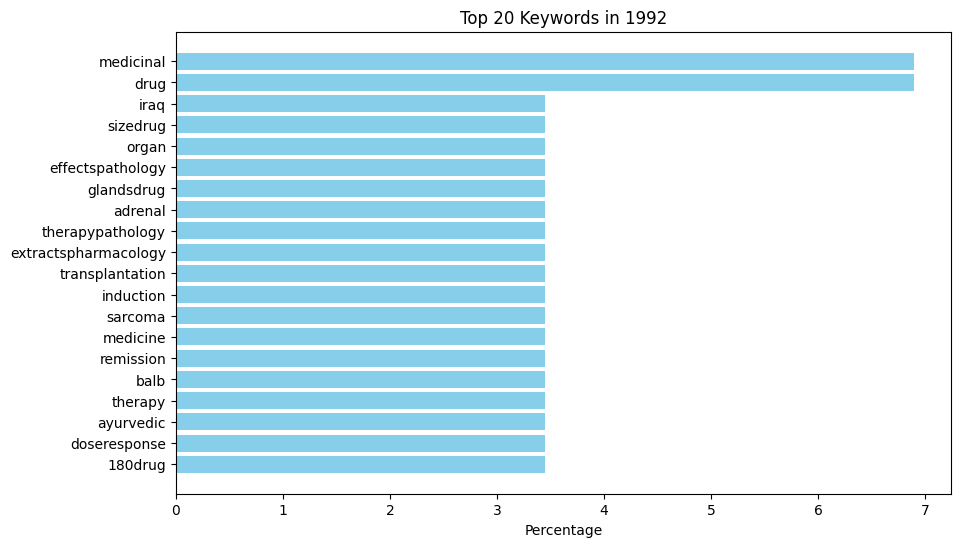


Year: 1993
Most common keywords with counts and percentages:
antineoplastic: 1 (7.69%)
transplantation: 1 (7.69%)
radiationsensitizing: 1 (7.69%)
sarcoma: 1 (7.69%)
medicine: 1 (7.69%)
agentspharmacology: 1 (7.69%)
balb: 1 (7.69%)
therapy: 1 (7.69%)
ayurvedic: 1 (7.69%)
extractspharmacology: 1 (7.69%)
180drug: 1 (7.69%)
inbred: 1 (7.69%)
neoplasm: 1 (7.69%)
Number of unique keywords: 13


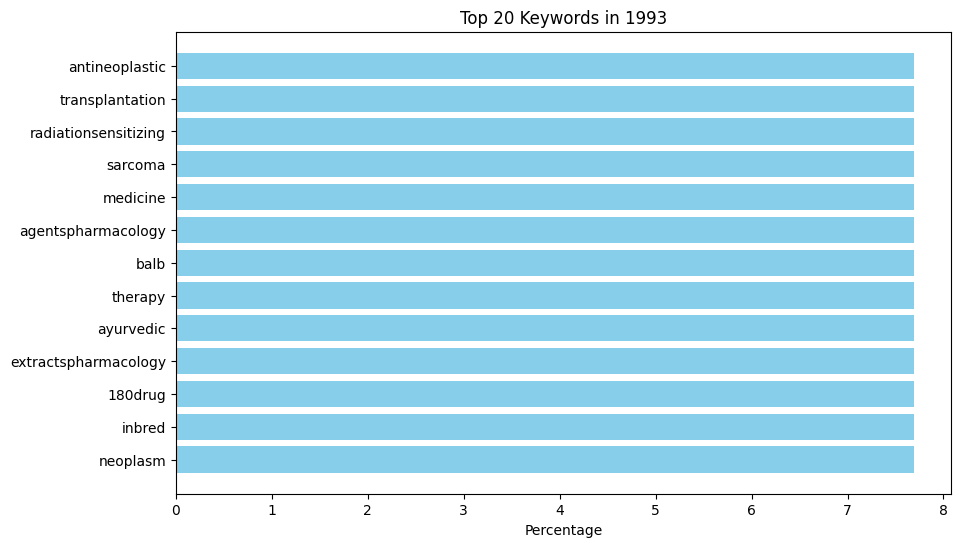


Year: 1994
Most common keywords with counts and percentages:
solanaceous: 1 (20.00%)
traditional: 1 (20.00%)
medicine: 1 (20.00%)
medicinalclassification: 1 (20.00%)
israel: 1 (20.00%)
Number of unique keywords: 5


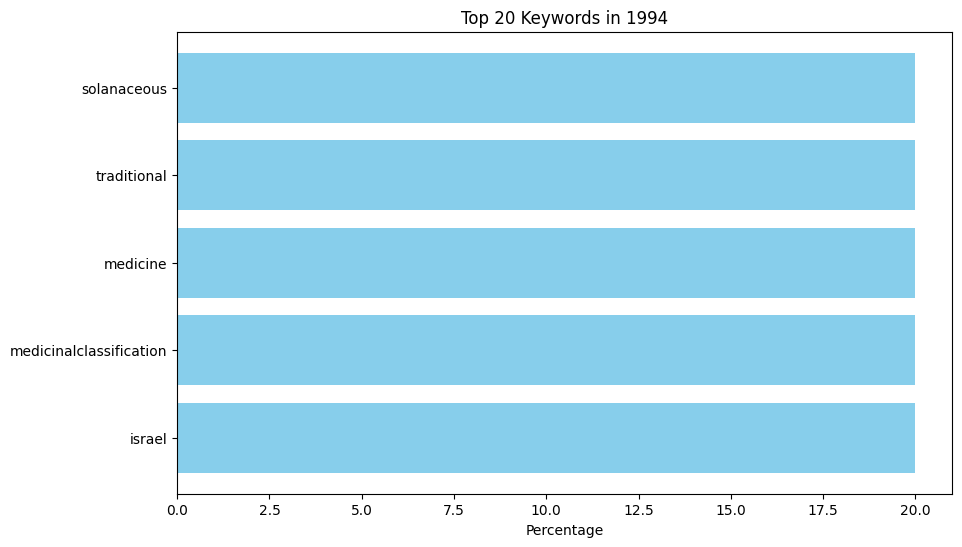


Year: 1995
Most common keywords with counts and percentages:
derivative: 1 (5.56%)
relationship: 1 (5.56%)
antineoplastic: 1 (5.56%)
gamma: 1 (5.56%)
drug: 1 (5.56%)
doseresponse: 1 (5.56%)
dosageanalogs: 1 (5.56%)
ergosteroladministration: 1 (5.56%)
carcinoma: 1 (5.56%)
ehrlich: 1 (5.56%)
therapyradiotherapy: 1 (5.56%)
strain: 1 (5.56%)
ray: 1 (5.56%)
withanolides: 1 (5.56%)
inbred: 1 (5.56%)
radiationsensitizing: 1 (5.56%)
tumordrug: 1 (5.56%)
agent: 1 (5.56%)
Number of unique keywords: 18


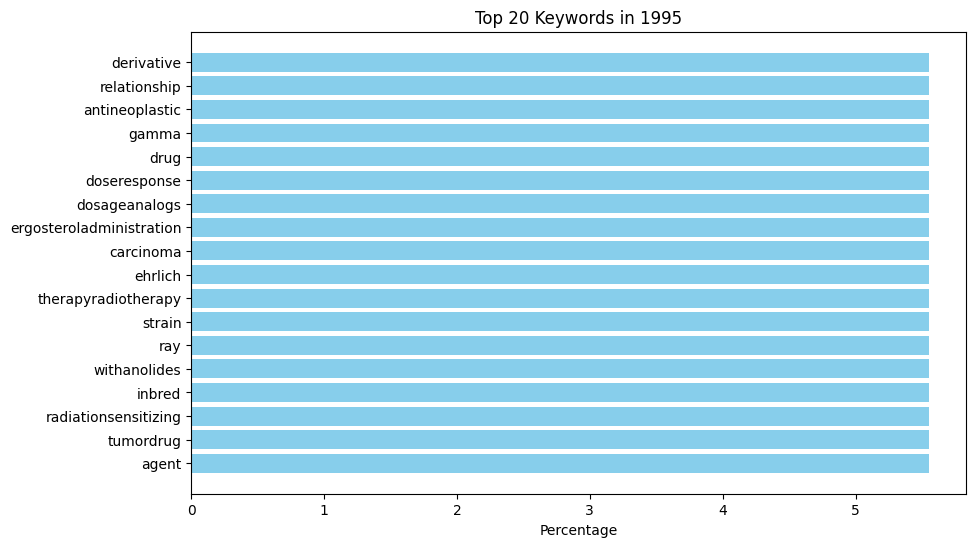


Year: 1996
Most common keywords with counts and percentages:
withanolides: 5 (5.15%)
radiationsensitizing: 3 (3.09%)
ergosterolanalogs: 3 (3.09%)
cell: 3 (3.09%)
agrobacterium: 2 (2.06%)
rhizogenes: 2 (2.06%)
withanolide: 2 (2.06%)
culture: 2 (2.06%)
cricetinae: 2 (2.06%)
medicinalchemistry: 2 (2.06%)
agentspharmacology: 2 (2.06%)
antineoplastic: 2 (2.06%)
medicine: 2 (2.06%)
therapy: 2 (2.06%)
ayurvedic: 2 (2.06%)
agent: 2 (2.06%)
iii: 1 (1.03%)
hplc: 1 (1.03%)
content: 1 (1.03%)
vitro: 1 (1.03%)
chemotype: 1 (1.03%)
low: 1 (1.03%)
growth: 1 (1.03%)
productivity: 1 (1.03%)
index: 1 (1.03%)
root: 1 (1.03%)
medium: 1 (1.03%)
derivativespharmacology: 1 (1.03%)
gamma: 1 (1.03%)
survivaldrug: 1 (1.03%)
cultured: 1 (1.03%)
effectsradiation: 1 (1.03%)
ray: 1 (1.03%)
radiation: 1 (1.03%)
phytotherapy: 1 (1.03%)
injury: 1 (1.03%)
radiationprotective: 1 (1.03%)
sarcoma: 1 (1.03%)
phytogenicisolation: 1 (1.03%)
line: 1 (1.03%)
agentsisolation: 1 (1.03%)
180drug: 1 (1.03%)
purificationpharmacolo

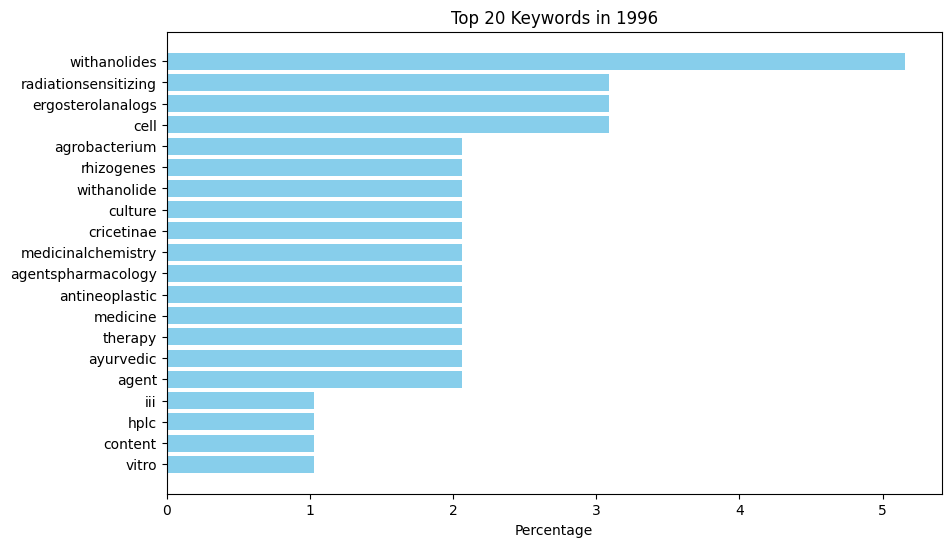


Year: 1997
Most common keywords with counts and percentages:
extractspharmacology: 4 (3.77%)
medicine: 3 (2.83%)
effectsmetabolism: 3 (2.83%)
medicinal: 2 (1.89%)
ayurvedic: 2 (1.89%)
drug: 2 (1.89%)
phytotherapy: 2 (1.89%)
braindrug: 2 (1.89%)
dosage: 2 (1.89%)
derivativespharmacology: 2 (1.89%)
withanolides: 2 (1.89%)
ergosterolanalogs: 2 (1.89%)
cell: 2 (1.89%)
preclinical: 1 (0.94%)
receptor: 1 (0.94%)
cholinergicmetabolism: 1 (0.94%)
acetylcholinesterasemetabolism: 1 (0.94%)
cortexdrug: 1 (0.94%)
hippocampusdrug: 1 (0.94%)
evaluation: 1 (0.94%)
technique: 1 (0.94%)
glutamic: 1 (0.94%)
gammaaminobutyric: 1 (0.94%)
acidmetabolism: 1 (0.94%)
cerebral: 1 (0.94%)
vitro: 1 (0.94%)
extractsadministration: 1 (0.94%)
therapy: 1 (0.94%)
dependencedrug: 1 (0.94%)
disease: 1 (0.94%)
withdrawal: 1 (0.94%)
relationship: 1 (0.94%)
narcotic: 1 (0.94%)
syndromedrug: 1 (0.94%)
model: 1 (0.94%)
doseresponse: 1 (0.94%)
solution: 1 (0.94%)
administration: 1 (0.94%)
morphine: 1 (0.94%)
injection: 1 (0

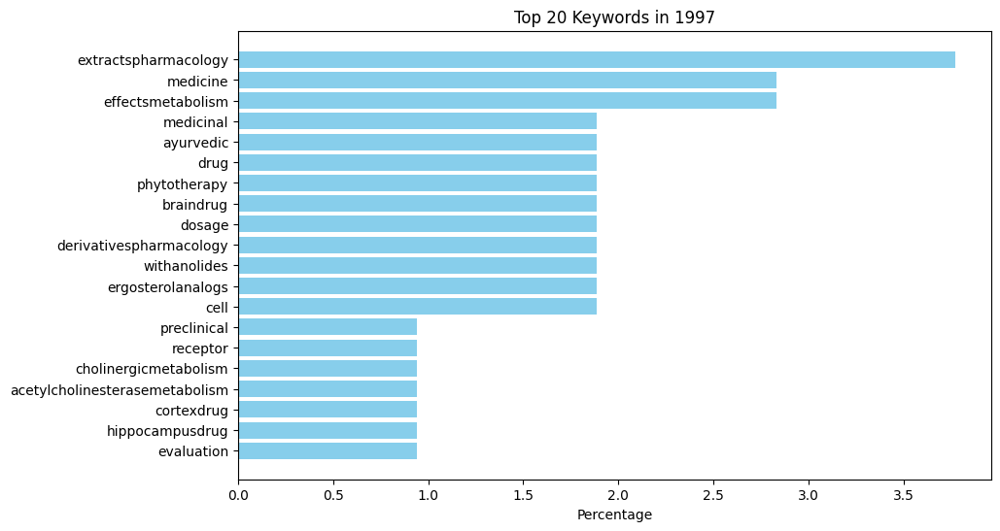


Year: 1998
Most common keywords with counts and percentages:
agent: 4 (6.90%)
inflammatory: 3 (5.17%)
extractspharmacology: 2 (3.45%)
weight: 2 (3.45%)
cellsdrug: 1 (1.72%)
divisiondrug: 1 (1.72%)
systemdrug: 1 (1.72%)
antineoplastic: 1 (1.72%)
body: 1 (1.72%)
bone: 1 (1.72%)
marrow: 1 (1.72%)
stem: 1 (1.72%)
immunosuppressive: 1 (1.72%)
effectsmetabolism: 1 (1.72%)
cell: 1 (1.72%)
solanaceaechemistry: 1 (1.72%)
immune: 1 (1.72%)
agentstoxicity: 1 (1.72%)
panax: 1 (1.72%)
administration: 1 (1.72%)
eatingdrug: 1 (1.72%)
sizedrug: 1 (1.72%)
organ: 1 (1.72%)
medicinal: 1 (1.72%)
combination: 1 (1.72%)
drug: 1 (1.72%)
liverdrug: 1 (1.72%)
extractstoxicity: 1 (1.72%)
oral: 1 (1.72%)
stress: 1 (1.72%)
rabbit: 1 (1.72%)
dosage: 1 (1.72%)
lipid: 1 (1.72%)
peroxidationdrug: 1 (1.72%)
nonsteroidalpharmacology: 1 (1.72%)
nonsteroidaltherapeutic: 1 (1.72%)
phagocytosis: 1 (1.72%)
balb: 1 (1.72%)
therapy: 1 (1.72%)
extractstherapeutic: 1 (1.72%)
inbred: 1 (1.72%)
receptor: 1 (1.72%)
depression: 1 

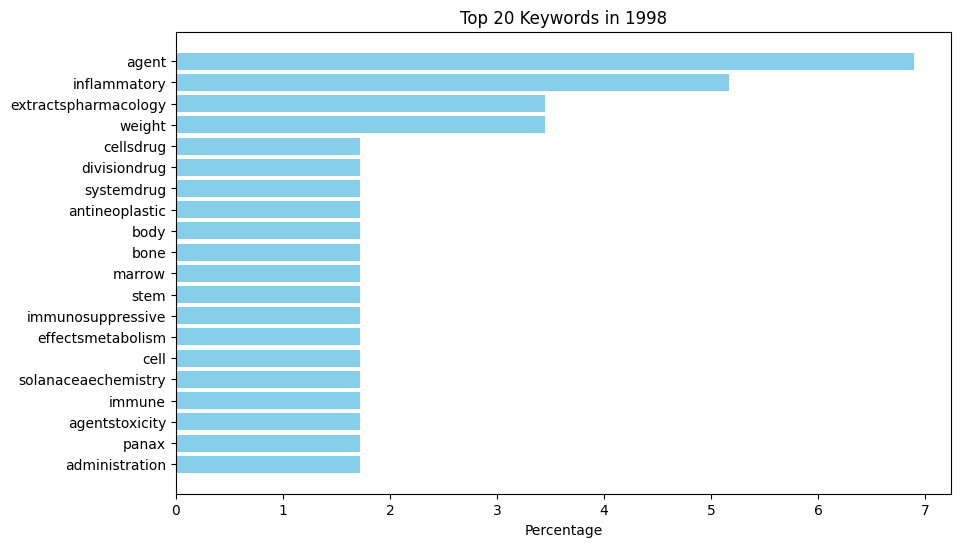


Year: 1999
Most common keywords with counts and percentages:
medicine: 3 (4.41%)
india: 3 (4.41%)
extractspharmacologytherapeutic: 2 (2.94%)
inflammatory: 2 (2.94%)
phytotherapy: 2 (2.94%)
immunosuppressive: 2 (2.94%)
inbred: 2 (2.94%)
ayurvedic: 2 (2.94%)
stress: 1 (1.47%)
traditional: 1 (1.47%)
purificationpharmacologytherapeutic: 1 (1.47%)
test: 1 (1.47%)
analysis: 1 (1.47%)
corticosteroneblood: 1 (1.47%)
medicinaltherapeutic: 1 (1.47%)
variance: 1 (1.47%)
exercise: 1 (1.47%)
phagocytosis: 1 (1.47%)
agentsisolation: 1 (1.47%)
antibody: 1 (1.47%)
solanaceaechemistry: 1 (1.47%)
medicinal: 1 (1.47%)
cytokinesbiosynthesis: 1 (1.47%)
agentspharmacology: 1 (1.47%)
spleencytologydrug: 1 (1.47%)
balb: 1 (1.47%)
assay: 1 (1.47%)
extractspharmacology: 1 (1.47%)
colonystimulating: 1 (1.47%)
granulocytemacrophage: 1 (1.47%)
triiodothyronineblood: 1 (1.47%)
lipid: 1 (1.47%)
extractsisolation: 1 (1.47%)
liverdrug: 1 (1.47%)
peroxidationdrug: 1 (1.47%)
root: 1 (1.47%)
effectsenzymology: 1 (1.47%)

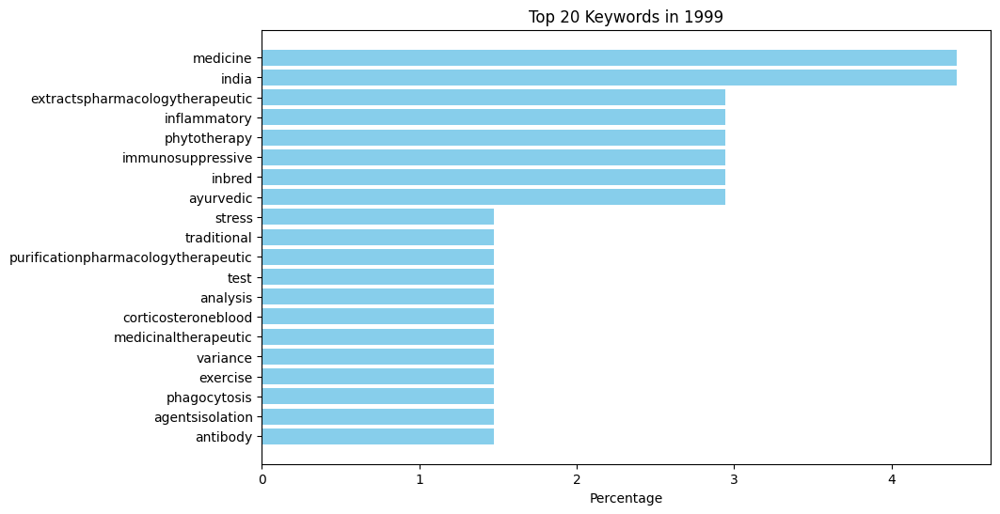


Year: 2000
Most common keywords with counts and percentages:
extractspharmacology: 8 (2.73%)
ayurvedic: 7 (2.39%)
medicine: 6 (2.05%)
medicinalchemistry: 5 (1.71%)
chemical: 4 (1.37%)
blood: 4 (1.37%)
rootschemistry: 4 (1.37%)
stress: 4 (1.37%)
therapy: 4 (1.37%)
india: 3 (1.02%)
solanaceaechemistry: 3 (1.02%)
physiologicaldrug: 3 (1.02%)
phytotherapy: 3 (1.02%)
agent: 3 (1.02%)
effectspathology: 3 (1.02%)
lipid: 3 (1.02%)
liverdrug: 3 (1.02%)
drug: 3 (1.02%)
organ: 2 (0.68%)
inbred: 2 (0.68%)
cell: 2 (0.68%)
sizedrug: 2 (0.68%)
inflammatory: 2 (0.68%)
extractspharmacologytherapeutic: 2 (0.68%)
diseaseschemically: 2 (0.68%)
solanaceaetherapeutic: 2 (0.68%)
effectsmetabolism: 2 (0.68%)
kidneydrug: 2 (0.68%)
peroxidationdrug: 2 (0.68%)
extractsadministration: 2 (0.68%)
liver: 2 (0.68%)
induced: 2 (0.68%)
dosageanalogs: 2 (0.68%)
ergosteroladministration: 2 (0.68%)
administration: 2 (0.68%)
agentsadministration: 2 (0.68%)
oral: 2 (0.68%)
kidney: 2 (0.68%)
anxiety: 2 (0.68%)
treatment: 2 

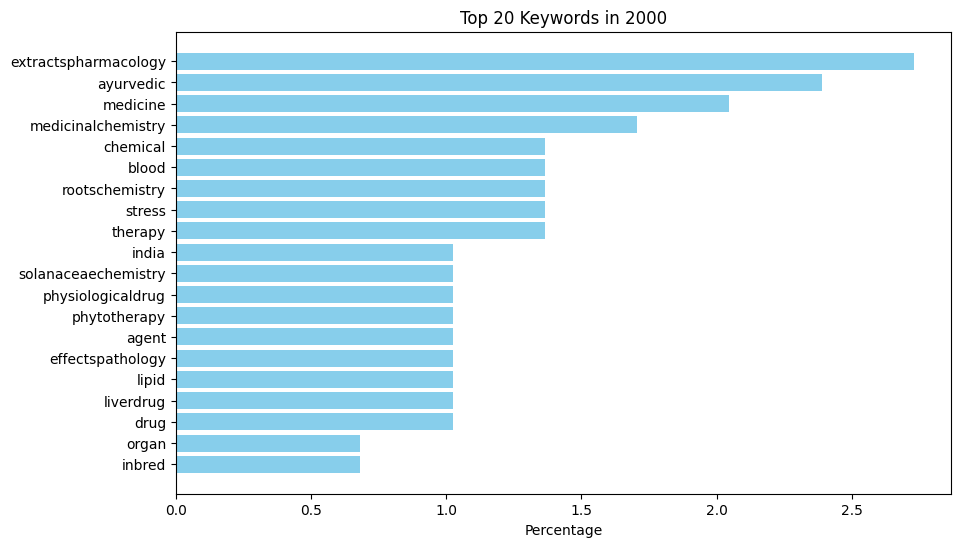


Year: 2001
Most common keywords with counts and percentages:
drug: 6 (2.14%)
stress: 5 (1.79%)
medicinal: 5 (1.79%)
doseresponse: 5 (1.79%)
relationship: 5 (1.79%)
solanaceaechemistry: 4 (1.43%)
extractspharmacology: 4 (1.43%)
solanaceae: 4 (1.43%)
phytotherapy: 4 (1.43%)
agent: 4 (1.43%)
purificationpharmacology: 4 (1.43%)
india: 4 (1.43%)
extractspharmacologytherapeutic: 3 (1.07%)
medicine: 3 (1.07%)
administration: 3 (1.07%)
lipid: 3 (1.07%)
inducedprevention: 3 (1.07%)
oral: 3 (1.07%)
antineoplastic: 3 (1.07%)
technique: 3 (1.07%)
ergosterolanalogs: 3 (1.07%)
withanolides: 3 (1.07%)
rootschemistry: 3 (1.07%)
peroxidasemetabolism: 2 (0.71%)
glutathione: 2 (0.71%)
cell: 2 (0.71%)
test: 2 (0.71%)
dosagepharmacologytherapeutic: 2 (0.71%)
peroxidationdrug: 2 (0.71%)
stomach: 2 (0.71%)
ulcerprevention: 2 (0.71%)
physiologicalprevention: 2 (0.71%)
agentspharmacologytherapeutic: 2 (0.71%)
root: 2 (0.71%)
effectsgrowth: 2 (0.71%)
culture: 2 (0.71%)
growth: 2 (0.71%)
development: 2 (0.71%)


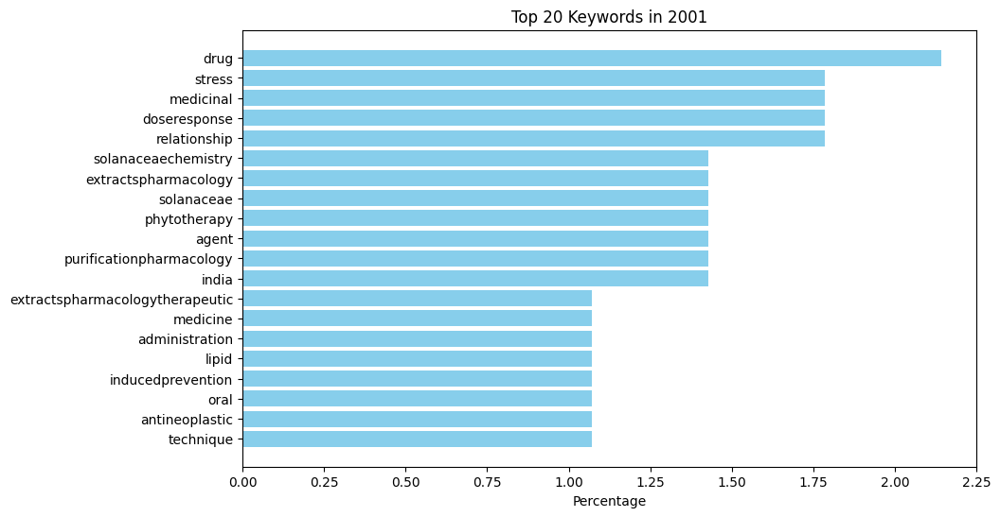


Year: 2002
Most common keywords with counts and percentages:
phytotherapy: 4 (2.41%)
rootschemistry: 4 (2.41%)
cell: 4 (2.41%)
disease: 3 (1.81%)
extractspharmacology: 3 (1.81%)
medicine: 3 (1.81%)
model: 2 (1.20%)
withanolides: 2 (1.20%)
ergosterolanalogs: 2 (1.20%)
agentspharmacology: 2 (1.20%)
extractsadministration: 2 (1.20%)
effectsphysiology: 2 (1.20%)
root: 2 (1.20%)
dosagepharmacology: 2 (1.20%)
medicinalchemistry: 2 (1.20%)
balb: 2 (1.20%)
inbred: 2 (1.20%)
lymphocyte: 2 (1.20%)
activationdrug: 2 (1.20%)
tlymphocytesdrug: 2 (1.20%)
effectsimmunology: 2 (1.20%)
lactoneschemistrypharmacology: 2 (1.20%)
solanaceaechemistry: 2 (1.20%)
tumor: 2 (1.20%)
carcinoma: 2 (1.20%)
stress: 2 (1.20%)
herbal: 2 (1.20%)
acidpharmacology: 1 (0.60%)
anticonvulsantspharmacology: 1 (0.60%)
antioxidantspharmacology: 1 (0.60%)
haloperidolpharmacology: 1 (0.60%)
epharmacology: 1 (0.60%)
dyskinesia: 1 (0.60%)
derivativeschemistryisolation: 1 (0.60%)
vitamin: 1 (0.60%)
solanaceae: 1 (0.60%)
extractsch

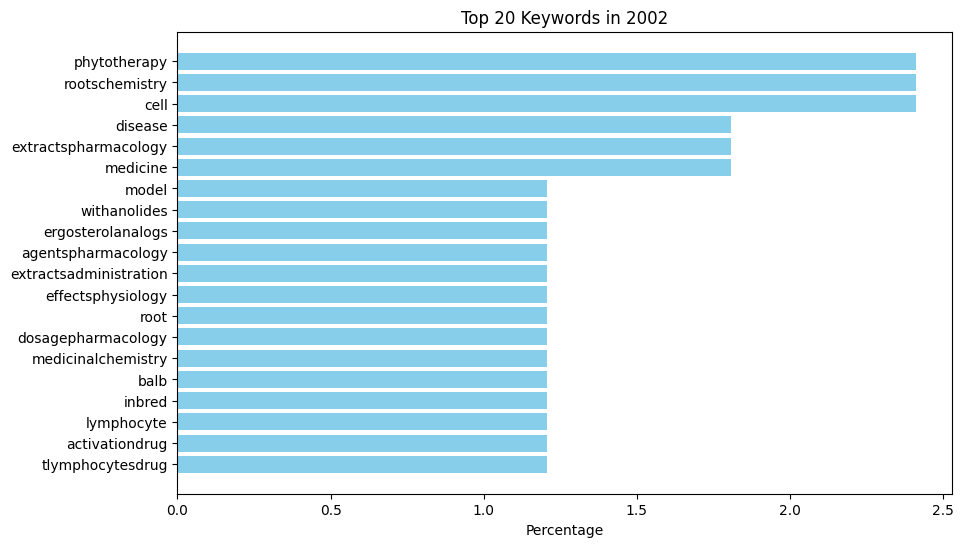


Year: 2003
Most common keywords with counts and percentages:
drug: 7 (2.78%)
phytotherapy: 7 (2.78%)
relationship: 6 (2.38%)
lipid: 5 (1.98%)
doseresponse: 5 (1.98%)
peroxidationdrug: 4 (1.59%)
extractspharmacology: 4 (1.59%)
model: 4 (1.59%)
disease: 4 (1.59%)
rootschemistry: 4 (1.59%)
effectsenzymology: 3 (1.19%)
root: 3 (1.19%)
ergosterolanalogs: 3 (1.19%)
inflammatory: 3 (1.19%)
cell: 3 (1.19%)
therapy: 3 (1.19%)
inhibitorspharmacology: 2 (0.79%)
enzyme: 2 (0.79%)
glutathione: 2 (0.79%)
inhibitorsmetabolism: 2 (0.79%)
stem: 2 (0.79%)
extractschemistry: 2 (0.79%)
withanolides: 2 (0.79%)
stress: 2 (0.79%)
medicine: 2 (0.79%)
ayurvedic: 2 (0.79%)
phytotherapymethods: 2 (0.79%)
animaldrug: 2 (0.79%)
agent: 2 (0.79%)
behavior: 2 (0.79%)
line: 2 (0.79%)
agentspharmacology: 2 (0.79%)
induceddrug: 2 (0.79%)
extractstherapeutic: 2 (0.79%)
ocimum: 2 (0.79%)
extractsadministration: 2 (0.79%)
dosagepharmacologytherapeutic: 2 (0.79%)
agentsadministration: 2 (0.79%)
spinal: 1 (0.40%)
antioxidan

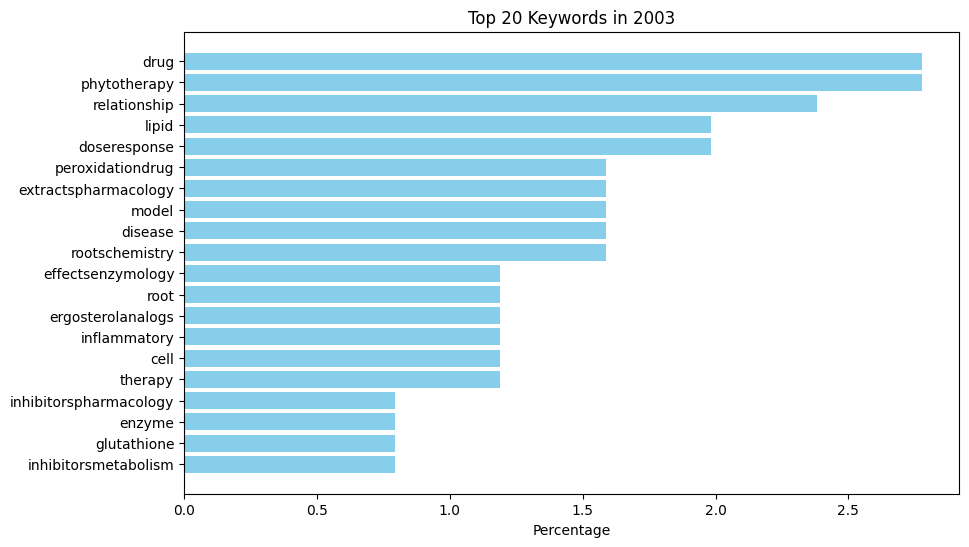


Year: 2004
Most common keywords with counts and percentages:
phytotherapy: 7 (2.86%)
root: 5 (2.04%)
antineoplastic: 5 (2.04%)
extractsadministration: 4 (1.63%)
dosagepharmacologytherapeutic: 4 (1.63%)
agent: 4 (1.63%)
cell: 4 (1.63%)
therapy: 3 (1.22%)
rootschemistry: 3 (1.22%)
drug: 3 (1.22%)
inbred: 3 (1.22%)
blood: 3 (1.22%)
extractspharmacology: 3 (1.22%)
tumor: 3 (1.22%)
line: 3 (1.22%)
immunologic: 2 (0.82%)
pressuredrug: 2 (0.82%)
myocardial: 2 (0.82%)
ventricular: 2 (0.82%)
vitamin: 2 (0.82%)
epharmacology: 2 (0.82%)
extractstherapeutic: 2 (0.82%)
structure: 2 (0.82%)
medicine: 2 (0.82%)
adjuvant: 2 (0.82%)
ayurvedic: 2 (0.82%)
chromatography: 2 (0.82%)
ergosterolanalogs: 2 (0.82%)
phytogenicadministration: 2 (0.82%)
experimentaldrug: 2 (0.82%)
therapypathology: 2 (0.82%)
neoplasm: 2 (0.82%)
neoplasmsdrug: 2 (0.82%)
cellular: 2 (0.82%)
c57bl: 2 (0.82%)
depressiondrug: 1 (0.41%)
effectstherapeutic: 1 (0.41%)
extract: 1 (0.41%)
anxietydrug: 1 (0.41%)
administration: 1 (0.41%)
f

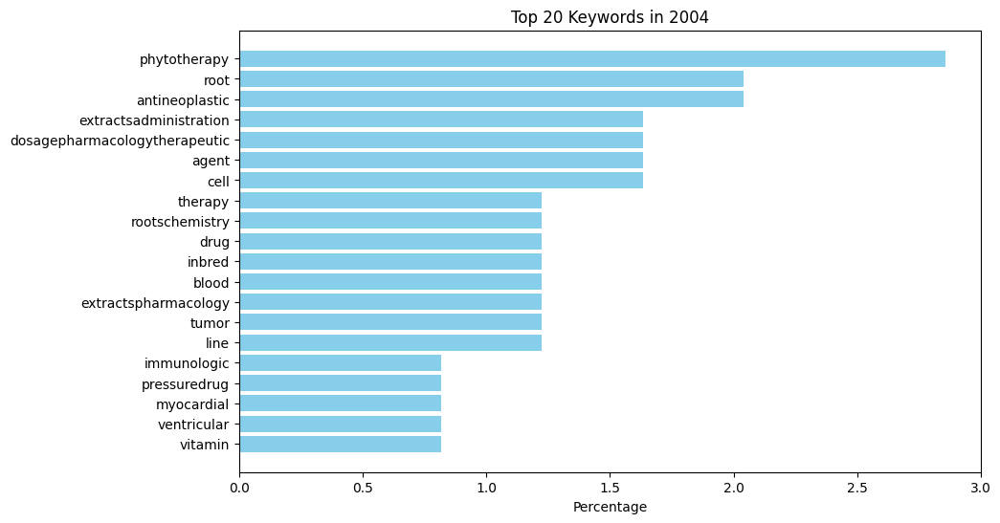


Year: 2005
Most common keywords with counts and percentages:
dosagepharmacologytherapeutic: 3 (1.84%)
phytotherapy: 3 (1.84%)
root: 3 (1.84%)
cell: 3 (1.84%)
model: 3 (1.84%)
relationship: 3 (1.84%)
drug: 3 (1.84%)
doseresponse: 3 (1.84%)
administration: 2 (1.23%)
extractsadministration: 2 (1.23%)
agentsadministration: 2 (1.23%)
oral: 2 (1.23%)
liverdrug: 2 (1.23%)
effectsmetabolism: 2 (1.23%)
effectsenzymology: 2 (1.23%)
molecular: 2 (1.23%)
extractsisolation: 2 (1.23%)
cultured: 2 (1.23%)
inducedprevention: 2 (1.23%)
test: 1 (0.61%)
sensitivity: 1 (0.61%)
microbial: 1 (0.61%)
leaf: 1 (0.61%)
salmonella: 1 (0.61%)
balb: 1 (0.61%)
typhimuriumdrug: 1 (0.61%)
bacterial: 1 (0.61%)
inbred: 1 (0.61%)
asparagus: 1 (0.61%)
antioxidantspharmacology: 1 (0.61%)
catalasemetabolism: 1 (0.61%)
indomethacinpharmacology: 1 (0.61%)
ulcerprevention: 1 (0.61%)
dismutasedrug: 1 (0.61%)
superoxide: 1 (0.61%)
extractspharmacology: 1 (0.61%)
gastrointestinal: 1 (0.61%)
structure: 1 (0.61%)
steroidschemistr

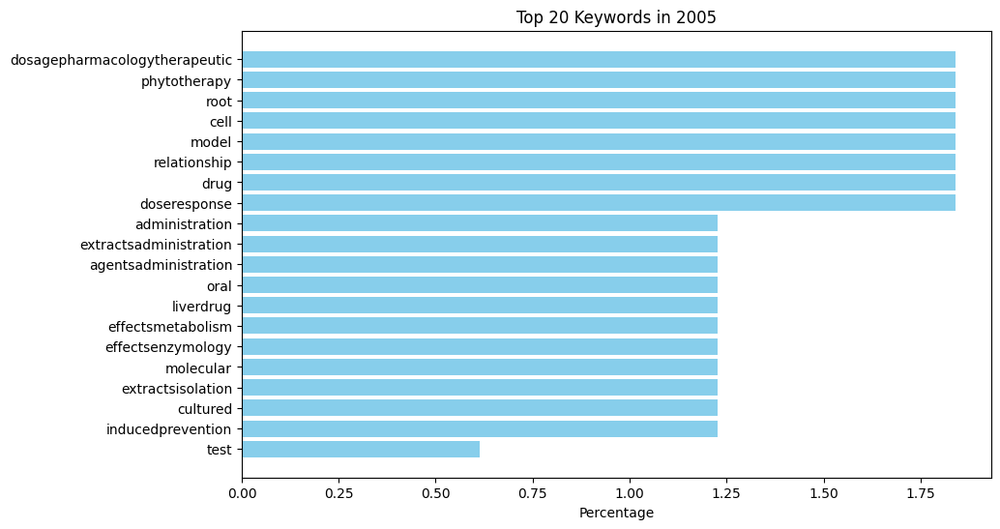


Year: 2006
Most common keywords with counts and percentages:
cell: 11 (2.22%)
phytotherapy: 10 (2.02%)
extractspharmacology: 8 (1.62%)
antineoplastic: 7 (1.41%)
medicine: 6 (1.21%)
agent: 6 (1.21%)
rootschemistry: 6 (1.21%)
model: 5 (1.01%)
medicinal: 5 (1.01%)
purificationpharmacology: 5 (1.01%)
tumor: 4 (0.81%)
disease: 4 (0.81%)
effectsmetabolism: 4 (0.81%)
neoplasmschemically: 4 (0.81%)
lung: 4 (0.81%)
ergosterolanalogs: 4 (0.81%)
therapy: 4 (0.81%)
spraguedawley: 4 (0.81%)
combined: 3 (0.61%)
ayurvedic: 3 (0.61%)
extractstherapeutic: 3 (0.61%)
phytogenicpharmacology: 3 (0.61%)
line: 3 (0.61%)
cultured: 3 (0.61%)
root: 3 (0.61%)
chromatography: 3 (0.61%)
pressure: 3 (0.61%)
liquid: 3 (0.61%)
high: 3 (0.61%)
enzyme: 3 (0.61%)
glycoproteinsisolation: 3 (0.61%)
paclitaxelpharmacology: 3 (0.61%)
peroxidationdrug: 3 (0.61%)
lipid: 3 (0.61%)
effectsenzymology: 3 (0.61%)
drug: 3 (0.61%)
acid: 3 (0.61%)
therapymetabolism: 3 (0.61%)
induceddrug: 3 (0.61%)
derivativespharmacology: 3 (0.61%)

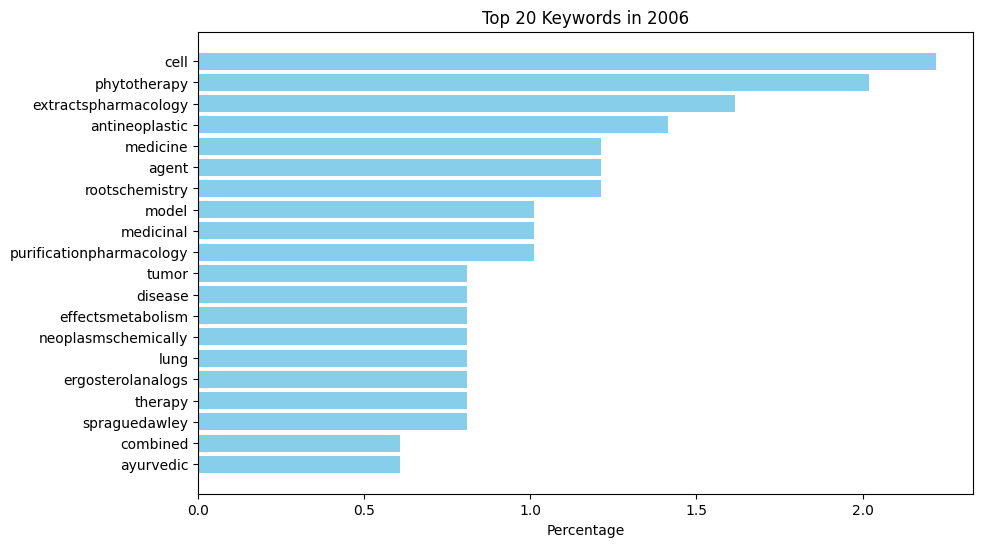


Year: 2007
Most common keywords with counts and percentages:
ergosterolanalogs: 8 (1.72%)
rootschemistry: 7 (1.51%)
extractspharmacology: 7 (1.51%)
phytotherapy: 7 (1.51%)
medicinal: 7 (1.51%)
cell: 6 (1.29%)
therapy: 5 (1.08%)
drug: 5 (1.08%)
factor: 5 (1.08%)
india: 5 (1.08%)
medicine: 5 (1.08%)
withanolides: 5 (1.08%)
disease: 4 (0.86%)
time: 4 (0.86%)
dna: 4 (0.86%)
agentspharmacology: 4 (0.86%)
inbred: 4 (0.86%)
line: 4 (0.86%)
lipid: 3 (0.65%)
inflammatory: 3 (0.65%)
protein: 3 (0.65%)
extractschemistry: 3 (0.65%)
gene: 3 (0.65%)
chromatography: 3 (0.65%)
pressure: 3 (0.65%)
high: 3 (0.65%)
test: 3 (0.65%)
specificity: 3 (0.65%)
traditional: 3 (0.65%)
tumor: 3 (0.65%)
nfkappa: 3 (0.65%)
derivativespharmacology: 3 (0.65%)
extractschemistrypharmacology: 2 (0.43%)
cartilagedrug: 2 (0.43%)
analysis: 2 (0.43%)
arthritis: 2 (0.43%)
model: 2 (0.43%)
peroxidationdrug: 2 (0.43%)
effectsmetabolism: 2 (0.43%)
effectsenzymology: 2 (0.43%)
extractspharmacologytherapeutic: 2 (0.43%)
proteinsm

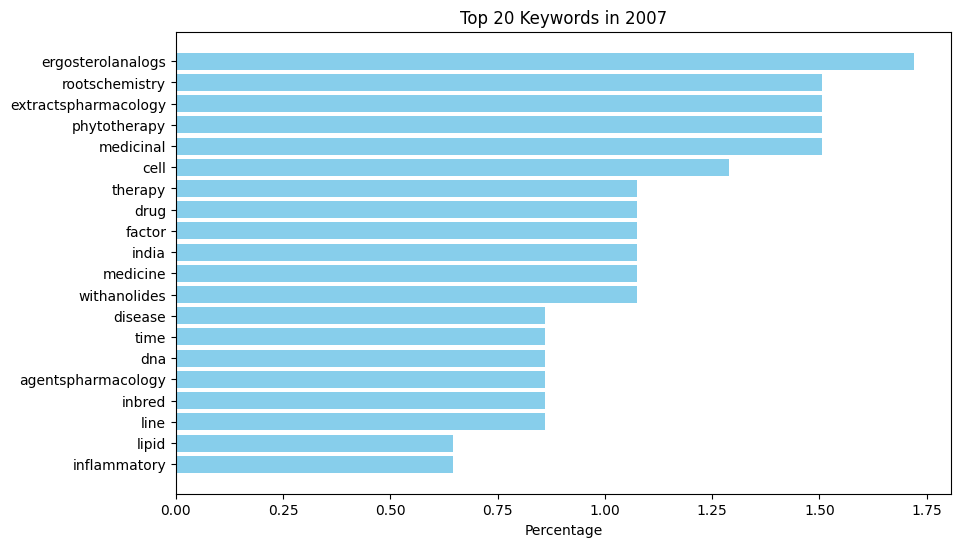


Year: 2008
Most common keywords with counts and percentages:
withanolides: 12 (2.81%)
ergosterolanalogs: 12 (2.81%)
cell: 9 (2.11%)
therapy: 6 (1.41%)
medicine: 6 (1.41%)
phytotherapy: 5 (1.17%)
protein: 5 (1.17%)
ayurvedic: 5 (1.17%)
apoptosisdrug: 5 (1.17%)
structure: 4 (0.94%)
molecular: 4 (0.94%)
rootschemistry: 4 (0.94%)
protooncogene: 4 (0.94%)
chromatography: 4 (0.94%)
model: 4 (0.94%)
derivativespharmacology: 4 (0.94%)
inhibitor: 3 (0.70%)
cbcl2metabolism: 3 (0.70%)
withaniametabolism: 3 (0.70%)
pressure: 3 (0.70%)
high: 3 (0.70%)
disease: 3 (0.70%)
liquid: 3 (0.70%)
relationship: 3 (0.70%)
drug: 3 (0.70%)
doseresponse: 3 (0.70%)
phosphorylation: 3 (0.70%)
mitogenactivated: 3 (0.70%)
line: 3 (0.70%)
tumor: 3 (0.70%)
diseasesdrug: 2 (0.47%)
induceddrug: 2 (0.47%)
nickend: 2 (0.47%)
labeling: 2 (0.47%)
antioxidantsmetabolism: 2 (0.47%)
inhibitorstoxicity: 2 (0.47%)
situ: 2 (0.47%)
agentspharmacology: 2 (0.47%)
purificationpharmacology: 2 (0.47%)
shootsmetabolism: 2 (0.47%)
cultu

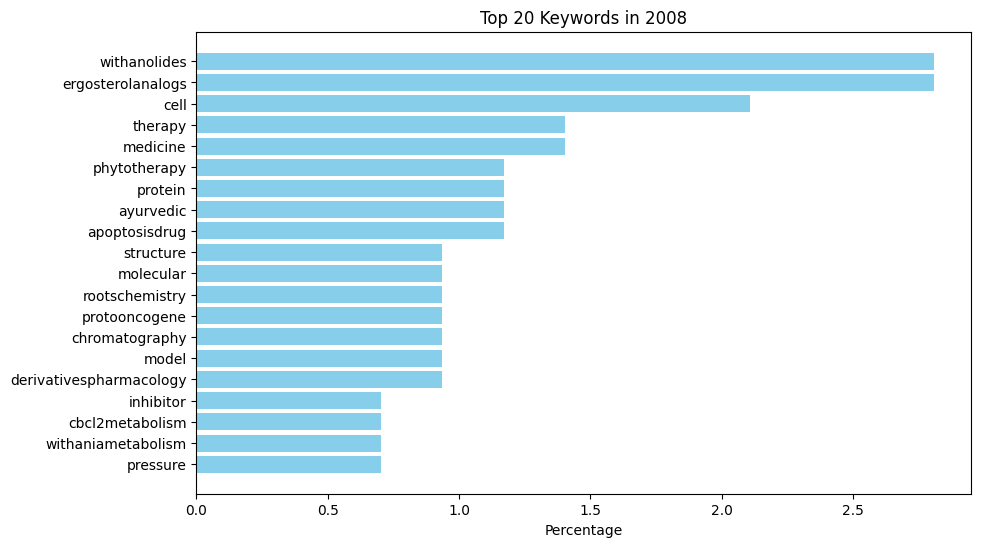


Year: 2009
Most common keywords with counts and percentages:
cell: 9 (1.72%)
extractstherapeutic: 8 (1.53%)
phytotherapy: 8 (1.53%)
ergosterolanalogs: 7 (1.34%)
inbred: 7 (1.34%)
drug: 6 (1.15%)
disease: 6 (1.15%)
extractspharmacology: 6 (1.15%)
withanolides: 6 (1.15%)
therapy: 6 (1.15%)
chromatography: 5 (0.95%)
molecular: 4 (0.76%)
purificationpharmacology: 4 (0.76%)
pressure: 4 (0.76%)
analysis: 4 (0.76%)
model: 4 (0.76%)
liquid: 4 (0.76%)
high: 4 (0.76%)
stress: 4 (0.76%)
rootschemistry: 4 (0.76%)
line: 4 (0.76%)
tumor: 4 (0.76%)
test: 4 (0.76%)
protein: 4 (0.76%)
structure: 3 (0.57%)
induceddrug: 3 (0.57%)
agentspharmacology: 3 (0.57%)
leaveschemistry: 3 (0.57%)
genetic: 3 (0.57%)
technique: 3 (0.57%)
medicine: 3 (0.57%)
balb: 3 (0.57%)
proliferationdrug: 3 (0.57%)
strain: 3 (0.57%)
disordersdrug: 3 (0.57%)
cultured: 3 (0.57%)
microscopy: 2 (0.38%)
effectsultrastructure: 2 (0.38%)
animaldrug: 2 (0.38%)
factor: 2 (0.38%)
variance: 2 (0.38%)
spraguedawley: 2 (0.38%)
time: 2 (0.38%)

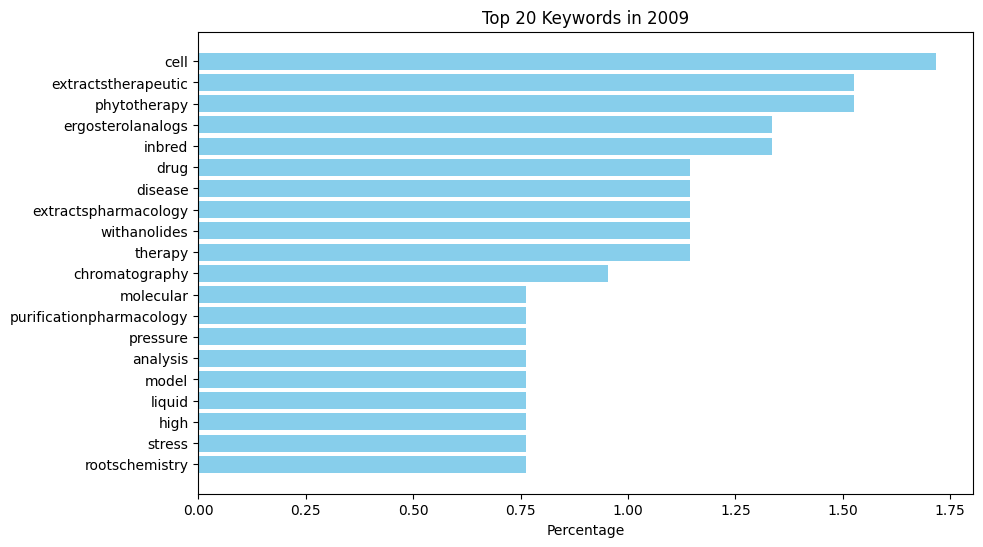


Year: 2010
Most common keywords with counts and percentages:
cell: 11 (1.70%)
drug: 8 (1.24%)
medicine: 7 (1.08%)
model: 6 (0.93%)
antineoplastic: 6 (0.93%)
analysis: 5 (0.77%)
rootschemistry: 5 (0.77%)
acid: 5 (0.77%)
agent: 5 (0.77%)
withanolides: 5 (0.77%)
ergosterolanalogs: 5 (0.77%)
cultured: 5 (0.77%)
tumor: 5 (0.77%)
phytotherapy: 5 (0.77%)
therapy: 5 (0.77%)
stressdrug: 4 (0.62%)
oxidative: 4 (0.62%)
chromatography: 4 (0.62%)
technique: 4 (0.62%)
protein: 4 (0.62%)
molecular: 4 (0.62%)
antitumor: 4 (0.62%)
survival: 4 (0.62%)
ayurvedic: 4 (0.62%)
apoptosisdrug: 4 (0.62%)
line: 4 (0.62%)
neoplasmsdrug: 4 (0.62%)
extractsadministration: 3 (0.46%)
dosage: 3 (0.46%)
lipid: 3 (0.46%)
pressure: 3 (0.46%)
colonic: 3 (0.46%)
root: 3 (0.46%)
dna: 3 (0.46%)
gene: 3 (0.46%)
extractstherapeutic: 3 (0.46%)
reactive: 3 (0.46%)
thiobarbituric: 3 (0.46%)
extractspharmacology: 3 (0.46%)
time: 3 (0.46%)
inbred: 3 (0.46%)
screening: 3 (0.46%)
assay: 3 (0.46%)
purificationpharmacology: 3 (0.46%)


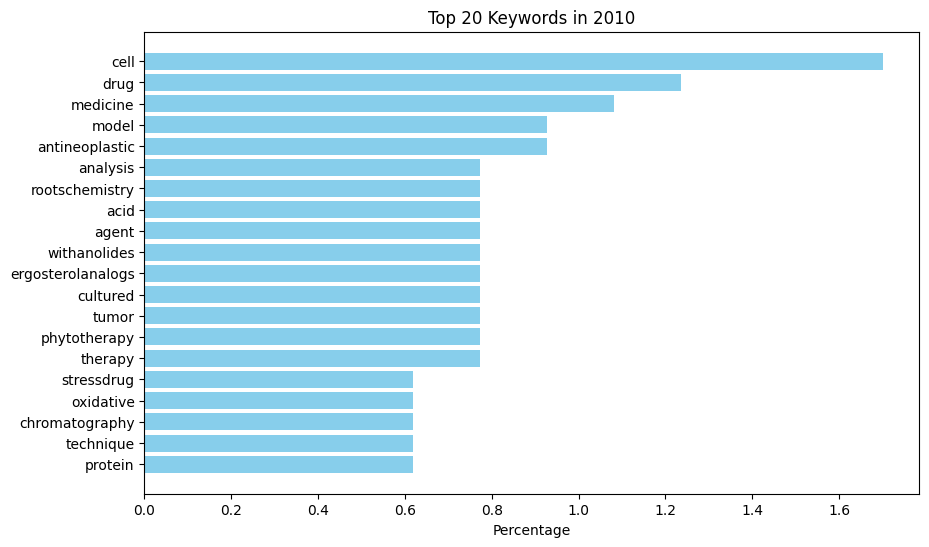


Year: 2011
Most common keywords with counts and percentages:
cell: 12 (1.85%)
protein: 10 (1.54%)
tumor: 9 (1.39%)
oxygen: 7 (1.08%)
reactive: 7 (1.08%)
apoptosisdrug: 7 (1.08%)
withanolidespharmacology: 6 (0.93%)
speciesmetabolism: 6 (0.93%)
antineoplastic: 6 (0.93%)
analysis: 5 (0.77%)
drug: 5 (0.77%)
phytotherapy: 5 (0.77%)
line: 5 (0.77%)
neoplasmsdrug: 5 (0.77%)
stress: 4 (0.62%)
relationship: 4 (0.62%)
therapymetabolismpathology: 4 (0.62%)
acid: 4 (0.62%)
therapy: 4 (0.62%)
oxidative: 4 (0.62%)
rna: 4 (0.62%)
xray: 3 (0.46%)
withanolides: 3 (0.46%)
resonance: 3 (0.46%)
magnetic: 3 (0.46%)
withaniachemistrymetabolism: 3 (0.46%)
purification: 3 (0.46%)
doseresponse: 3 (0.46%)
medicinalchemistry: 3 (0.46%)
molecular: 3 (0.46%)
behavior: 3 (0.46%)
superoxide: 3 (0.46%)
kinase: 3 (0.46%)
effectsmetabolism: 3 (0.46%)
assay: 3 (0.46%)
proliferationdrug: 3 (0.46%)
suppressor: 3 (0.46%)
proteinmetabolism: 3 (0.46%)
protooncogene: 3 (0.46%)
phytogenicpharmacology: 3 (0.46%)
cbcl2metabolis

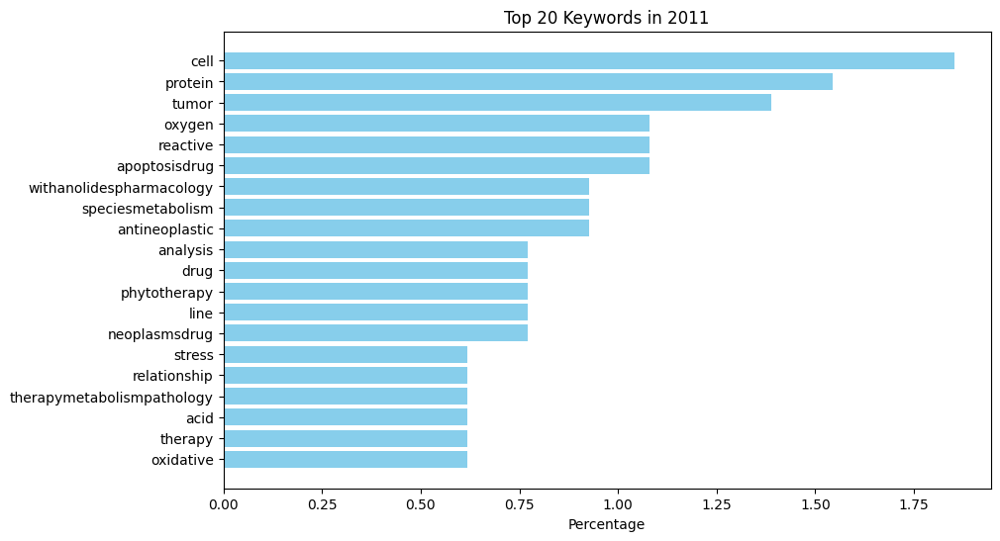


Year: 2012
Most common keywords with counts and percentages:
cell: 13 (1.60%)
drug: 7 (0.86%)
rootschemistry: 7 (0.86%)
model: 6 (0.74%)
molecular: 6 (0.74%)
antineoplastic: 6 (0.74%)
medicine: 6 (0.74%)
line: 6 (0.74%)
ayurvedic: 5 (0.62%)
agentspharmacology: 5 (0.62%)
extractspharmacology: 5 (0.62%)
phytotherapy: 5 (0.62%)
effectsmetabolism: 5 (0.62%)
acid: 5 (0.62%)
expression: 5 (0.62%)
gene: 5 (0.62%)
regulation: 5 (0.62%)
dna: 5 (0.62%)
amino: 5 (0.62%)
protein: 5 (0.62%)
withanolidespharmacology: 5 (0.62%)
tumor: 5 (0.62%)
analysis: 4 (0.49%)
root: 4 (0.49%)
therapy: 4 (0.49%)
disease: 4 (0.49%)
inbred: 4 (0.49%)
chain: 4 (0.49%)
culture: 4 (0.49%)
chromatography: 4 (0.49%)
developmentmetabolism: 4 (0.49%)
sequence: 4 (0.49%)
purificationpharmacology: 4 (0.49%)
kinase: 4 (0.49%)
proteinsmetabolism: 4 (0.49%)
apoptosisdrug: 4 (0.49%)
medicinalchemistry: 4 (0.49%)
balb: 3 (0.37%)
complexmetabolism: 3 (0.37%)
spectroscopy: 3 (0.37%)
india: 3 (0.37%)
superoxide: 3 (0.37%)
dismutase

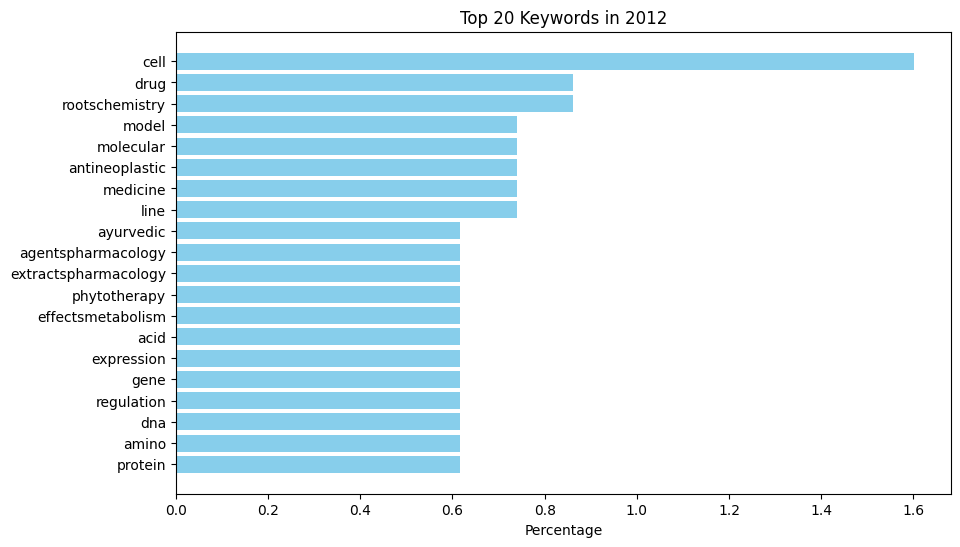


Year: 2013
Most common keywords with counts and percentages:
cell: 19 (1.73%)
drug: 12 (1.09%)
model: 12 (1.09%)
gene: 11 (1.00%)
doseresponse: 10 (0.91%)
relationship: 10 (0.91%)
protein: 10 (0.91%)
expression: 10 (0.91%)
tumor: 10 (0.91%)
line: 9 (0.82%)
acid: 8 (0.73%)
rootschemistry: 8 (0.73%)
molecular: 8 (0.73%)
phytotherapy: 7 (0.64%)
medicine: 7 (0.64%)
therapy: 6 (0.55%)
spectrometry: 6 (0.55%)
ayurvedic: 6 (0.55%)
chromatography: 6 (0.55%)
high: 6 (0.55%)
data: 6 (0.55%)
regulation: 6 (0.55%)
factor: 6 (0.55%)
receptor: 5 (0.45%)
withanolidesmetabolism: 5 (0.45%)
cloning: 5 (0.45%)
phylogeny: 5 (0.45%)
pressure: 5 (0.45%)
extractspharmacology: 5 (0.45%)
sequence: 5 (0.45%)
disease: 5 (0.45%)
proliferationdrug: 5 (0.45%)
antineoplastic: 5 (0.45%)
amino: 5 (0.45%)
withanolidespharmacology: 5 (0.45%)
apoptosisdrug: 5 (0.45%)
neoplasmsdrug: 5 (0.45%)
breast: 4 (0.36%)
neoplasm: 4 (0.36%)
cultured: 4 (0.36%)
effectsphysiology: 4 (0.36%)
growth: 4 (0.36%)
analysis: 4 (0.36%)
antio

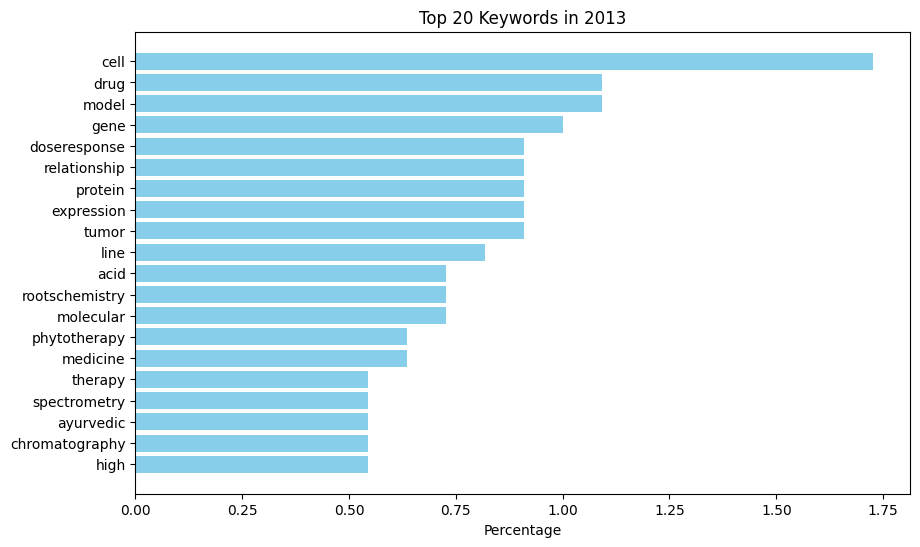


Year: 2014
Most common keywords with counts and percentages:
cell: 15 (1.74%)
drug: 11 (1.28%)
oxidative: 8 (0.93%)
withaferin: 8 (0.93%)
gene: 8 (0.93%)
molecular: 7 (0.81%)
antioxidant: 7 (0.81%)
therapy: 6 (0.70%)
stress: 6 (0.70%)
model: 6 (0.70%)
disease: 6 (0.70%)
relationship: 6 (0.70%)
expression: 6 (0.70%)
phytotherapy: 5 (0.58%)
oxygen: 5 (0.58%)
reactive: 5 (0.58%)
lipid: 5 (0.58%)
cancer: 5 (0.58%)
sequence: 5 (0.58%)
stressdrug: 5 (0.58%)
doseresponse: 5 (0.58%)
regulation: 5 (0.58%)
signal: 5 (0.58%)
antineoplastic: 4 (0.46%)
neoplasmsdrug: 4 (0.46%)
agentspharmacology: 4 (0.46%)
extractspharmacology: 4 (0.46%)
assay: 4 (0.46%)
specie: 4 (0.46%)
glutathione: 4 (0.46%)
receptor: 4 (0.46%)
apoptosisdrug: 4 (0.46%)
base: 4 (0.46%)
effectsmetabolism: 4 (0.46%)
extractsadministration: 4 (0.46%)
line: 4 (0.46%)
apoptosis: 4 (0.46%)
neuroprotective: 3 (0.35%)
medicine: 3 (0.35%)
ayurvedic: 3 (0.35%)
therapypathology: 3 (0.35%)
technique: 3 (0.35%)
binding: 3 (0.35%)
acid: 3 (0.

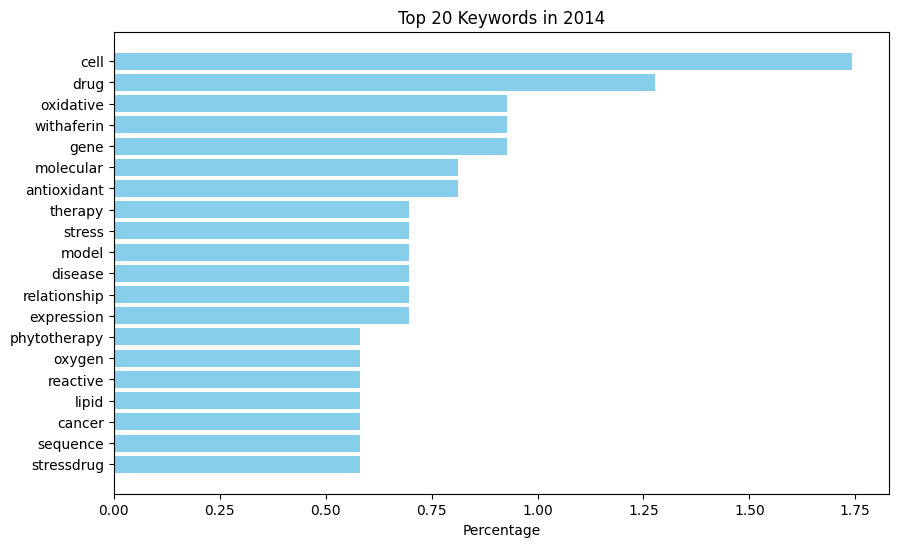


Year: 2015
Most common keywords with counts and percentages:
cell: 14 (1.78%)
withaferin: 10 (1.27%)
withanolides: 10 (1.27%)
gene: 8 (1.02%)
cancer: 7 (0.89%)
line: 6 (0.76%)
tumor: 6 (0.76%)
molecular: 6 (0.76%)
expression: 6 (0.76%)
protein: 6 (0.76%)
stress: 5 (0.63%)
root: 5 (0.63%)
therapy: 5 (0.63%)
model: 5 (0.63%)
culture: 5 (0.63%)
receptor: 5 (0.63%)
docking: 5 (0.63%)
simulation: 5 (0.63%)
oxidative: 5 (0.63%)
apoptosis: 5 (0.63%)
disease: 4 (0.51%)
medicine: 4 (0.51%)
medicinal: 4 (0.51%)
induceddrug: 4 (0.51%)
resistance: 4 (0.51%)
compound: 4 (0.51%)
enzyme: 4 (0.51%)
withaniageneticsmetabolism: 4 (0.51%)
cytochrome: 4 (0.51%)
p450: 4 (0.51%)
drug: 4 (0.51%)
signaling: 3 (0.38%)
pathway: 3 (0.38%)
extractspharmacologytherapeutic: 3 (0.38%)
survivaldrug: 3 (0.38%)
phytotherapy: 3 (0.38%)
toxicity: 3 (0.38%)
acid: 3 (0.38%)
herbal: 3 (0.38%)
withanolidespharmacology: 3 (0.38%)
development: 3 (0.38%)
rna: 3 (0.38%)
sequence: 3 (0.38%)
withanolidesmetabolism: 3 (0.38%)
dyna

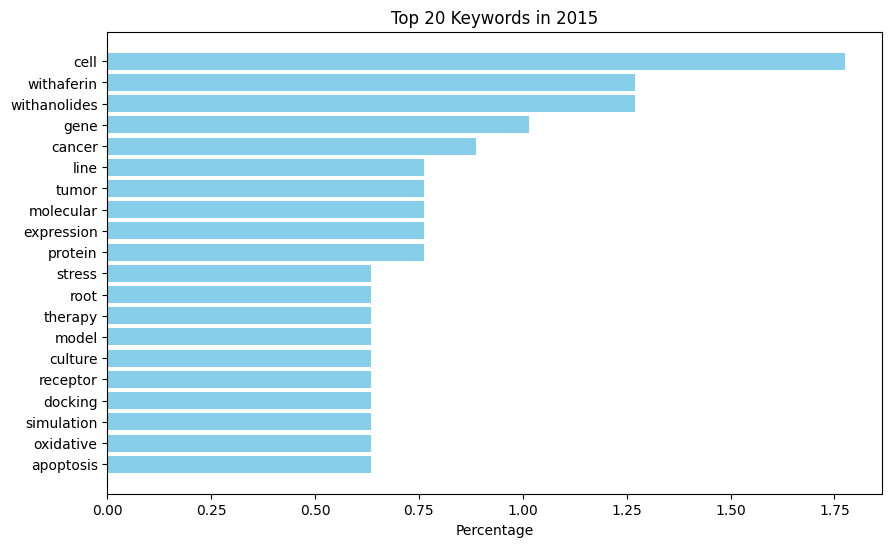


Year: 2016
Most common keywords with counts and percentages:
withaferin: 11 (1.84%)
stress: 8 (1.34%)
cell: 8 (1.34%)
protein: 6 (1.00%)
withanolide: 5 (0.83%)
tumor: 5 (0.83%)
cancer: 4 (0.67%)
neurodegenerative: 4 (0.67%)
liquid: 4 (0.67%)
expression: 4 (0.67%)
acid: 4 (0.67%)
extractspharmacology: 4 (0.67%)
preclinical: 4 (0.67%)
drug: 4 (0.67%)
herbal: 4 (0.67%)
ayurveda: 3 (0.50%)
phytotherapy: 3 (0.50%)
withanolides: 3 (0.50%)
oxidative: 3 (0.50%)
cycle: 3 (0.50%)
apoptosis: 3 (0.50%)
toxicity: 3 (0.50%)
withania: 3 (0.50%)
extractschemistrypharmacology: 3 (0.50%)
lipid: 3 (0.50%)
glutathionemetabolism: 3 (0.50%)
peroxidationdrug: 3 (0.50%)
antioxidant: 3 (0.50%)
ischemia: 3 (0.50%)
regulation: 3 (0.50%)
gene: 3 (0.50%)
disease: 3 (0.50%)
growth: 3 (0.50%)
chromatography: 3 (0.50%)
therapymetabolism: 3 (0.50%)
effectsmetabolism: 3 (0.50%)
rootschemistry: 3 (0.50%)
agentspharmacology: 3 (0.50%)
evaluation: 3 (0.50%)
dosage: 3 (0.50%)
inflammatory: 3 (0.50%)
medicine: 3 (0.50%)
ne

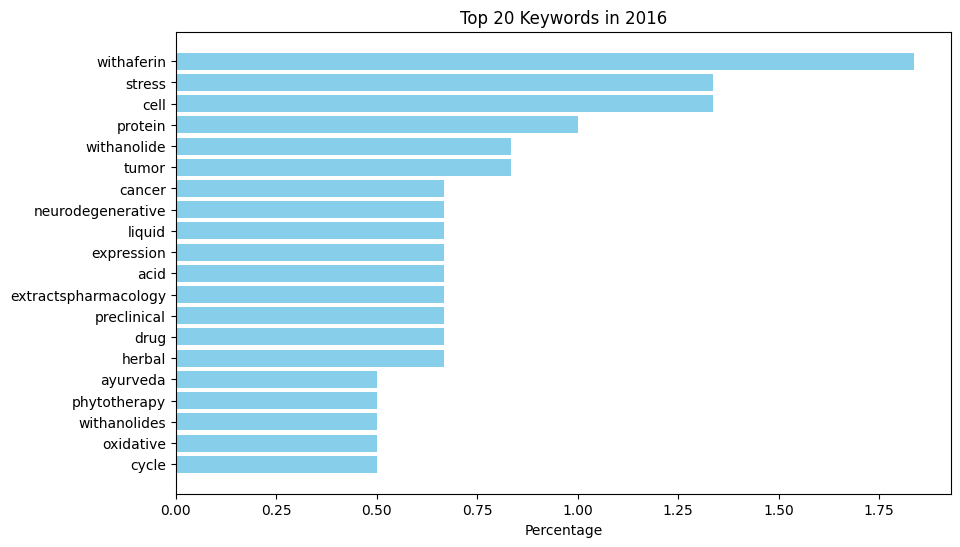


Year: 2017
Most common keywords with counts and percentages:
cell: 12 (1.94%)
withanolides: 8 (1.29%)
apoptosis: 7 (1.13%)
stress: 7 (1.13%)
pathway: 6 (0.97%)
oxidative: 6 (0.97%)
disease: 6 (0.97%)
protein: 6 (0.97%)
gene: 5 (0.81%)
withaferin: 4 (0.65%)
regulation: 4 (0.65%)
oxygen: 4 (0.65%)
reactive: 4 (0.65%)
molecular: 4 (0.65%)
model: 4 (0.65%)
high: 4 (0.65%)
cancer: 4 (0.65%)
metabolite: 3 (0.48%)
culture: 3 (0.48%)
neuroprotection: 3 (0.48%)
sleep: 3 (0.48%)
cytokine: 3 (0.48%)
behavior: 3 (0.48%)
transcription: 3 (0.48%)
nfkappab: 3 (0.48%)
breast: 3 (0.48%)
proliferation: 3 (0.48%)
response: 3 (0.48%)
biosynthetic: 3 (0.48%)
docking: 3 (0.48%)
parkinson: 3 (0.48%)
secondary: 3 (0.48%)
chromatography: 3 (0.48%)
expression: 3 (0.48%)
speciesmetabolism: 3 (0.48%)
electron: 3 (0.48%)
survival: 3 (0.48%)
plasticity: 3 (0.48%)
herbal: 3 (0.48%)
mitochondrial: 3 (0.48%)
tumor: 3 (0.48%)
line: 3 (0.48%)
herb: 3 (0.48%)
cognition: 2 (0.32%)
efficacy: 2 (0.32%)
tissue: 2 (0.32%)
ay

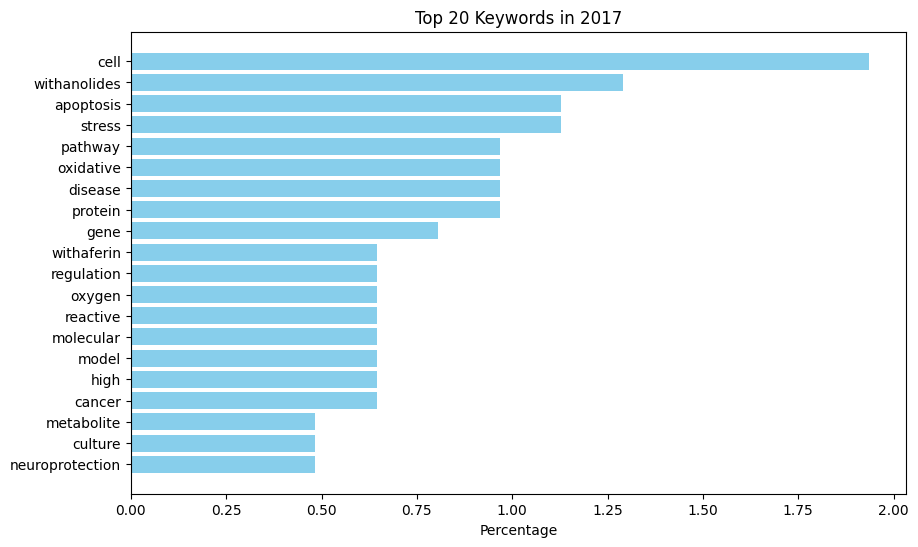


Year: 2018
Most common keywords with counts and percentages:
stress: 11 (2.00%)
oxidative: 8 (1.46%)
withanolide: 7 (1.28%)
withaferin: 7 (1.28%)
cell: 6 (1.09%)
disease: 6 (1.09%)
apoptosis: 5 (0.91%)
binding: 5 (0.91%)
root: 4 (0.73%)
medicine: 4 (0.73%)
regulation: 4 (0.73%)
withanolides: 4 (0.73%)
antioxidant: 4 (0.73%)
study: 4 (0.73%)
male: 3 (0.55%)
infertility: 3 (0.55%)
gene: 3 (0.55%)
docking: 3 (0.55%)
traditional: 3 (0.55%)
biomass: 3 (0.55%)
protein: 3 (0.55%)
drug: 3 (0.55%)
extract: 3 (0.55%)
expression: 3 (0.55%)
pathway: 3 (0.55%)
cancer: 3 (0.55%)
inflammation: 3 (0.55%)
quality: 2 (0.36%)
withania: 2 (0.36%)
somnifera: 2 (0.36%)
lateral: 2 (0.36%)
amyotrophic: 2 (0.36%)
dysfunction: 2 (0.36%)
ischemia: 2 (0.36%)
mitochondrial: 2 (0.36%)
behavior: 2 (0.36%)
endophytic: 2 (0.36%)
receptor: 2 (0.36%)
therapy: 2 (0.36%)
resistance: 2 (0.36%)
beta: 2 (0.36%)
withanone: 2 (0.36%)
pseudomonas: 2 (0.36%)
bacillus: 2 (0.36%)
amyloliquefaciens: 2 (0.36%)
endophytes: 2 (0.36%)

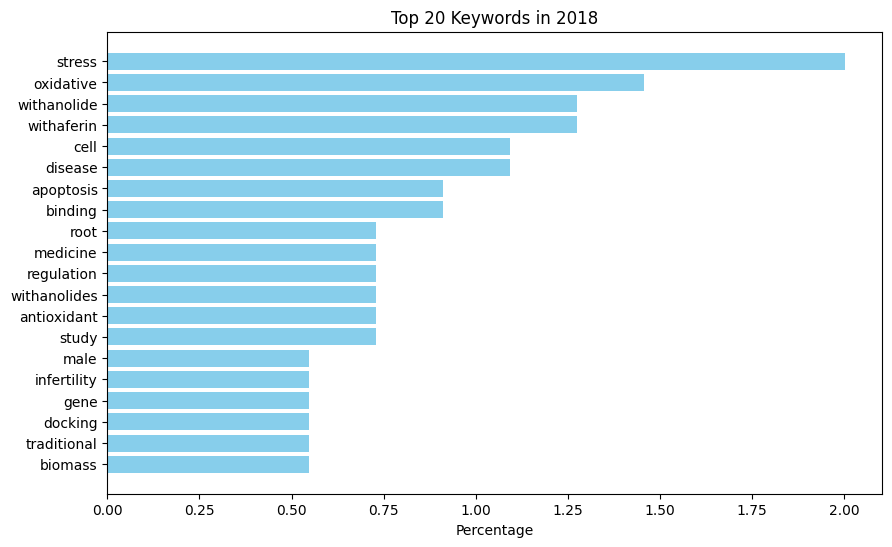


Year: 2019
Most common keywords with counts and percentages:
withaferin: 14 (3.00%)
stress: 9 (1.93%)
oxidative: 7 (1.50%)
molecular: 5 (1.07%)
withanolides: 5 (1.07%)
acid: 5 (1.07%)
cancer: 4 (0.86%)
receptor: 4 (0.86%)
disease: 4 (0.86%)
medicinal: 4 (0.86%)
withania: 3 (0.64%)
somnifera: 3 (0.64%)
endophyte: 3 (0.64%)
drug: 3 (0.64%)
line: 3 (0.64%)
cell: 3 (0.64%)
inflammation: 3 (0.64%)
withanolide: 3 (0.64%)
apoptosis: 3 (0.64%)
rna: 3 (0.64%)
alzheimers: 3 (0.64%)
antioxidant: 3 (0.64%)
anxiety: 3 (0.64%)
herbal: 2 (0.43%)
testosterone: 2 (0.43%)
memory: 2 (0.43%)
penicillium: 2 (0.43%)
tumor: 2 (0.43%)
spectroscopy: 2 (0.43%)
structure: 2 (0.43%)
resonance: 2 (0.43%)
rootschemistry: 2 (0.43%)
agent: 2 (0.43%)
magnetic: 2 (0.43%)
gaba: 2 (0.43%)
inhibitory: 2 (0.43%)
withanolideschemical: 2 (0.43%)
extractspharmacology: 2 (0.43%)
phenolic: 2 (0.43%)
protein: 2 (0.43%)
therapeutic: 2 (0.43%)
oxide: 2 (0.43%)
zinc: 2 (0.43%)
neuroprotection: 2 (0.43%)
reactive: 2 (0.43%)
oxygen:

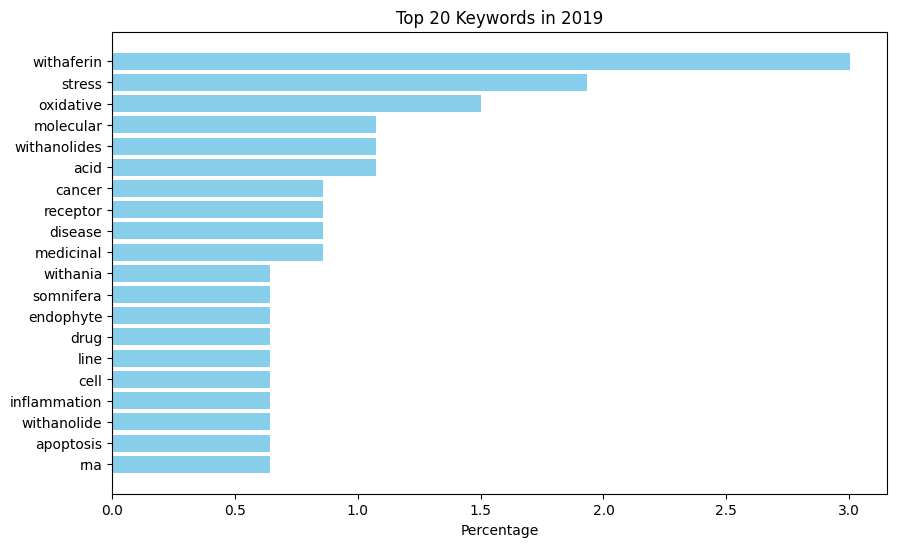


Year: 2020
Most common keywords with counts and percentages:
withaferin: 14 (2.06%)
disease: 10 (1.47%)
stress: 8 (1.18%)
cancer: 7 (1.03%)
cell: 7 (1.03%)
gene: 7 (1.03%)
molecular: 7 (1.03%)
sleep: 6 (0.88%)
withanolides: 5 (0.74%)
analysis: 5 (0.74%)
root: 5 (0.74%)
activity: 5 (0.74%)
expression: 5 (0.74%)
simulation: 5 (0.74%)
withanolide: 5 (0.74%)
extract: 4 (0.59%)
model: 4 (0.59%)
oxidative: 4 (0.59%)
chromatography: 4 (0.59%)
inflammatory: 3 (0.44%)
alzheimers: 3 (0.44%)
parkinson: 3 (0.44%)
withanolidea: 3 (0.44%)
neuroprotection: 3 (0.44%)
rna: 3 (0.44%)
acid: 3 (0.44%)
medicine: 3 (0.44%)
anticancer: 3 (0.44%)
breast: 3 (0.44%)
tumor: 3 (0.44%)
metabolism: 3 (0.44%)
response: 3 (0.44%)
regulation: 3 (0.44%)
pathway: 3 (0.44%)
electron: 3 (0.44%)
microscopy: 3 (0.44%)
proliferation: 3 (0.44%)
scanning: 3 (0.44%)
nanoparticles: 3 (0.44%)
synthesis: 3 (0.44%)
inflammation: 3 (0.44%)
limit: 3 (0.44%)
detection: 3 (0.44%)
dynamic: 3 (0.44%)
ashwagandha: 3 (0.44%)
product: 3 (0

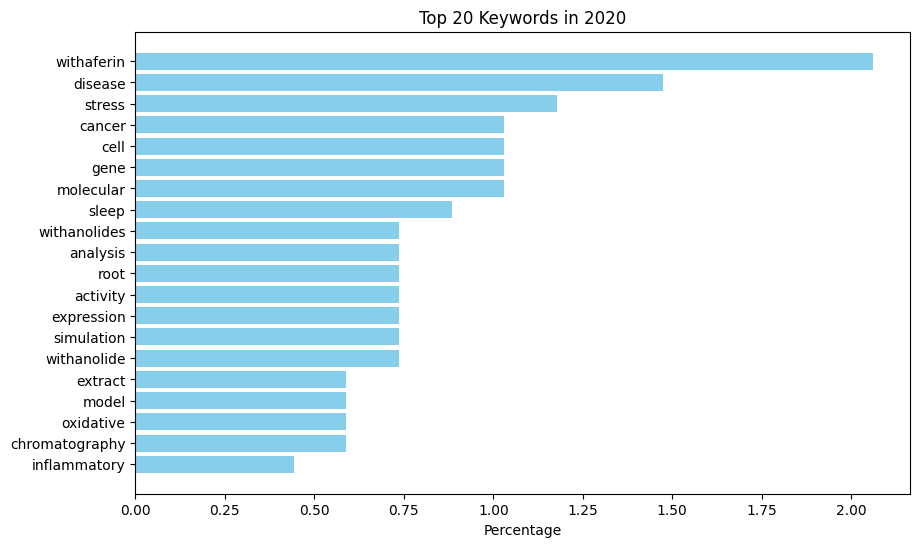


Year: 2021
Most common keywords with counts and percentages:
medicine: 13 (1.35%)
sarscov2: 13 (1.35%)
disease: 12 (1.24%)
protein: 12 (1.24%)
molecular: 11 (1.14%)
covid19: 10 (1.04%)
ayurveda: 9 (0.93%)
withaferin: 9 (0.93%)
phytochemical: 9 (0.93%)
docking: 9 (0.93%)
stress: 8 (0.83%)
cell: 8 (0.83%)
dynamic: 8 (0.83%)
herbal: 8 (0.83%)
cancer: 7 (0.73%)
antiviral: 7 (0.73%)
oxidative: 7 (0.73%)
anxiety: 6 (0.62%)
withanolide: 6 (0.62%)
disorder: 6 (0.62%)
medicinal: 6 (0.62%)
simulation: 6 (0.62%)
antioxidant: 6 (0.62%)
drug: 6 (0.62%)
clinical: 5 (0.52%)
trial: 5 (0.52%)
traditional: 5 (0.52%)
activity: 5 (0.52%)
virus: 5 (0.52%)
sleep: 5 (0.52%)
parkinson: 5 (0.52%)
pathway: 5 (0.52%)
withanone: 5 (0.52%)
md: 5 (0.52%)
acid: 5 (0.52%)
withaferina: 5 (0.52%)
inflammatory: 5 (0.52%)
quality: 5 (0.52%)
coronavirus: 5 (0.52%)
insomnia: 4 (0.41%)
solanaceae: 4 (0.41%)
cytokine: 4 (0.41%)
apoptosis: 4 (0.41%)
breast: 4 (0.41%)
model: 4 (0.41%)
root: 4 (0.41%)
safety: 4 (0.41%)
recepto

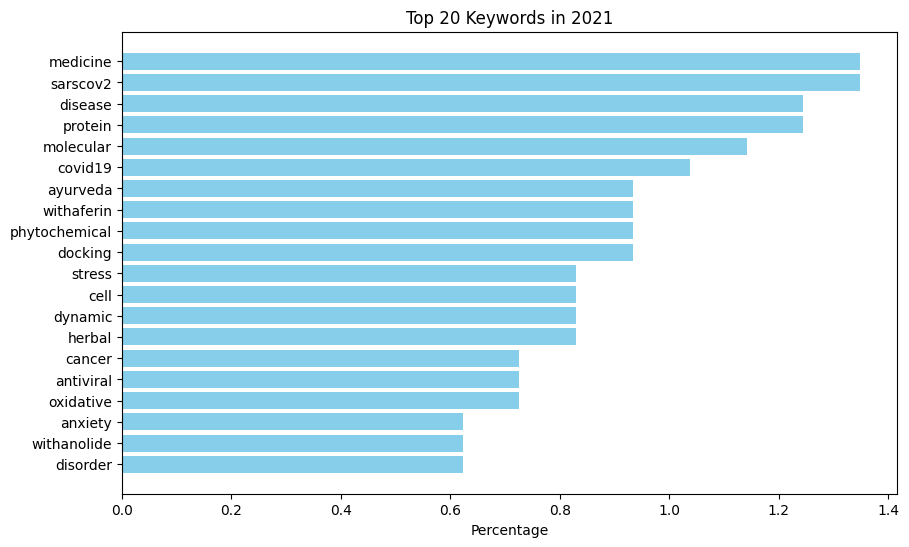


Year: 2022
Most common keywords with counts and percentages:
withanolides: 13 (1.64%)
cancer: 13 (1.64%)
withaferin: 11 (1.39%)
covid19: 11 (1.39%)
withanolide: 11 (1.39%)
medicinal: 11 (1.39%)
molecular: 10 (1.26%)
cell: 10 (1.26%)
medicine: 10 (1.26%)
stress: 9 (1.13%)
disease: 8 (1.01%)
docking: 8 (1.01%)
phytochemical: 8 (1.01%)
activity: 8 (1.01%)
therapy: 7 (0.88%)
sarscov2: 7 (0.88%)
extract: 7 (0.88%)
herb: 7 (0.88%)
antioxidant: 6 (0.76%)
treatment: 6 (0.76%)
simulation: 6 (0.76%)
drug: 6 (0.76%)
ayurveda: 6 (0.76%)
alzheimers: 5 (0.63%)
herbal: 5 (0.63%)
apoptosis: 5 (0.63%)
cognition: 5 (0.63%)
ayurvedic: 5 (0.63%)
oxidative: 5 (0.63%)
nanoparticles: 4 (0.50%)
acid: 4 (0.50%)
sleep: 4 (0.50%)
inflammation: 4 (0.50%)
phytotherapy: 4 (0.50%)
target: 3 (0.38%)
disorder: 3 (0.38%)
viral: 3 (0.38%)
lung: 3 (0.38%)
hplc: 3 (0.38%)
root: 3 (0.38%)
vitro: 3 (0.38%)
dynamic: 3 (0.38%)
ginseng: 3 (0.38%)
dna: 3 (0.38%)
neoplasm: 3 (0.38%)
chromatography: 3 (0.38%)
biological: 3 (0.38

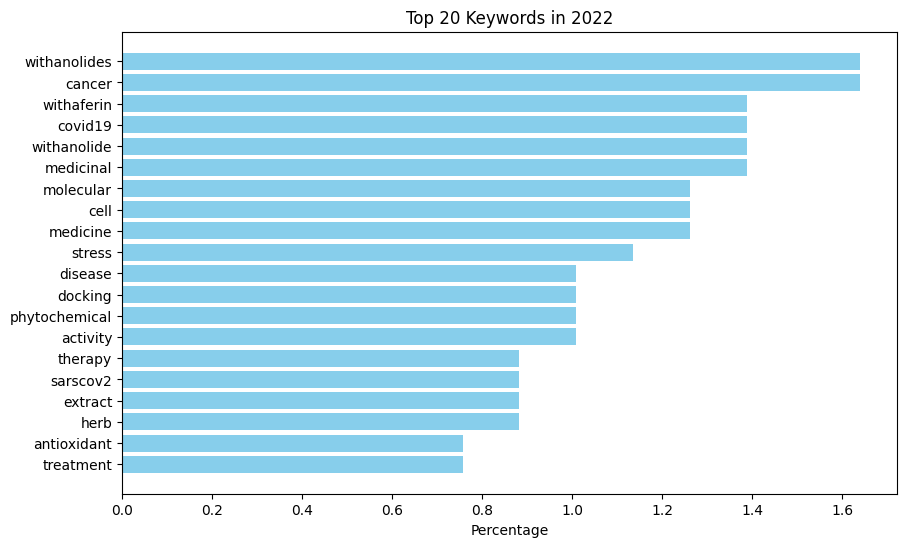


Year: 2023
Most common keywords with counts and percentages:
activity: 13 (1.90%)
molecular: 11 (1.61%)
withaferin: 11 (1.61%)
cancer: 10 (1.46%)
withanolides: 10 (1.46%)
docking: 9 (1.31%)
disease: 8 (1.17%)
withanolide: 7 (1.02%)
compound: 7 (1.02%)
cell: 7 (1.02%)
herbal: 6 (0.88%)
extract: 6 (0.88%)
pharmacological: 6 (0.88%)
inflammation: 6 (0.88%)
simulation: 6 (0.88%)
dynamic: 6 (0.88%)
antioxidant: 6 (0.88%)
medicine: 5 (0.73%)
receptor: 5 (0.73%)
drug: 5 (0.73%)
natural: 5 (0.73%)
covid19: 5 (0.73%)
sarscov2: 5 (0.73%)
model: 5 (0.73%)
phytochemical: 5 (0.73%)
stress: 5 (0.73%)
memory: 5 (0.73%)
inflammatory: 4 (0.58%)
apoptosis: 4 (0.58%)
toxicity: 4 (0.58%)
ayurveda: 4 (0.58%)
protein: 4 (0.58%)
alkaloid: 4 (0.58%)
alzheimers: 4 (0.58%)
therapy: 4 (0.58%)
supplement: 3 (0.44%)
phytochemistry: 3 (0.44%)
neuroprotection: 3 (0.44%)
ftir: 3 (0.44%)
carbon: 3 (0.44%)
medicinal: 3 (0.44%)
md: 3 (0.44%)
tuberculosis: 3 (0.44%)
flavonoid: 3 (0.44%)
total: 3 (0.44%)
parkinson: 3 (0.

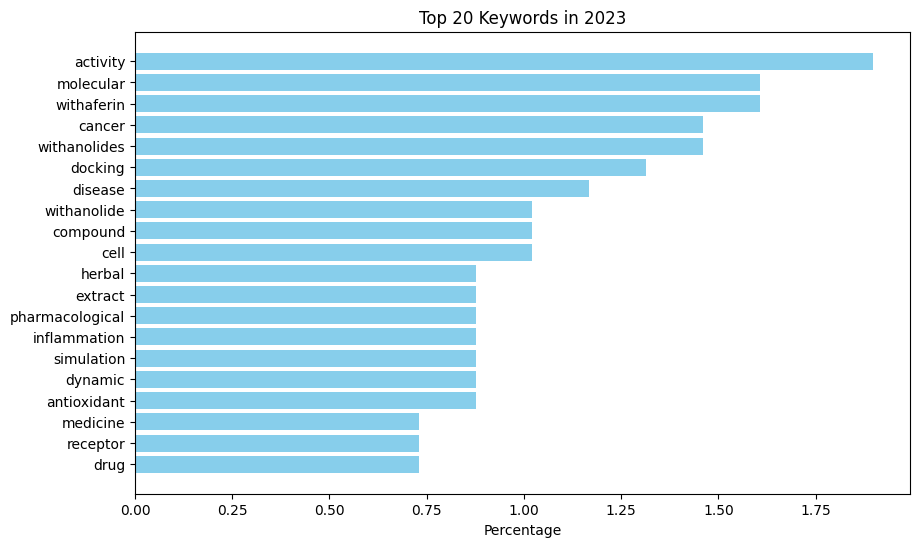


Year: 2024
Most common keywords with counts and percentages:
withaferin: 11 (2.08%)
cancer: 11 (2.08%)
withanolides: 9 (1.70%)
stress: 9 (1.70%)
disease: 8 (1.51%)
clinical: 8 (1.51%)
medicine: 8 (1.51%)
inflammation: 7 (1.32%)
extract: 7 (1.32%)
trial: 6 (1.13%)
herbal: 6 (1.13%)
medicinal: 6 (1.13%)
therapy: 5 (0.95%)
supplement: 4 (0.76%)
dysfunction: 4 (0.76%)
oxidative: 4 (0.76%)
function: 4 (0.76%)
treatment: 4 (0.76%)
withania: 4 (0.76%)
root: 4 (0.76%)
ayurveda: 4 (0.76%)
safety: 3 (0.57%)
somnifera: 3 (0.57%)
breast: 3 (0.57%)
activity: 3 (0.57%)
expression: 3 (0.57%)
gene: 3 (0.57%)
molecular: 3 (0.57%)
vitro: 3 (0.57%)
botanical: 3 (0.57%)
phytochemical: 3 (0.57%)
anxiety: 3 (0.57%)
drug: 3 (0.57%)
natural: 3 (0.57%)
rheumatoid: 3 (0.57%)
arthritis: 3 (0.57%)
traditional: 3 (0.57%)
network: 3 (0.57%)
ethiopia: 3 (0.57%)
alzheimers: 2 (0.38%)
al: 2 (0.38%)
parkinson: 2 (0.38%)
dietary: 2 (0.38%)
extractstherapeutic: 2 (0.38%)
testosterone: 2 (0.38%)
apoptosis: 2 (0.38%)
with

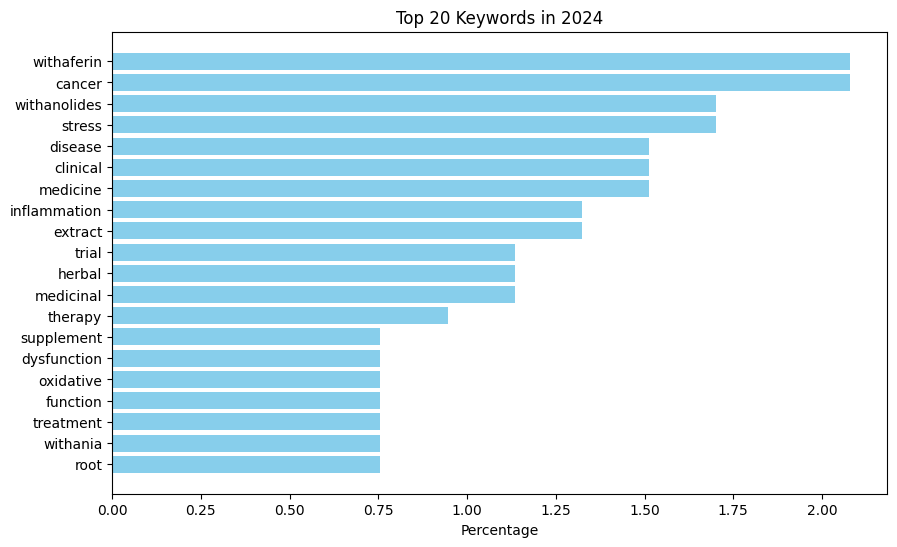

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Define a function to split and clean keywords
def split_and_clean_keywords(keywords):
    return [kw.strip() for kw in keywords.split(', ') if kw.strip()]

# Filter DataFrame for years since 1950
df_filtered = df[df['Date of Publication'] >= 1950]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Process each group
for year, group in grouped_by_year:
    keyword_counts = Counter()
    unique_keywords = set()
    total_keyword_count = 0

    for keywords in group['Lem Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)
            # Add filtered keywords to the set of unique keywords
            unique_keywords.update(filtered_keywords)
            # Update total keyword count
            total_keyword_count += len(filtered_keywords)

    print(f"\nYear: {year}")
    print("Most common keywords with counts and percentages:")
    for keyword, count in keyword_counts.most_common():
        percentage = (count / total_keyword_count) * 100
        print(f"{keyword}: {count} ({percentage:.2f}%)")

    unique_keyword_count = len(unique_keywords)
    print(f"Number of unique keywords: {unique_keyword_count}")

    # Visualization
    top_keywords = keyword_counts.most_common(20)
    keywords, counts = zip(*top_keywords)
    percentages = [count / total_keyword_count * 100 for count in counts]

    plt.figure(figsize=(10, 6))
    plt.barh(keywords, percentages, color='skyblue')
    plt.xlabel('Percentage')
    plt.title(f'Top 20 Keywords in {year}')
    plt.gca().invert_yaxis()
    plt.show()

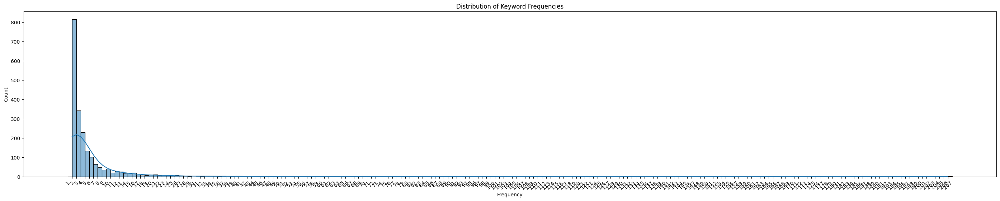

In [ ]:
import seaborn as sns

# Display the most common keywords and their counts
keyword_counts = Counter()
for keywords in df['Lem Keywords']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

# Convert keyword counts to a DataFrame
keyword_counts_df = pd.DataFrame(keyword_counts.items(), columns=['Lem Keywords', 'Frequency'])

# Plot the distribution of keyword frequencies
plt.figure(figsize=(35, 6))
sns.histplot(keyword_counts_df['Frequency'], bins=range(1, max(keyword_counts_df['Frequency']) + 2), kde=True)

# Customize x-axis
plt.xticks(range(1, max(keyword_counts_df['Frequency']) + 1), rotation=45)

# Add titles and labels
plt.title('Distribution of Keyword Frequencies')
plt.xlabel('Frequency')
plt.ylabel('Count')

# Show plot
plt.show()

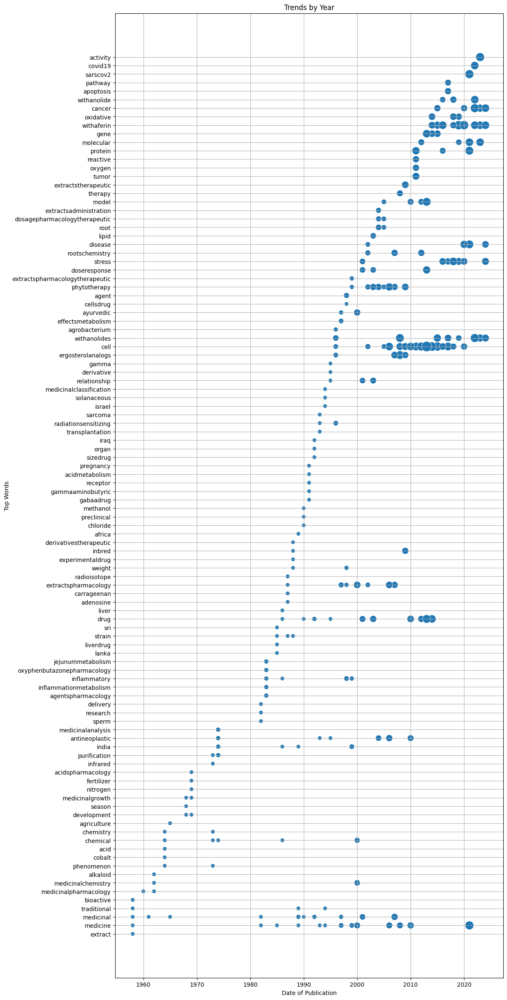

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Initialize lists to store data for plotting
plot_data = []

# Iterate over each year and process the keywords
for year in df['Date of Publication'].unique():
    # Filter rows for the current year
    year_data = df[df['Date of Publication'] == year]

    # Concatenate all keywords into a single string
    all_keywords = ', '.join(year_data['Lem Keywords'])

    # Split into words using ', ' and count frequency
    words = all_keywords.split(', ')
    word_counts = Counter(words)

    # Get the top 5 words
    top_words = word_counts.most_common(5)

    # Prepare data for each top word
    for word, count in top_words:
        plot_data.append({'Date of Publication': year, 'Word': word, 'Frequency': count})

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Find the first appearance year of each word
word_first_appearance = plot_df.groupby('Word')['Date of Publication'].min().reset_index()
word_first_appearance = word_first_appearance.sort_values(by='Date of Publication', ascending=False)
word_order = word_first_appearance['Word'].tolist()

# Convert the 'Word' column to a categorical type with the custom order
plot_df['Word'] = pd.Categorical(plot_df['Word'], categories=word_order, ordered=True)

# Plot using Seaborn
plt.figure(figsize=(12, 30))
sns.scatterplot(data=plot_df, x='Date of Publication', y='Word', size='Frequency', sizes=(50, 300), legend=None)

plt.title('Trends by Year')
plt.xlabel('Date of Publication')
plt.ylabel('Top Words')
plt.grid(True)
plt.show()

Number of unique keywords in the plot: 92


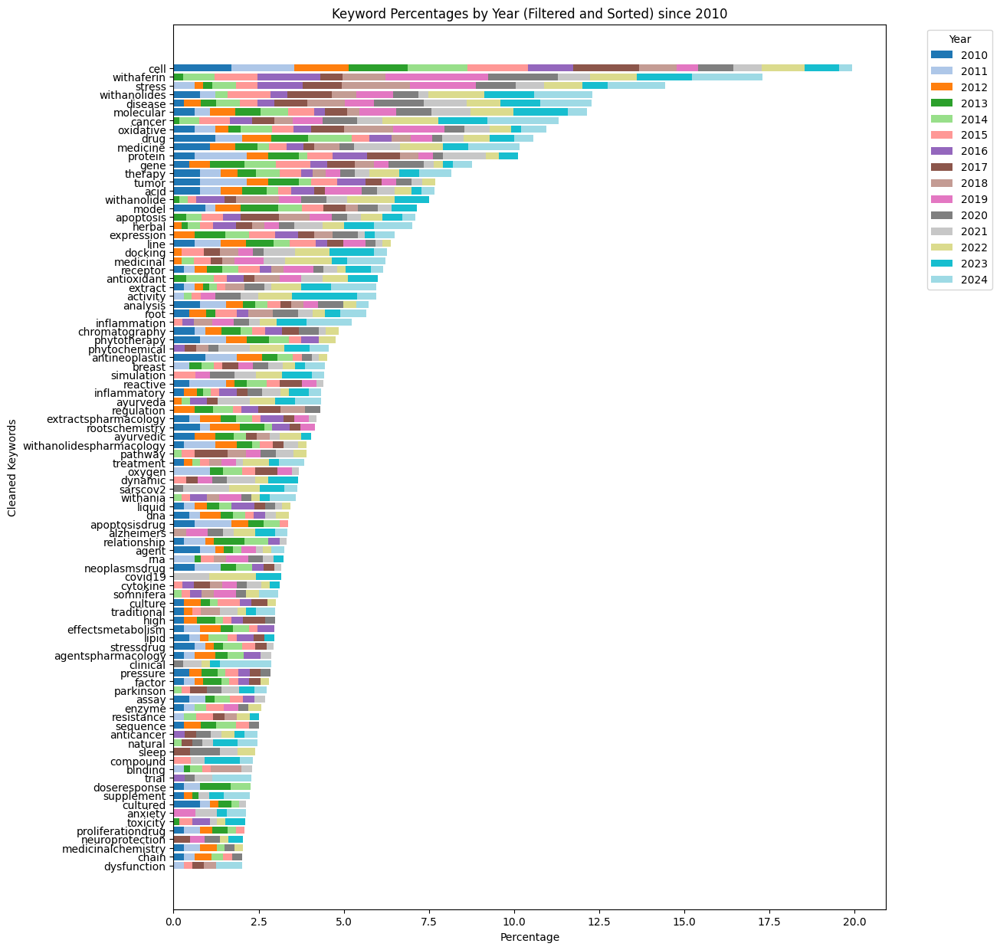

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

# Define a function to split and clean keywords
def split_and_clean_keywords(keywords):
    return [kw.strip() for kw in keywords.split(', ') if kw.strip()]

# Filter DataFrame for years since 2010
df_filtered = df[df['Date of Publication'] >= 2010]

# Group by year
grouped_by_year = df_filtered.groupby('Date of Publication')

# Dictionary to hold keyword counts per year
keyword_counts_per_year = {}

# Process each group
for year, group in grouped_by_year:
    keyword_counts = Counter()
    total_keyword_count = 0

    for keywords in group['Lem Keywords']:
        if isinstance(keywords, str):
            # Split and clean keywords
            filtered_keywords = split_and_clean_keywords(keywords)
            # Update counter with filtered keywords
            keyword_counts.update(filtered_keywords)
            # Update total keyword count
            total_keyword_count += len(filtered_keywords)

    # Calculate percentages
    keyword_percentages = {kw: (count / total_keyword_count) * 100 for kw, count in keyword_counts.items() if count > 1}
    keyword_counts_per_year[year] = keyword_percentages

# Collect all keywords and filter those with a total percentage over 2%
all_keywords = set(kw for year_data in keyword_counts_per_year.values() for kw in year_data)
keyword_sums = {kw: sum(keyword_counts_per_year.get(year, {}).get(kw, 0) for year in keyword_counts_per_year) for kw in all_keywords}
filtered_keywords = {kw: pct for kw, pct in keyword_sums.items() if pct > 2}

# Create a DataFrame for plotting
filtered_plot_data = pd.DataFrame(
    {year: {kw: pct for kw, pct in keyword_counts_per_year.get(year, {}).items() if kw in filtered_keywords}
     for year in keyword_counts_per_year}
)
filtered_plot_data = filtered_plot_data.fillna(0)

# Sort by the total percentage of each keyword
sorted_keywords = sorted(filtered_keywords, key=lambda kw: keyword_sums[kw], reverse=True)
filtered_plot_data = filtered_plot_data.loc[sorted_keywords]

# Print the number of unique keywords
print(f"Number of unique keywords in the plot: {len(filtered_plot_data)}")

# Plotting
fig, ax = plt.subplots(figsize=(12, 15))

# Stack bars by years
bottom = pd.Series([0] * len(filtered_plot_data), index=filtered_plot_data.index)
cmap = plt.get_cmap('tab20', len(filtered_plot_data.columns))  # Use colormap with enough colors

for i, year in enumerate(filtered_plot_data.columns):
    ax.barh(filtered_plot_data.index, filtered_plot_data[year], left=bottom, color=cmap(i / len(filtered_plot_data.columns)), label=year)
    bottom += filtered_plot_data[year]

ax.set_xlabel('Percentage')
ax.set_ylabel('Cleaned Keywords')
ax.set_title('Keyword Percentages by Year (Filtered and Sorted) since 2010')
ax.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gca().invert_yaxis()
plt.show()

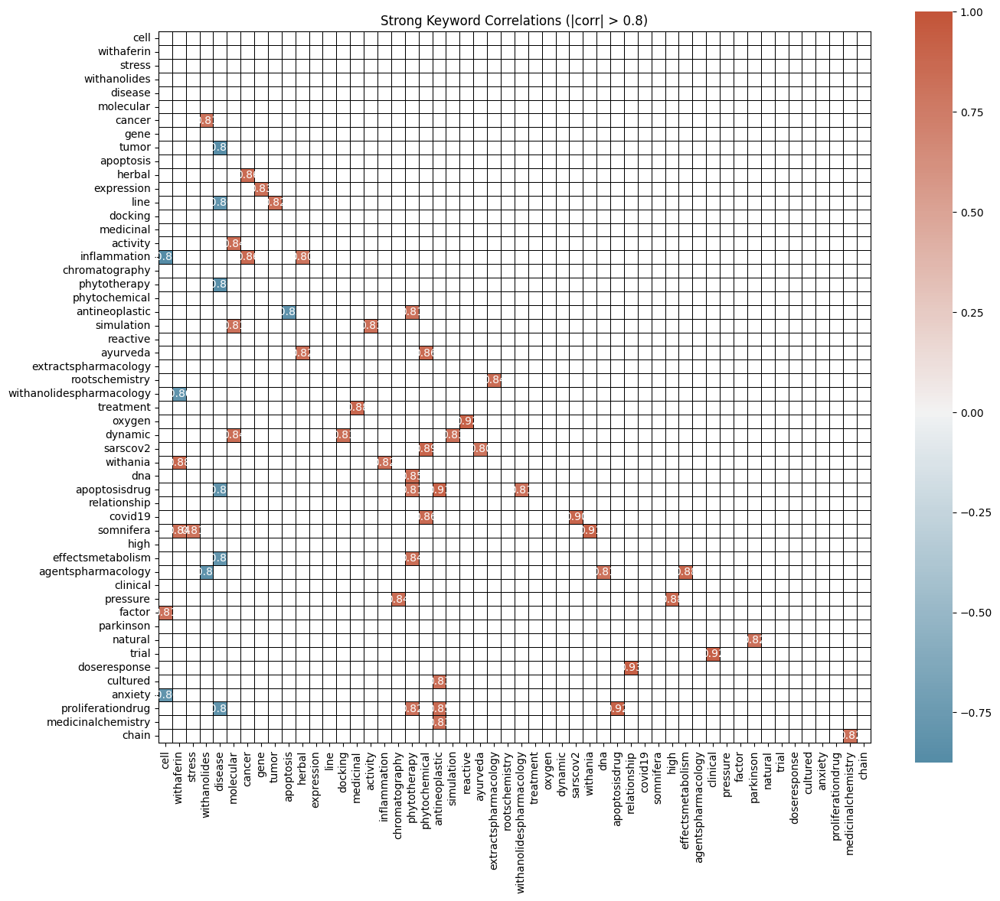

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = filtered_plot_data.T.corr()

# Filter correlations with absolute value greater than 0.8
strong_correlations = correlation_matrix[(correlation_matrix.abs() > 0.8) & (correlation_matrix.abs() != 1)]

# Drop rows and columns with all NaN values (no strong correlations)
strong_correlations = strong_correlations.dropna(how='all').dropna(axis=1, how='all')

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(strong_correlations, dtype=bool))

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 17))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio, adding grid lines
sns.heatmap(strong_correlations, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .75}, annot=True, fmt=".2f", linecolor='black', linestyle='-', ax=ax)

# Add grid lines
for _, spine in ax.spines.items():
    spine.set_visible(True)

plt.title("Strong Keyword Correlations (|corr| > 0.8)")
plt.show()

In [ ]:
#save df to excel
df.to_excel('df.xlsx', index=False)


In [ ]:
# Initialize a set to store unique keywords
unique_keywords = set()

# Iterate through each cleaned keyword entry in the DataFrame and add to set
for keywords in df['Lem Keywords']:
    if isinstance(keywords, str):
        unique_keywords.update(keywords.split(', '))

# Count the total number of unique keywords
total_unique_keywords = len(unique_keywords)

print(f"Total unique lem keywords after deleting all words that appeared only once: {total_unique_keywords}")
print(unique_keywords)

Total unique lem keywords after deleting all words that appeared only once: 2104
{'fusarium', 'lipopolysaccharidespharmacology', 'eleutherococcus', 'atrophy', 'stroke', 'relationship', 'parasitic', 'phosphatesmetabolism', 'microsatellite', 'acidsmetabolism', 'transform', 'balbc', 'ps', 'transduction', 'partitioning', 'productivity', 'metalloproteinase', 'withanolideschemical', 'lp', 'locomotiondrug', 'kidney', 'food', 'ovarian', 'airway', 'acidanalysis', 'ashwagandha', 'intracellular', 'toxicity', 'admet', 'liver', 'bmetabolism', 'nucleus', 'pancreatic', 'techniquesmethods', 'nfe2related', 'shootsgrowth', 'antioxidantspharmacology', 'dunal', 'adrenergic', 'mucosadrug', 'elegans', 'factor', 'melaninsmetabolism', 'cyclooxygenase2', 'excitotoxicity', 'pollution', 'dendritic', 'amyotrophic', 'formaldehyde', 'osteoporosisdrug', 'neoplastic', 'mammary', 'hormoneblood', 'foliar', 'proteinsmetabolism', 'female', 'factorsadministration', 'chlorophyllmetabolism', 'polyadpribose', 'transferasemet

## TF-IDF

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Initialize NLTK components
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Define additional stopwords
additional_stopwords = {'abbreviation', 'abdominal', 'aberrant', 'aberration', 'abeta'}
stop_words = stop_words.union(additional_stopwords)
words_to_remove = [
    'ashwagandha', 'withania', 'somnifera', 'winter', 'cherry',
    'indian', 'ginseng', 'poison', 'gooseberry', 'ajagandha', 'kanaje', 'hindi',
    'amukkara', 'amukkirag', 'asgandh', 'asan', 'avarada', 'hirimaddhi',
    'sogade-beru', 'sundakkot', 'ushvagandha', 'vajigandha', 'vajigandhaka',
    'withania', 'angara', 'asana', 'nagori',
    'asuvargandha', 'withaniasomnifera',
    'l', 'ws', 'w', 'withaniachemistry', 'dunal', 'using', 'use', 'used', 'p', 'plant', 'plants', 'high', 'ii', 'two', 'b', 'th', 'md', 'ro', 'effect',
    'potential', 'cell', 'extract', 'effects', 'related', 'aspect', 'narrative', 'comprehensive', 'reported', 'herb', 'herbal', 'systematic', 'current',
    'future', 'prospect', 'understnding', 'really', 'role', 'towards', 'progress', 'modern', 'possible', 'system', 'update', 'free', 'option', 'cid',
    'editorial', 'various', 'insight', 'prospective', 'u', 'us', 'aa', 'promissing', 'available', 'via', 'p', 'ps', 'behind', 'editing', 'novel', 'topic',
    'year', 'years', 'popular', 'changes', 'addiction', 'product', 'products', 'insights', 'computational', 'assessment', 'putative', 'near', 'development',
    'irrigant', 'advance', 'recent', 'advancements', 'significance', 'count', 'c', 'light', 'low', 'htp', 'mean', 'ex', 'six', 'e', 'wild', 'day', 'narrative'
]

# Function to clean and process keywords for each row
def clean_keywords(row):
    text = ' '.join([str(row['Lem Keywords']), str(row['Title'])])
    # text = ' '.join([str(row['Lem Keywords'])])
    if text.strip() == '':
        return None

    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Convert to lowercase
    text = text.lower()
    # Tokenize
    tokens = word_tokenize(text)
    # Remove numbers from words
    tokens = [''.join([char for char in token if char.isalpha()]) for token in tokens]
    # Remove stopwords and specific words
    tokens = [word for word in tokens if word.isalpha() and word not in stop_words and word not in words_to_remove]  #and word not in words_to_remove
    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmas = [lemmatizer.lemmatize(token) for token in tokens if token]  # Filter out empty tokens
    # Remove duplicates
    lemmas_unique = list(set(lemmas))
    # Join lemmatized tokens back into a string
    return ', '.join(lemmas_unique) if lemmas_unique else None

# Assuming df is already defined and has 'Lem Keywords' and 'Abstract' columns
df['Cleaned Text'] = df.apply(clean_keywords, axis=1).fillna('')


# Initialize an empty list to store the lemmas
lemmas_list = []
for index, row in df.iterrows():
    text = row['Cleaned Text']
    if text:  # Check if 'Cleaned Text' is not empty
        lemmas = text.split(', ')
        lemmas_list.append(lemmas)

# Flatten the list of lists into a single list
all_lemmas_unique = set([lemma for sublist in lemmas_list for lemma in sublist])
print(len(all_lemmas_unique)) # Print the total number of unique lemmas

df.head()

4707


,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords,Lem Keywords,Cluster,Cleaned Text
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article,"anxiety, depression, insomnia, stress","stress, anxiety, depression, insomnia",14,"stress, insomnia, anxiety, neuropsychiatric, d..."
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article,"ethnobotany, pharmacology, phytochemistry, tox...","toxicology, pharmacology, phytochemistry, ethn...",11,"review, biomedicinal, toxicological, pharmacot..."
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article,"inflammatory activity, anticancer activity, an...","herbal, inflammatory, medicine, anticancer, ex...",22,"inflammatory, review, medicine, somniferacurre..."
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article,"alzheimer's disease, arthritic, bacterial, can...","stress, inflammatory, alzheimers, diabetic, ar...",25,"stress, inflammatory, alzheimers, diabetic, ar..."
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article,"alzheimer diseasedrug therapypathology, medici...","diseasesdrug, neurodegenerative, neuroprotecti...",25,"neurodegenerative, medicine, ayurvedic, diseas..."


In [ ]:
df

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords,Lem Keywords,Cluster,Cleaned Text
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article,"anxiety, depression, insomnia, stress","stress, anxiety, depression, insomnia",14,"stress, insomnia, anxiety, neuropsychiatric, d..."
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article,"ethnobotany, pharmacology, phytochemistry, tox...","toxicology, pharmacology, phytochemistry, ethn...",11,"review, biomedicinal, toxicological, pharmacot..."
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article,"inflammatory activity, anticancer activity, an...","herbal, inflammatory, medicine, anticancer, ex...",22,"inflammatory, review, medicine, somniferacurre..."
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article,"alzheimer's disease, arthritic, bacterial, can...","stress, inflammatory, alzheimers, diabetic, ar...",25,"stress, inflammatory, alzheimers, diabetic, ar..."
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article,"alzheimer diseasedrug therapypathology, medici...","diseasesdrug, neurodegenerative, neuroprotecti...",25,"neurodegenerative, medicine, ayurvedic, diseas..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1394,Withania somnifera,38260297,https://pubmed.ncbi.nlm.nih.gov/38260297,Preprint,Research square,2024,Nutraceuticals and phytoceuticals in the treat...,BACKGROUND: Sub-optimal response in schizophre...,"Nutraceuticals, Network Meta-Analysis, Nutriti...",United States,Preprint,"nutraceuticals, network metaanalysis, nutritio...","network, review, nutritional, metaanalysis, nu...",20,"network, phytoceuticals, review, schizophrenia..."
1395,Withania somnifera,35378276,https://pubmed.ncbi.nlm.nih.gov/35378276,"Journal Article, Meta-Analysis, Research Suppo...",Pharmacological research,2022,Medicinal herbs for the treatment of anxiety: ...,BACKGROUND: Anxiety disorder is a common psych...,"Acceptability, Anxiety, Efficacy, Medicinal He...",Netherlands,Journal Article,"acceptability, anxiety, efficacy, medicinal he...","efficacy, network, medicinal, herb, anxiety, m...",25,"efficacy, network, medicinal, herb, review, an..."
1396,Withania somnifera,20528765,https://pubmed.ncbi.nlm.nih.gov/20528765,"Journal Article, Research Support, Non-U.S. Go...",Central nervous system agents in medicinal che...,2010,Scientific basis for the use of Indian ayurved...,"Ayurveda is a Sanskrit word, which means ""the ...","Animals, Brain Chemistrydrug Effects, Humans, ...",United Arab Emirates,Journal Article,"brain chemistrydrug effe

In [ ]:
# Display the most common keywords and their counts after filtering
keyword_counts = Counter()
for keywords in df['Cleaned Text']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

# Filter out keywords that appear only once
filtered_keywords = {kw for kw, count in keyword_counts.items() if count > 1}

# Function to filter out keywords that appear only once
def filter_single_occurrence_keywords(keywords):
    if isinstance(keywords, str):
        return ', '.join([kw for kw in keywords.split(', ') if kw in filtered_keywords])
    return None

# Update the 'Lem Keywords' column with only keywords that appear more than once
df['Cleaned Text'] = df['Cleaned Text'].apply(filter_single_occurrence_keywords)

# Remove empty values from 'Lem Keywords'
df['Cleaned Text'] = df['Cleaned Text'].replace('', None)

# Display the most common keywords and their counts after filtering
keyword_counts = Counter()
for keywords in df['Cleaned Text']:
    if isinstance(keywords, str):
        keyword_counts.update(keywords.split(', '))

print("Most common keywords after filtering:")
for keyword, count in keyword_counts.most_common(3000):
    print(f"{keyword}: {count}")

# Find the amount of unique values after filtering
unique_keywords = set(keyword_counts.keys())
unique_keyword_count = len(unique_keywords)
print(f"Number of unique keywords after filtering: {unique_keyword_count}")

Most common keywords after filtering:
withaferin: 205
root: 203
withanolides: 170
activity: 166
drug: 161
stress: 147
disease: 147
medicinal: 147
molecular: 143
medicine: 139
cancer: 136
study: 128
model: 123
therapy: 118
protein: 117
withanolide: 114
rat: 113
phytotherapy: 107
cell: 95
oxidative: 94
gene: 94
tumor: 92
extractspharmacology: 92
analysis: 90
ayurvedic: 89
vitro: 87
mouse: 87
line: 85
agent: 81
expression: 81
induced: 77
apoptosis: 77
treatment: 76
human: 75
rootschemistry: 74
extract: 74
antioxidant: 72
acid: 71
leaf: 69
evaluation: 68
antineoplastic: 67
inflammatory: 65
pathway: 64
relationship: 63
chromatography: 63
receptor: 62
phytochemical: 62
review: 56
traditional: 56
ergosterolanalogs: 56
docking: 55
growth: 53
inbred: 53
compound: 52
doseresponse: 52
inhibitor: 51
production: 51
agentspharmacology: 51
lipid: 49
liquid: 49
inhibition: 49
efficacy: 48
randomized: 48
natural: 48
factor: 48
formulation: 48
trial: 47
inflammation: 47
india: 47
breast: 46
enzyme: 45
r

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Initialize NLTK components
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Initialize TF-IDF vectorizer with adjusted parameters
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=len(all_lemmas_unique), stop_words=list(stop_words))

# Fit and transform the cleaned text data to create the TF-IDF matrix
# tfidf_matrix = tfidf_vectorizer.fit_transform(df['Cleaned Text'].fillna(''))

X = vectorizer.fit_transform(df['Cleaned Text'].fillna(''))

For n_clusters = 2, the average silhouette_score is : 0.004724554079071581
For n_clusters = 3, the average silhouette_score is : 0.005327975392286534
For n_clusters = 4, the average silhouette_score is : 0.006723345787873355
For n_clusters = 5, the average silhouette_score is : 0.00836286775854428
For n_clusters = 6, the average silhouette_score is : 0.008802320231702078
For n_clusters = 7, the average silhouette_score is : 0.009244861799346854
For n_clusters = 8, the average silhouette_score is : 0.010768035071989377
For n_clusters = 9, the average silhouette_score is : 0.011138145414581547
For n_clusters = 10, the average silhouette_score is : 0.011302927287326469
For n_clusters = 11, the average silhouette_score is : 0.011795432842316284
For n_clusters = 12, the average silhouette_score is : 0.011573047989717054
For n_clusters = 13, the average silhouette_score is : 0.01213705182559955
For n_clusters = 14, the average silhouette_score is : 0.012567044493460187
For n_clusters = 15, t

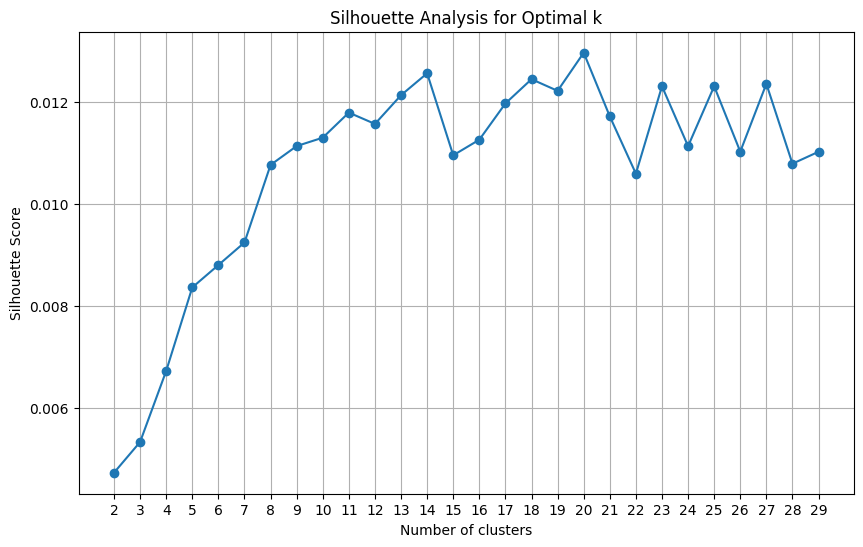

In [ ]:
# import pandas as pd
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# import matplotlib.pyplot as plt


# Define range of clusters for Silhouette Analysis
range_n_clusters = range(2, 30)  # Adjust the range as needed

# List to store silhouette scores
silhouette_scores = []

# Perform Silhouette Analysis for each number of clusters
for n_clusters in range_n_clusters:
    # Initialize KMeans clustering with n_clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)  # Set n_init explicitly
    cluster_labels = kmeans.fit_predict(X)

    # Calculate silhouette score
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg}")

# Plotting the Silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for Optimal k')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()


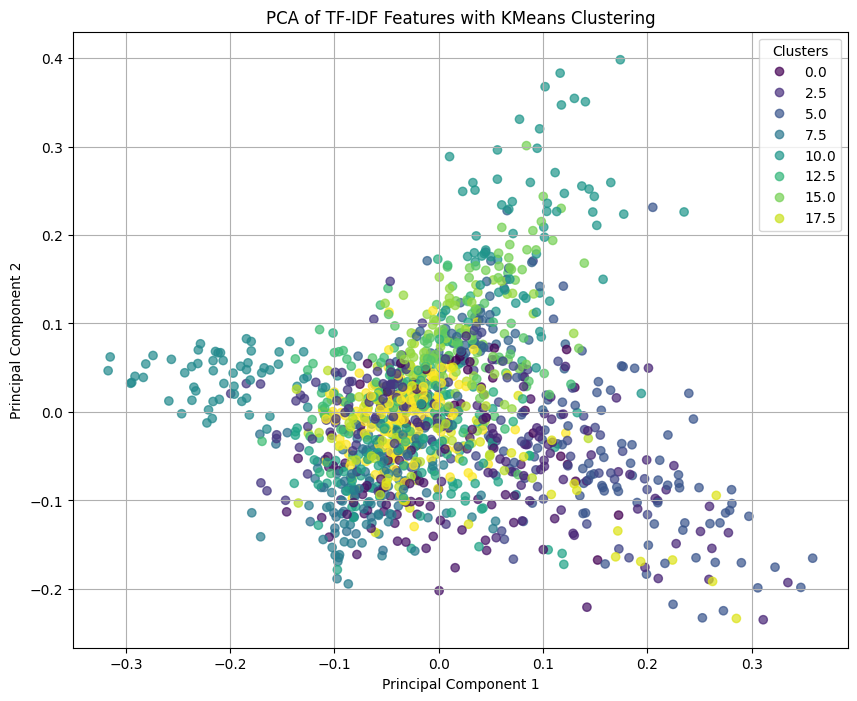


Cluster 0
transcription, seed, yield, transcriptional, pharmacokinetics, neoplasm, withaferina, germination, factor, growth

Cluster 1
agent, ayurvedic, extractstherapeutic, adjuvant, mouse, balb, drug, therapy, phytotherapy, inbred

Cluster 2
kinase, inhibitor, line, withanolidespharmacology, pathway, tumor, cell, protein, signaling, withaferin

Cluster 3
phytochemical, phytotherapy, india, herb, treatment, review, activity, medicine, traditional, medicinal

Cluster 4
proliferationdrug, derivativespharmacology, medicinalchemistry, molecular, purificationpharmacology, line, structure, tumor, ergosterolanalogs, withanolides

Cluster 5
therapeutic, inhibits, target, human, anticancer, cell, apoptosis, withaferin, breast, cancer

Cluster 6
metabolism, biosynthetic, expression, pathway, gene, withanolides, withanolide, biosynthesis, secondary, metabolite

Cluster 7
induced, dosagepharmacology, drug, administration, oral, wistar, extractsadministration, toxicity, root, rat

Cluster 8
induc

In [ ]:
# Perform KMeans clustering
num_clusters = 20
km = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
km.fit(X)

# Add cluster labels to the DataFrame
df['Cluster'] = km.labels_

# Reduce dimensionality using PCA for visualization
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X.toarray())

# Create a DataFrame with principal components and cluster labels
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Cluster'] = df['Cluster']

# Plot PCA results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Cluster'], cmap='viridis', alpha=0.7)
plt.title('PCA of TF-IDF Features with KMeans Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.grid(True)  # Add grid lines for clarity
plt.show()

# Function to print top keywords for each cluster
def get_top_keywords(data, clusters, vectorizer, n_terms):
    terms = vectorizer.get_feature_names_out()
    df = pd.DataFrame(data.todense()).groupby(clusters).mean()
    for i, r in df.iterrows():
        print(f'\nCluster {i}')
        print(', '.join([terms[t] for t in np.argsort(r)[-n_terms:]]))

# Print top keywords for each cluster
get_top_keywords(X, km.labels_, vectorizer, 10)

In [ ]:
# Define a dictionary mapping cluster labels to new names
cluster_names = {
    0: "Transcription Factors and Growth Studies",
    1: "Ayurvedic Agents and Therapeutic Drugs",
    2: "Kinase Inhibitors and Tumor Pathways",
    3: "Traditional Medicine and Herbal Treatments",
    4: "Medicinal Chemistry and Tumor Proliferation",
    5: "Anticancer Therapeutics and Apoptosis",
    6: "Biosynthesis and Metabolism of Withanolides",
    7: "Dosage and Toxicity of Herbal Drugs",
    8: "Oxidative Stress and Phytotherapy Models",
    9: "Clinical Trials and Safety Assessments",
    10: "Molecular Docking and COVID-19 Inhibitors",
    11: "Inflammation and Antioxidant Effects",
    12: "Antimicrobial Activity and Nanoparticles",
    13: "Ayurvedic Medicine and Clinical Management",
    14: "Withanolide Production and Tissue Cultures",
    15: "Gene Expression and Molecular Cloning",
    16: "Spectrometry Techniques and Extract Chemistry",
    17: "Neuroprotective Effects and Cognitive Disorders",
    18: "Hepatocellular Carcinoma and Reactive Oxygen Species",
    19: "Dietary Supplements and Chemical Evaluations"
}

# Rename clusters based on the dictionary
df['Cluster'] = df['Cluster'].map(cluster_names)

In [ ]:
# # Drop the 'Cleaned Text' column
# df.drop(columns=['Cleaned Text'], inplace=True)

In [ ]:
df.head(20)

,Name,PubMed ID,Link,Type Publication,Journal Title,Date of Publication,Title,Abstract,Keywords,Place Publication,Type Publication Standardized,Cleaned Keywords,Lem Keywords,Cluster,Cleaned Text
0,Withania somnifera,34254920,https://pubmed.ncbi.nlm.nih.gov/34254920,"Journal Article, Review",Current neuropharmacology,2021,Effects of Withania somnifera (Ashwagandha) on...,"BACKGROUND: Withania somnifera (WS), also know...","Anxiety, Ashwagandha, Withania Somnifera, Depr...",United Arab Emirates,Journal Article,"anxiety, depression, insomnia, stress","stress, anxiety, depression, insomnia",Inflammation and Antioxidant Effects,"stress, insomnia, anxiety, disorder, depression"
1,Withania somnifera,34649336,https://pubmed.ncbi.nlm.nih.gov/34649336,"Journal Article, Review",Biomedicine & pharmacotherapy = Biomedecine & ...,2021,Withania somnifera (L.) Dunal (Ashwagandha): A...,Withania somnifera (L.) Dunal (Solanaceae) has...,"Ashwagandha, Ethnobotany, Pharmacology, Phytoc...",France,Journal Article,"ethnobotany, pharmacology, phytochemistry, tox...","toxicology, pharmacology, phytochemistry, ethn...",Traditional Medicine and Herbal Treatments,"review, toxicological, toxicology, pharmacolog..."
2,Withania somnifera,37111543,https://pubmed.ncbi.nlm.nih.gov/37111543,"Journal Article, Review",Pharmaceutics,2023,Ashwagandha (Withania somnifera)-Current Resea...,"In recent years, there has been a significant ...","Ashwagandha, Withania Somnifera, Anti-Inflamma...",Switzerland,Journal Article,"inflammatory activity, anticancer activity, an...","herbal, inflammatory, medicine, anticancer, ex...",Traditional Medicine and Herbal Treatments,"inflammatory, review, medicine, anticancer, ac..."
3,Withania somnifera,26306935,https://pubmed.ncbi.nlm.nih.gov/26306935,"Journal Article, Research Support, Non-U.S. Go...",Cellular and molecular life sciences : CMLS,2015,"Pharmacologic overview of Withania somnifera, ...","Withania somnifera, also called 'Indian ginsen...","Alzheimer's Disease, Anti-Arthritic, Anti-Bact...",Switzerland,Journal Article,"alzheimer's disease, arthritic, bacterial, can...","stress, inflammatory, alzheimers, diabetic, ar...",Neuroprotective Effects and Cognitive Disorders,"stress, inflammatory, alzheimers, diabetic, ar..."
4,Withania somnifera,24882401,https://pubmed.ncbi.nlm.nih.gov/24882401,"Journal Article, Research Support, Non-U.S. Go...",Biological & pharmaceutical bulletin,2014,Effects of Ashwagandha (roots of Withania somn...,Neurodegenerative diseases commonly induce irr...,"Alzheimer Diseasedrug Therapypathology, Humans...",Japan,Journal Article,"alzheimer diseasedrug therapypathology, medici...","diseasesdrug, neurodegenerative, neuroprotecti...",Neuroprotective Effects and Cognitive Disorders,"neurodegenerative, medicine, ayurvedic, diseas..."
5,Withania somnifera,25405876,https://pubmed.ncbi.nlm.nih.gov/25405876,"Journal Article, Research Support, U.S. Gov't,...",Journal of alternative and complementary medic...,2014,An alternative treatment for anxiety: a system...,OBJECTIVE: To assess existing reported human t...,"Anxietydrug Therapy, Anxiety Disordersdrug The...",United States,Journal Article,"anxietydrug therapy, anxiety disordersdrug the...","extractspharmacologytherapeutic, disordersdrug...",Traditional Medicine and Herbal Treatments,"extractspharmacologytherapeutic, disordersdrug..."
6,Withania somnifera,28471731,https://pubmed.ncbi.nlm.nih.gov/28471731,"Journal Article, Randomized Controlled Trial",Journal of dietary supplements,2017,Efficacy and Safety of Ashwagandha (Withania s...,OBJECTIVES: Cognitive decline is often associa...,"Withania Somnifera (L) Dunal, Ashwagandha, Cog...",England,Journal Article,"cognition, efficacy, memory, safety","cognition, efficacy, safety, memory",Clinical Trials and Safety Assessments,"safety, efficacy, cognitive, function, root, m..."
7,Withania somnifera,22754076,https://pubmed.ncbi.nlm.nih.gov/22754076,"Journal Article, Review","African journal of traditional, complem

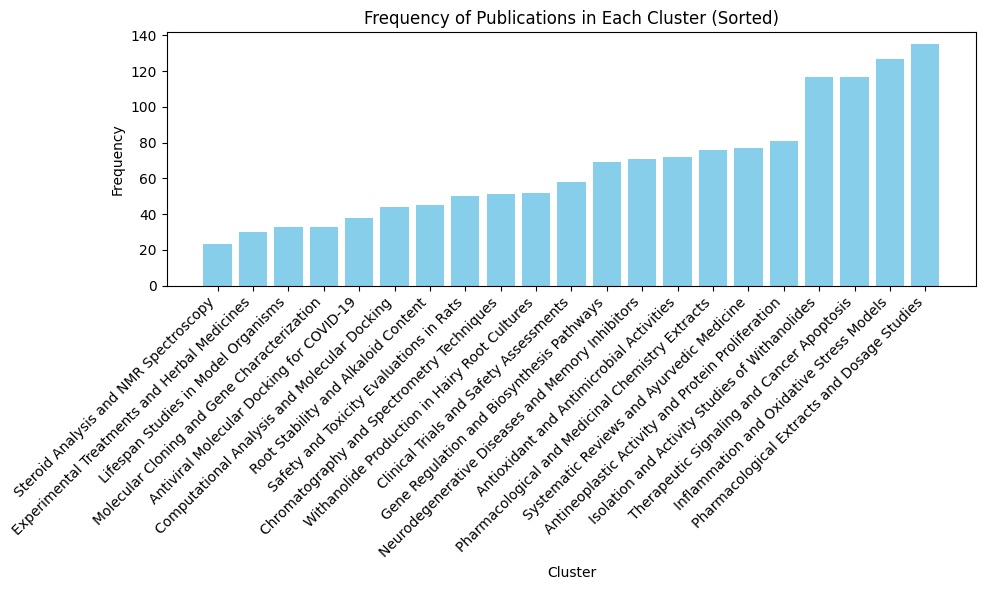

In [ ]:
# Calculate cluster frequencies
cluster_counts = df['Cluster'].value_counts()

# Sort clusters by frequency
cluster_counts_sorted = cluster_counts.sort_values()

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(cluster_counts_sorted.index.astype(str), cluster_counts_sorted.values, color='skyblue')

# Adding labels and title
plt.xlabel('Cluster')
plt.ylabel('Frequency')
plt.title('Frequency of Publications in Each Cluster (Sorted)')

# Show plot
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

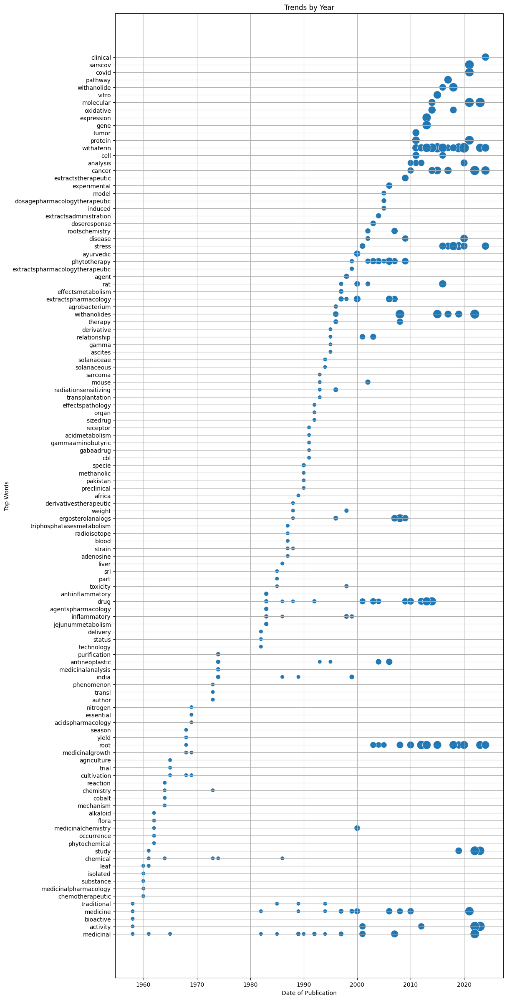

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Initialize lists to store data for plotting
plot_data = []

# Iterate over each year and process the keywords
for year in df['Date of Publication'].unique():
    # Filter rows for the current year
    year_data = df[df['Date of Publication'] == year]

    # Concatenate all keywords into a single string
    all_keywords = ', '.join(year_data['Cleaned Text'])

    # Split into words using ', ' and count frequency
    words = all_keywords.split(', ')
    word_counts = Counter(words)

    # Get the top 5 words
    top_words = word_counts.most_common(5)

    # Prepare data for each top word
    for word, count in top_words:
        plot_data.append({'Date of Publication': year, 'Word': word, 'Frequency': count})

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Find the first appearance year of each word
word_first_appearance = plot_df.groupby('Word')['Date of Publication'].min().reset_index()
word_first_appearance = word_first_appearance.sort_values(by='Date of Publication', ascending=False)
word_order = word_first_appearance['Word'].tolist()

# Convert the 'Word' column to a categorical type with the custom order
plot_df['Word'] = pd.Categorical(plot_df['Word'], categories=word_order, ordered=True)

# Plot using Seaborn
plt.figure(figsize=(12, 30))
sns.scatterplot(data=plot_df, x='Date of Publication', y='Word', size='Frequency', sizes=(50, 300), legend=None)

plt.title('Trends by Year')
plt.xlabel('Date of Publication')
plt.ylabel('Top Words')
plt.grid(True)
plt.show()


In [ ]:
#save df in excel
df.to_excel('df_keywords.xlsx', index=False)